This is a test run to see how well we can make elf images with a discriminator, basing them off of what we've done previously

In [1]:
# example of defining the discriminator model
import tensorflow as tf
from keras.models import Sequential
from keras.optimizers import Adam
from keras.layers import Dense
from keras.layers import Conv2D
from keras.layers import Flatten
from keras.layers import Dropout
from keras.layers import LeakyReLU
from keras.utils.vis_utils import plot_model
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import cv2 as cv
import numpy as np
import os
import psutil
import gc

2022-09-30 13:31:34.118780: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
def Make_Consistent_Size(image, dimensions=[8, 8]):
    '''
    Very simple function
    '''
    
    return cv.resize(image, dimensions)


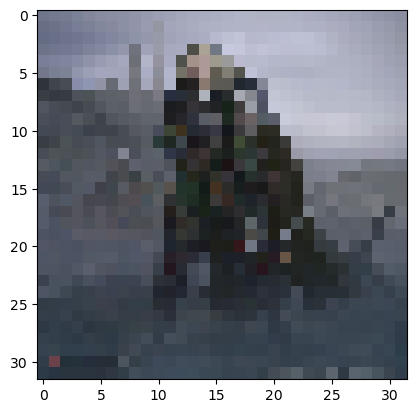

221
File saved successfully


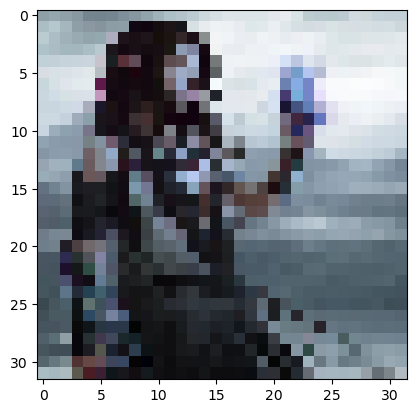

254
File saved successfully


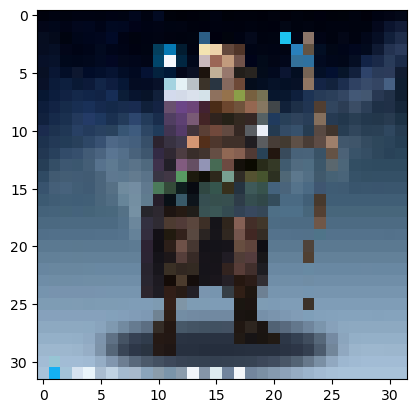

253
File saved successfully


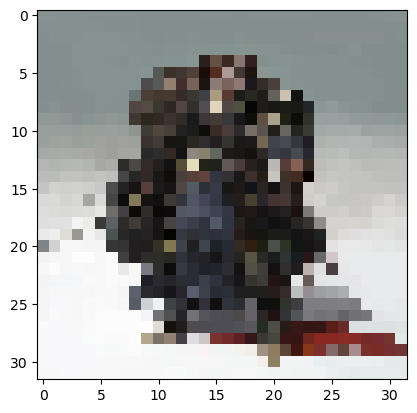

255
File saved successfully


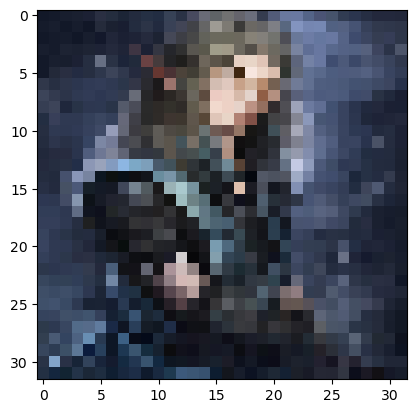

247
File saved successfully


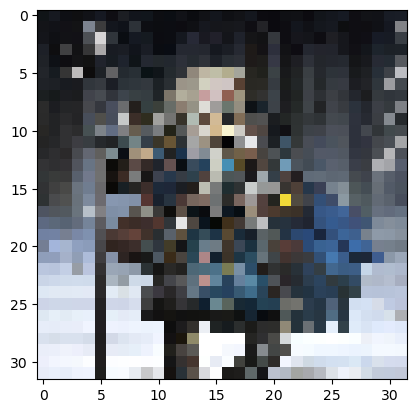

255
File saved successfully


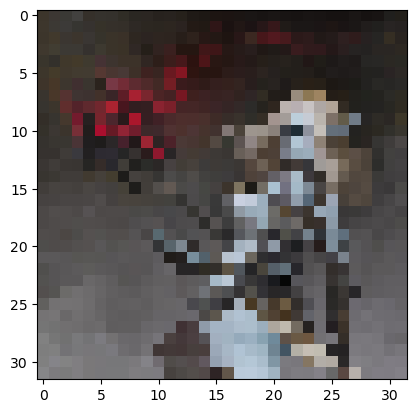

224
File saved successfully


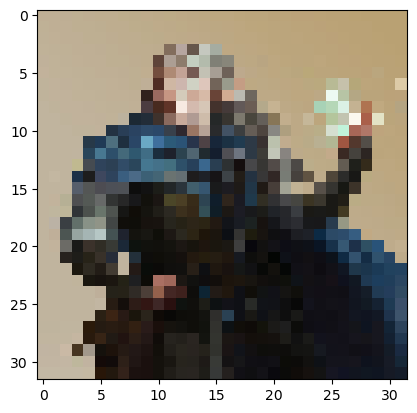

251
File saved successfully


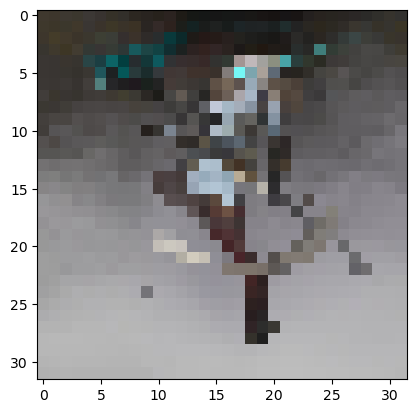

247
File saved successfully


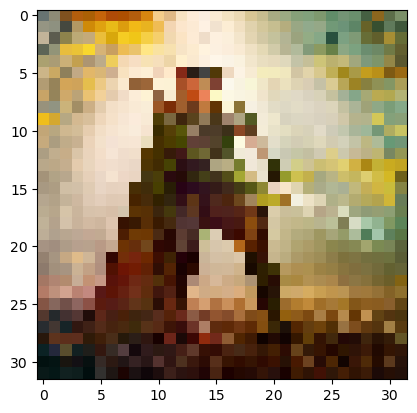

255
File saved successfully


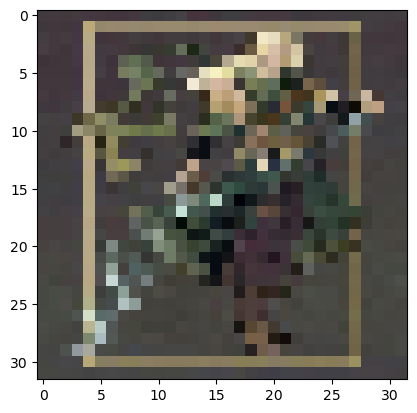

245
File saved successfully


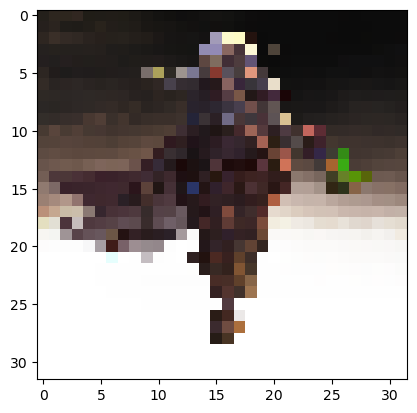

1.0
File saved successfully


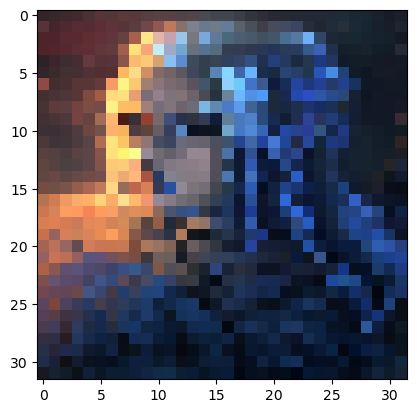

255
File saved successfully


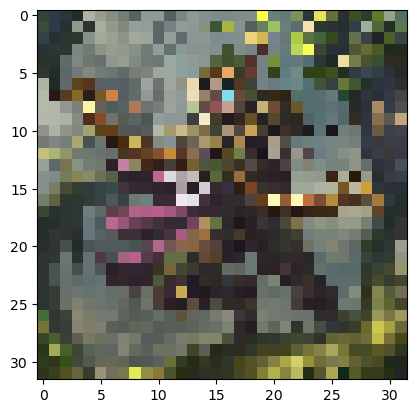

254
File saved successfully


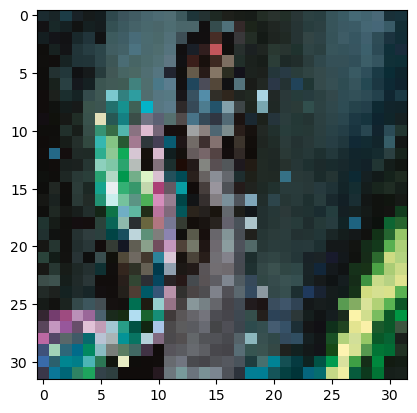

254
File saved successfully


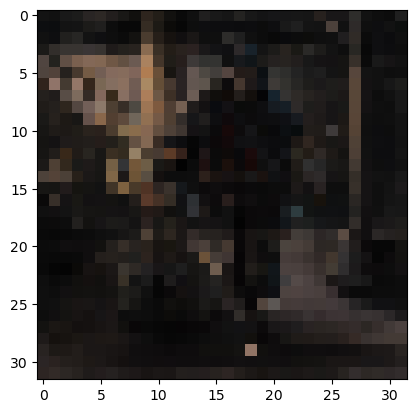

176
File saved successfully


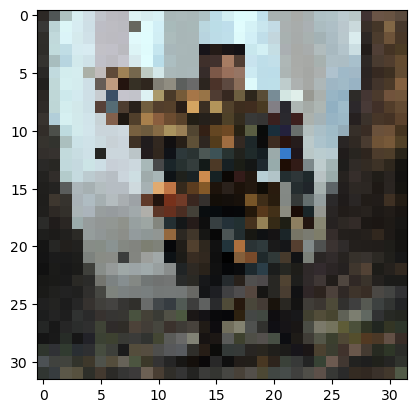

254
File saved successfully


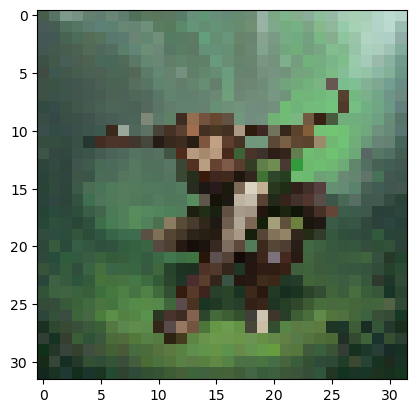

220
File saved successfully


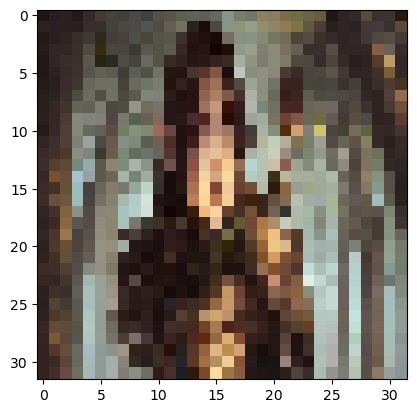

253
File saved successfully


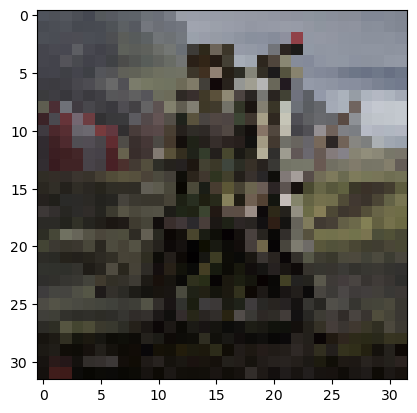

208
File saved successfully


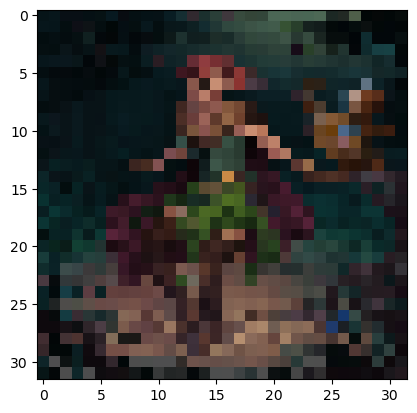

202
File saved successfully


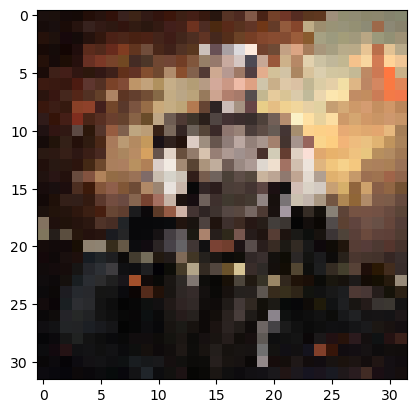

255
File saved successfully


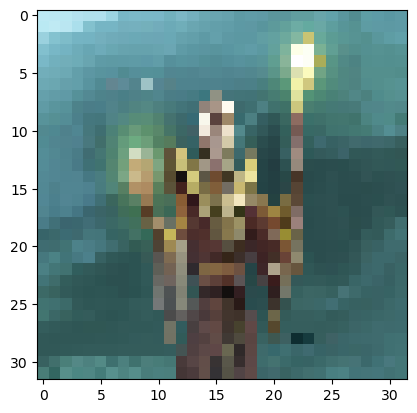

255
File saved successfully


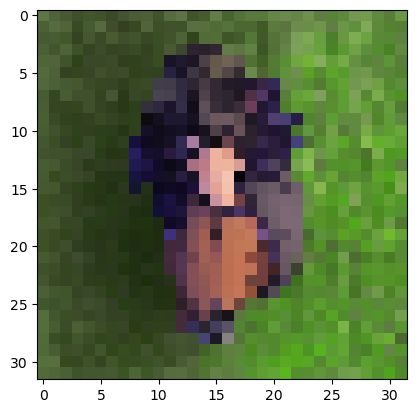

1.0
File saved successfully


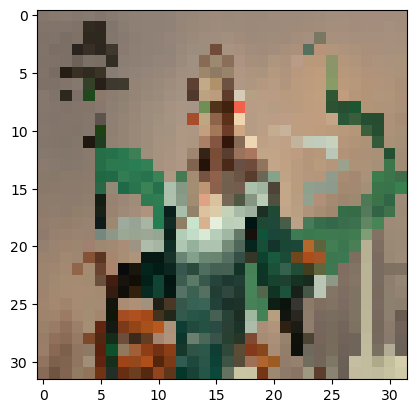

243
File saved successfully


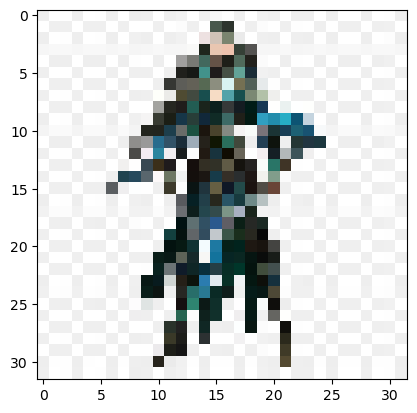

255
File saved successfully


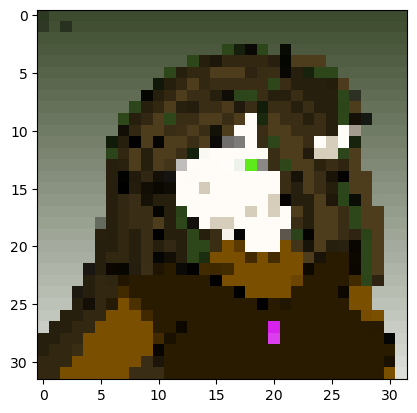

1.0
File saved successfully


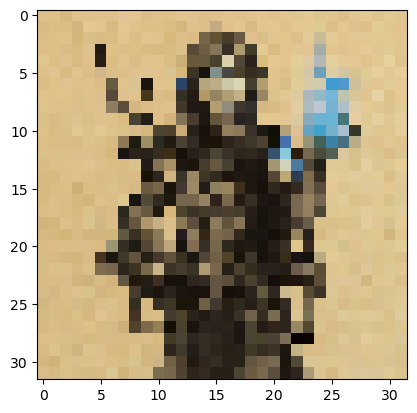

232
File saved successfully


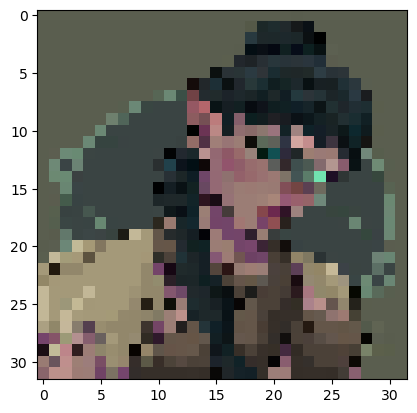

227
File saved successfully


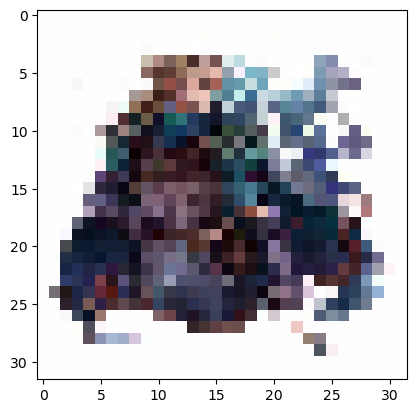

255
File saved successfully


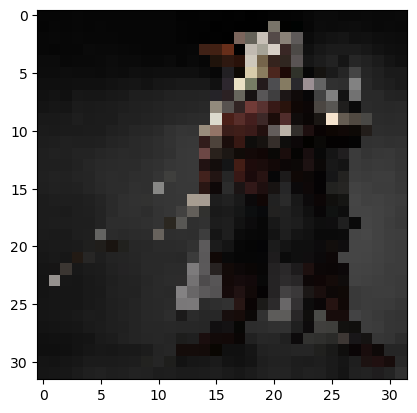

1.0
File saved successfully


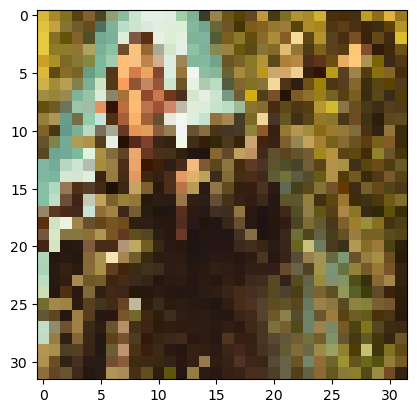

255
File saved successfully


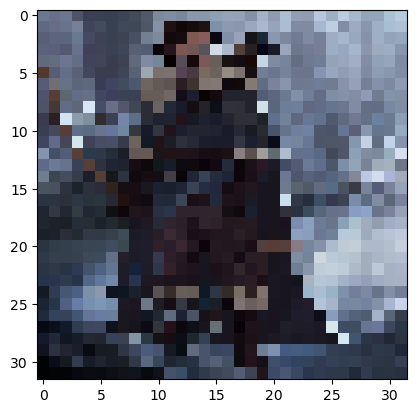

246
File saved successfully


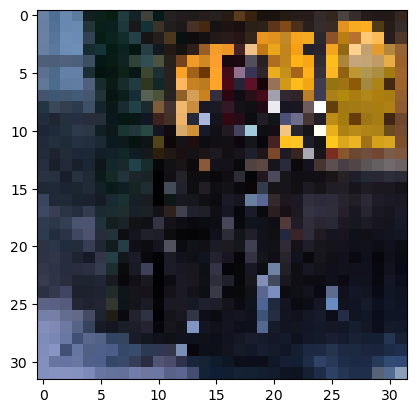

255
File saved successfully


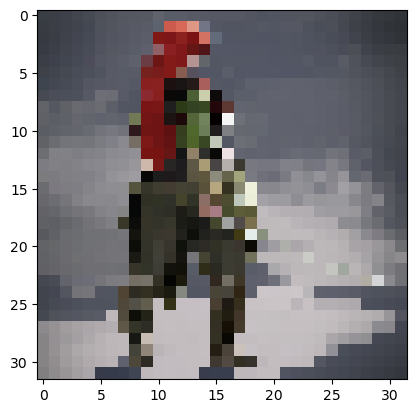

244
File saved successfully


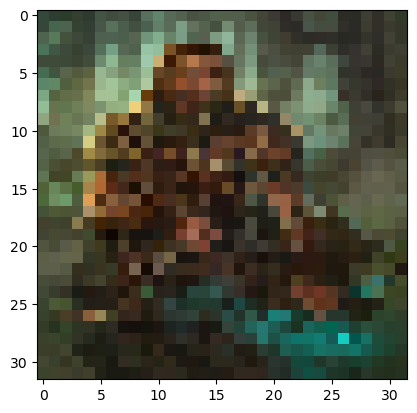

239
File saved successfully


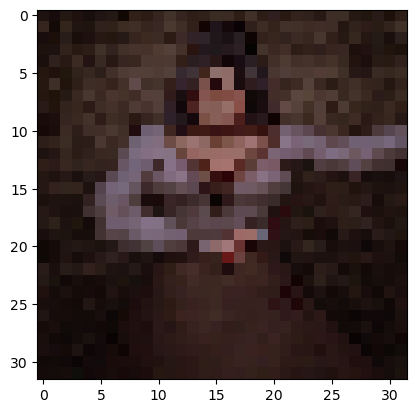

166
File saved successfully


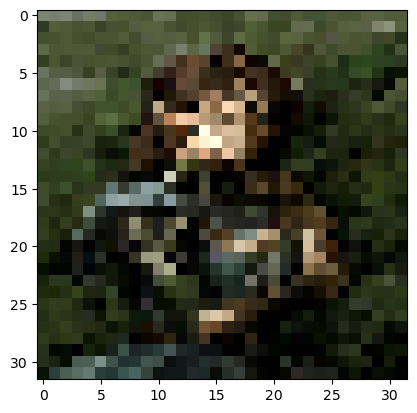

255
File saved successfully


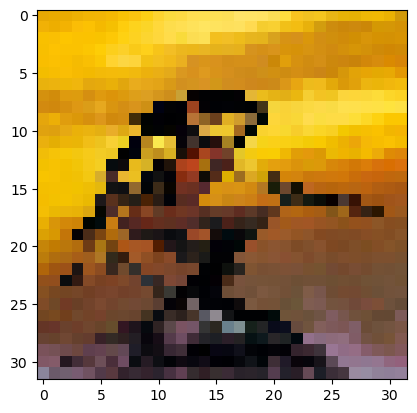

255
File saved successfully


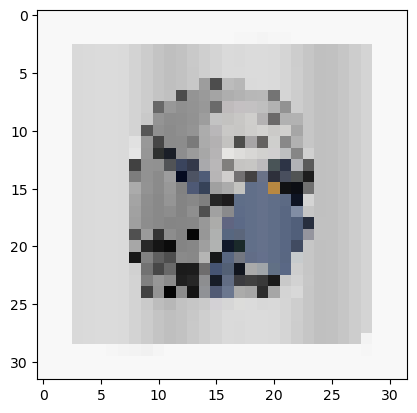

248
File saved successfully


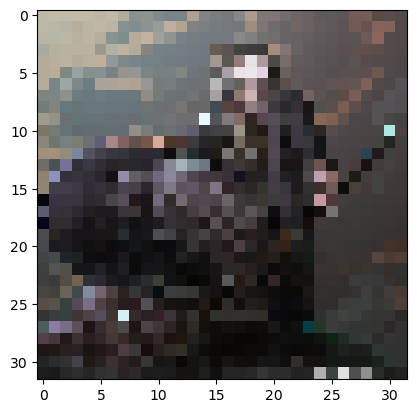

253
File saved successfully


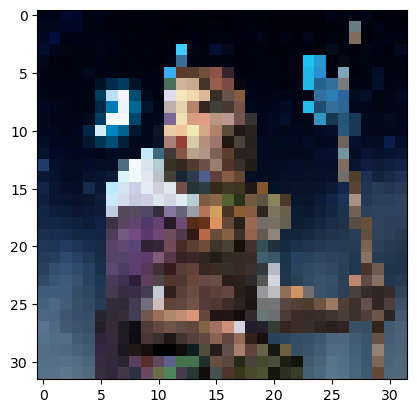

253
File saved successfully


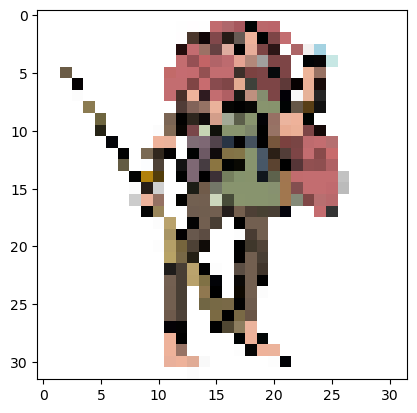

255
File saved successfully


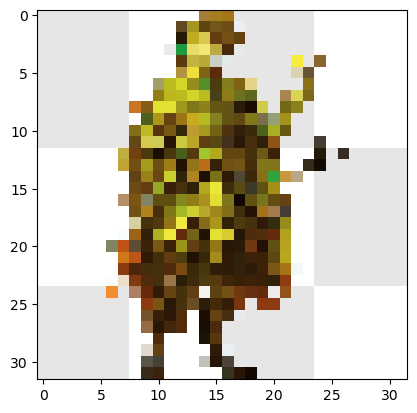

1.0
File saved successfully


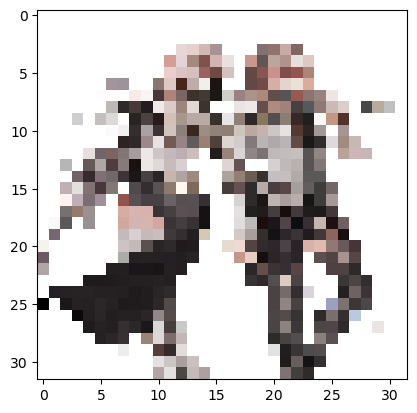

1.0
File saved successfully


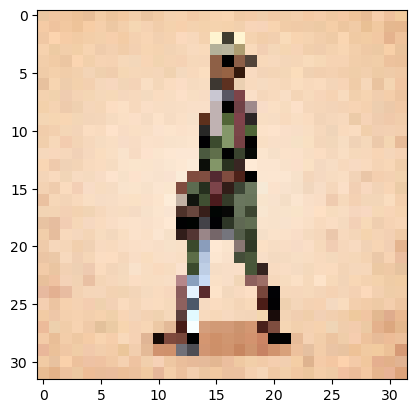

255
File saved successfully


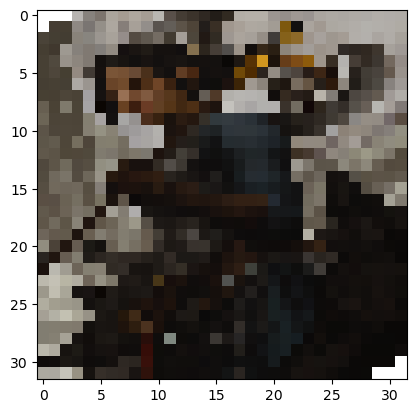

1.0
File saved successfully


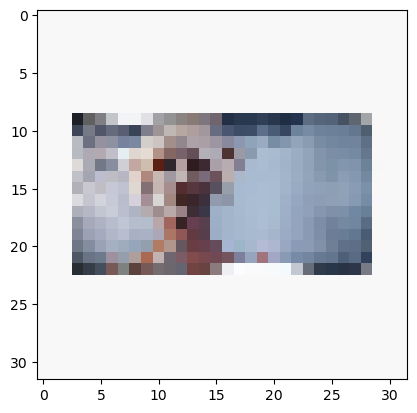

253
File saved successfully


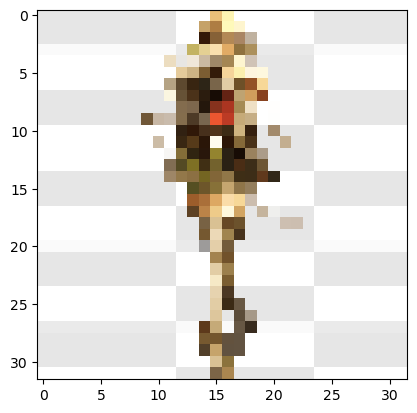

1.0
File saved successfully


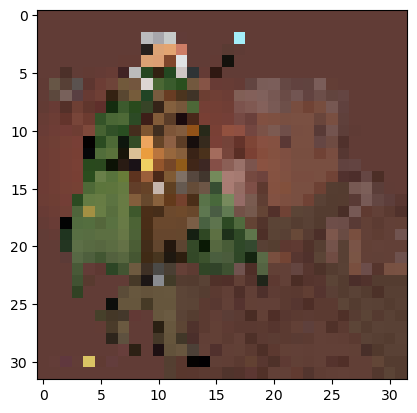

249
File saved successfully


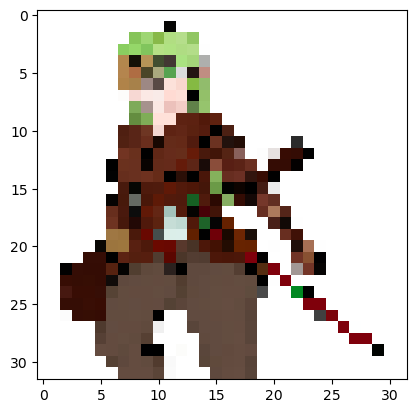

255
File saved successfully


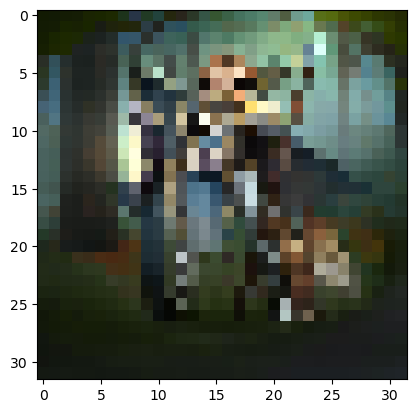

255
File saved successfully


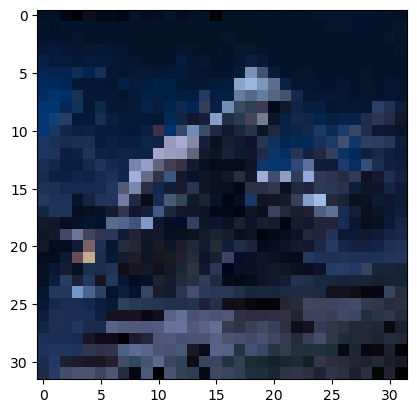

229
File saved successfully


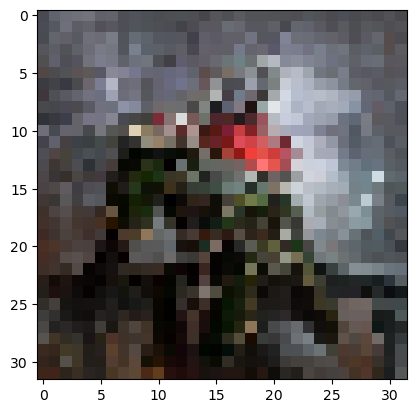

1.0
File saved successfully


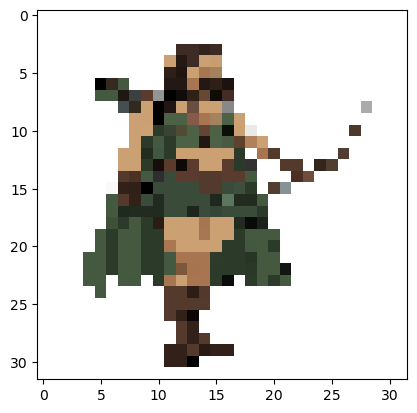

255
File saved successfully


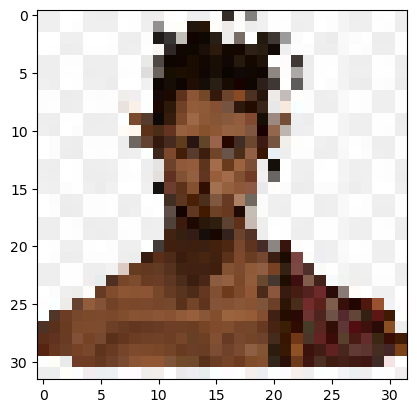

255
File saved successfully


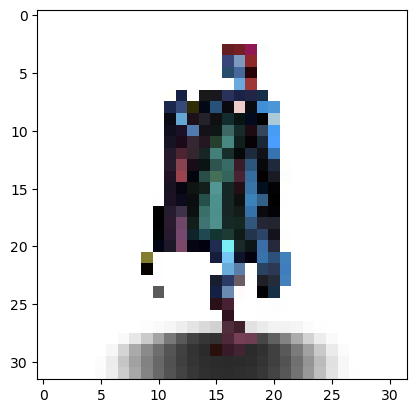

255
File saved successfully


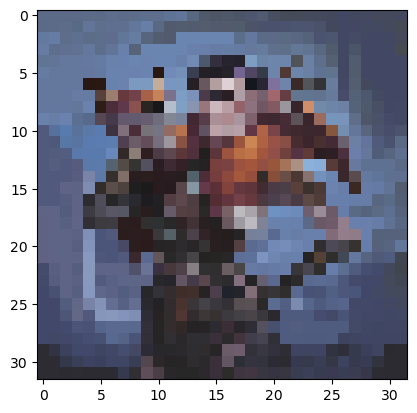

222
File saved successfully


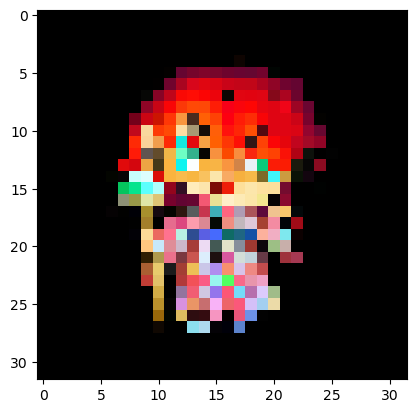

255
File saved successfully


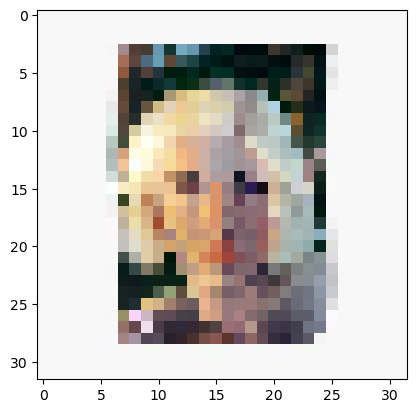

255
File saved successfully


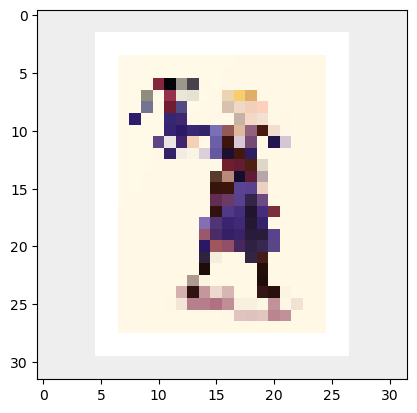

1.0
File saved successfully


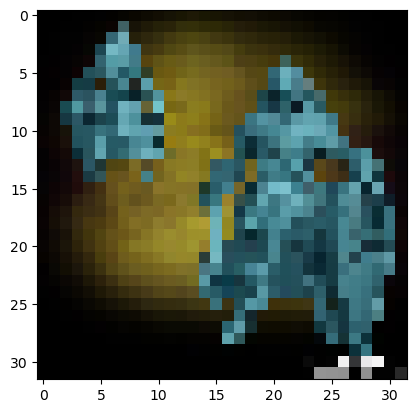

244
File saved successfully


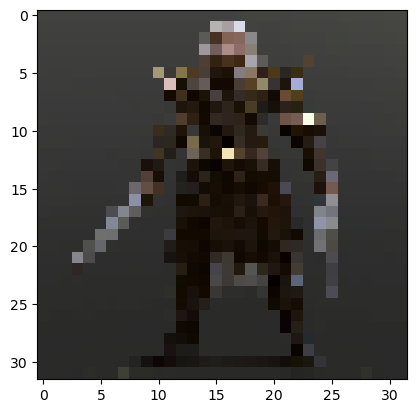

254
File saved successfully


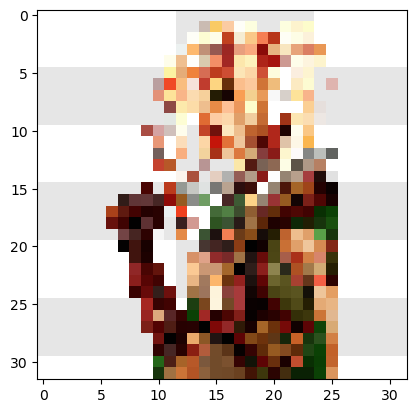

1.0
File saved successfully


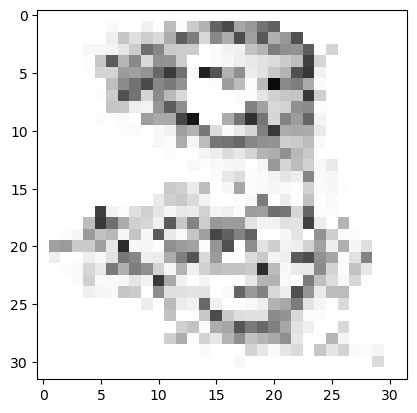

255
File saved successfully


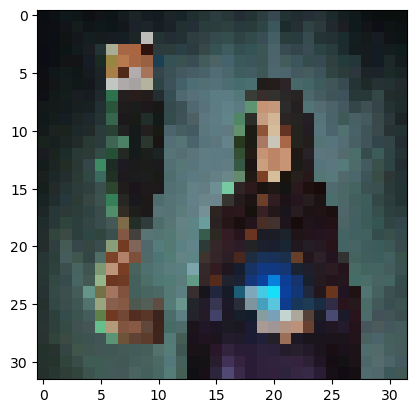

1.0
File saved successfully


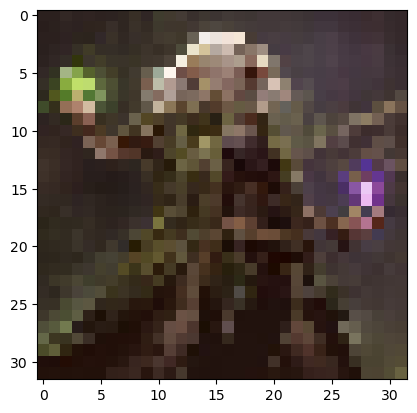

254
File saved successfully


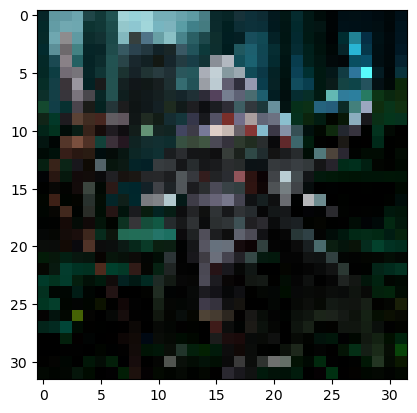

252
File saved successfully


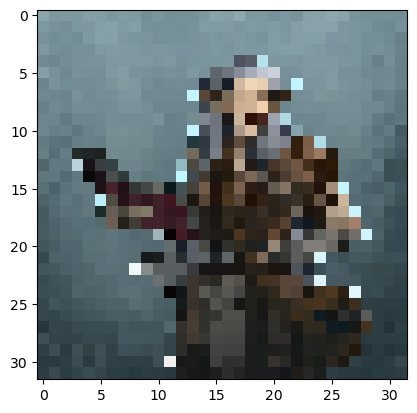

1.0
File saved successfully


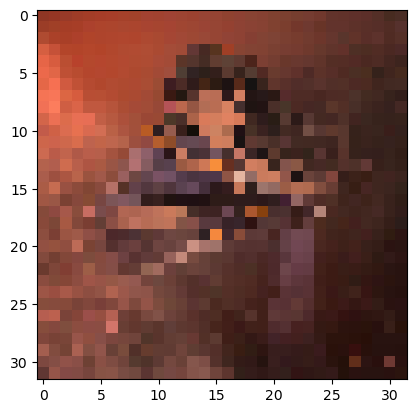

252
File saved successfully


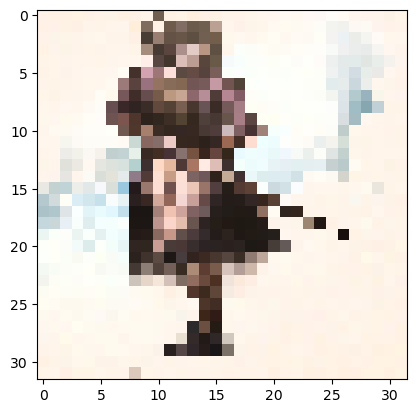

255
File saved successfully


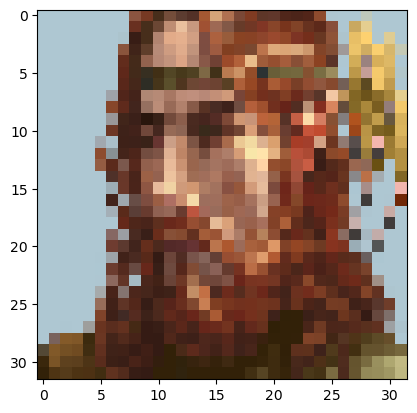

1.0
File saved successfully


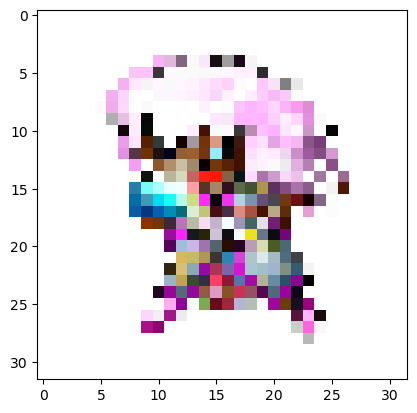

255
File saved successfully


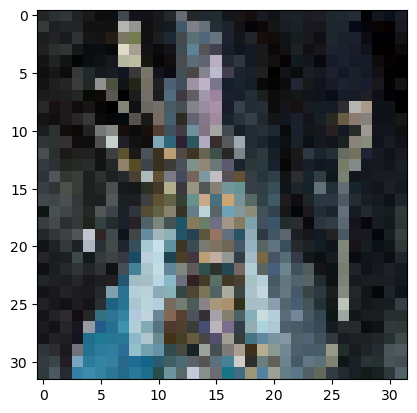

235
File saved successfully


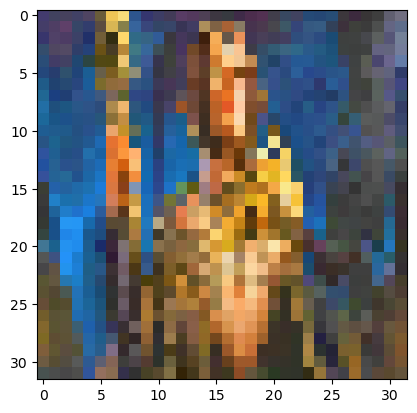

255
File saved successfully


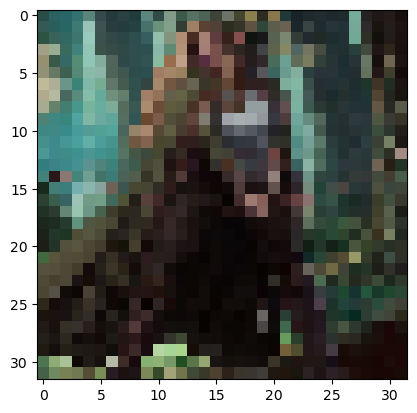

213
File saved successfully


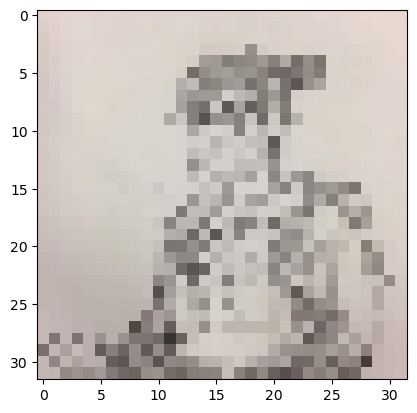

231
File saved successfully


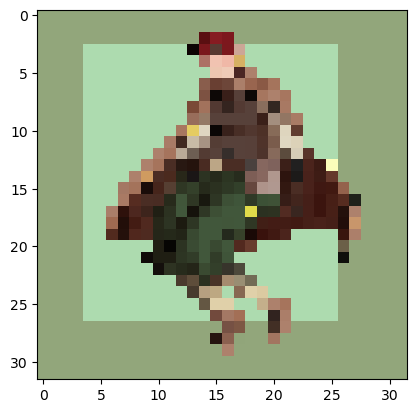

1.0
File saved successfully


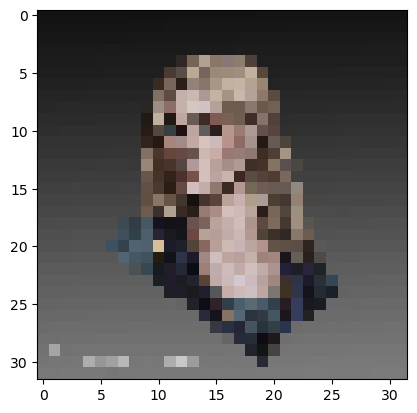

214
File saved successfully


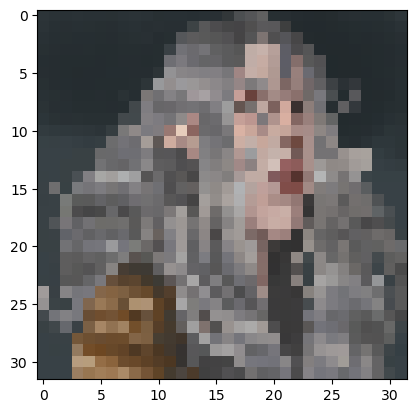

0.9074142
File saved successfully


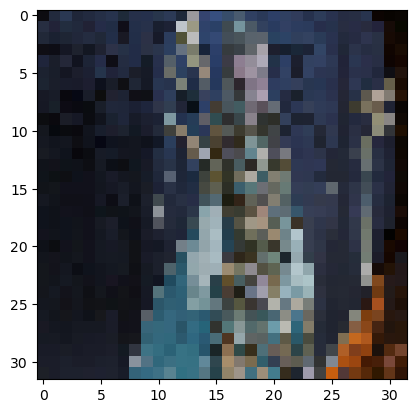

204
File saved successfully


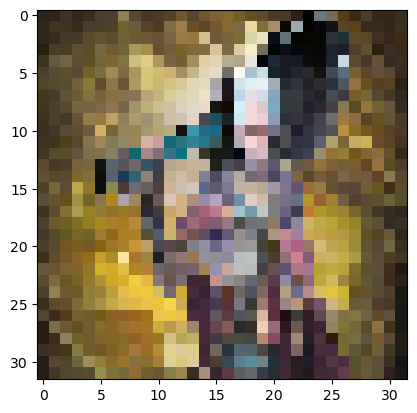

253
File saved successfully


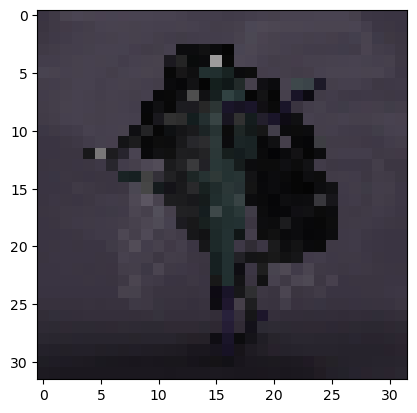

157
File saved successfully


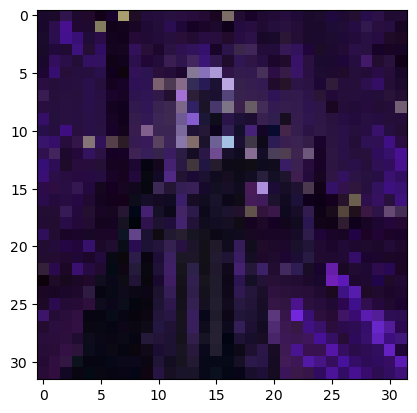

227
File saved successfully


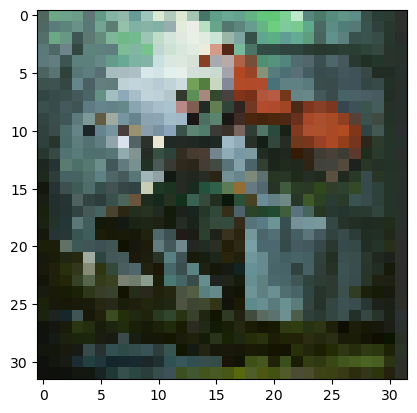

240
File saved successfully


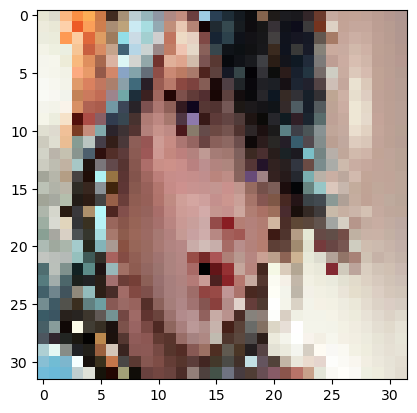

255
File saved successfully


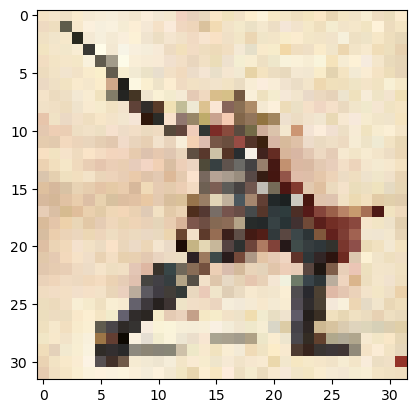

255
File saved successfully


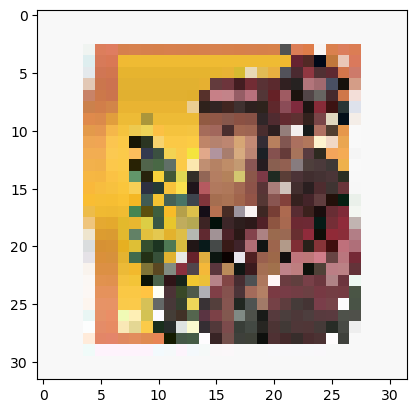

255
File saved successfully


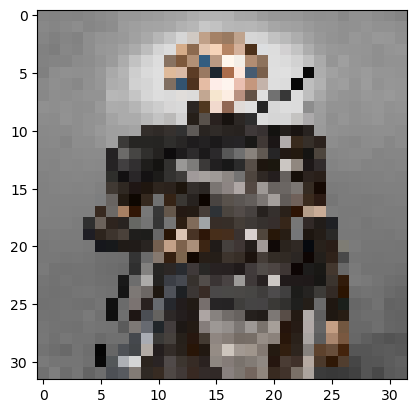

255
File saved successfully


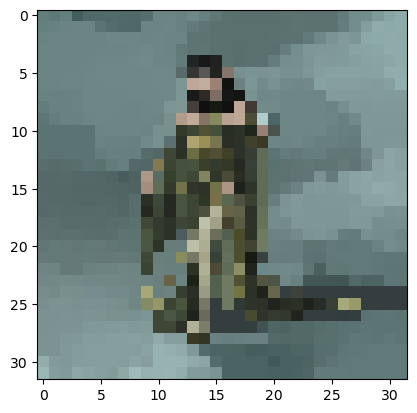

204
File saved successfully


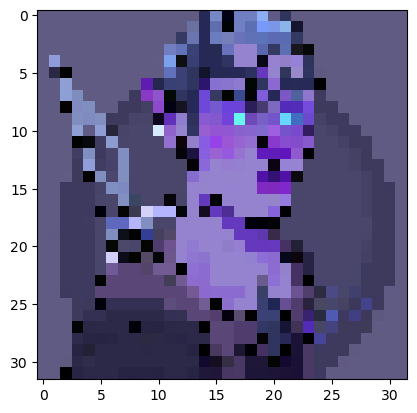

255
File saved successfully


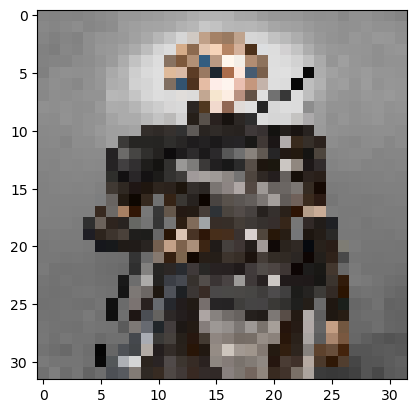

255
File saved successfully


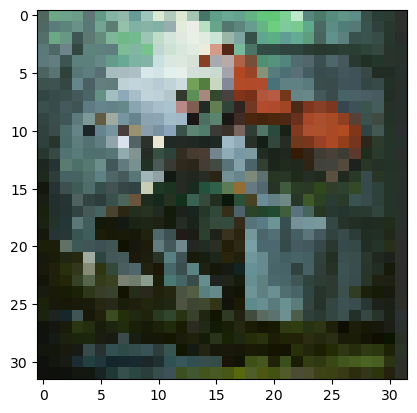

240
File saved successfully


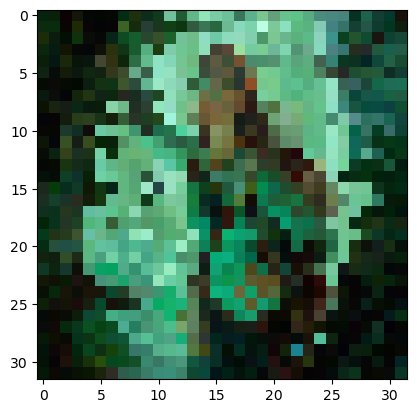

0.9937041
File saved successfully


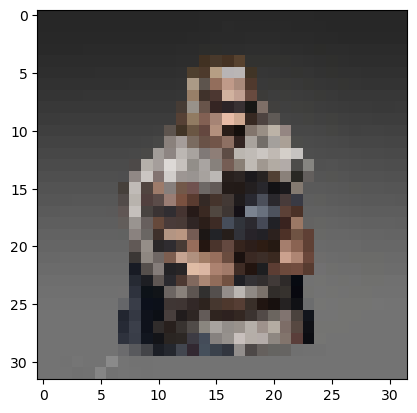

232
File saved successfully


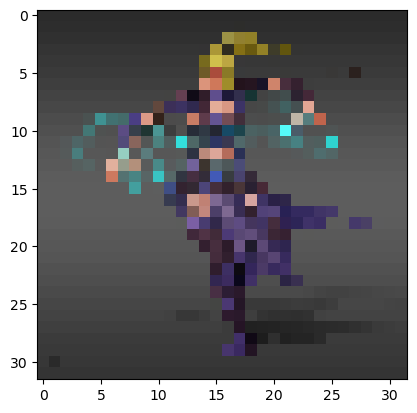

251
File saved successfully


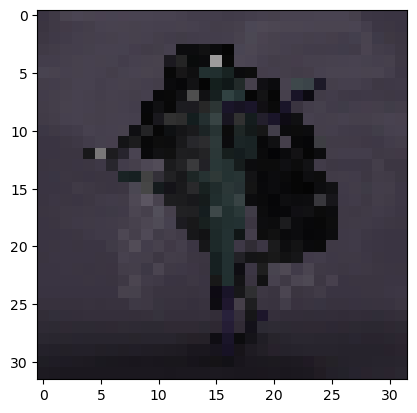

157
File saved successfully


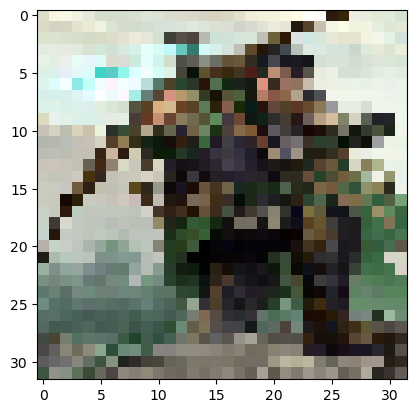

255
File saved successfully


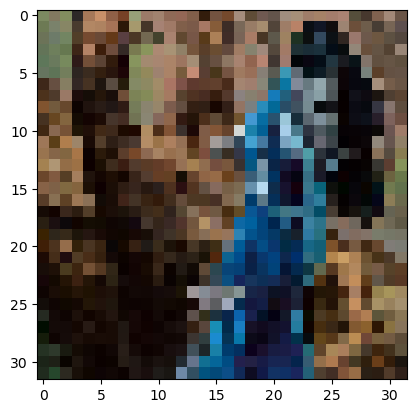

239
File saved successfully


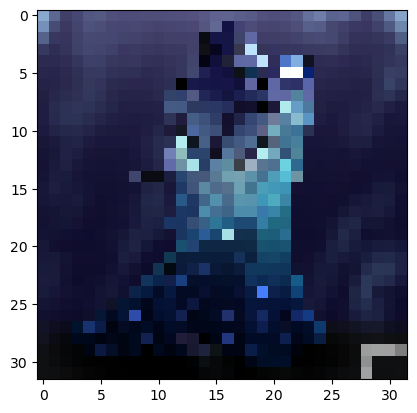

1.0
File saved successfully


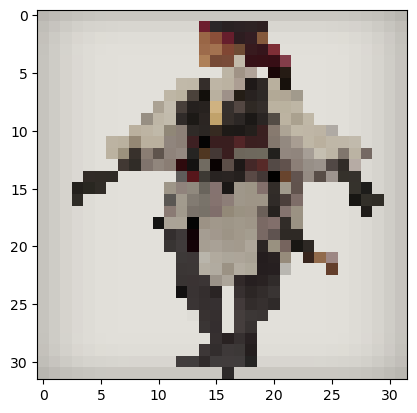

0.8862745
File saved successfully


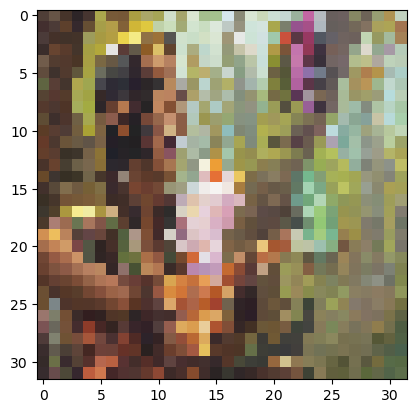

247
File saved successfully


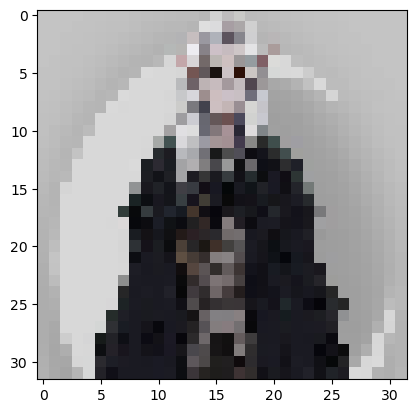

241
File saved successfully


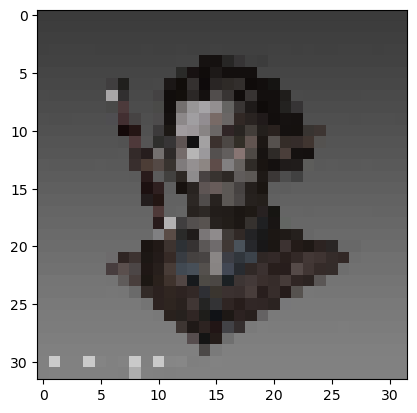

202
File saved successfully


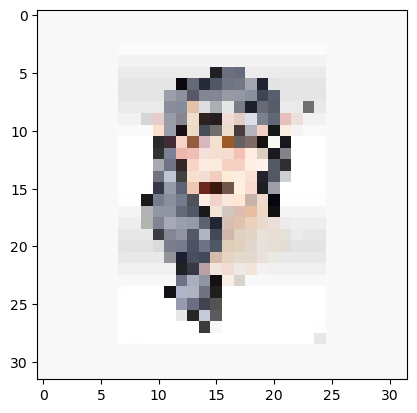

255
File saved successfully


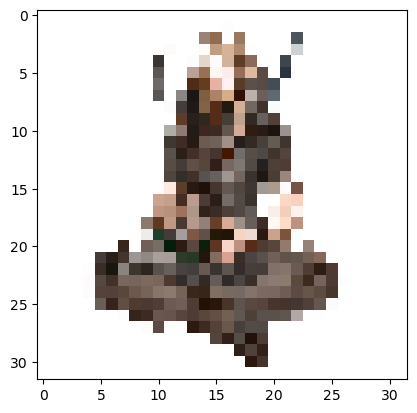

255
File saved successfully


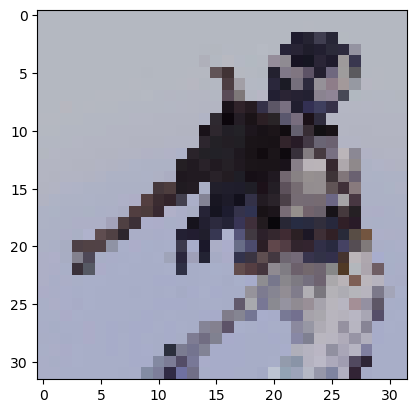

210
File saved successfully


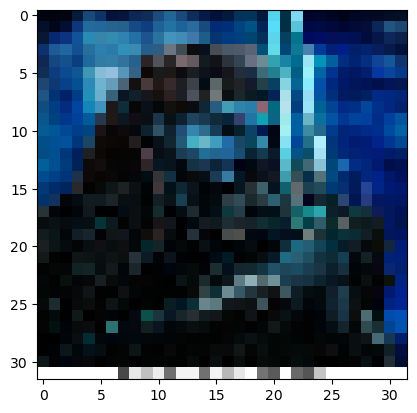

255
File saved successfully


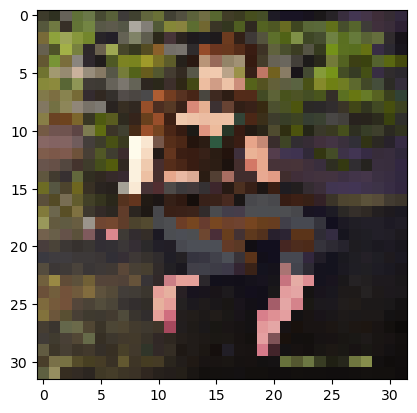

1.0
File saved successfully


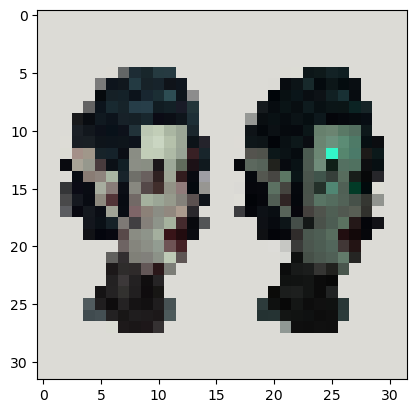

246
File saved successfully


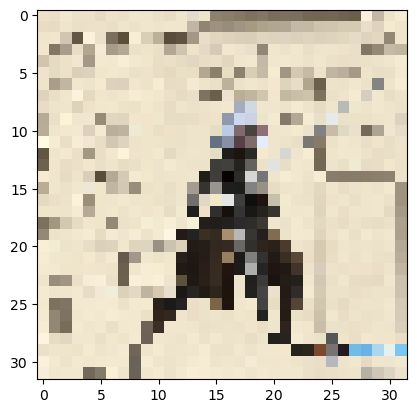

254
File saved successfully


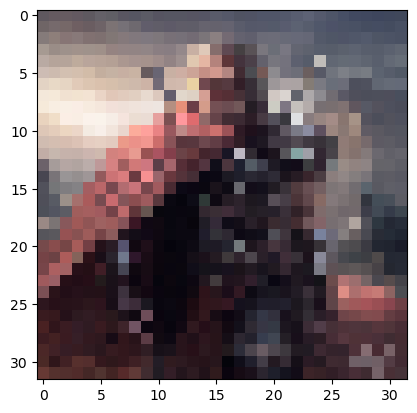

1.0
File saved successfully


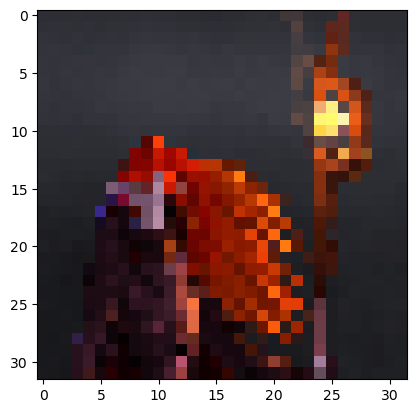

1.0
File saved successfully


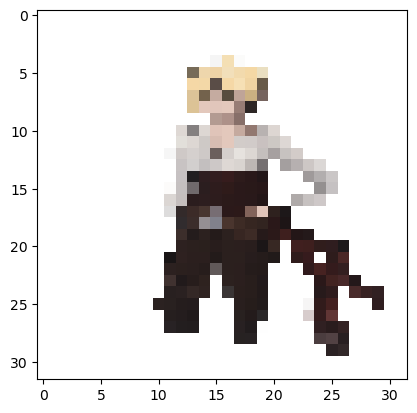

1.0
File saved successfully


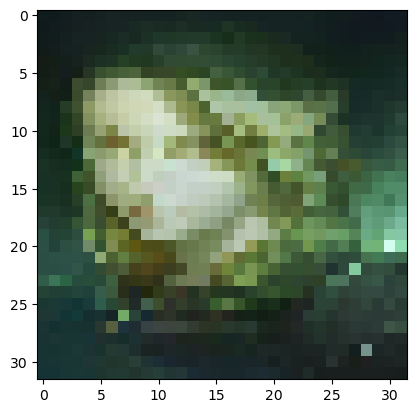

254
File saved successfully


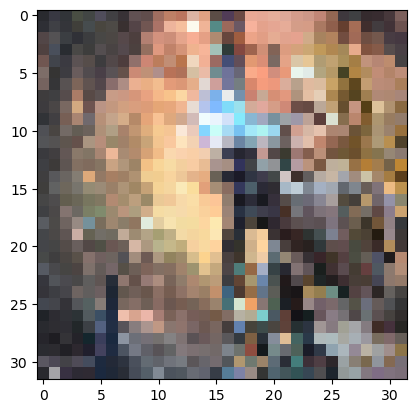

254
File saved successfully


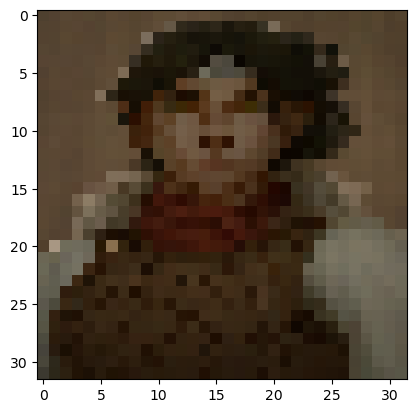

1.0
File saved successfully


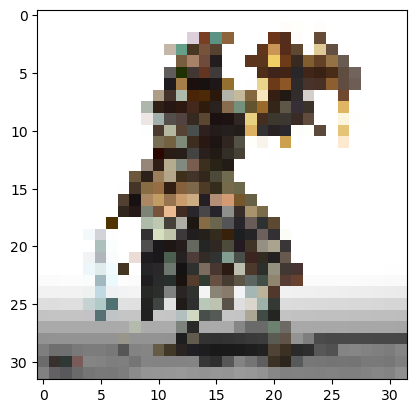

255
File saved successfully


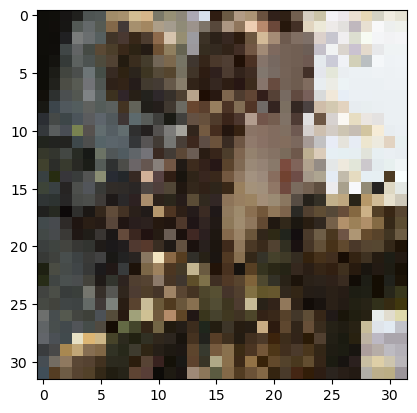

254
File saved successfully


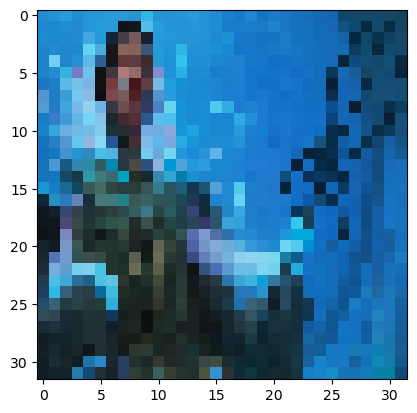

246
File saved successfully


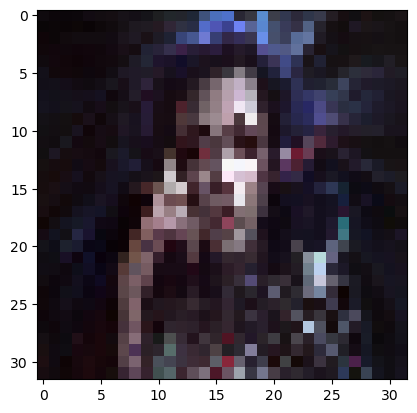

252
File saved successfully


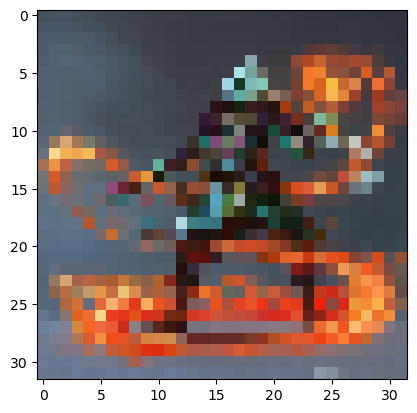

255
File saved successfully


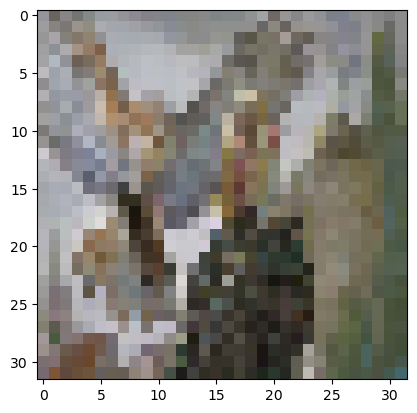

225
File saved successfully


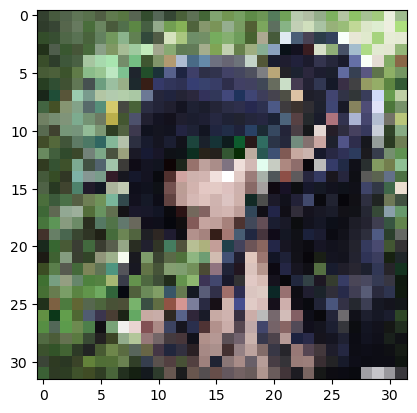

255
File saved successfully


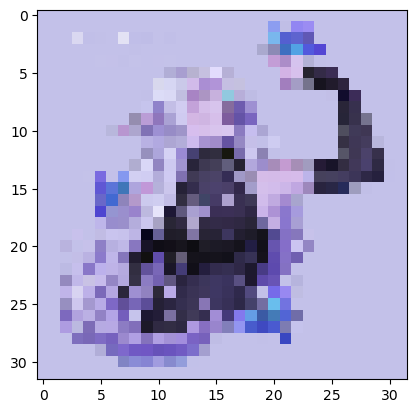

0.9952053
File saved successfully


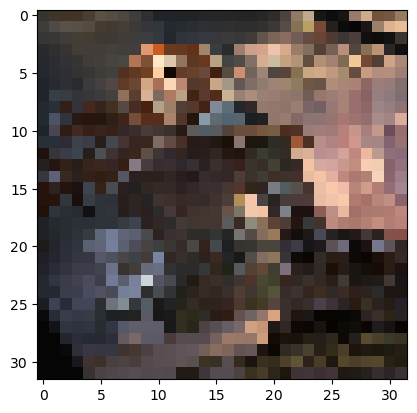

1.0
File saved successfully


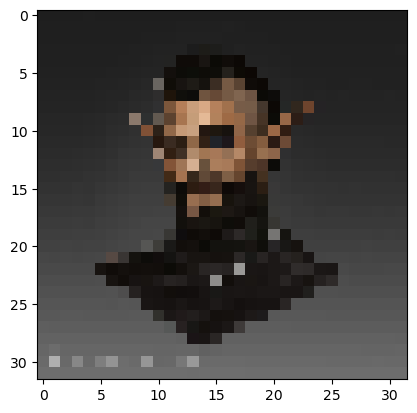

228
File saved successfully


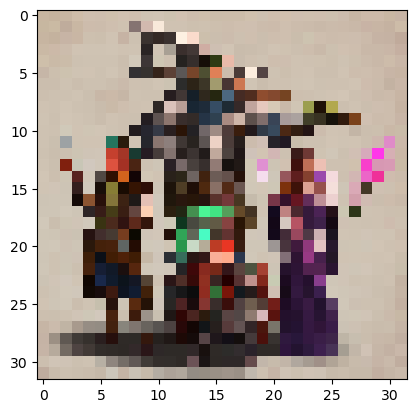

255
File saved successfully


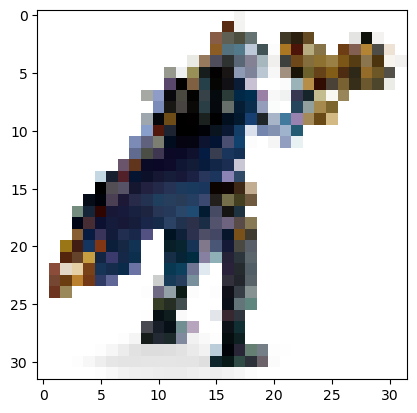

1.0
File saved successfully


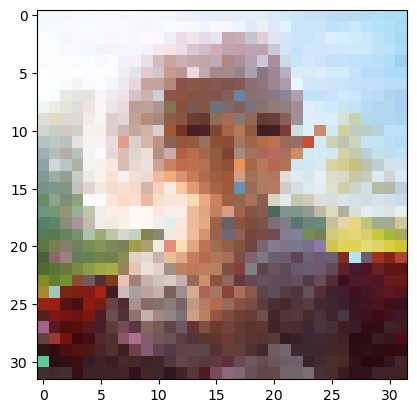

255
File saved successfully


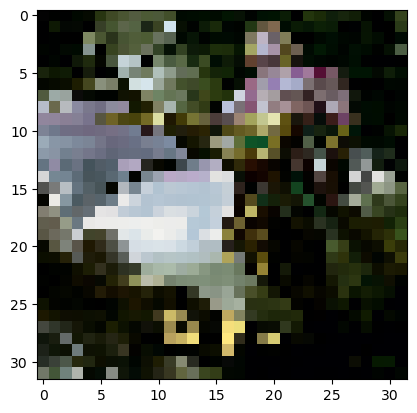

1.0
File saved successfully


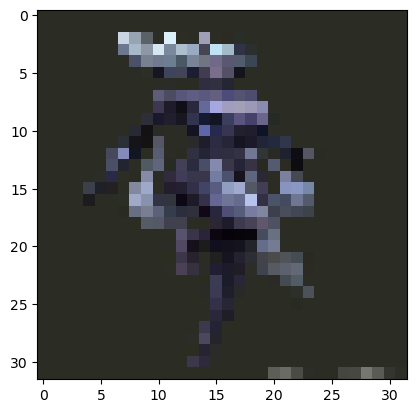

249
File saved successfully


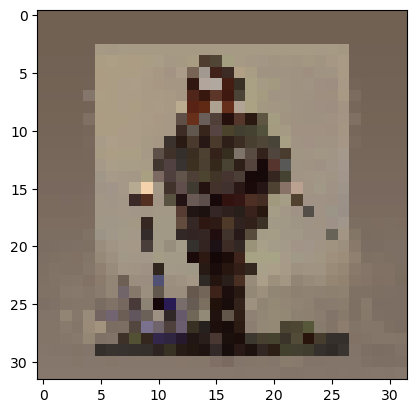

243
File saved successfully


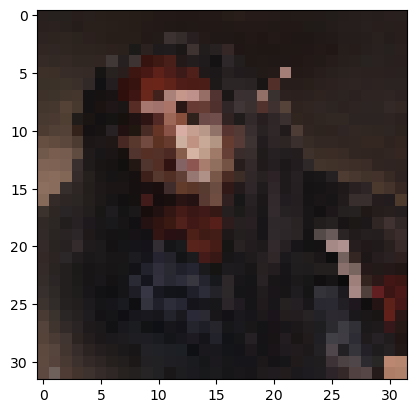

216
File saved successfully


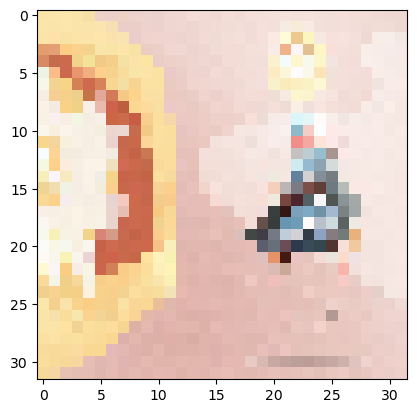

255
File saved successfully


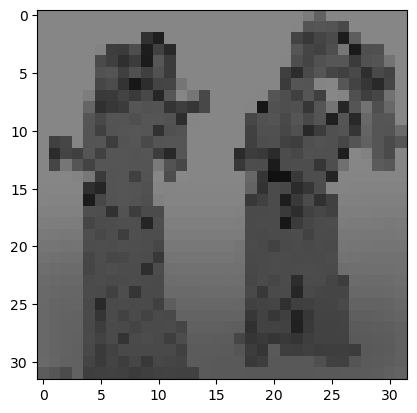

135
File saved successfully


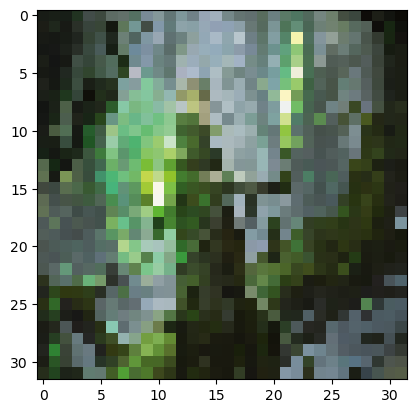

251
File saved successfully


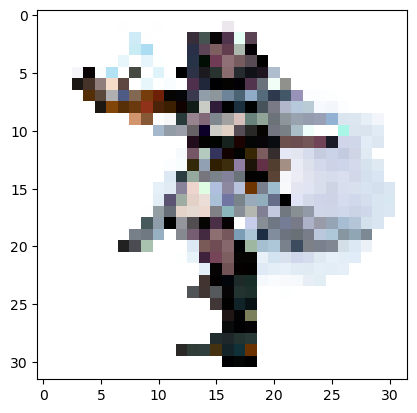

255
File saved successfully


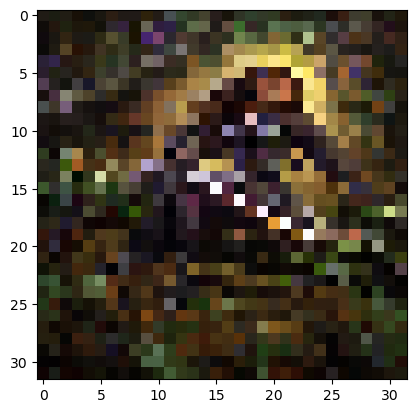

255
File saved successfully


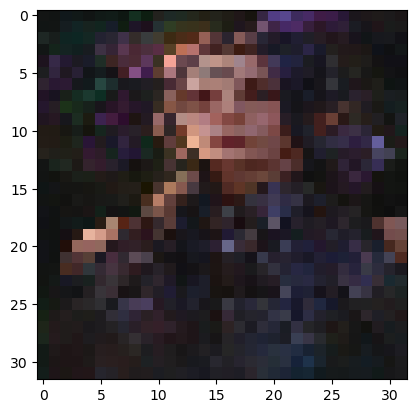

245
File saved successfully


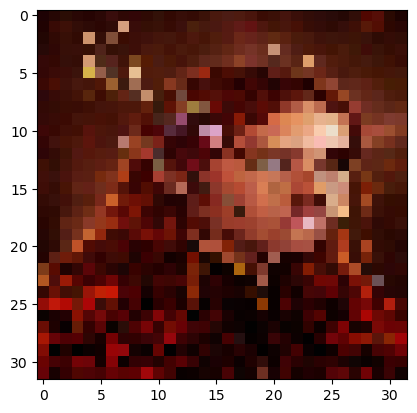

249
File saved successfully


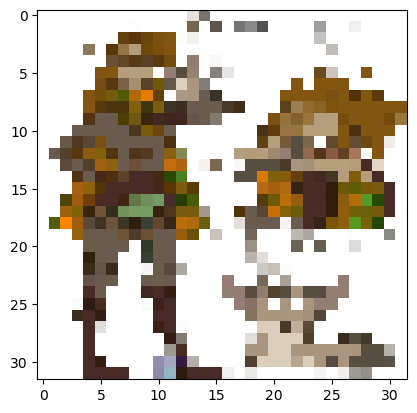

255
File saved successfully


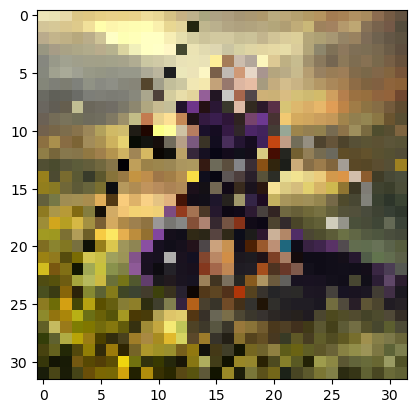

255
File saved successfully


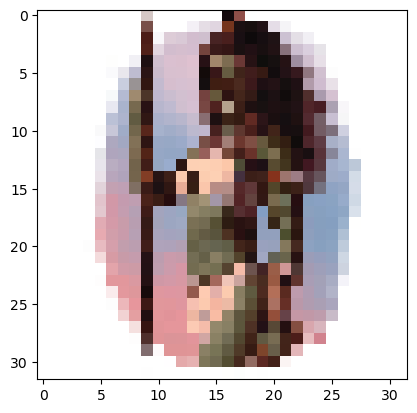

255
File saved successfully


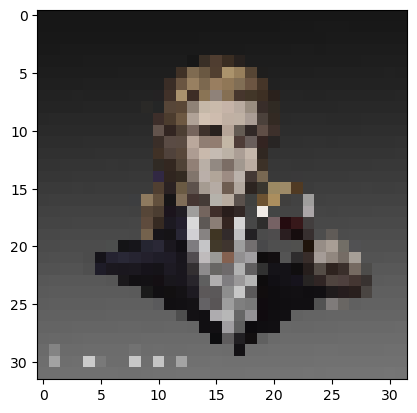

240
File saved successfully


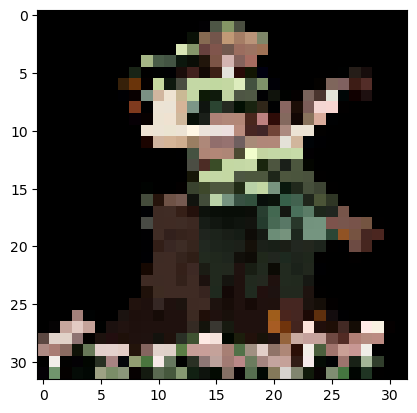

255
File saved successfully


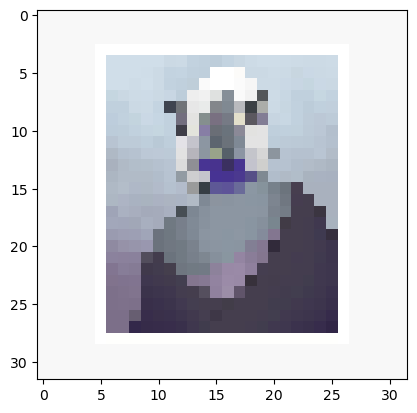

255
File saved successfully


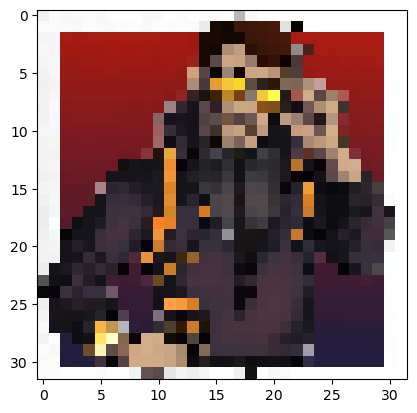

255
File saved successfully


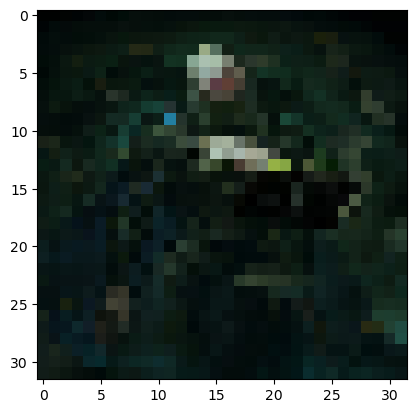

195
File saved successfully


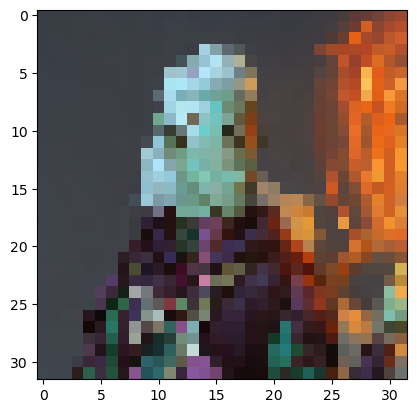

253
File saved successfully


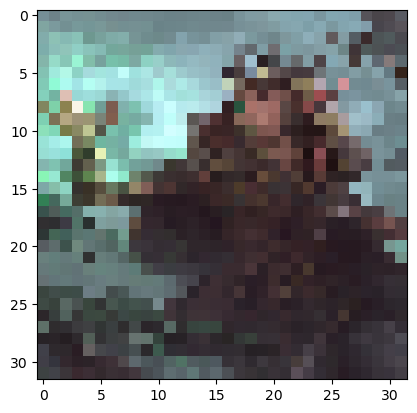

1.0
File saved successfully


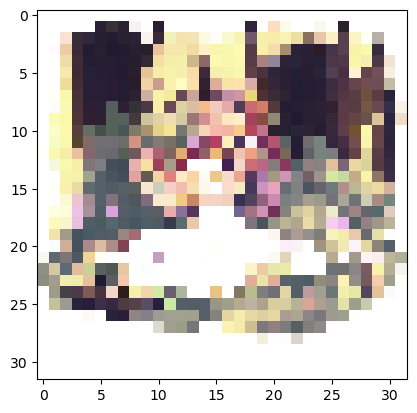

255
File saved successfully


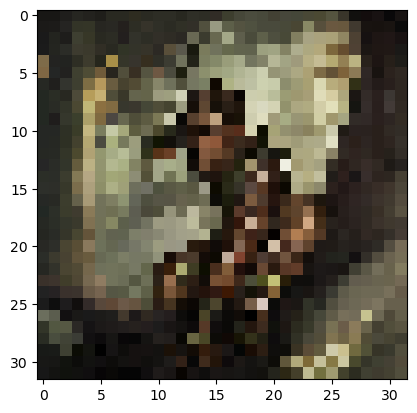

239
File saved successfully


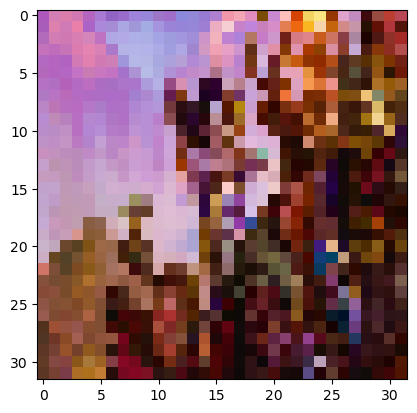

255
File saved successfully


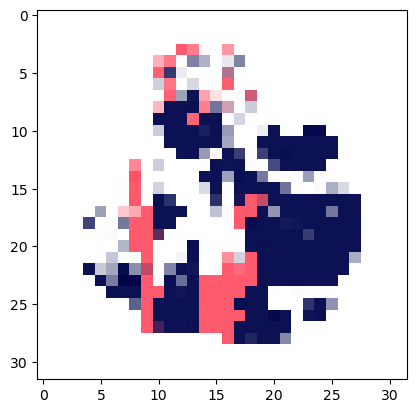

1.0
File saved successfully


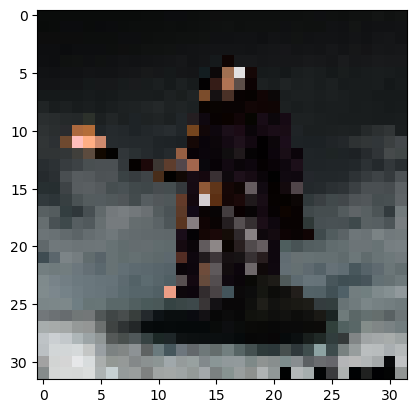

255
File saved successfully


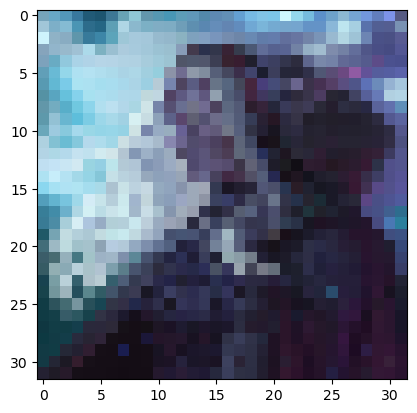

253
File saved successfully


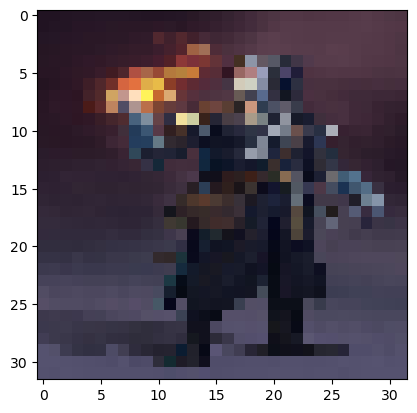

255
File saved successfully


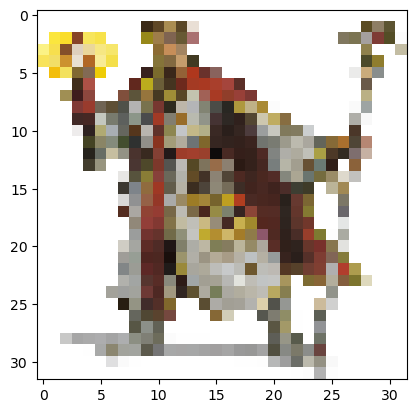

1.0
File saved successfully


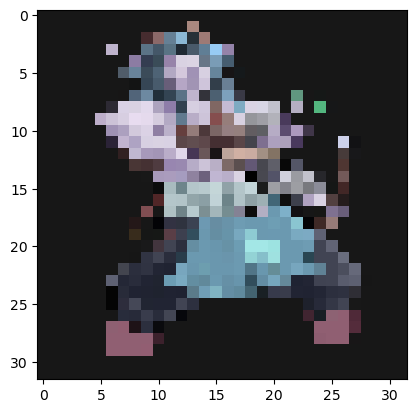

244
File saved successfully


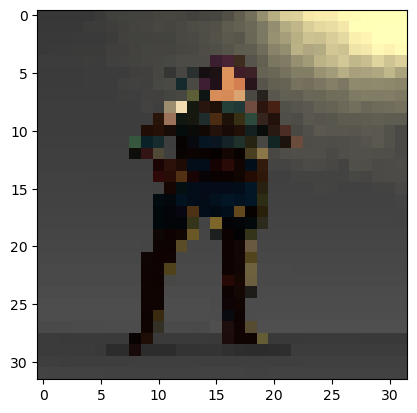

1.0
File saved successfully


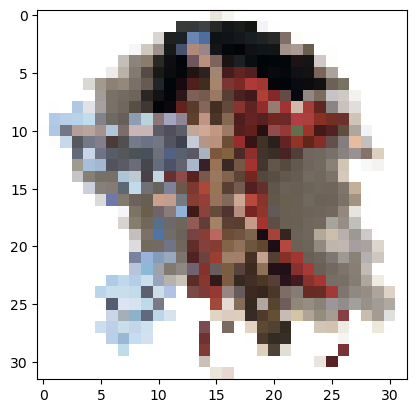

255
File saved successfully


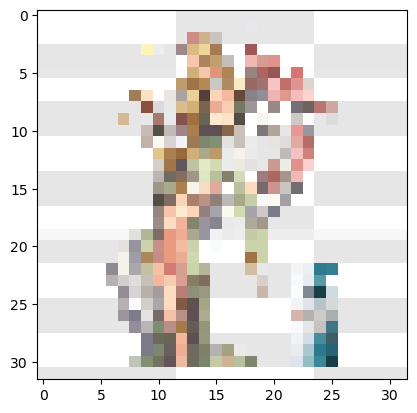

1.0
File saved successfully


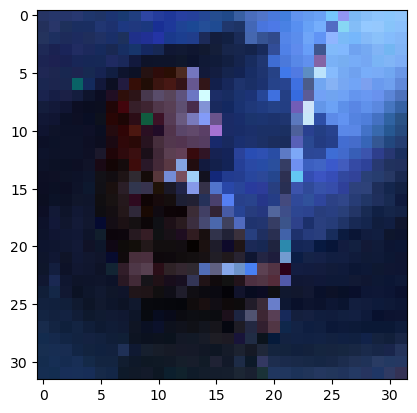

255
File saved successfully


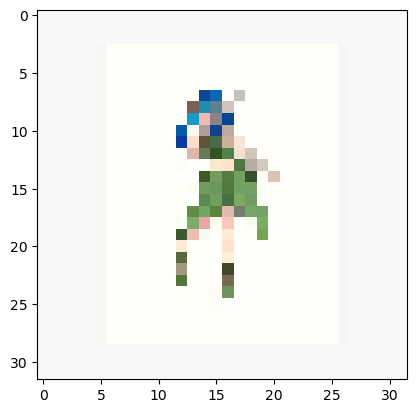

255
File saved successfully


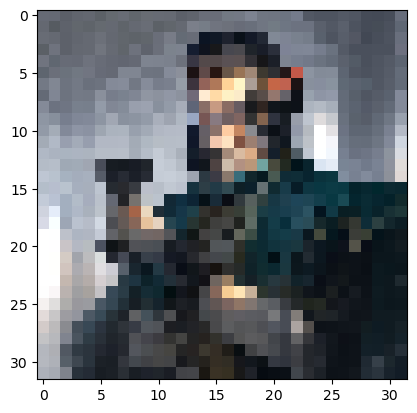

255
File saved successfully


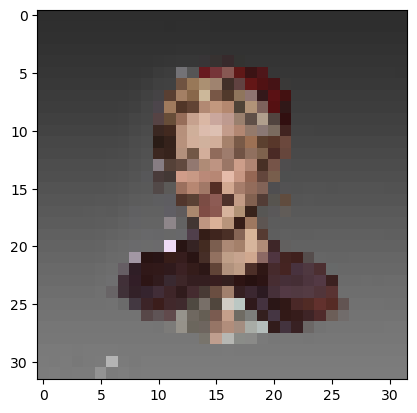

245
File saved successfully


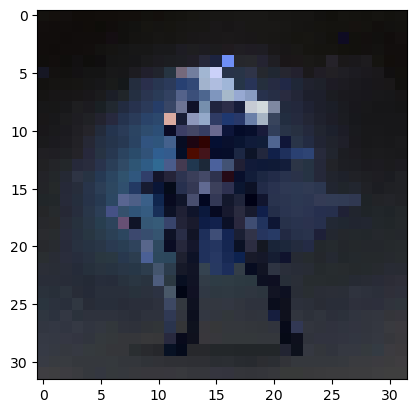

249
File saved successfully


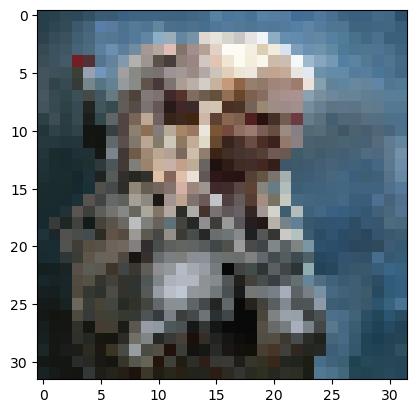

254
File saved successfully


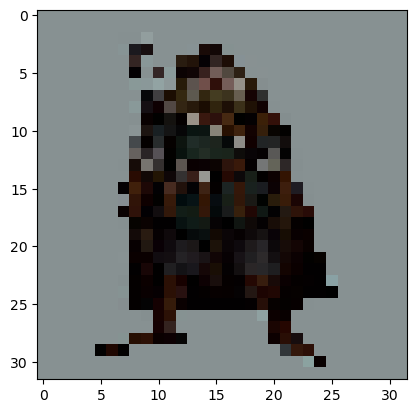

164
File saved successfully


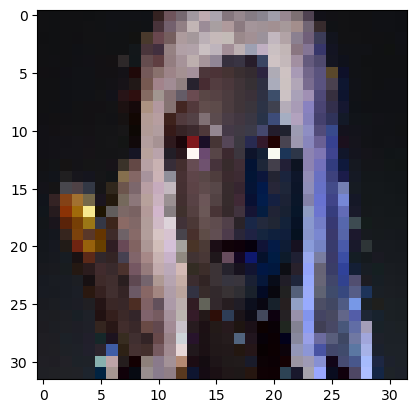

255
File saved successfully


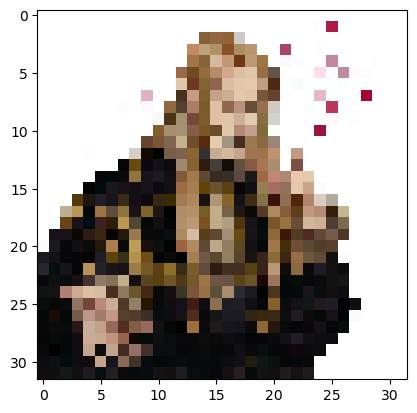

255
File saved successfully


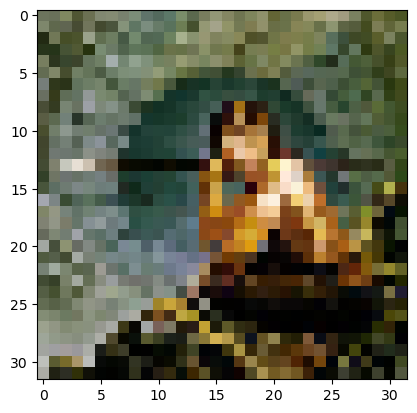

255
File saved successfully


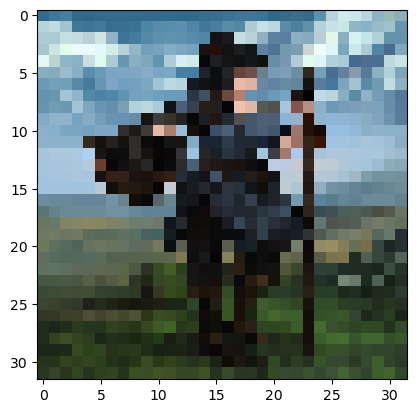

251
File saved successfully


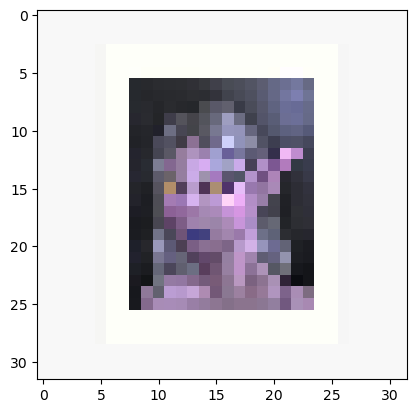

255
File saved successfully


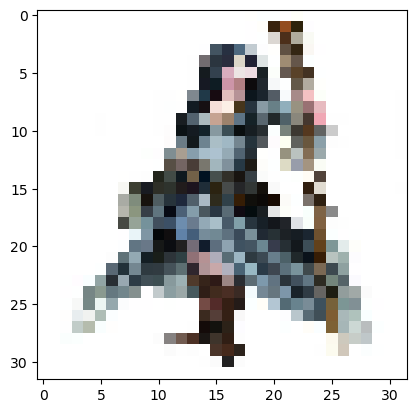

255
File saved successfully


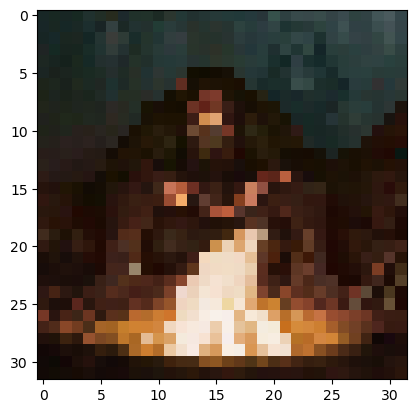

1.0
File saved successfully


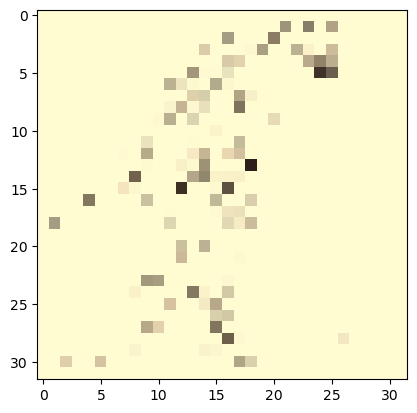

1.0
File saved successfully


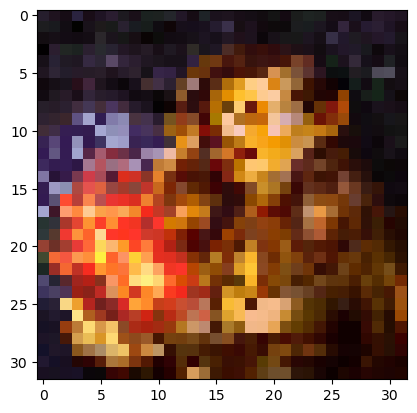

255
File saved successfully


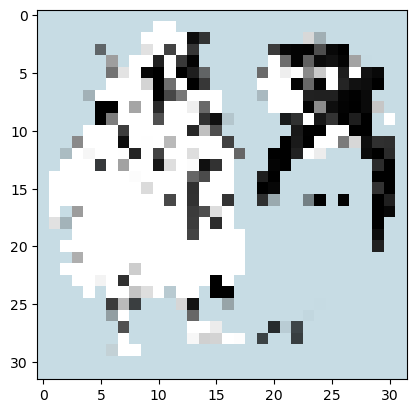

1.0
File saved successfully


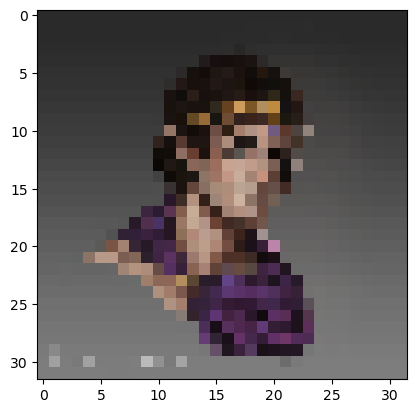

206
File saved successfully


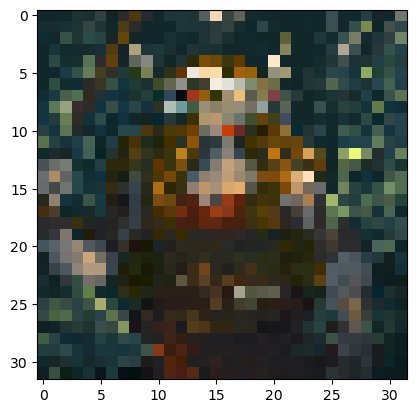

255
File saved successfully


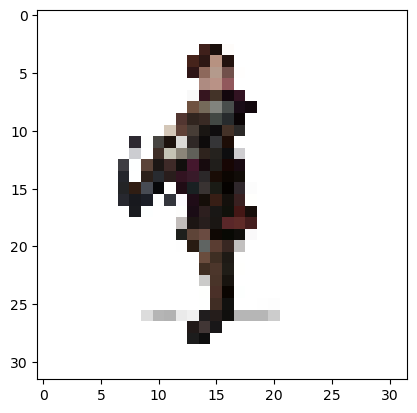

1.0
File saved successfully


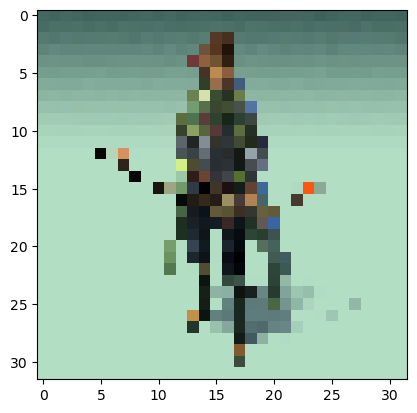

254
File saved successfully


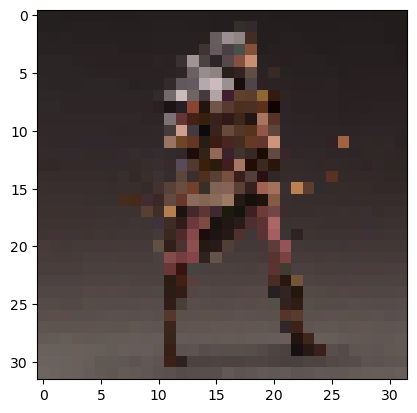

207
File saved successfully


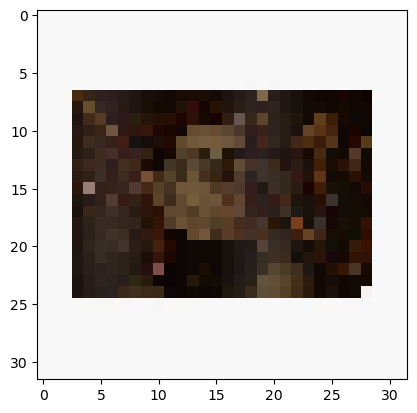

251
File saved successfully


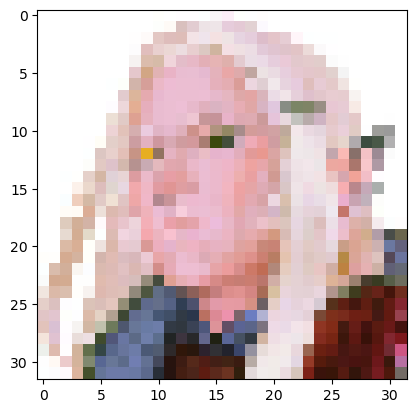

255
File saved successfully


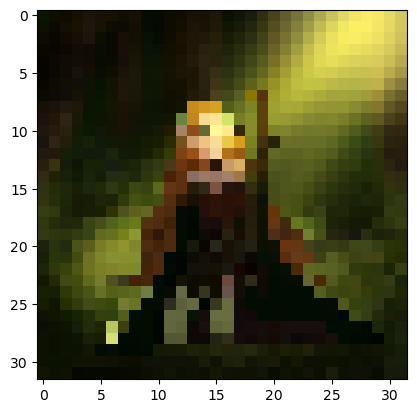

255
File saved successfully


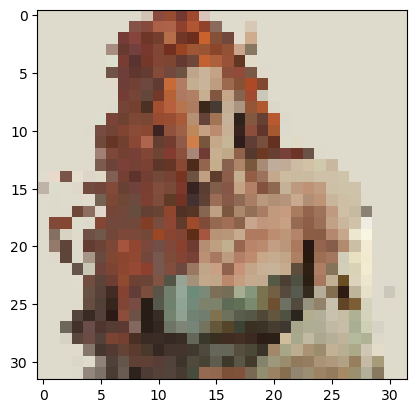

247
File saved successfully


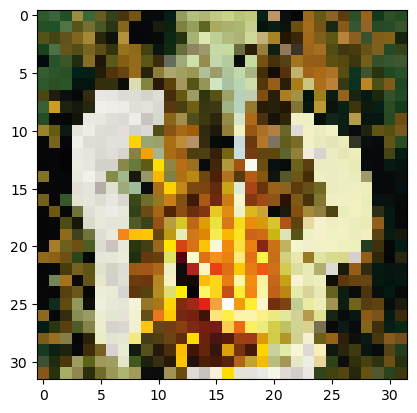

255
File saved successfully


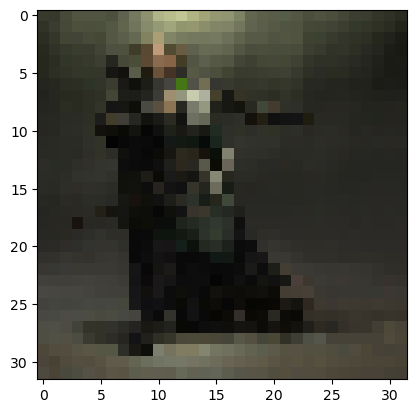

204
File saved successfully


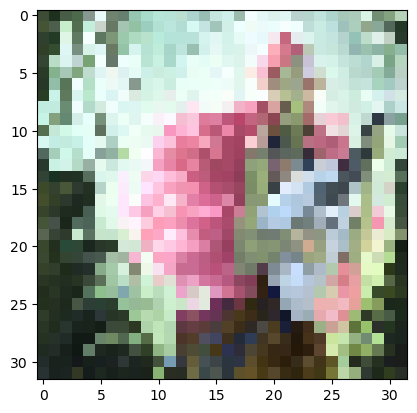

255
File saved successfully


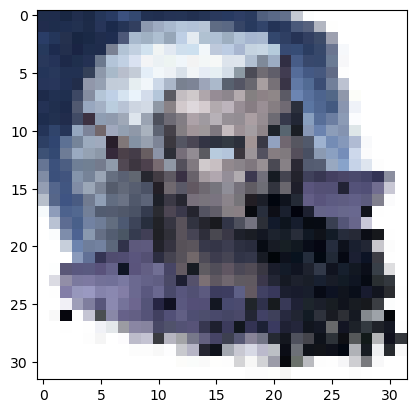

255
File saved successfully


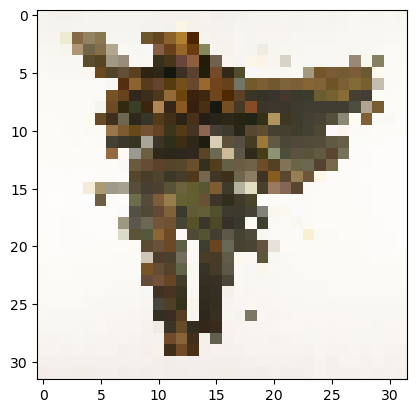

254
File saved successfully


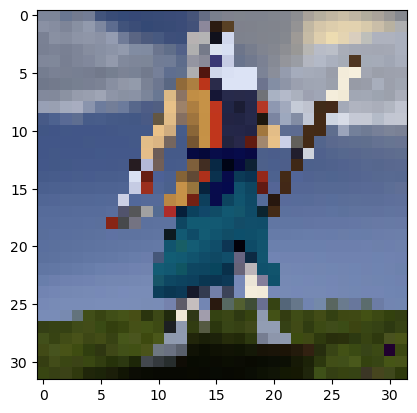

246
File saved successfully


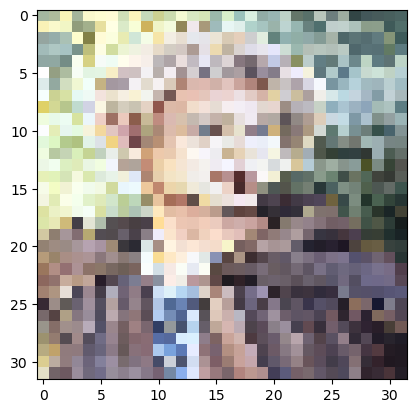

255
File saved successfully


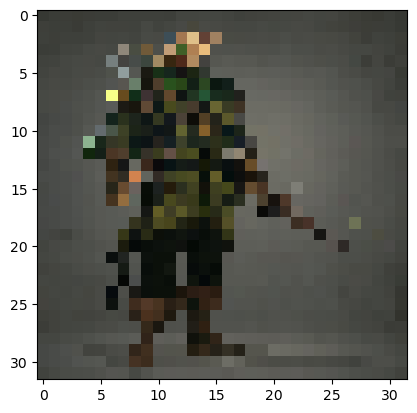

255
File saved successfully


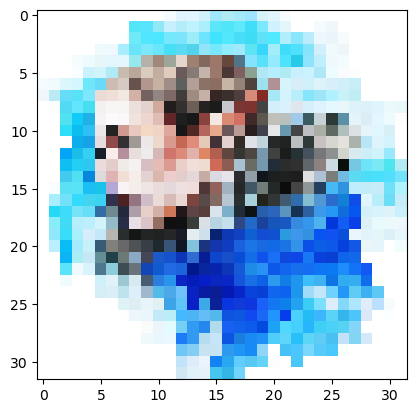

255
File saved successfully


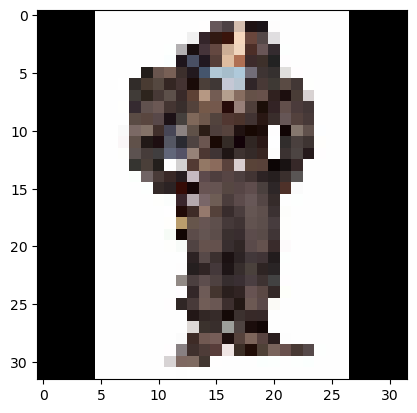

255
File saved successfully


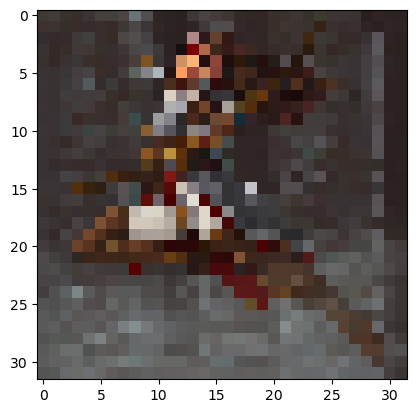

249
File saved successfully


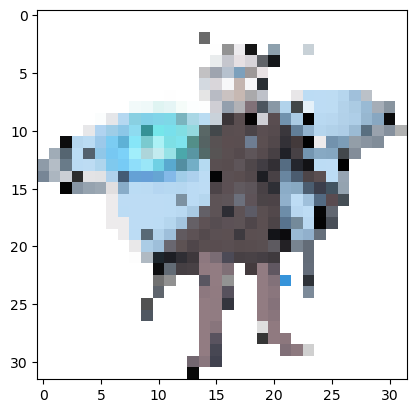

1.0
File saved successfully


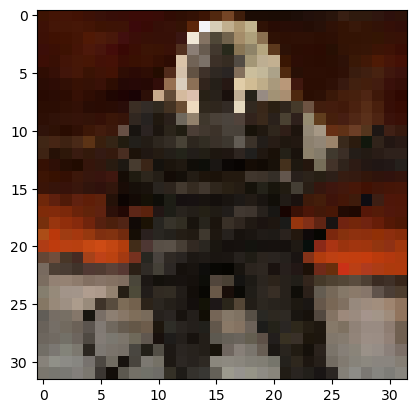

248
File saved successfully


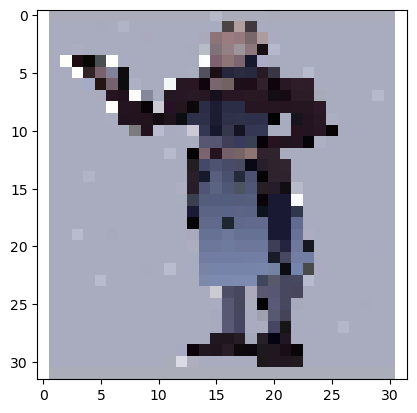

255
File saved successfully


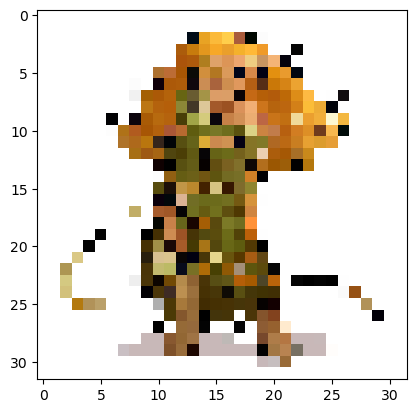

255
File saved successfully


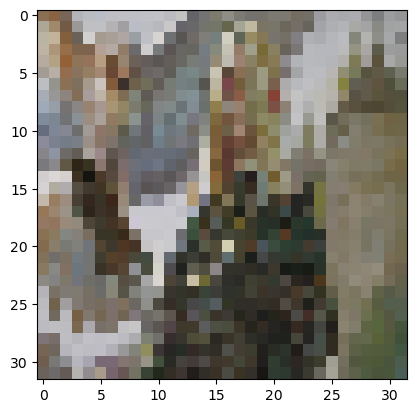

219
File saved successfully


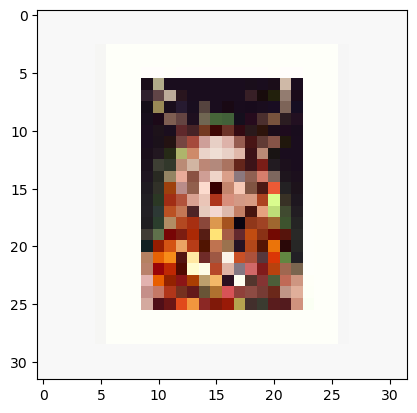

255
File saved successfully


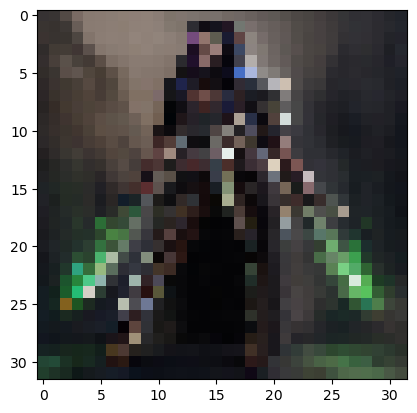

238
File saved successfully


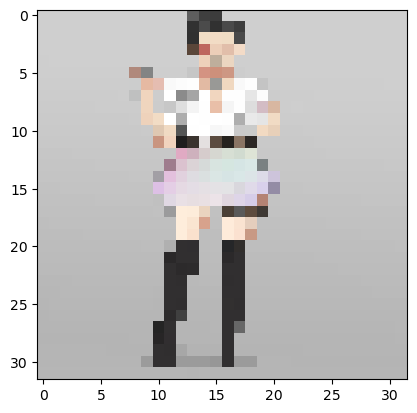

255
File saved successfully


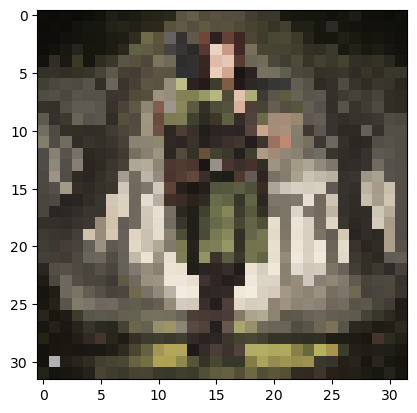

0.9529412
File saved successfully


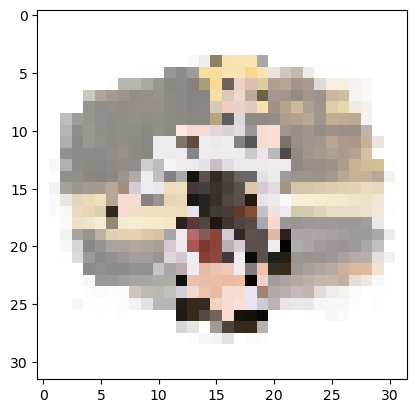

255
File saved successfully


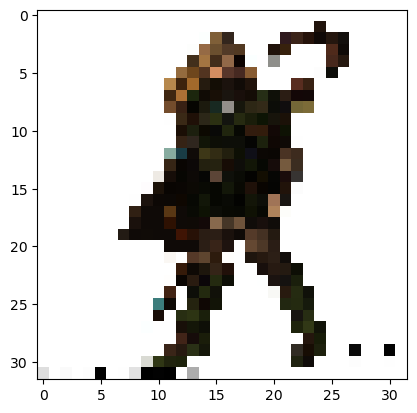

255
File saved successfully


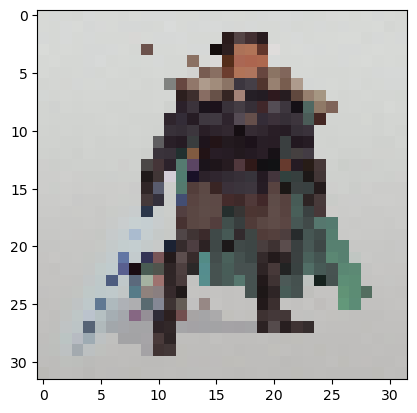

223
File saved successfully


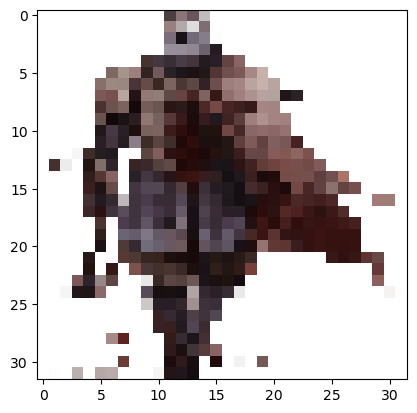

1.0
File saved successfully


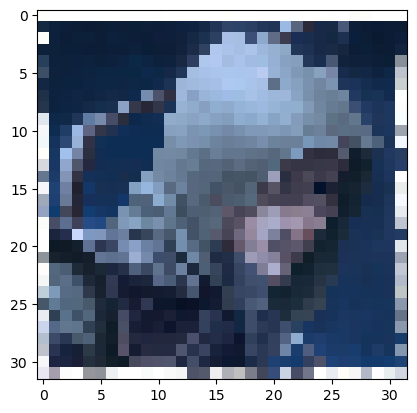

255
File saved successfully


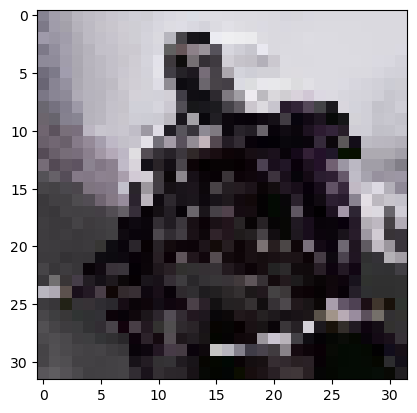

242
File saved successfully


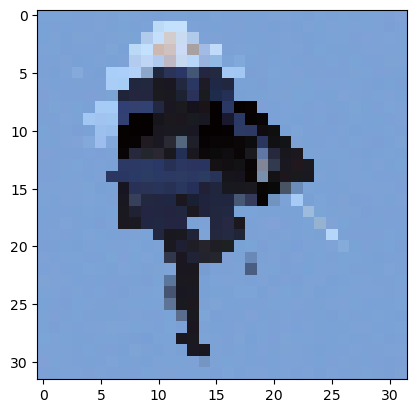

1.0
File saved successfully


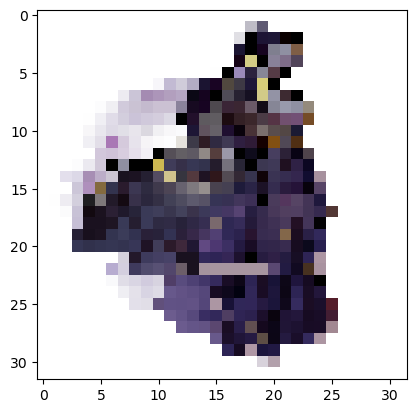

1.0
File saved successfully


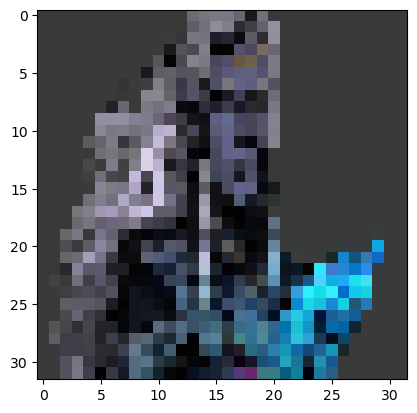

252
File saved successfully


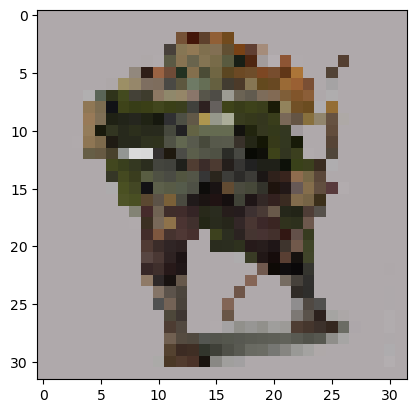

218
File saved successfully


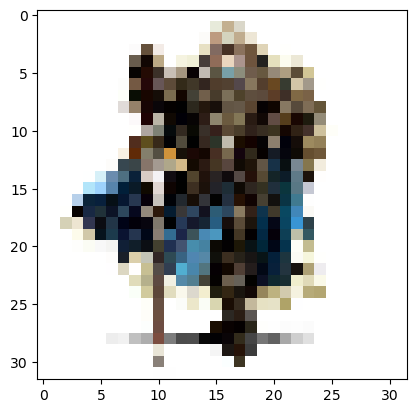

255
File saved successfully


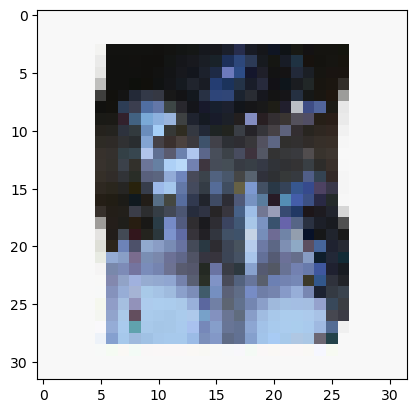

255
File saved successfully


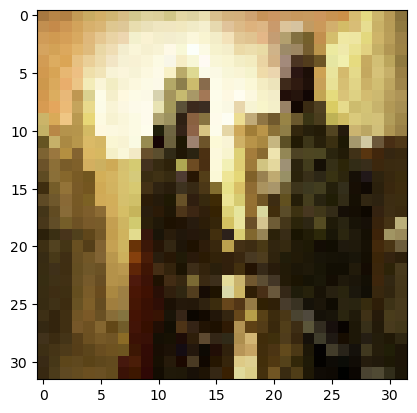

255
File saved successfully


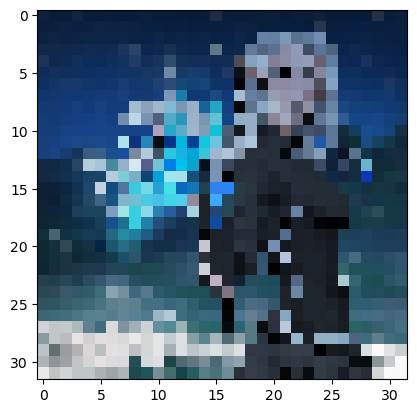

251
File saved successfully


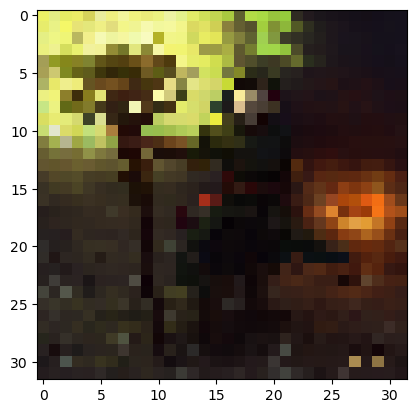

0.9960478
File saved successfully


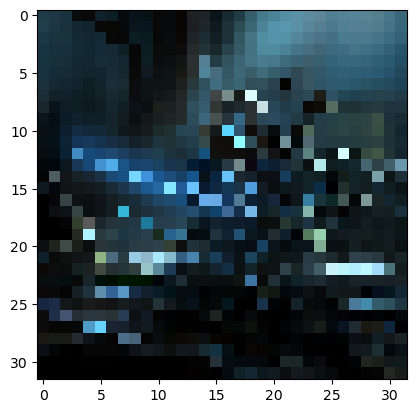

255
File saved successfully


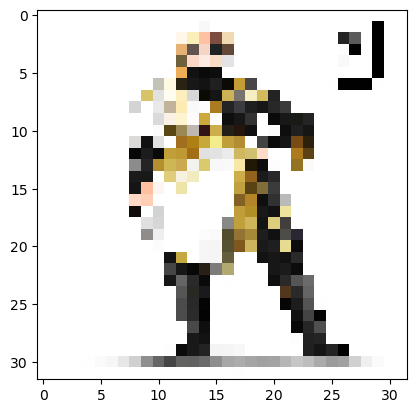

255
File saved successfully


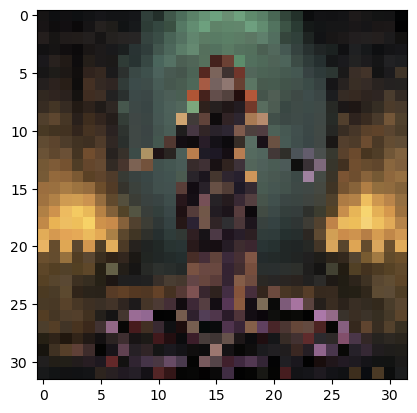

1.0
File saved successfully


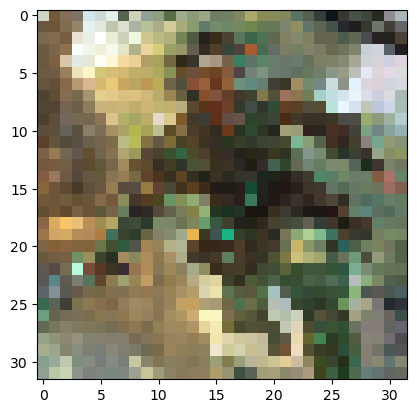

255
File saved successfully


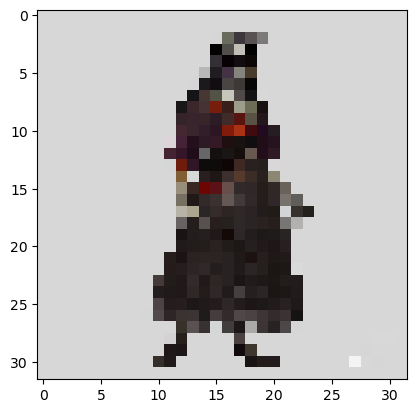

244
File saved successfully


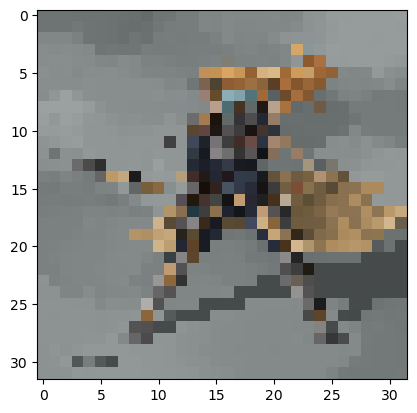

218
File saved successfully


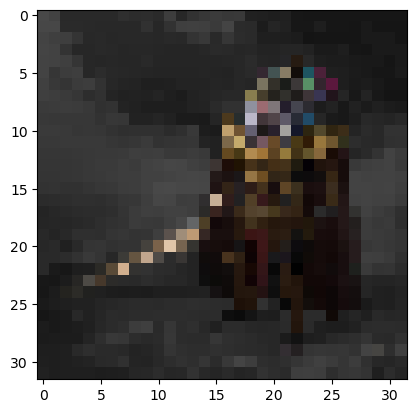

224
File saved successfully


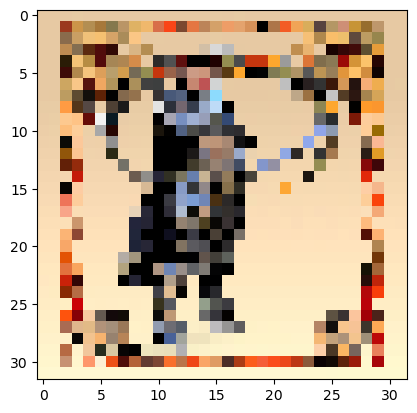

255
File saved successfully


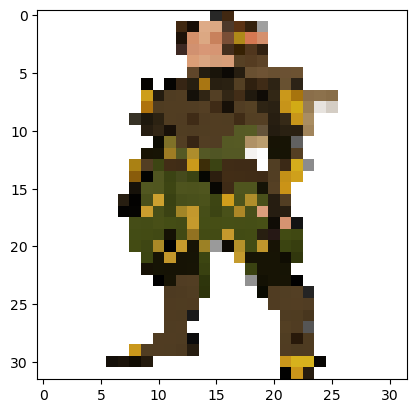

1.0
File saved successfully


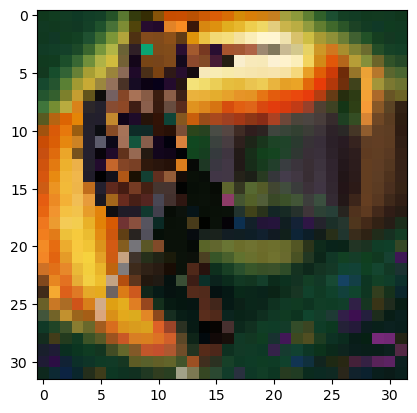

255
File saved successfully


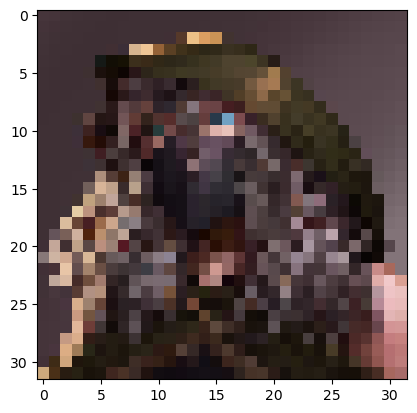

241
File saved successfully


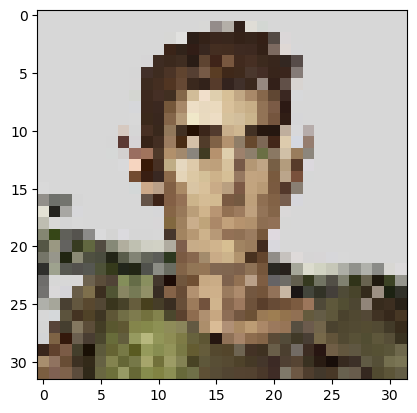

246
File saved successfully


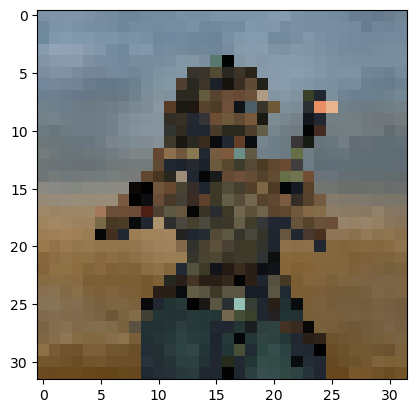

1.0
File saved successfully


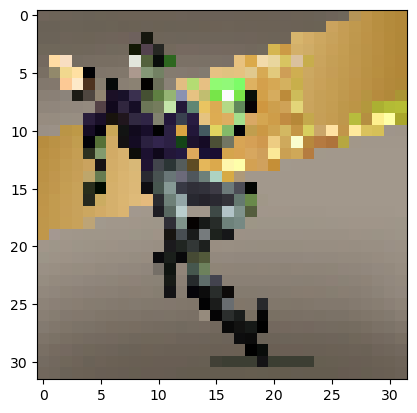

255
File saved successfully


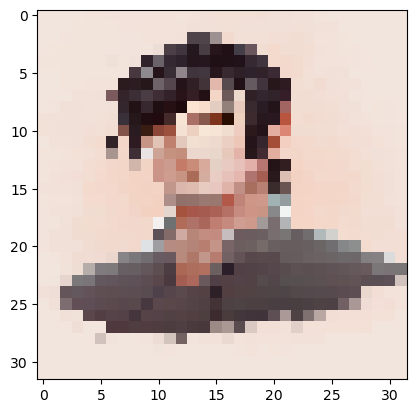

1.0
File saved successfully


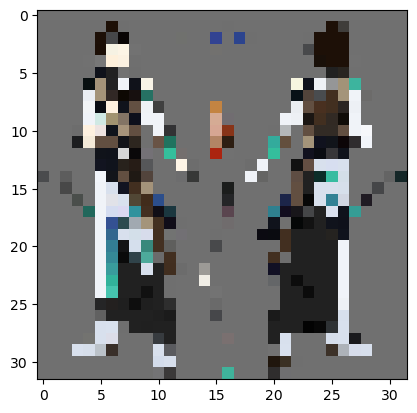

254
File saved successfully


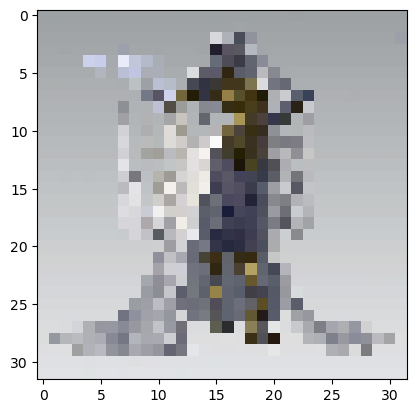

1.0
File saved successfully


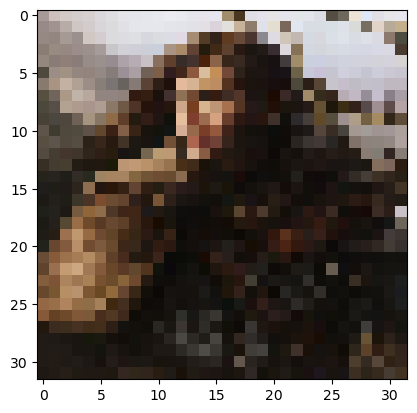

249
File saved successfully


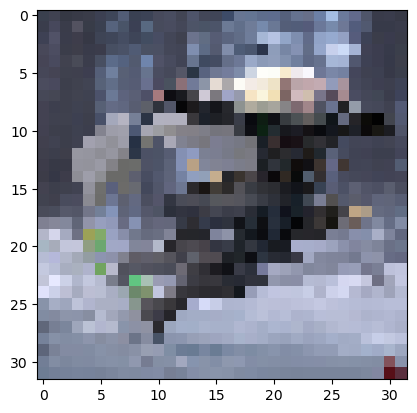

255
File saved successfully


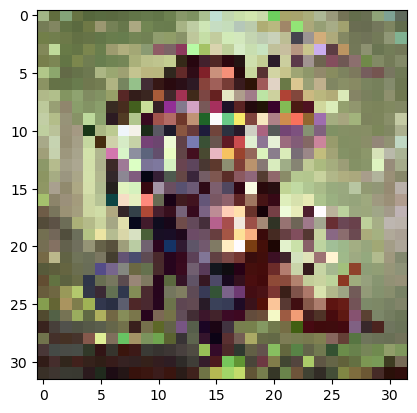

255
File saved successfully


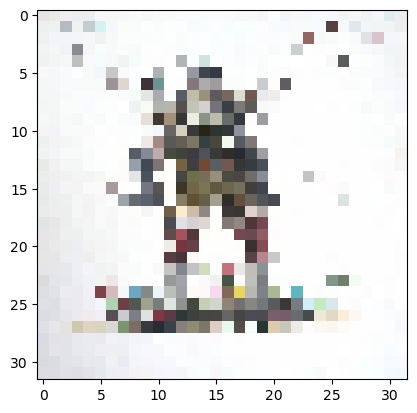

255
File saved successfully


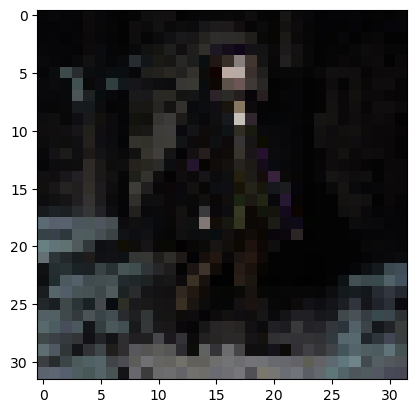

197
File saved successfully


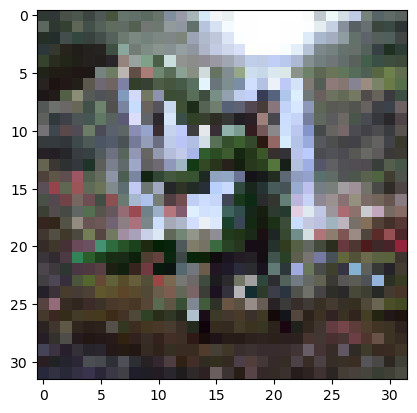

255
File saved successfully


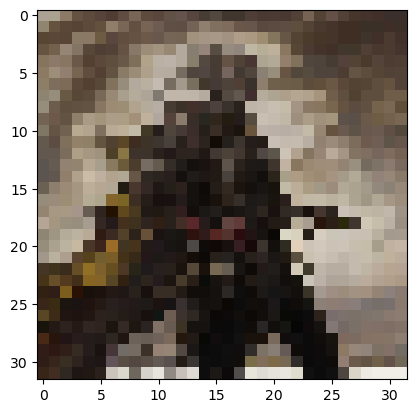

241
File saved successfully


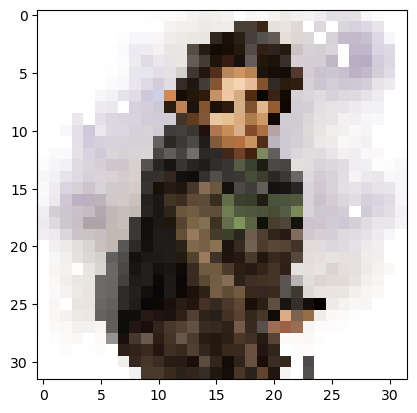

255
File saved successfully


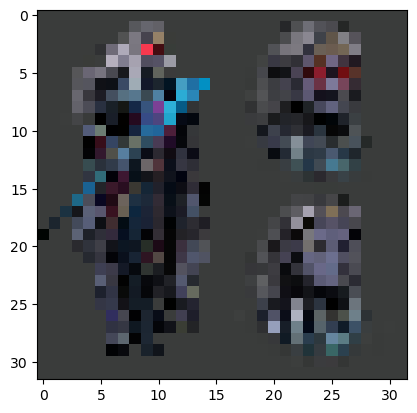

247
File saved successfully


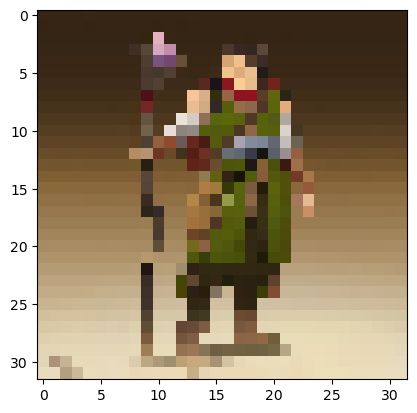

250
File saved successfully


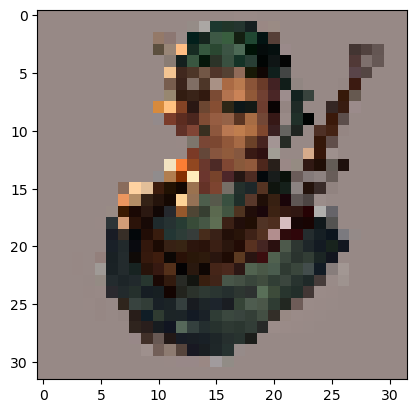

255
File saved successfully


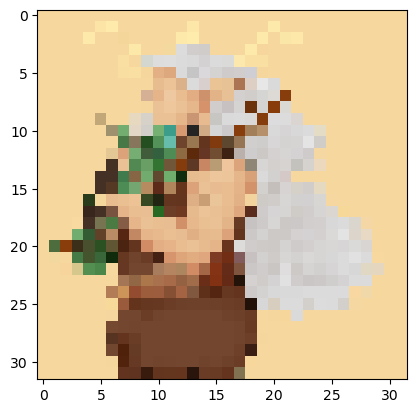

254
File saved successfully


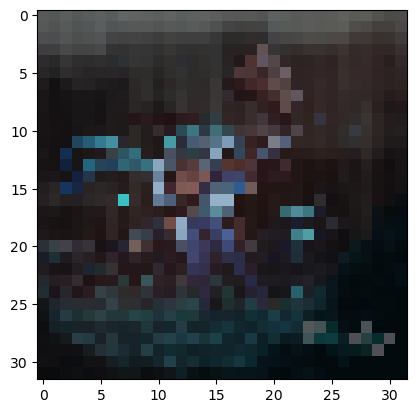

201
File saved successfully


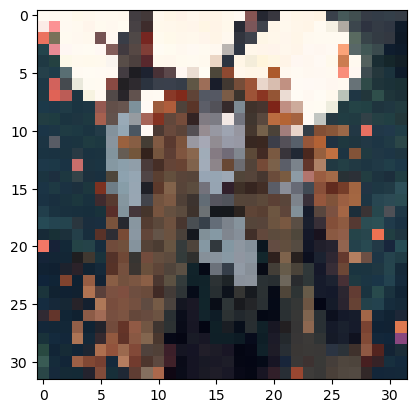

1.0
File saved successfully


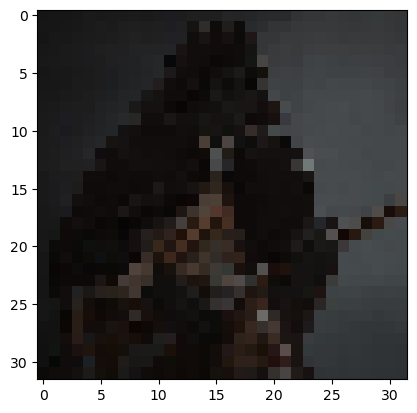

120
File saved successfully


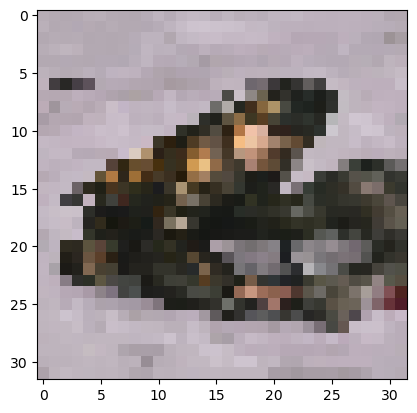

245
File saved successfully


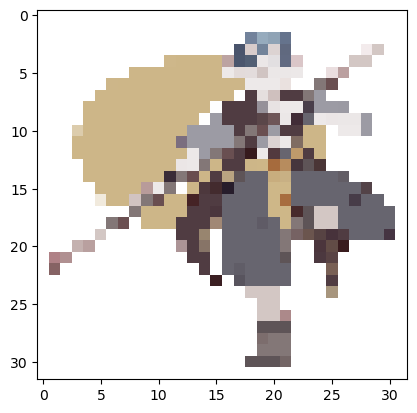

1.0
File saved successfully


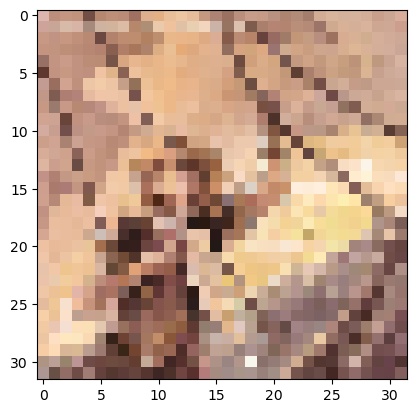

255
File saved successfully


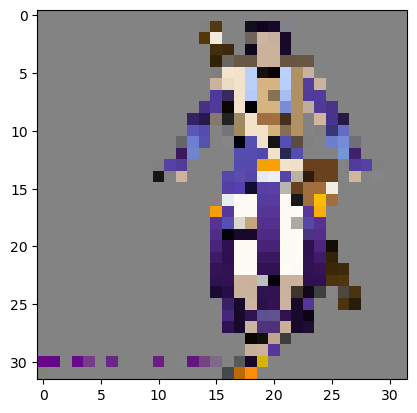

255
File saved successfully


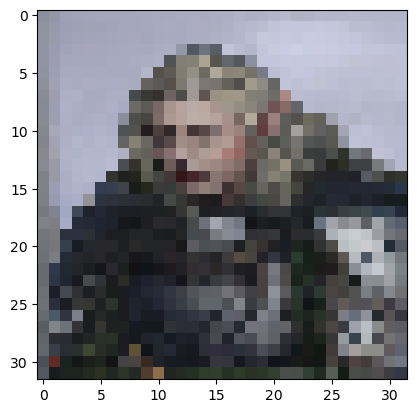

228
File saved successfully


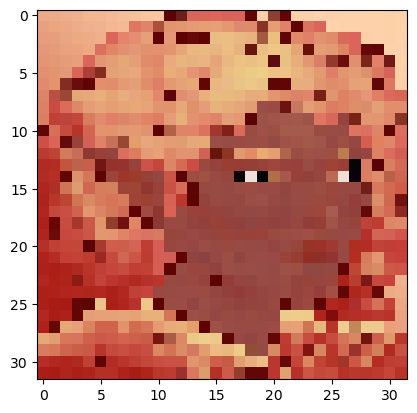

254
File saved successfully


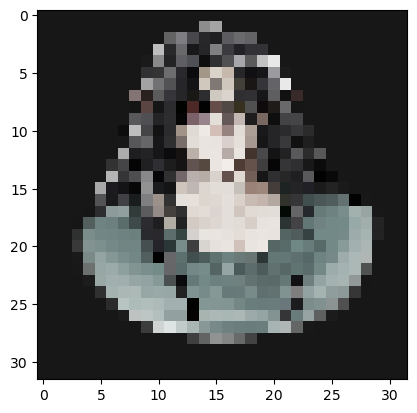

242
File saved successfully


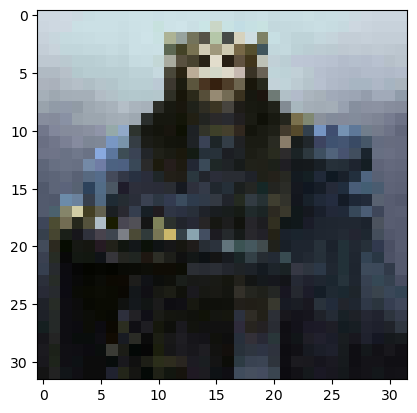

233
File saved successfully


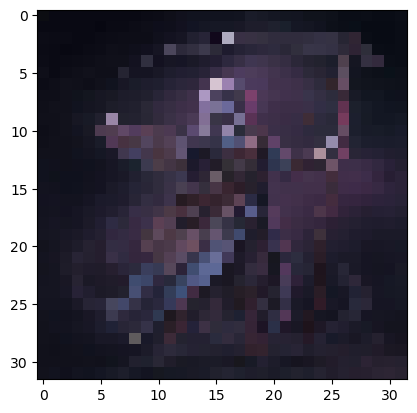

214
File saved successfully


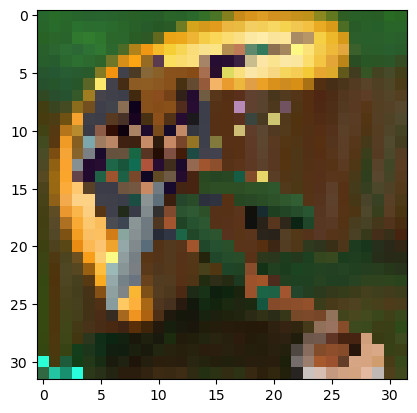

255
File saved successfully


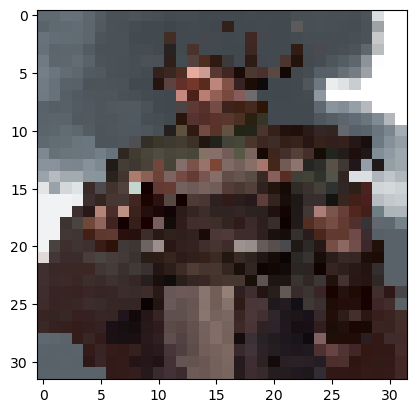

255
File saved successfully


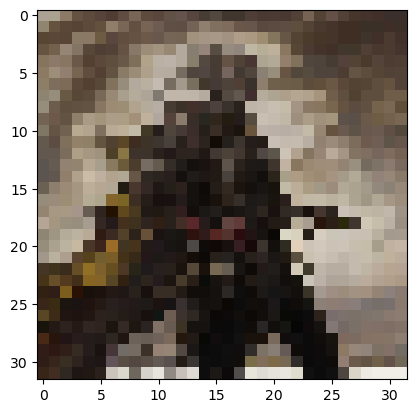

241
File saved successfully


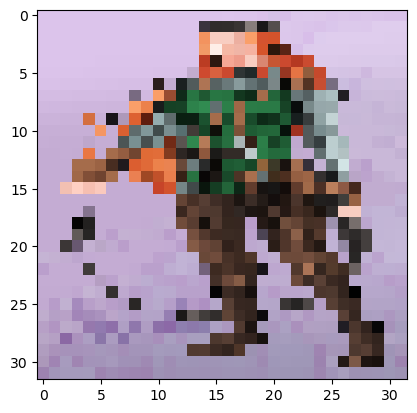

1.0
File saved successfully


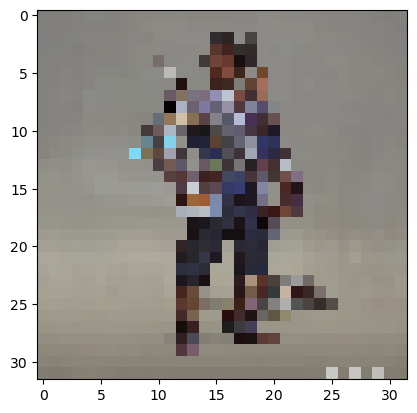

0.9606158
File saved successfully


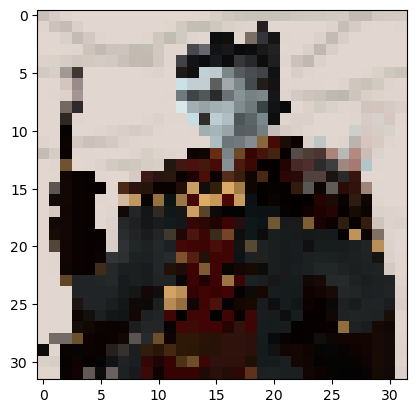

234
File saved successfully


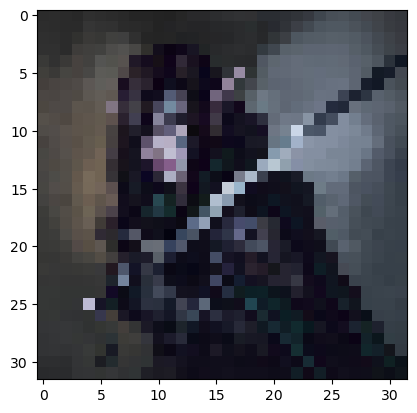

231
File saved successfully


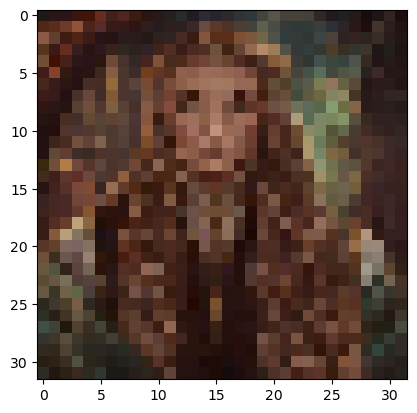

195
File saved successfully


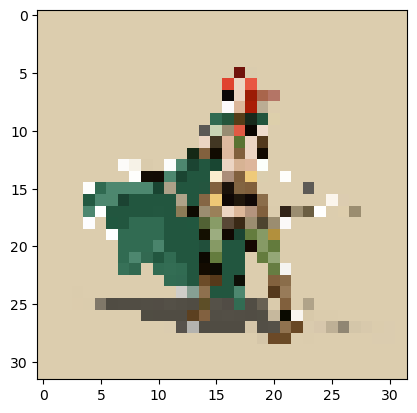

255
File saved successfully


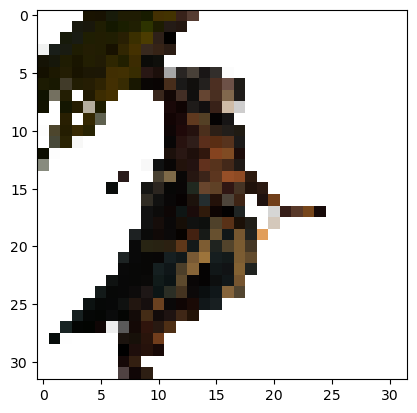

1.0
File saved successfully


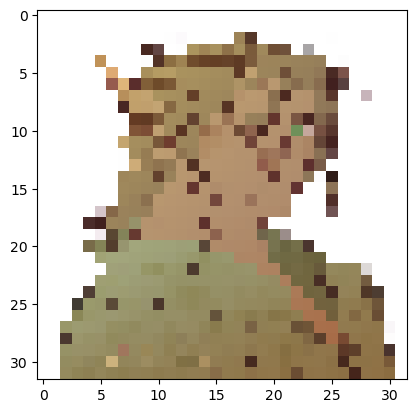

1.0
File saved successfully


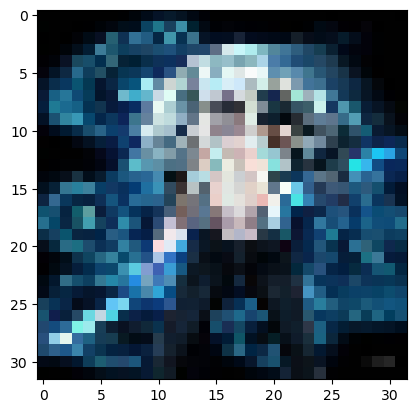

254
File saved successfully


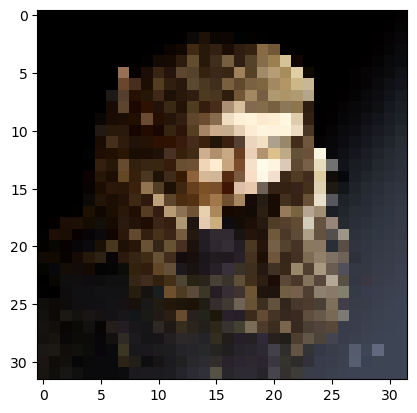

255
File saved successfully


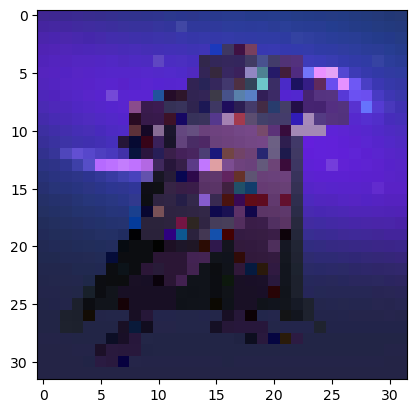

255
File saved successfully


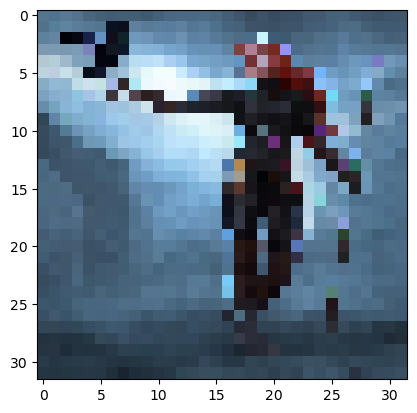

255
File saved successfully


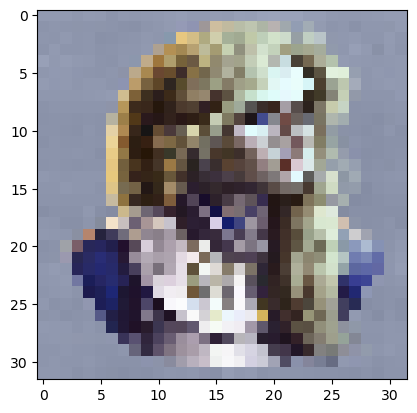

254
File saved successfully


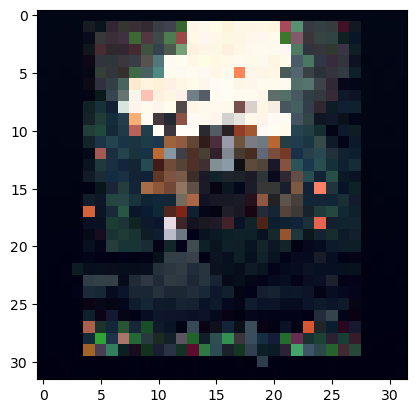

255
File saved successfully


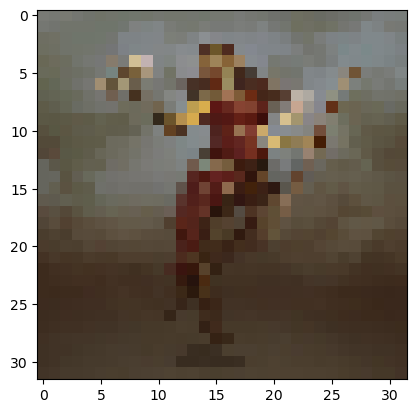

216
File saved successfully


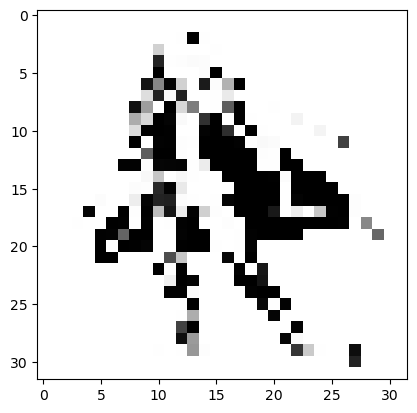

255
File saved successfully


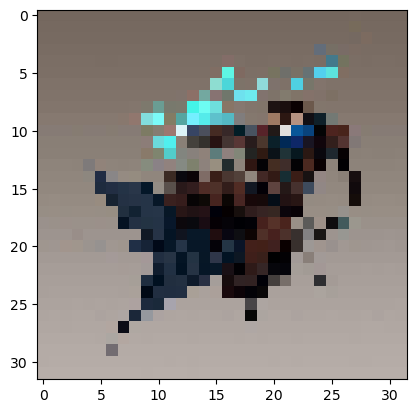

255
File saved successfully


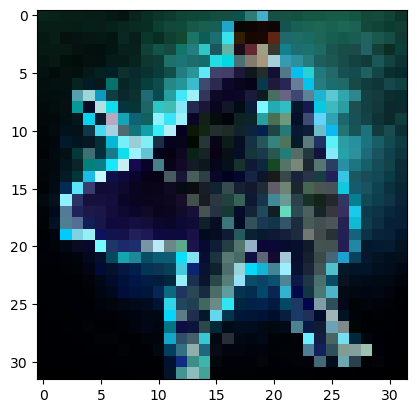

255
File saved successfully


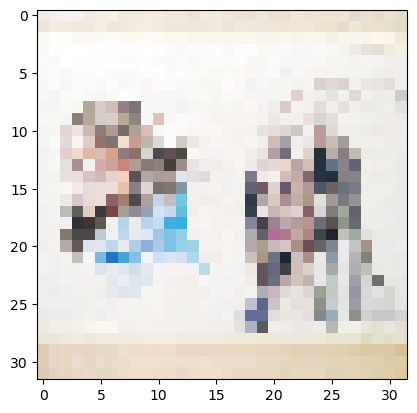

255
File saved successfully


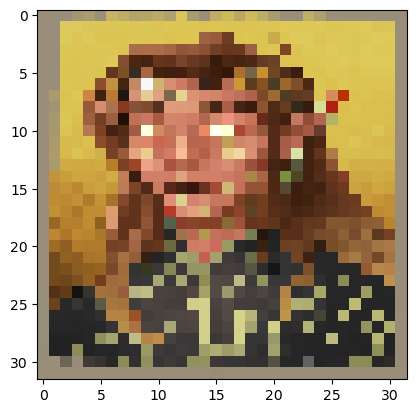

1.0
File saved successfully


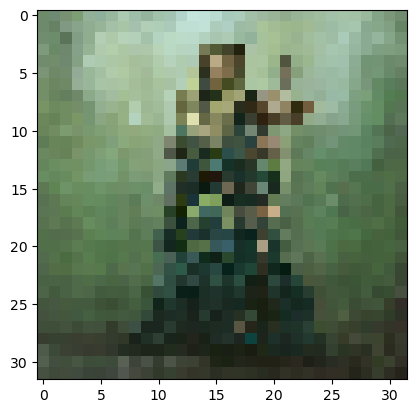

229
File saved successfully


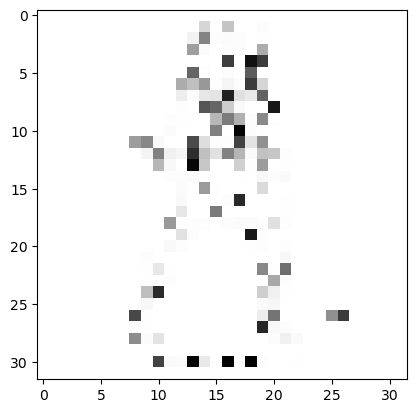

255
File saved successfully


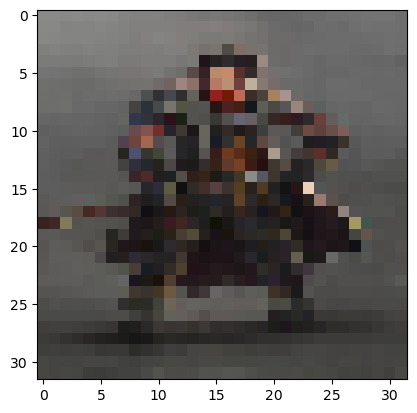

235
File saved successfully


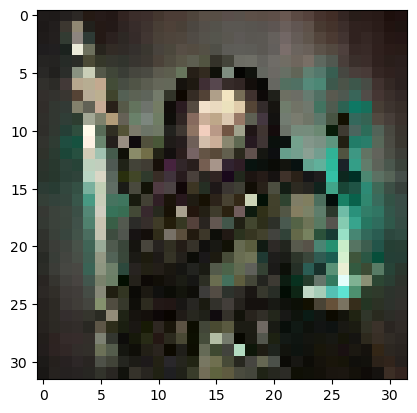

255
File saved successfully


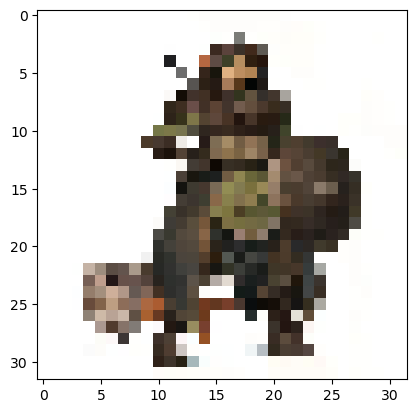

255
File saved successfully


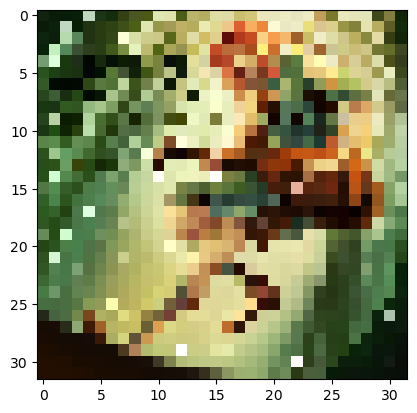

255
File saved successfully


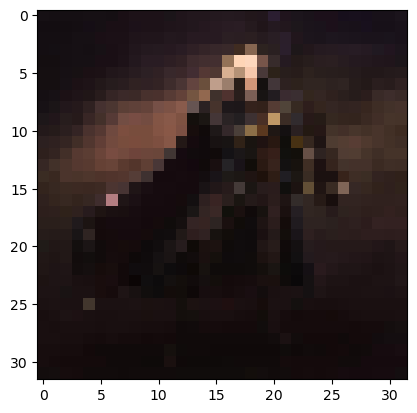

255
File saved successfully


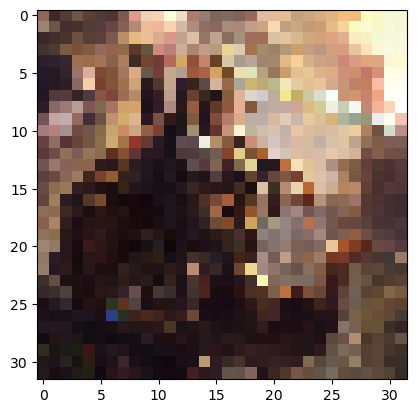

255
File saved successfully


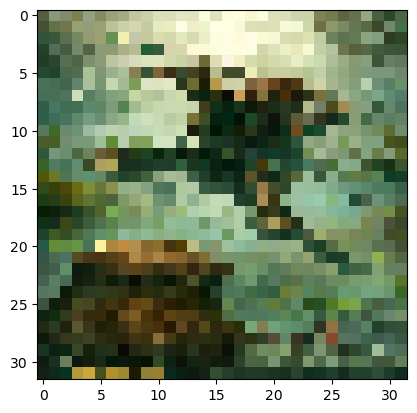

255
File saved successfully


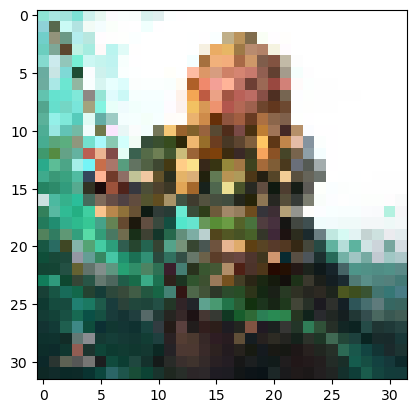

255
File saved successfully


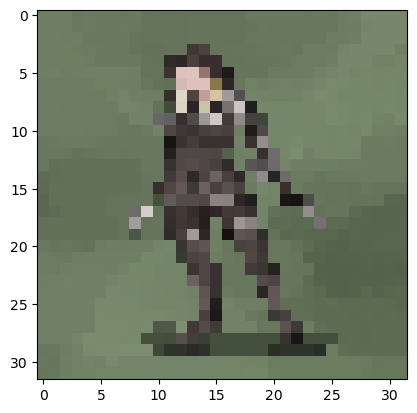

222
File saved successfully


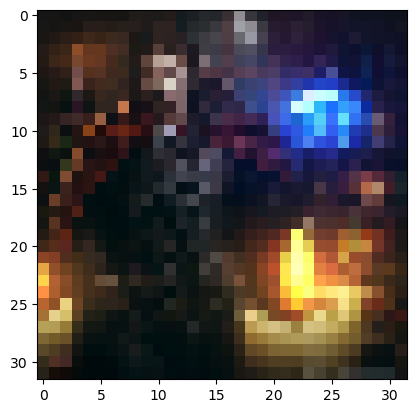

255
File saved successfully


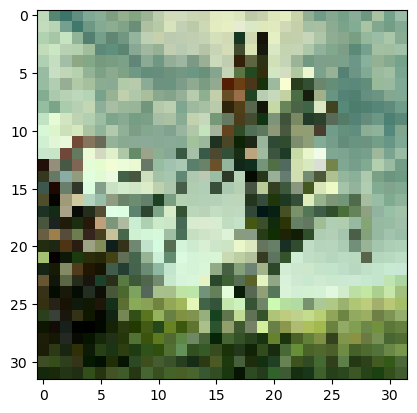

255
File saved successfully


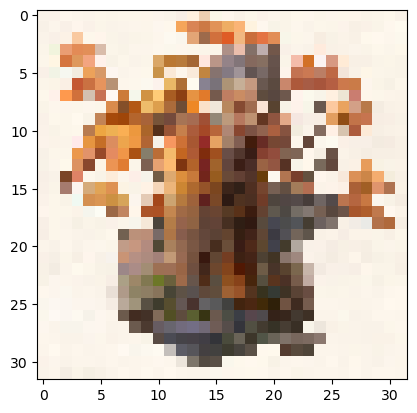

255
File saved successfully


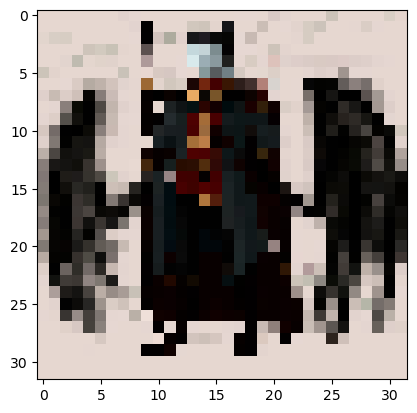

239
File saved successfully


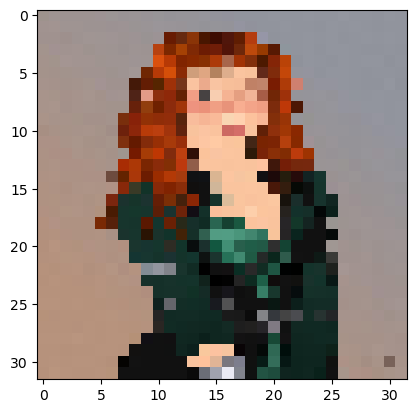

255
File saved successfully


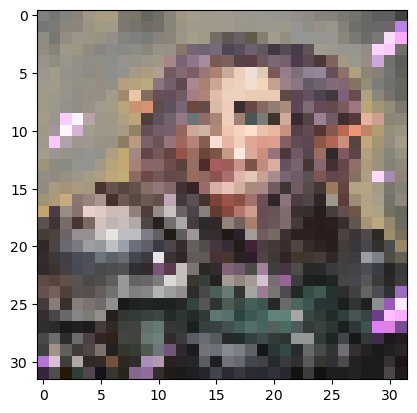

255
File saved successfully


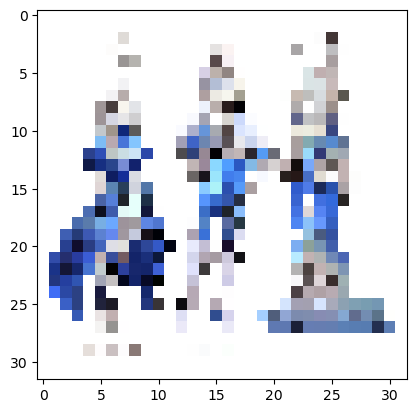

255
File saved successfully


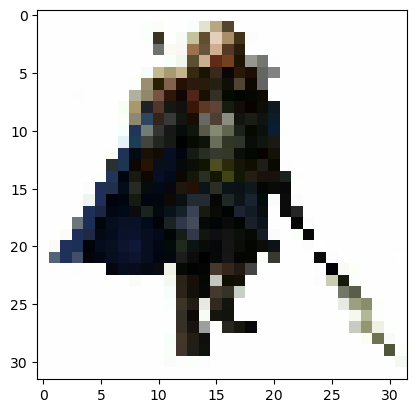

255
File saved successfully


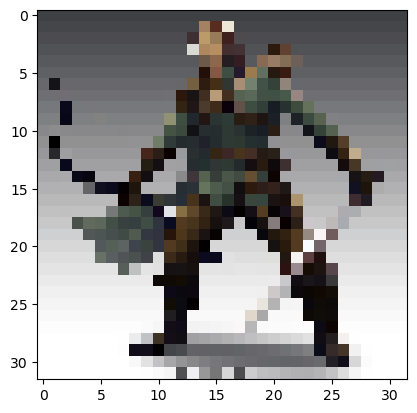

255
File saved successfully


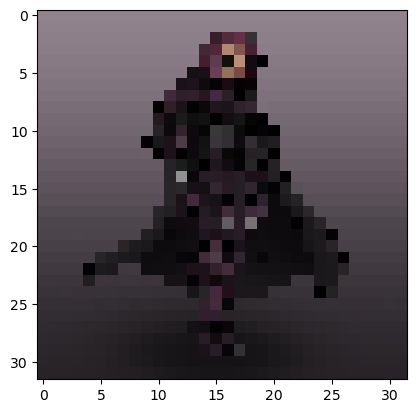

185
File saved successfully


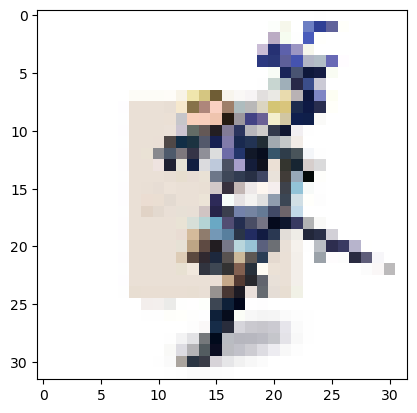

255
File saved successfully


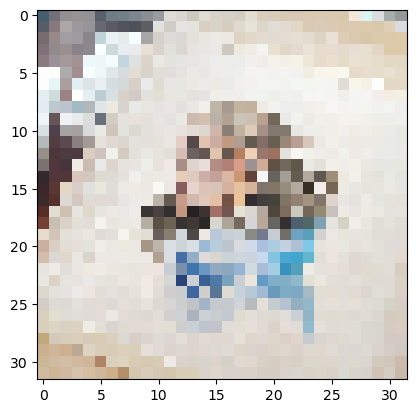

255
File saved successfully


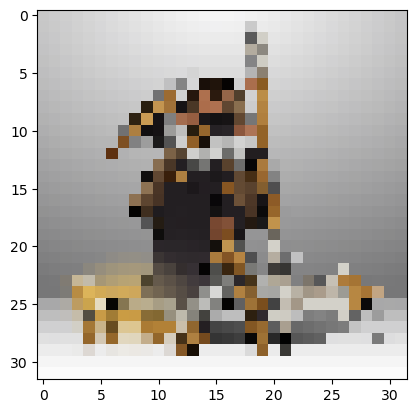

0.9879289
File saved successfully


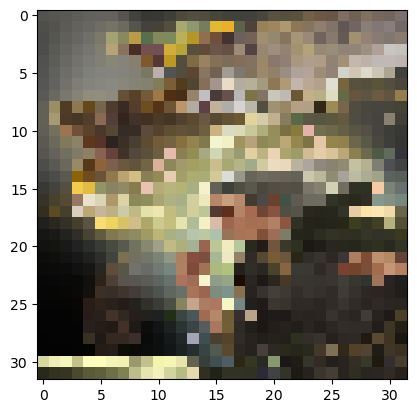

254
File saved successfully


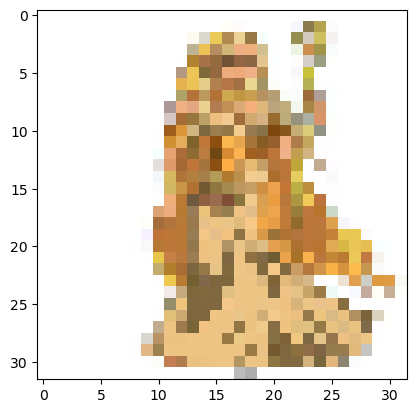

255
File saved successfully


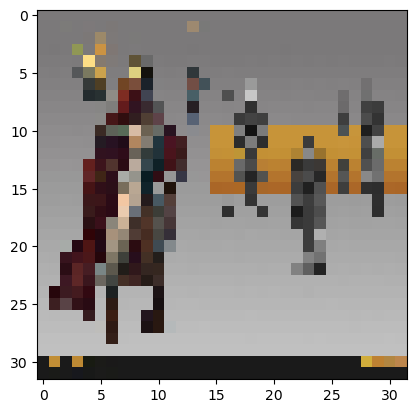

253
File saved successfully


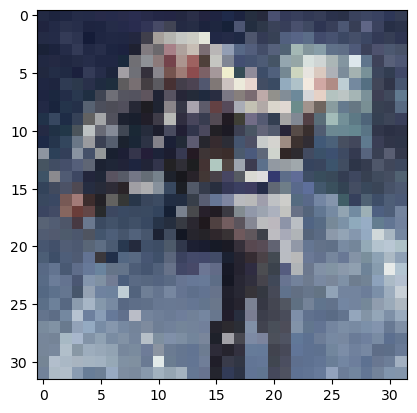

242
File saved successfully


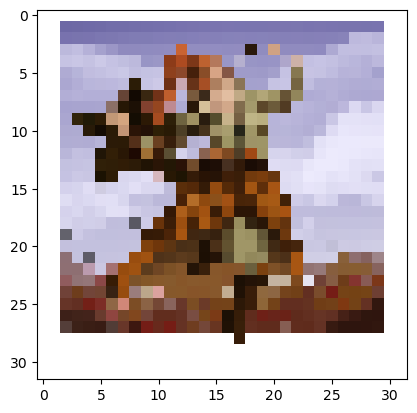

1.0
File saved successfully


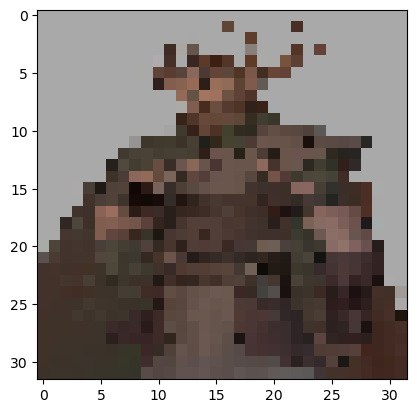

175
File saved successfully


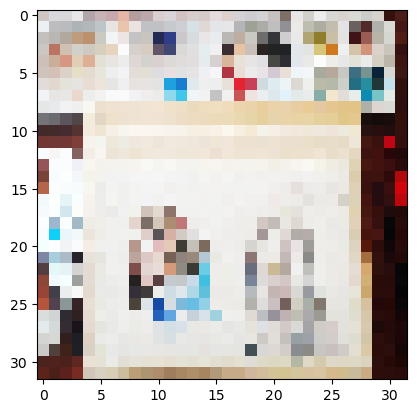

255
File saved successfully


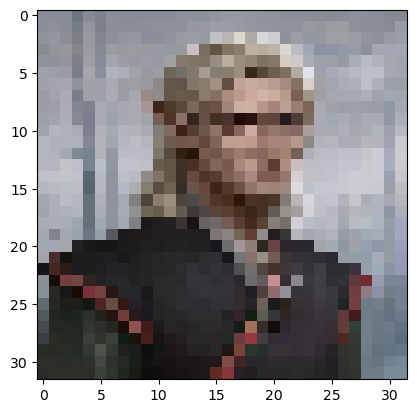

234
File saved successfully


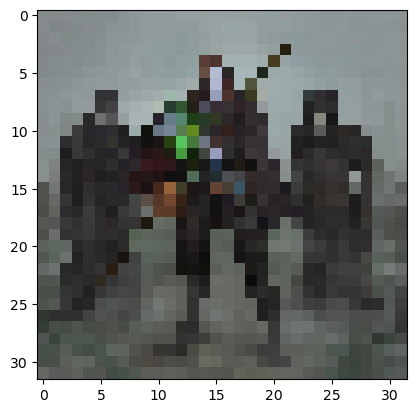

209
File saved successfully


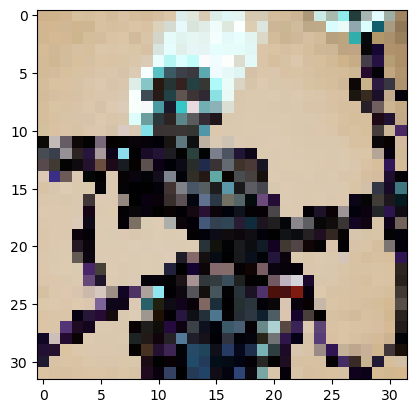

255
File saved successfully


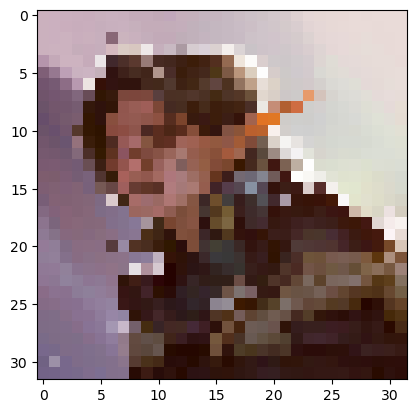

254
File saved successfully


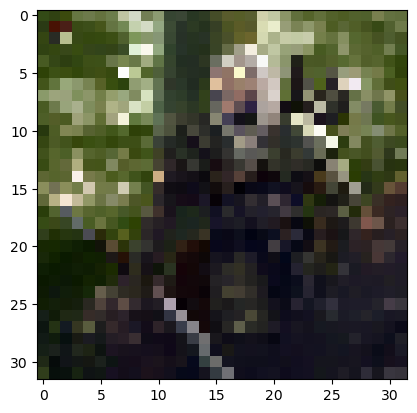

254
File saved successfully


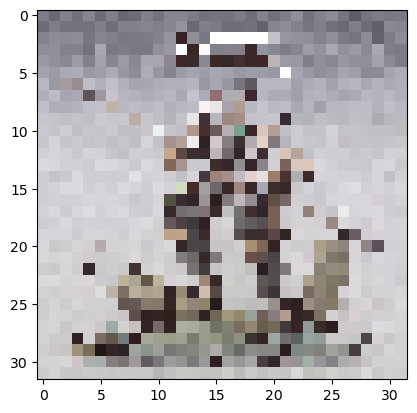

255
File saved successfully


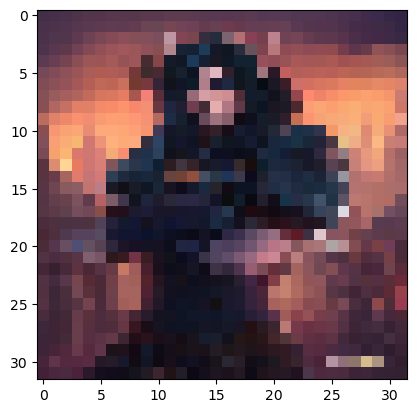

255
File saved successfully


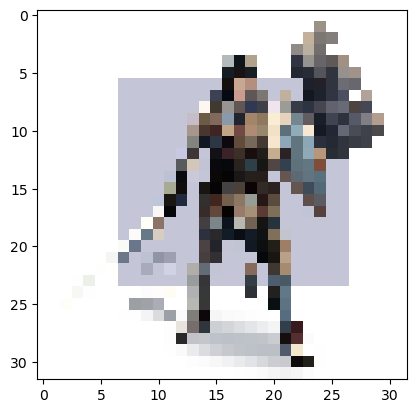

255
File saved successfully


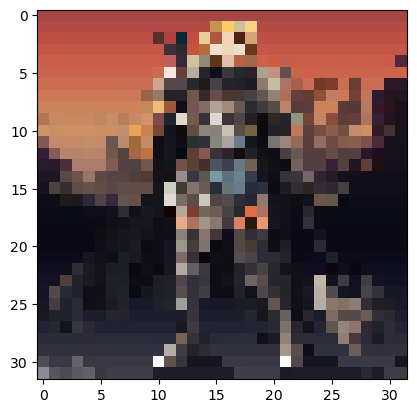

255
File saved successfully


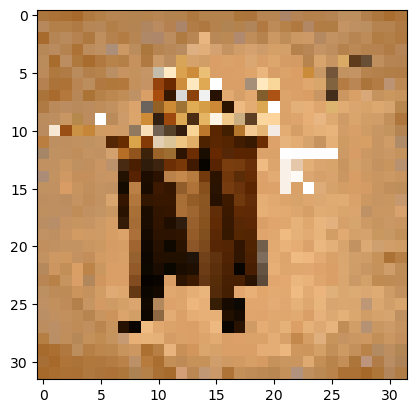

255
File saved successfully


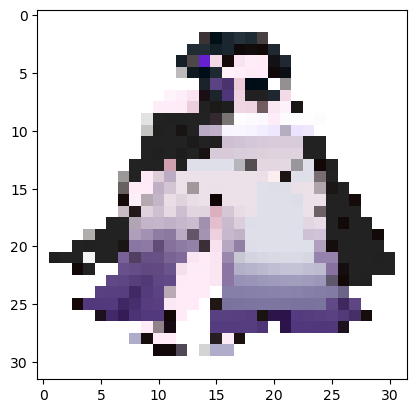

1.0
File saved successfully


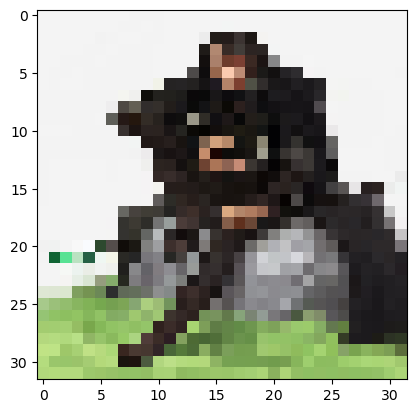

254
File saved successfully


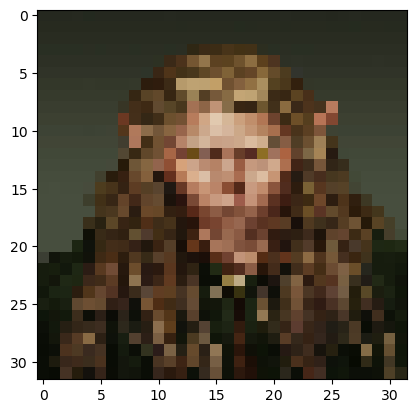

225
File saved successfully


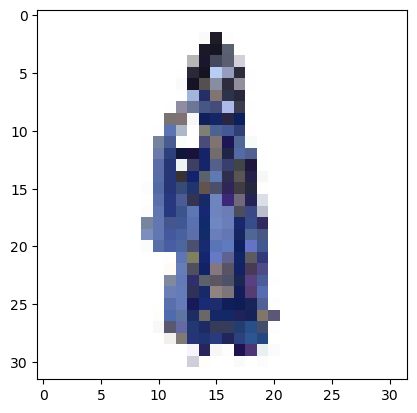

255
File saved successfully


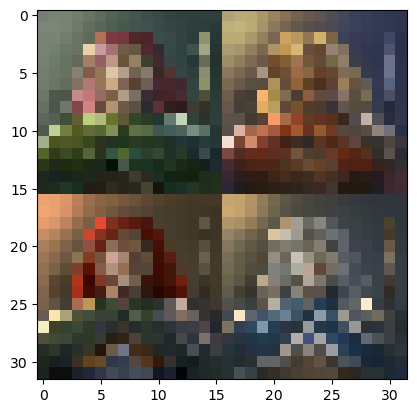

253
File saved successfully


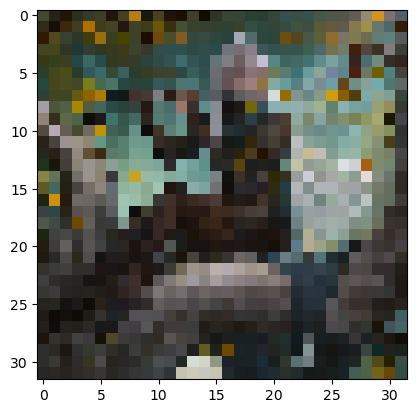

228
File saved successfully


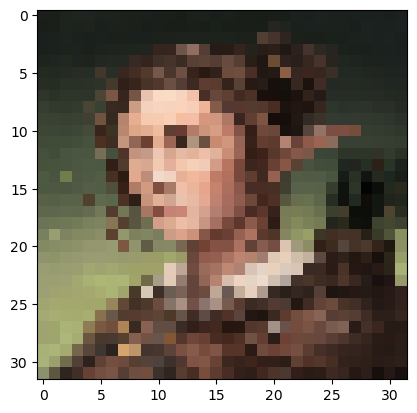

0.9810049
File saved successfully


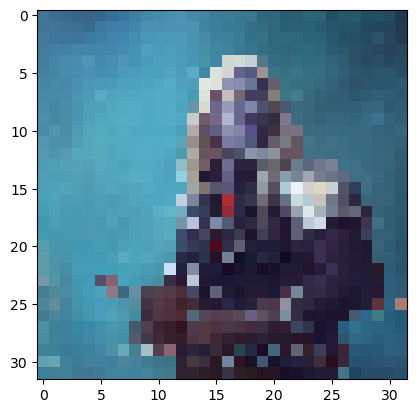

246
File saved successfully


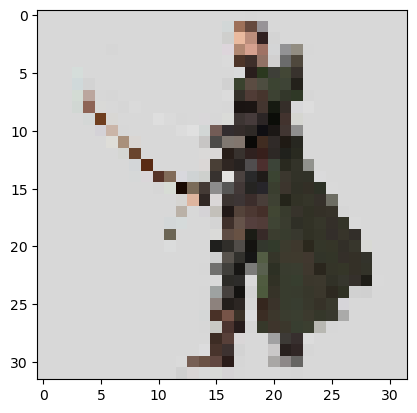

234
File saved successfully


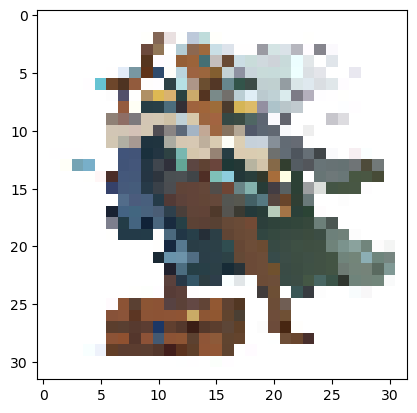

255
File saved successfully


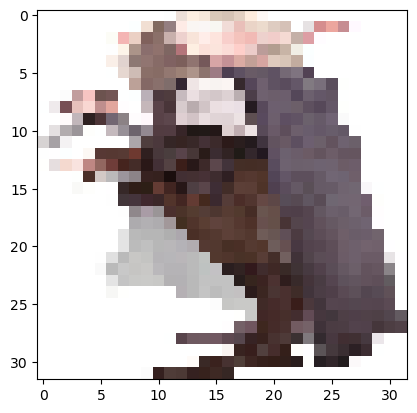

255
File saved successfully


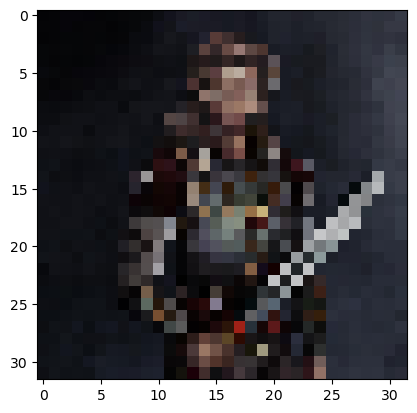

201
File saved successfully


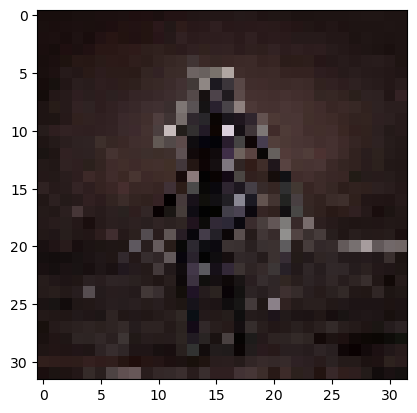

219
File saved successfully


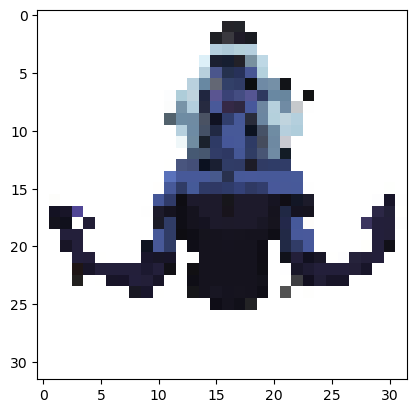

255
File saved successfully


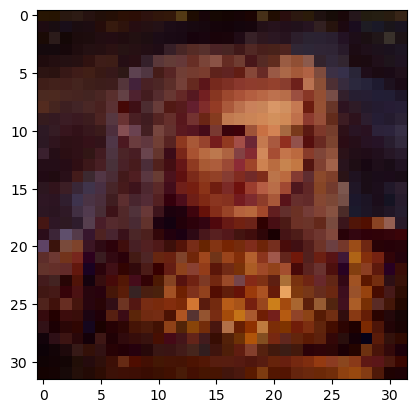

234
File saved successfully


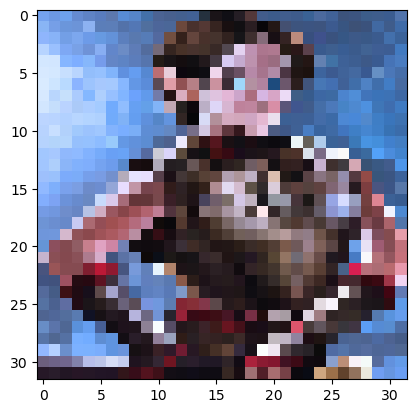

255
File saved successfully


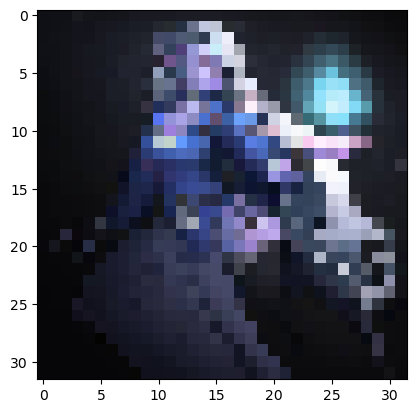

255
File saved successfully


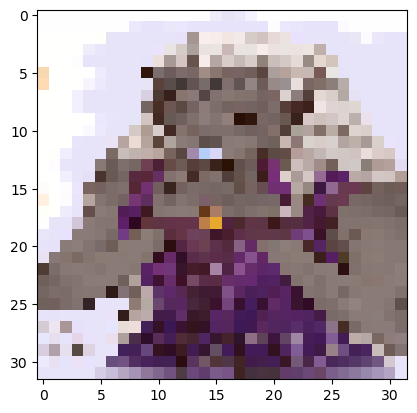

255
File saved successfully


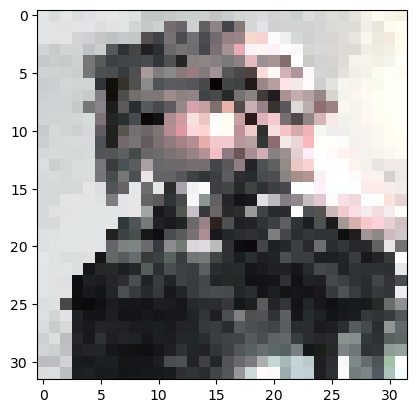

255
File saved successfully


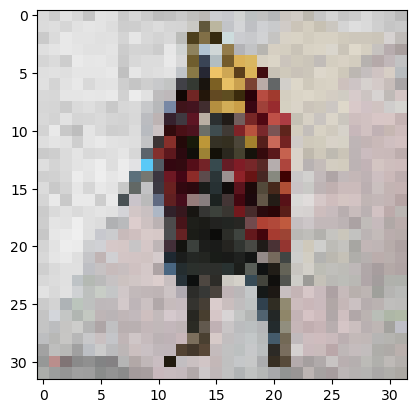

247
File saved successfully


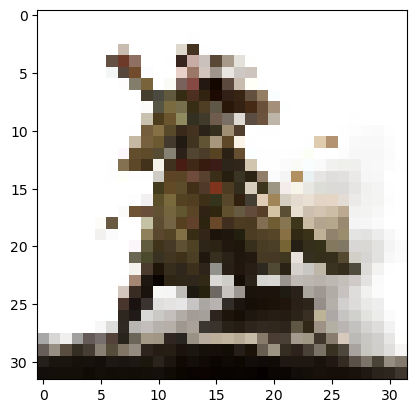

255
File saved successfully


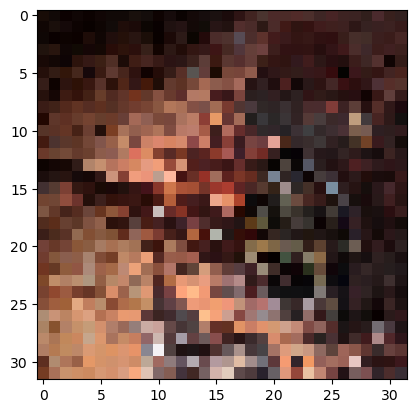

255
File saved successfully


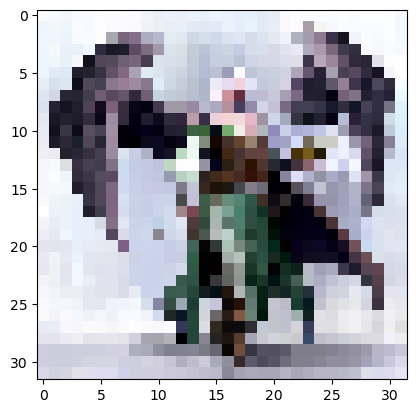

255
File saved successfully


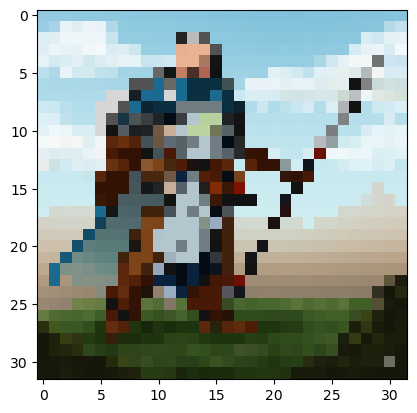

0.98039216
File saved successfully


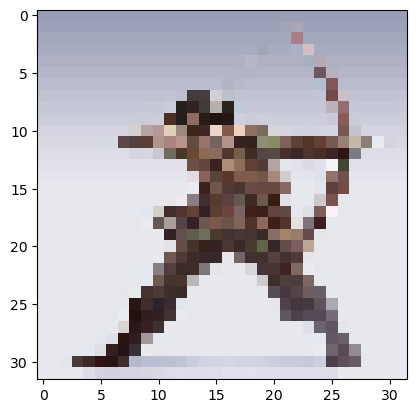

248
File saved successfully


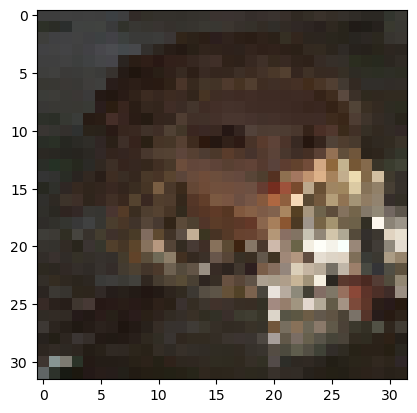

255
File saved successfully


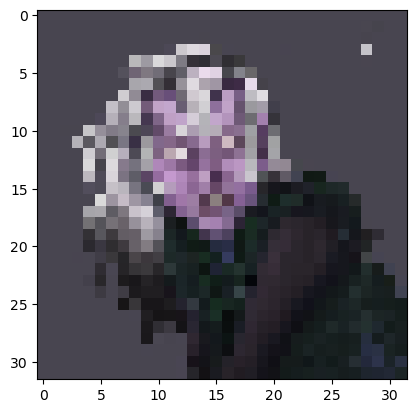

236
File saved successfully


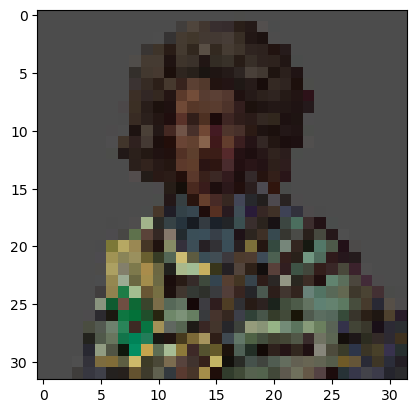

205
File saved successfully


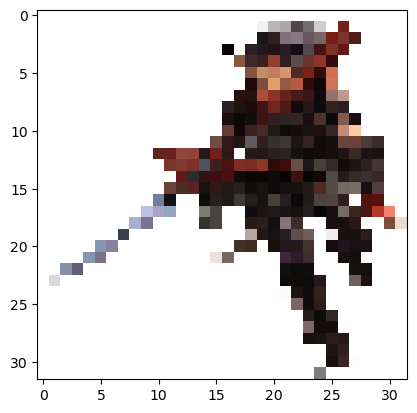

1.0
File saved successfully


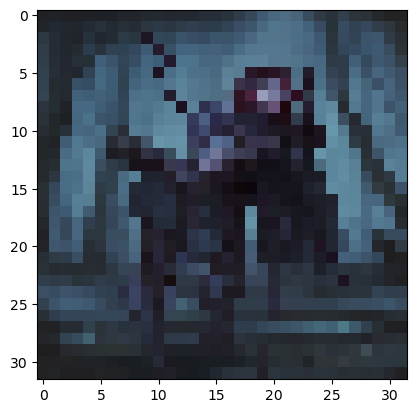

1.0
File saved successfully


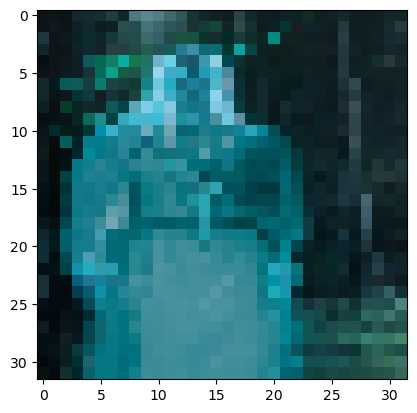

238
File saved successfully


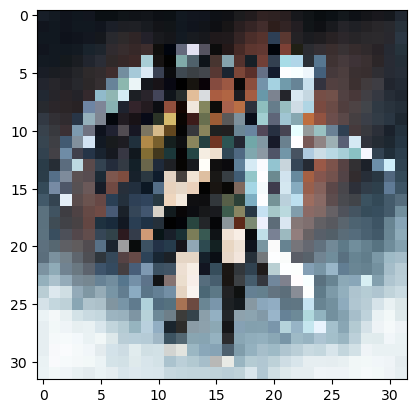

255
File saved successfully


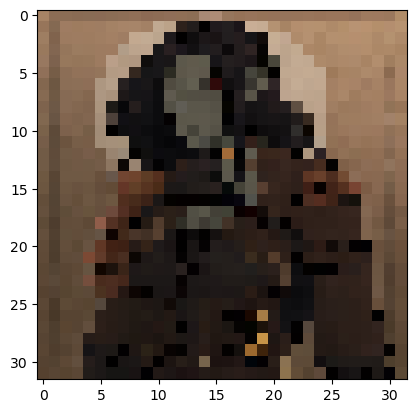

201
File saved successfully


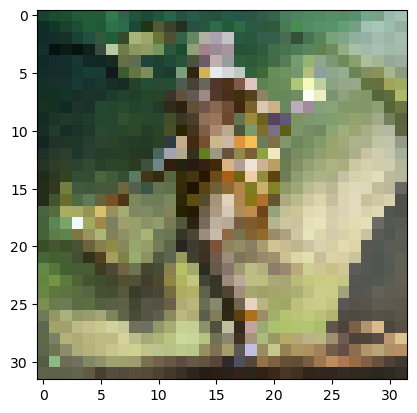

253
File saved successfully


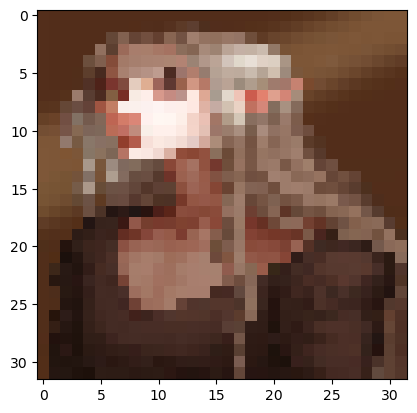

255
File saved successfully


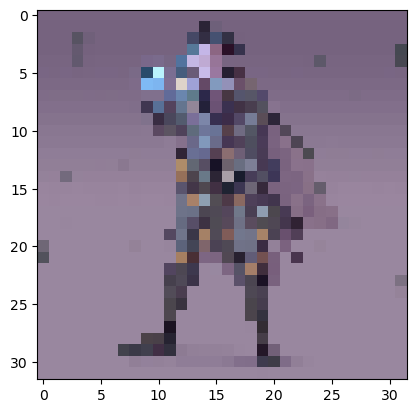

253
File saved successfully


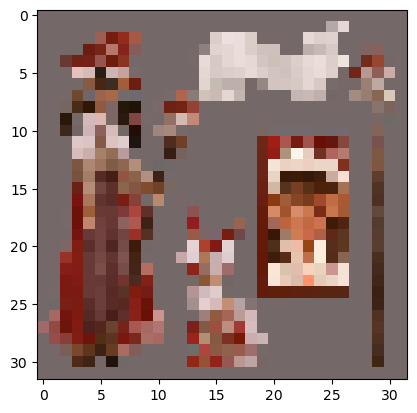

254
File saved successfully


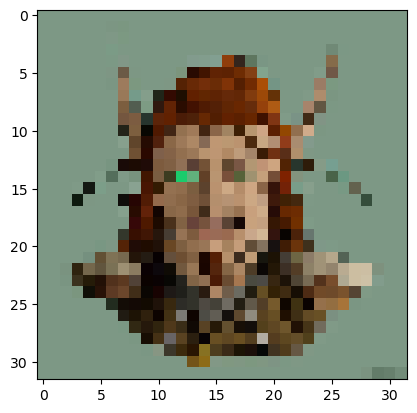

211
File saved successfully


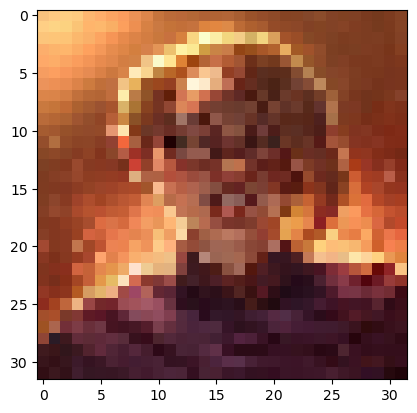

255
File saved successfully


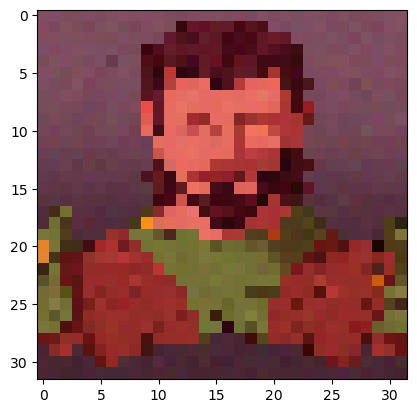

253
File saved successfully


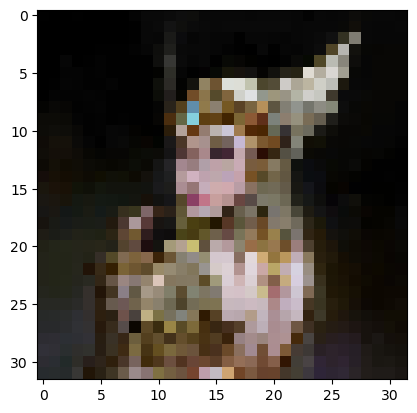

227
File saved successfully


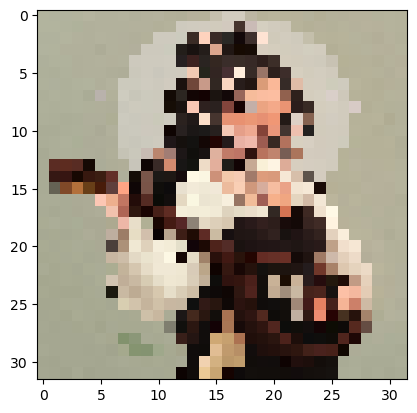

255
File saved successfully


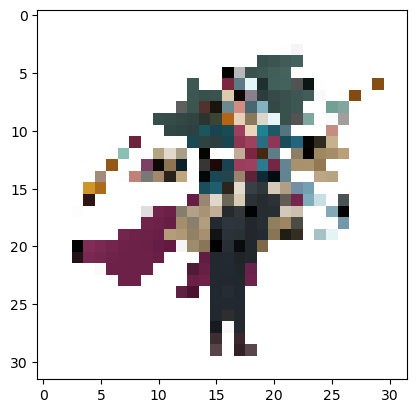

255
File saved successfully


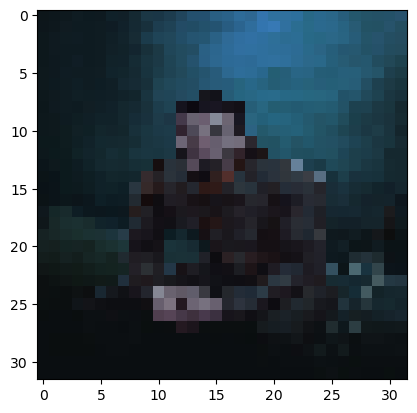

1.0
File saved successfully


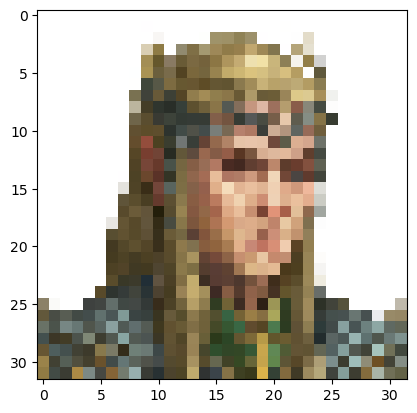

255
File saved successfully


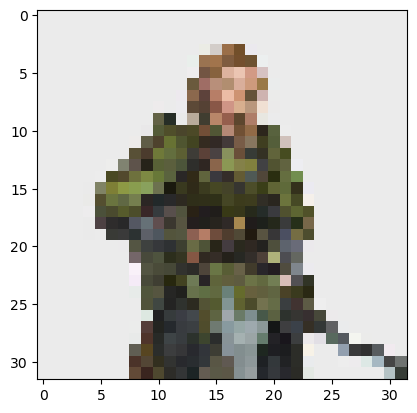

249
File saved successfully


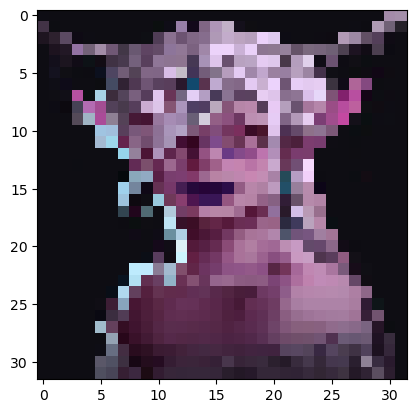

253
File saved successfully


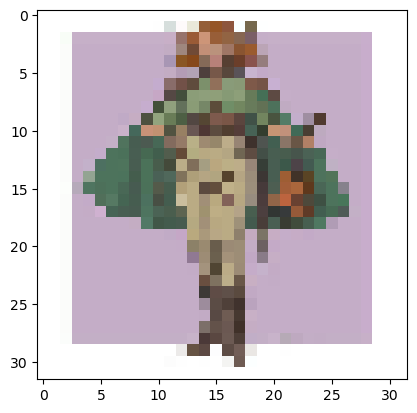

255
File saved successfully


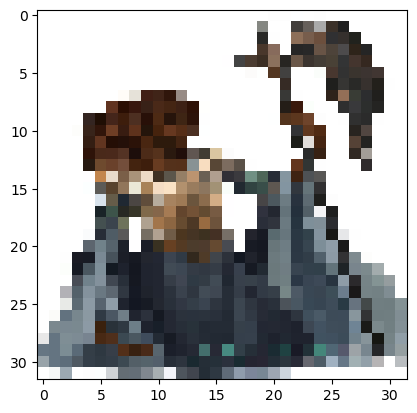

255
File saved successfully


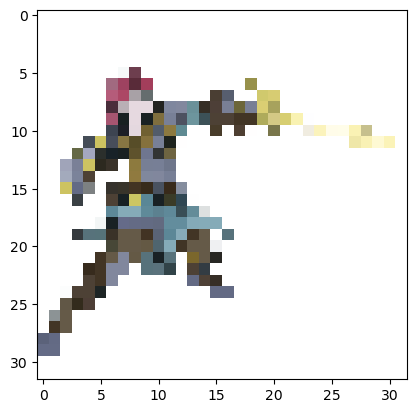

255
File saved successfully


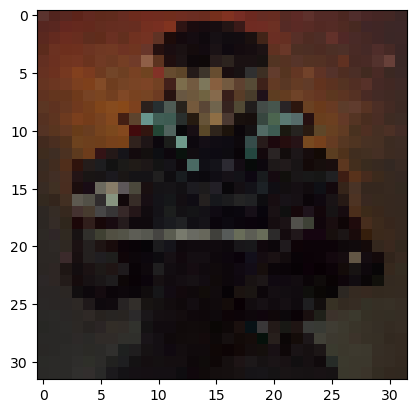

154
File saved successfully


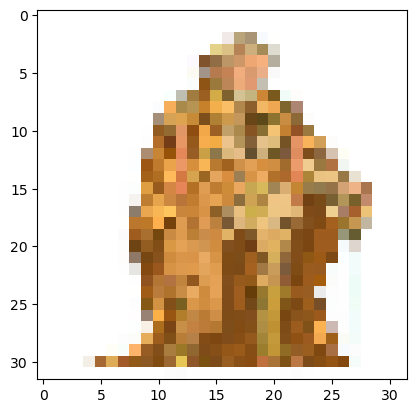

255
File saved successfully


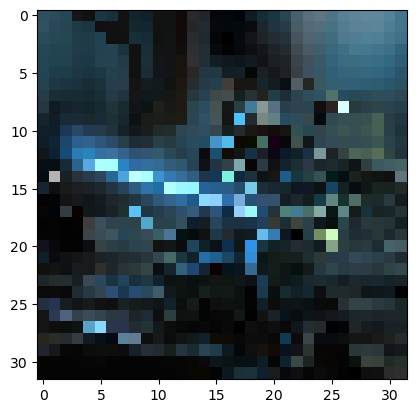

255
File saved successfully


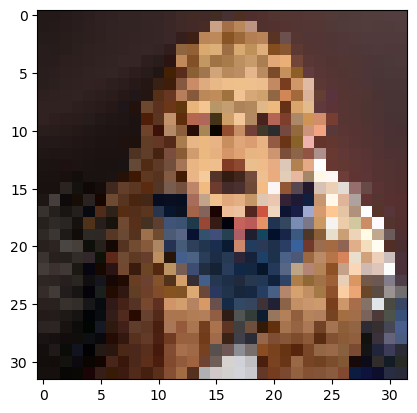

255
File saved successfully


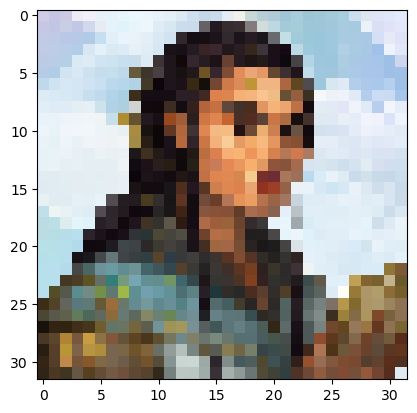

255
File saved successfully


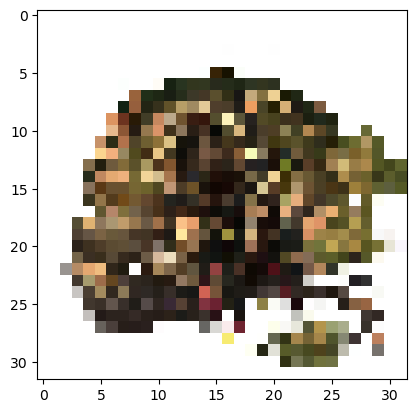

255
File saved successfully


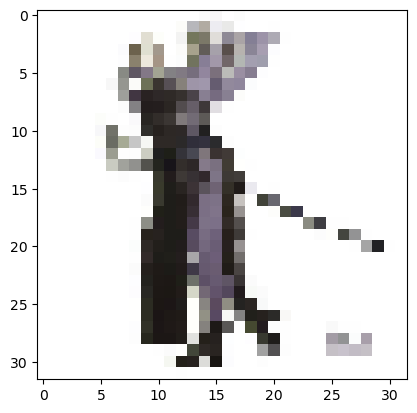

255
File saved successfully


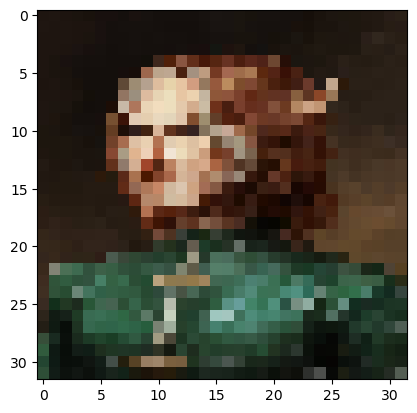

242
File saved successfully


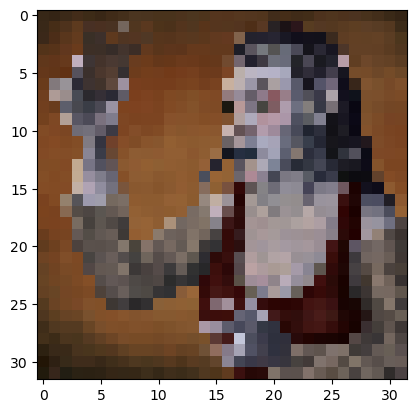

217
File saved successfully


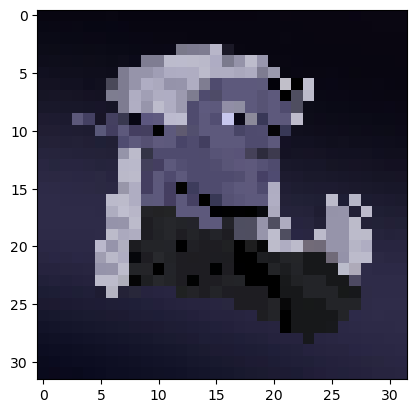

238
File saved successfully


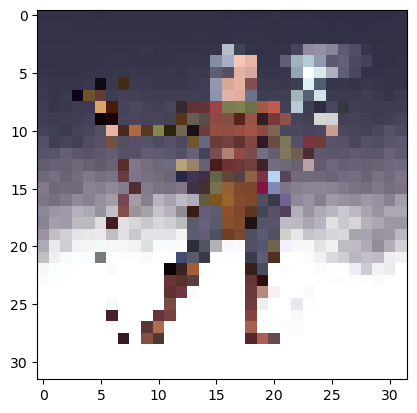

255
File saved successfully


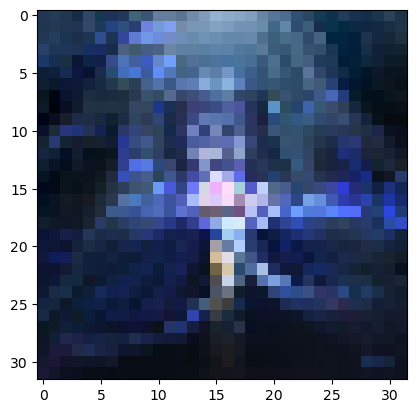

255
File saved successfully


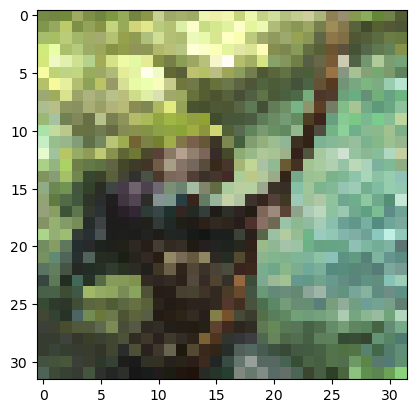

255
File saved successfully


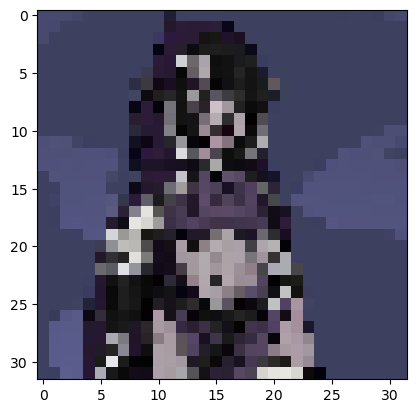

235
File saved successfully


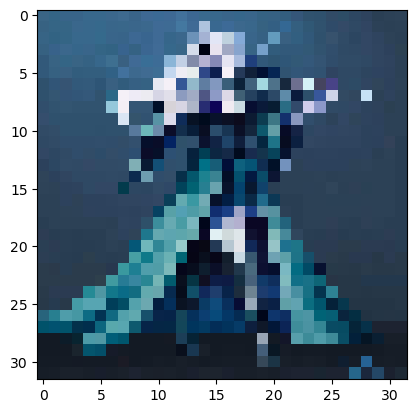

247
File saved successfully


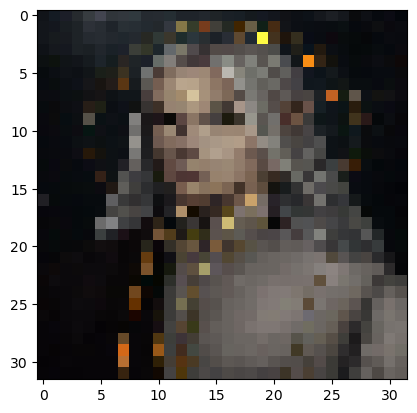

255
File saved successfully


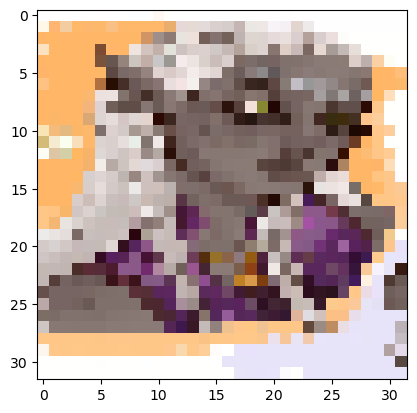

255
File saved successfully


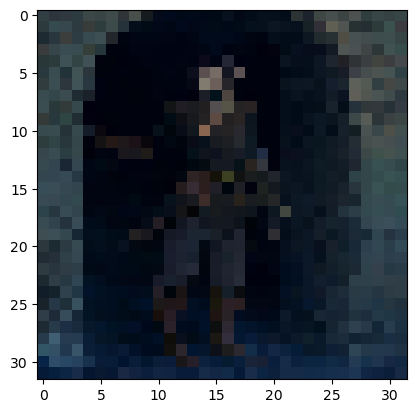

137
File saved successfully


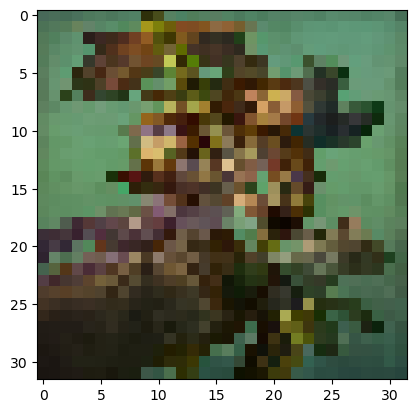

221
File saved successfully


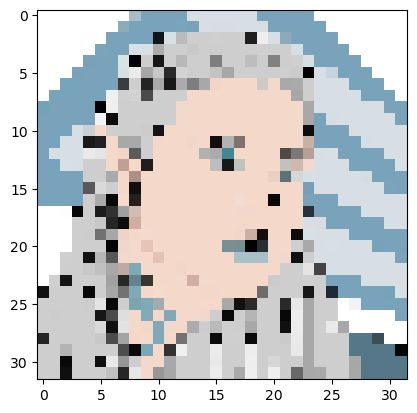

255
File saved successfully


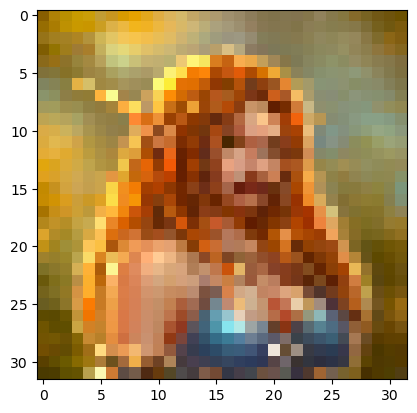

255
File saved successfully


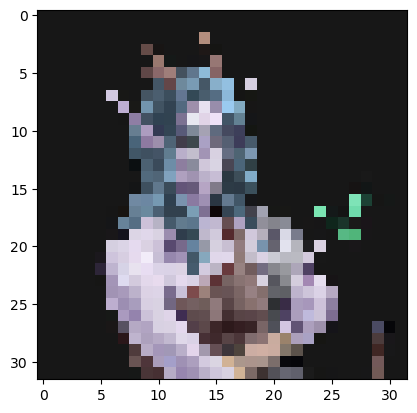

249
File saved successfully


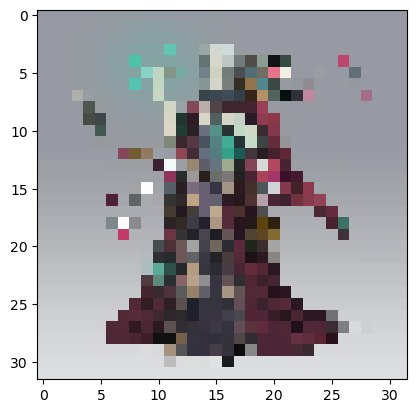

253
File saved successfully


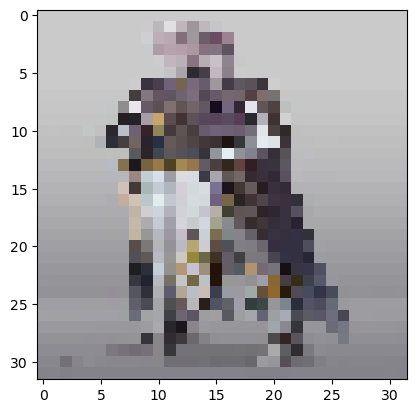

243
File saved successfully


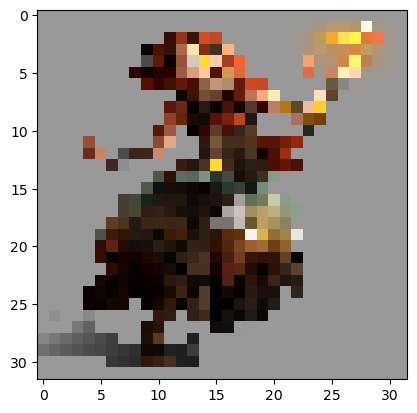

1.0
File saved successfully


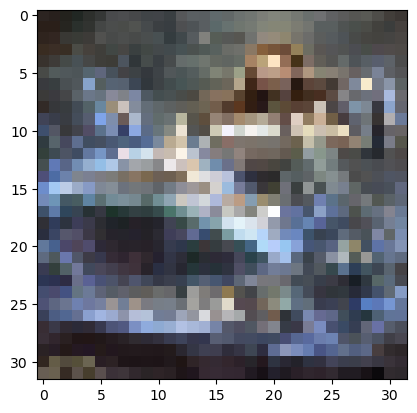

254
File saved successfully


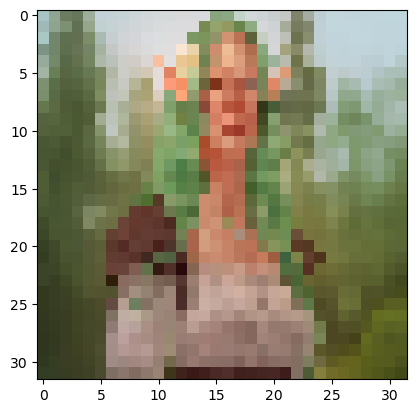

255
File saved successfully


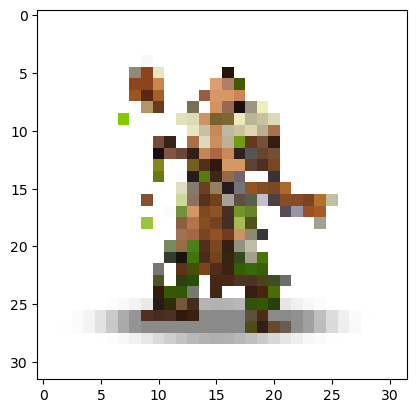

1.0
File saved successfully


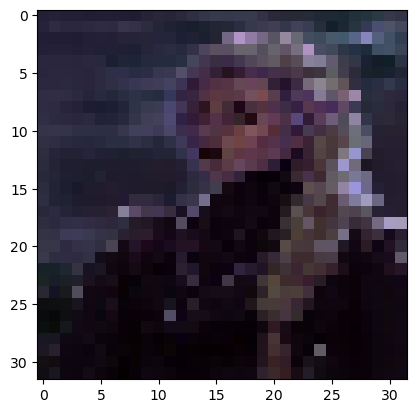

220
File saved successfully


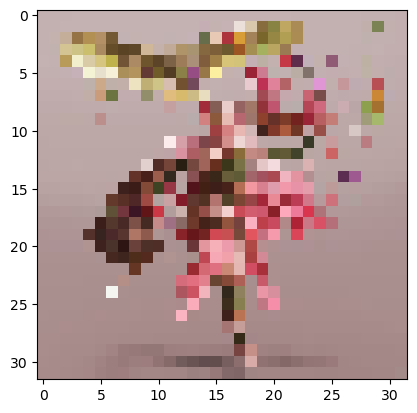

254
File saved successfully


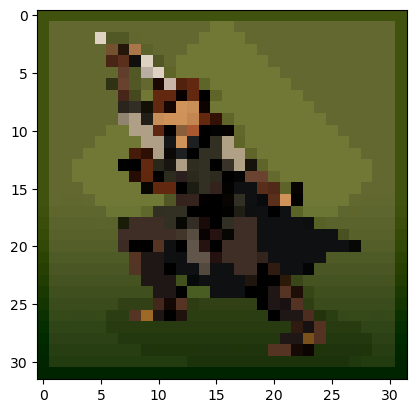

1.0
File saved successfully


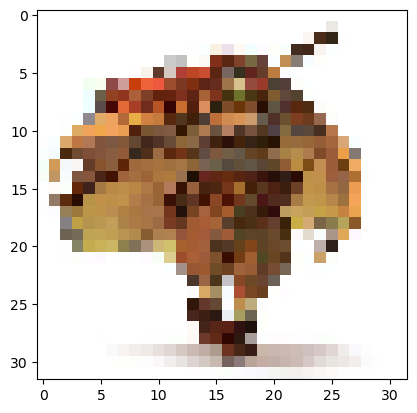

255
File saved successfully


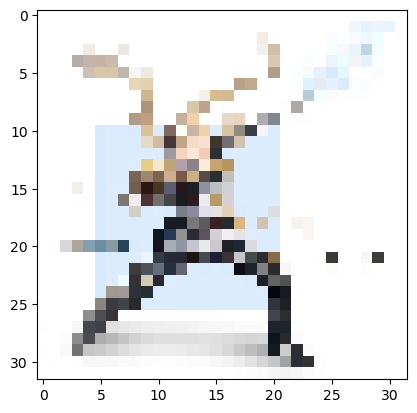

255
File saved successfully


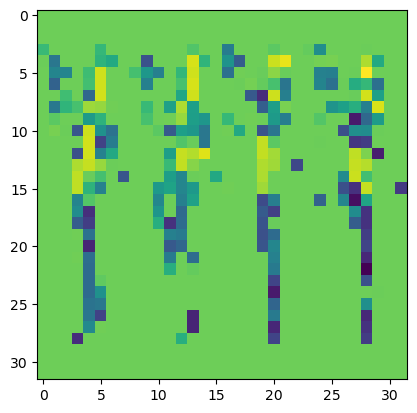

219
File saved successfully


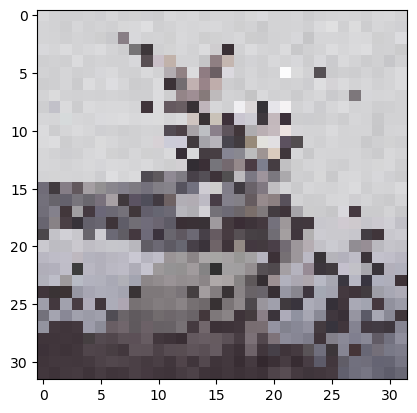

253
File saved successfully


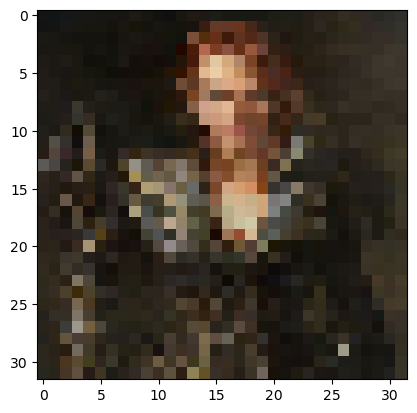

235
File saved successfully


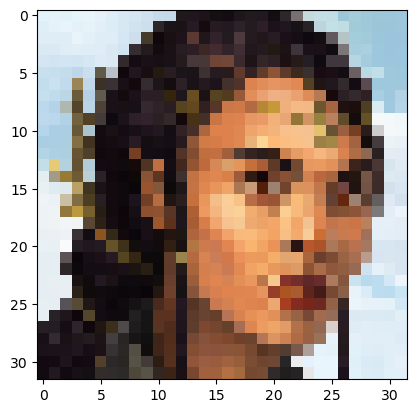

253
File saved successfully


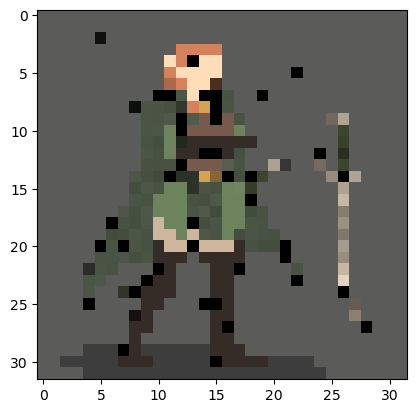

1.0
File saved successfully


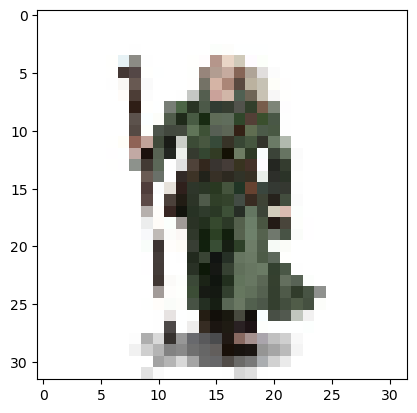

255
File saved successfully


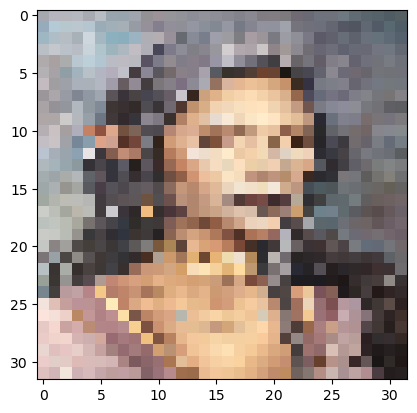

255
File saved successfully


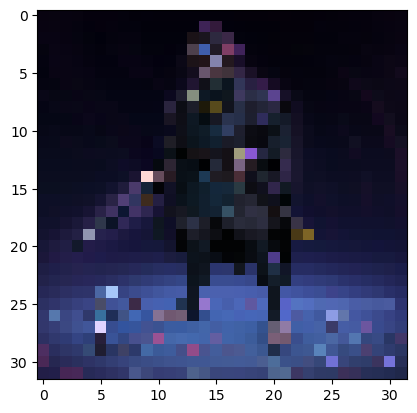

1.0
File saved successfully


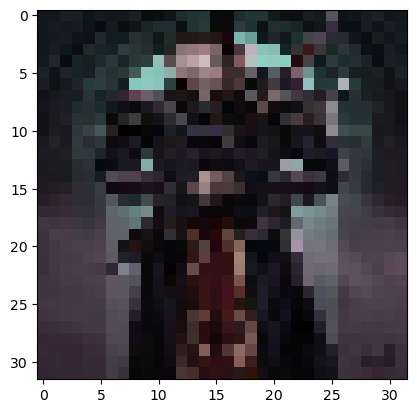

207
File saved successfully


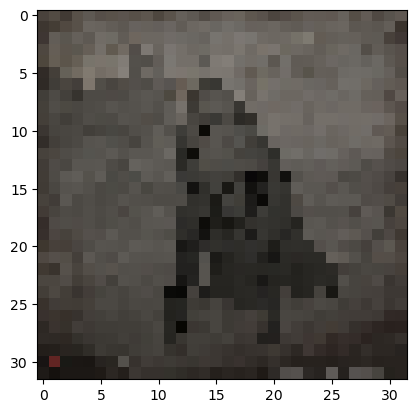

133
File saved successfully


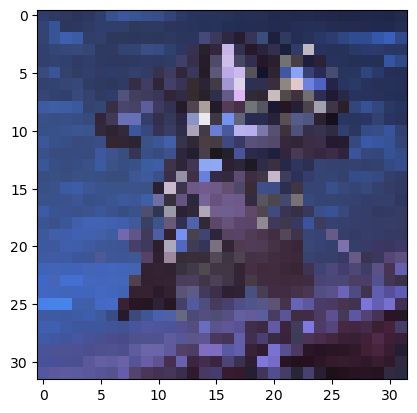

0.96778107
File saved successfully


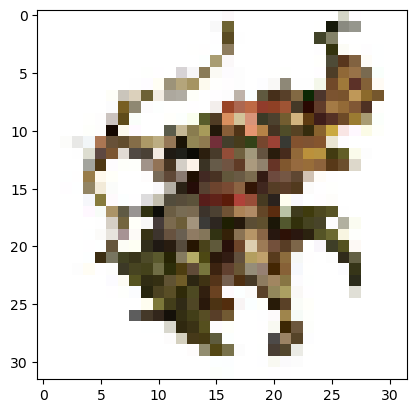

255
File saved successfully


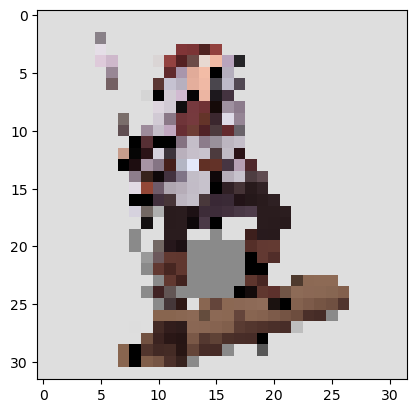

1.0
File saved successfully


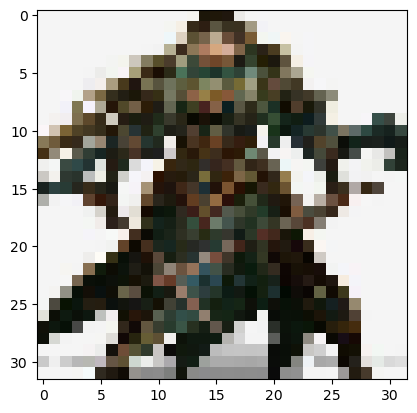

254
File saved successfully


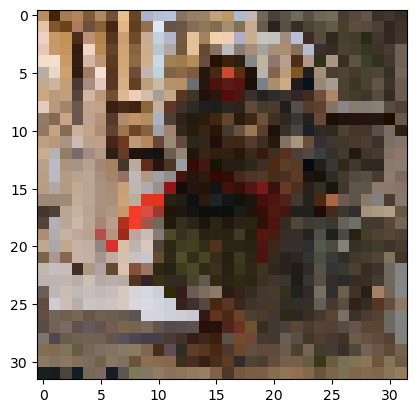

248
File saved successfully


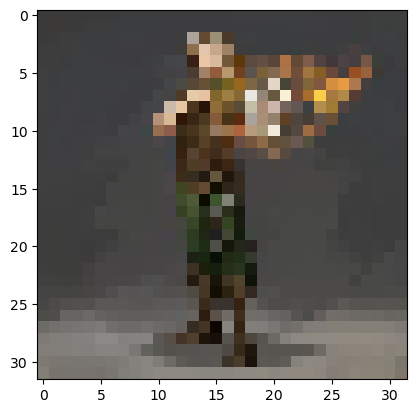

250
File saved successfully


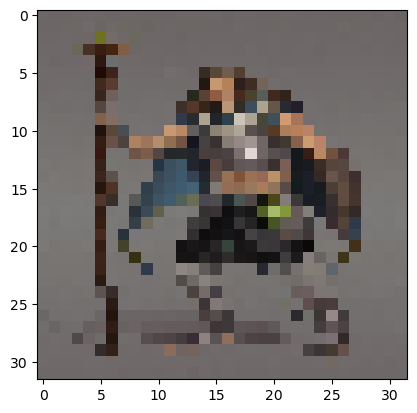

225
File saved successfully


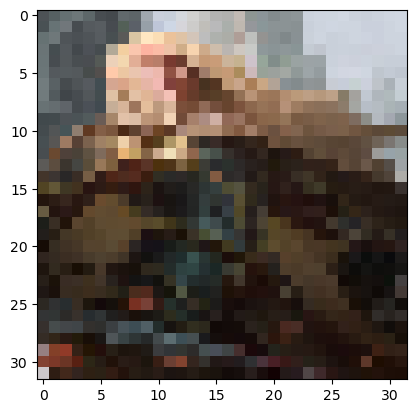

255
File saved successfully


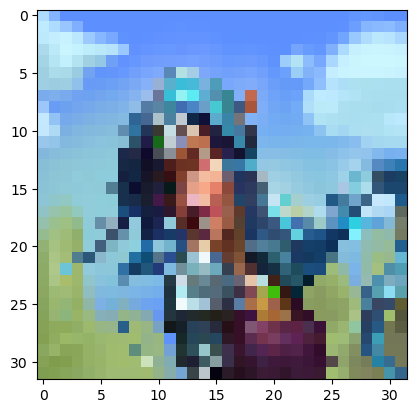

255
File saved successfully


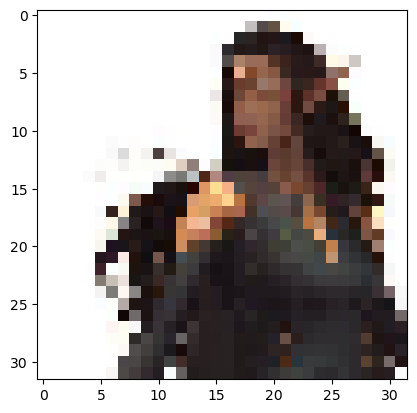

255
File saved successfully


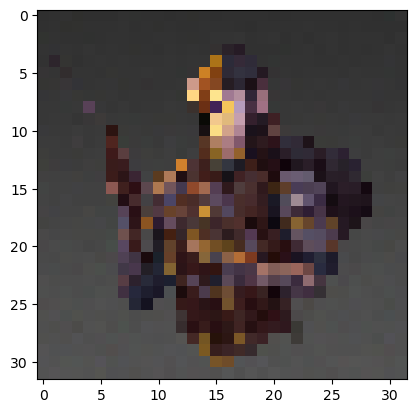

255
File saved successfully


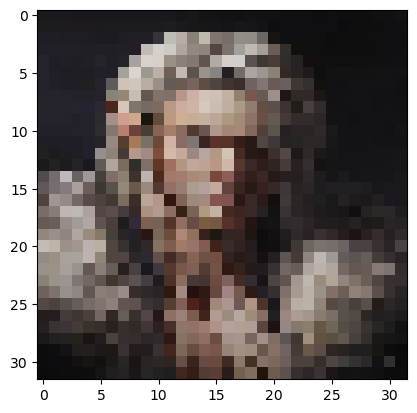

220
File saved successfully


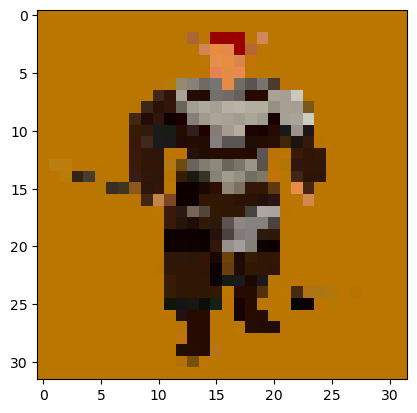

234
File saved successfully


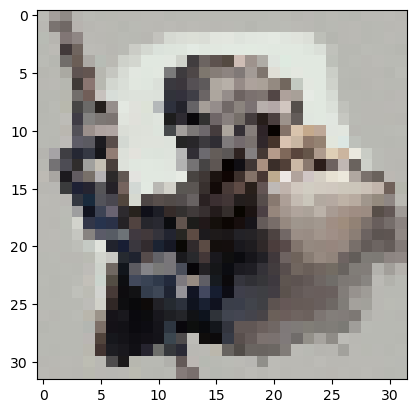

237
File saved successfully


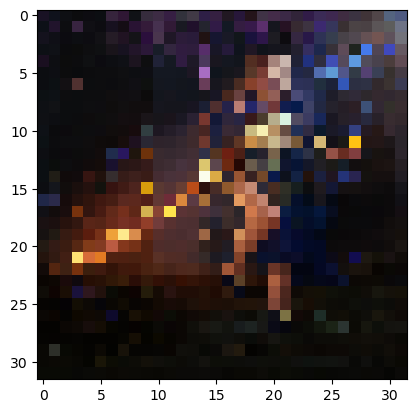

255
File saved successfully


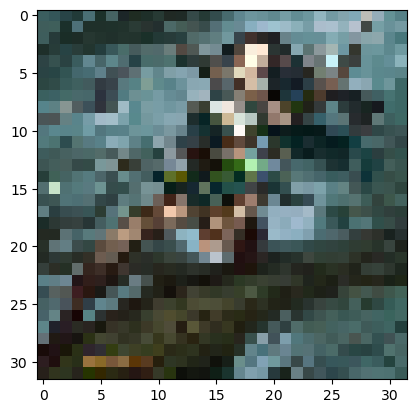

255
File saved successfully


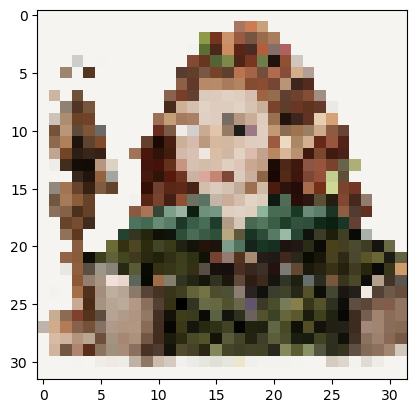

1.0
File saved successfully


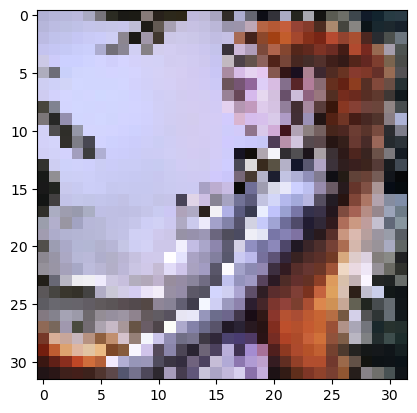

255
File saved successfully


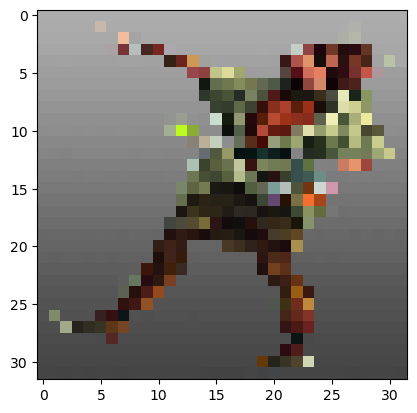

250
File saved successfully


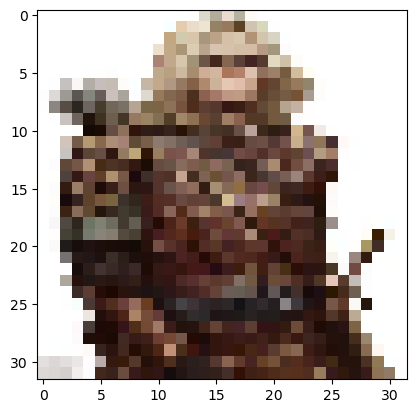

255
File saved successfully


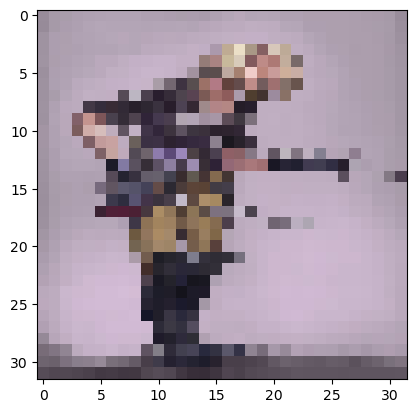

240
File saved successfully


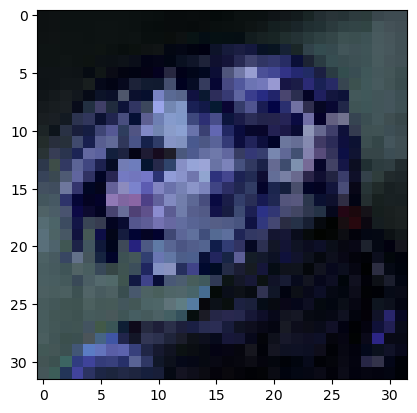

234
File saved successfully


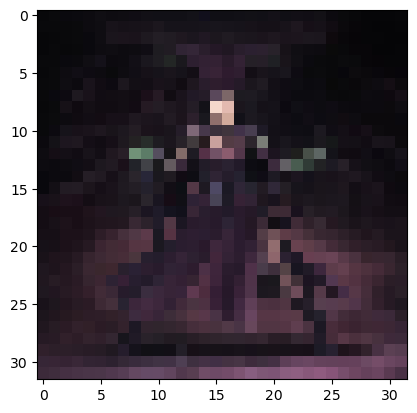

246
File saved successfully


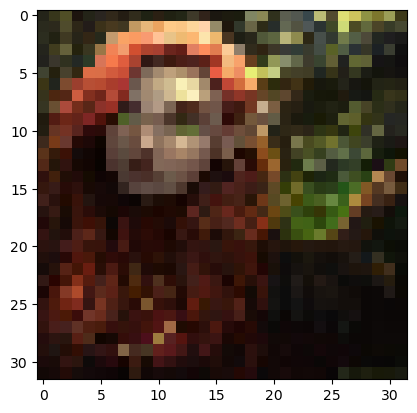

255
File saved successfully


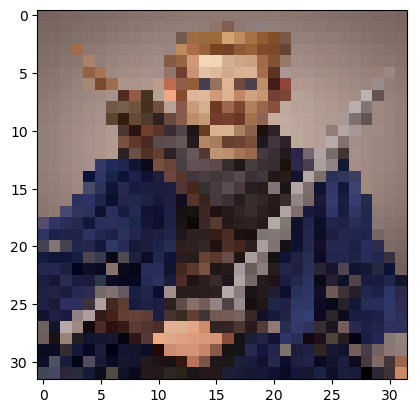

244
File saved successfully


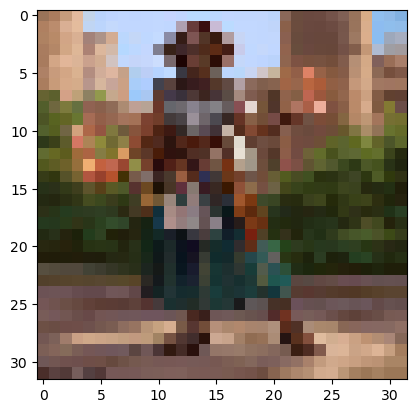

255
File saved successfully


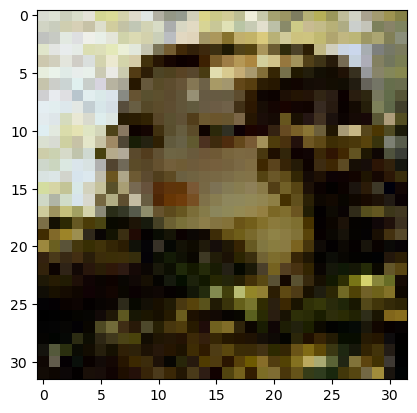

243
File saved successfully


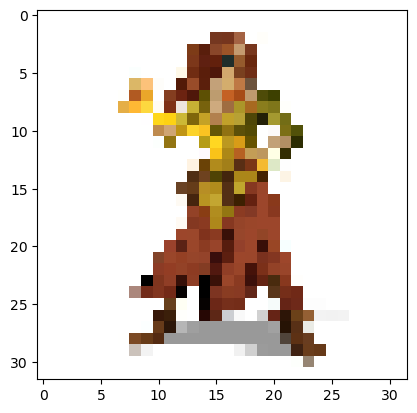

255
File saved successfully


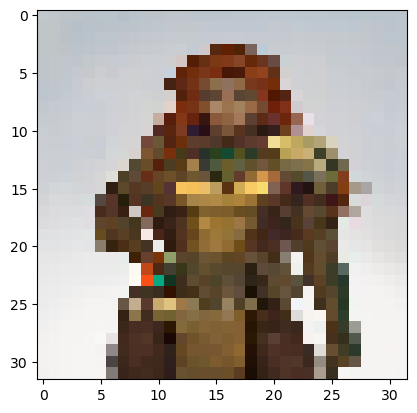

254
File saved successfully


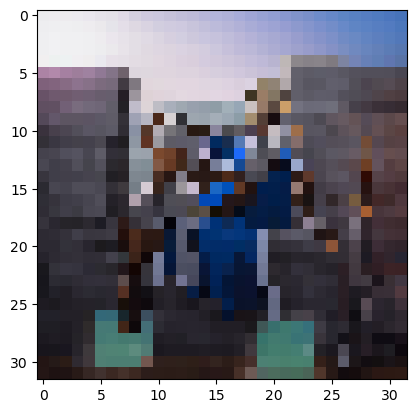

247
File saved successfully


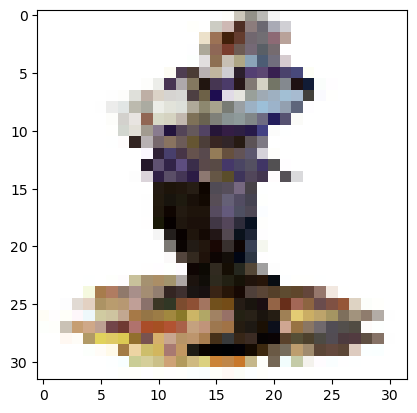

255
File saved successfully


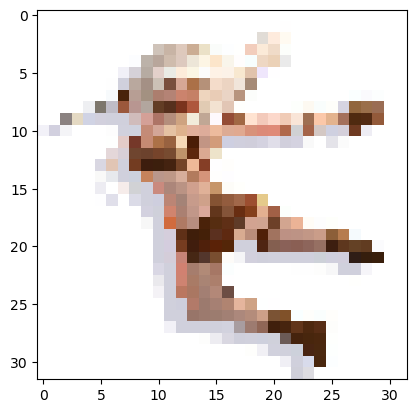

255
File saved successfully


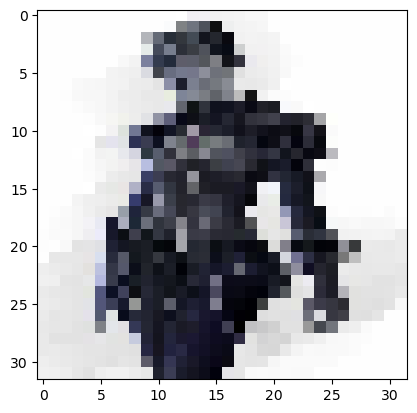

255
File saved successfully


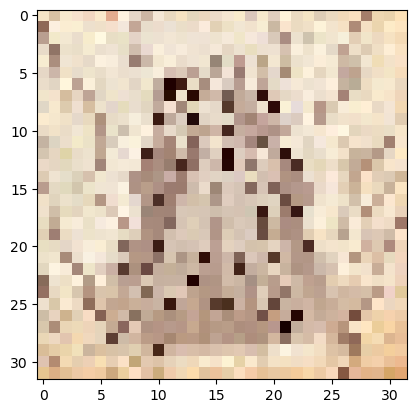

255
File saved successfully


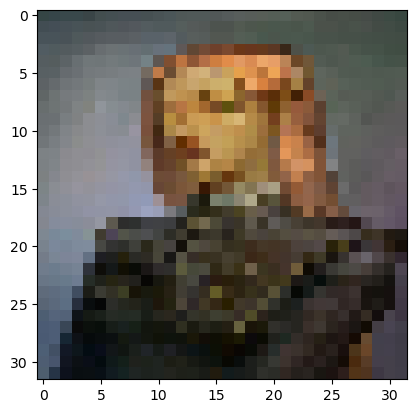

238
File saved successfully


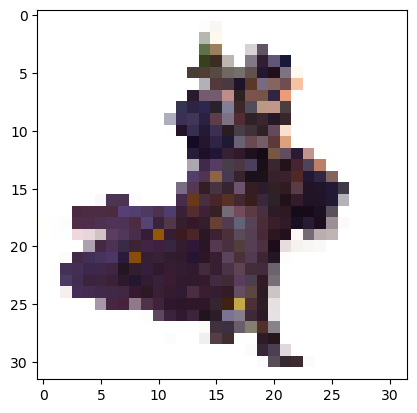

255
File saved successfully


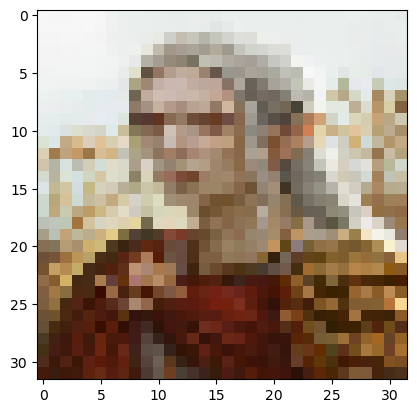

249
File saved successfully


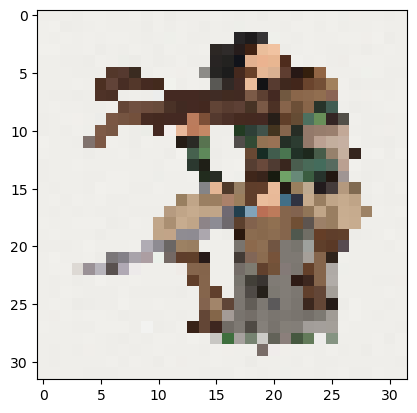

243
File saved successfully


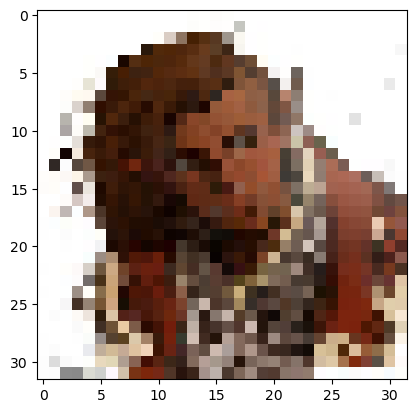

255
File saved successfully


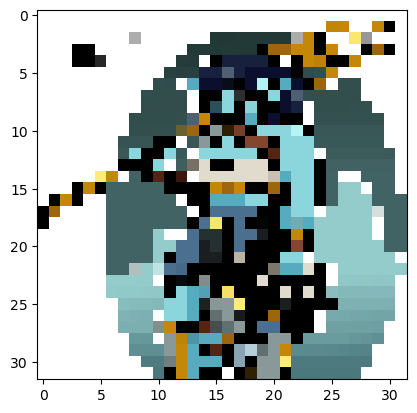

1.0
File saved successfully


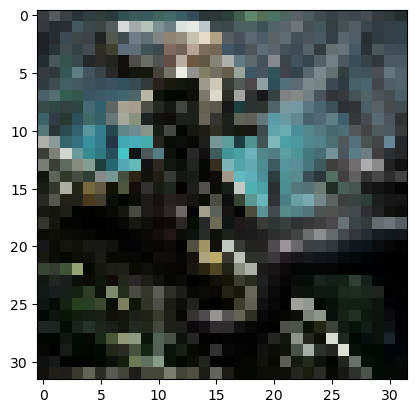

236
File saved successfully


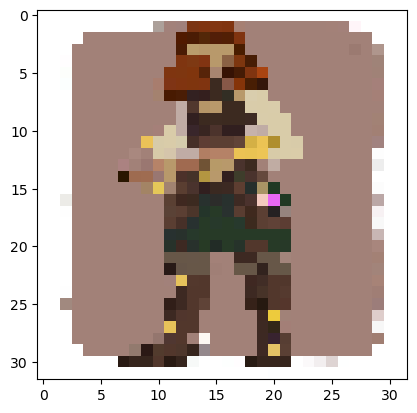

255
File saved successfully


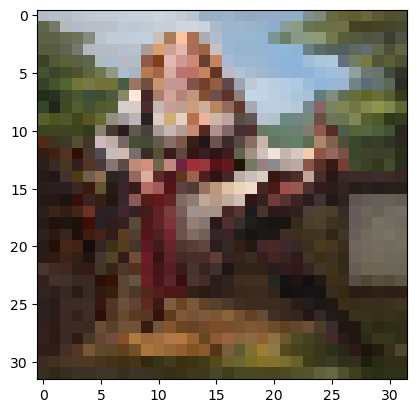

252
File saved successfully


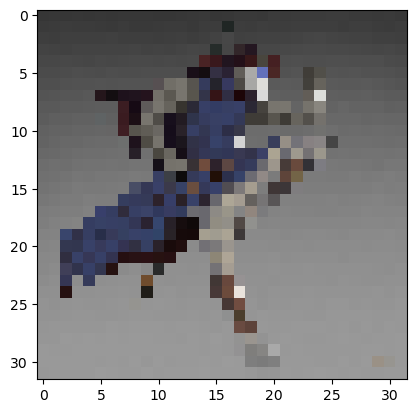

233
File saved successfully


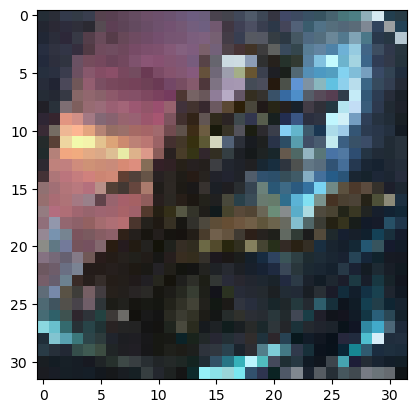

254
File saved successfully


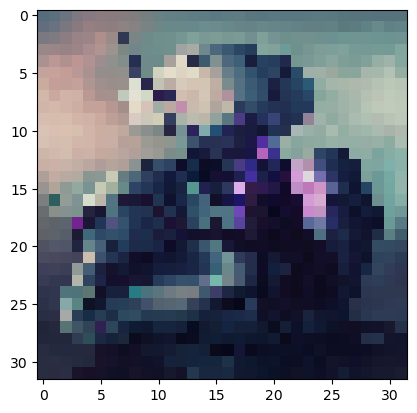

235
File saved successfully


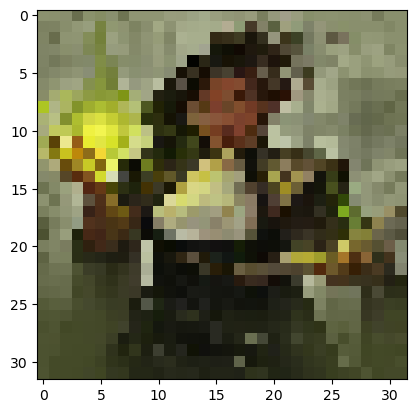

245
File saved successfully


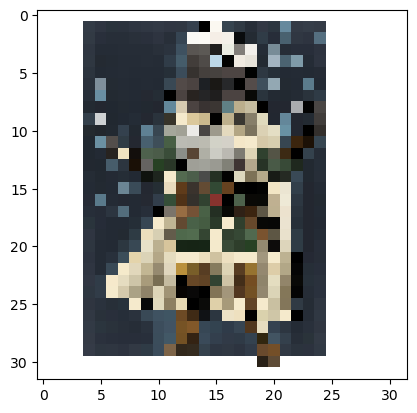

255
File saved successfully


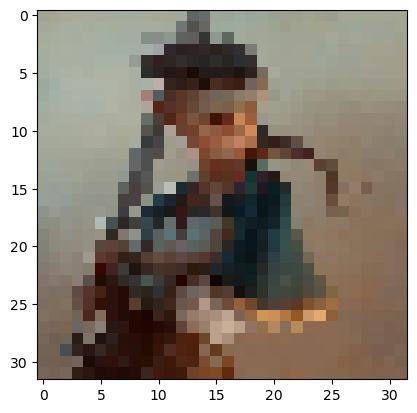

225
File saved successfully


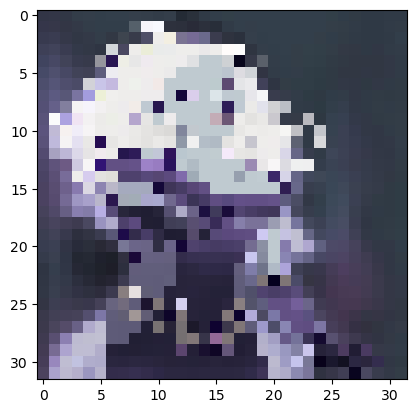

255
File saved successfully


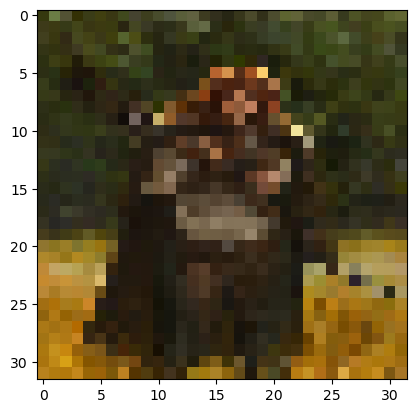

251
File saved successfully


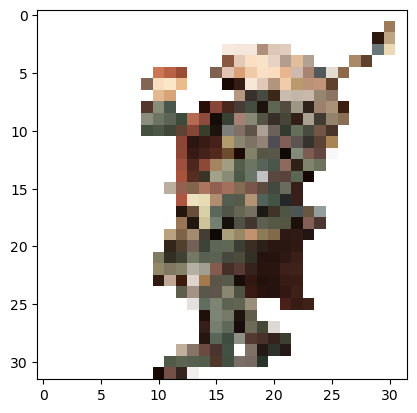

1.0
File saved successfully


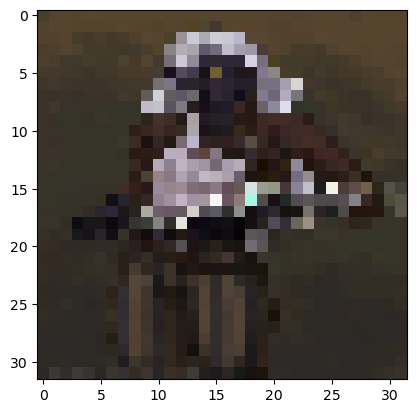

247
File saved successfully


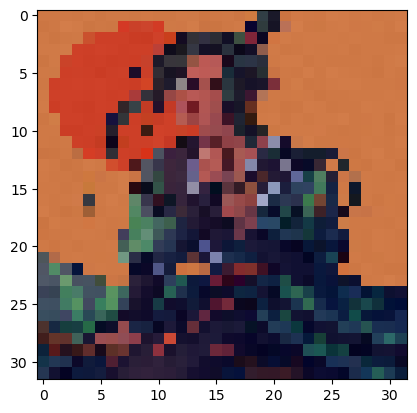

216
File saved successfully


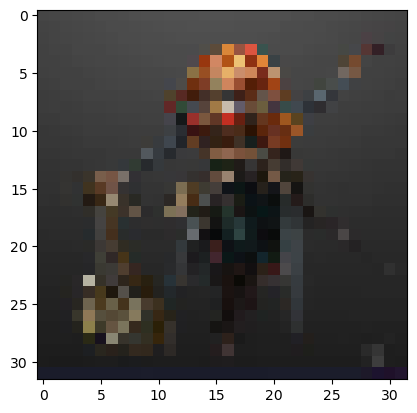

237
File saved successfully


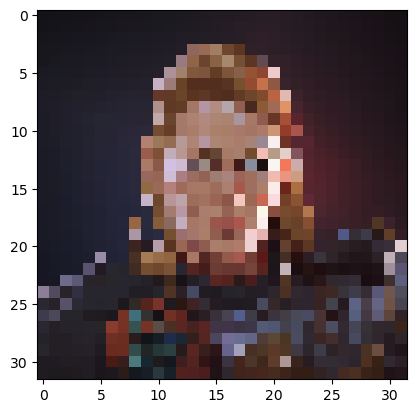

0.9843137
File saved successfully


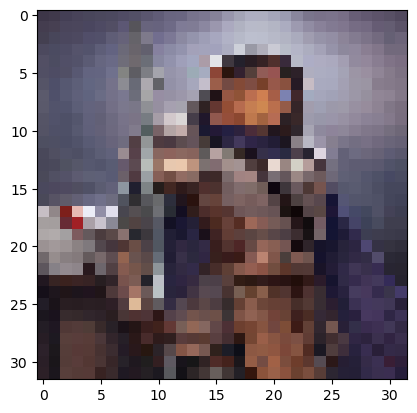

247
File saved successfully


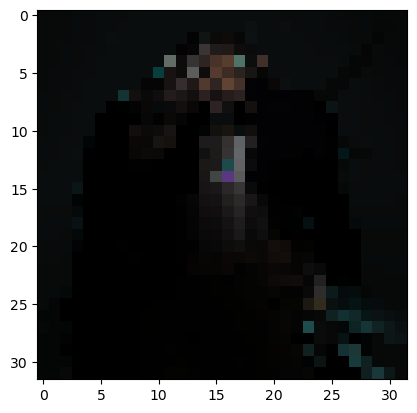

0.50784314
File saved successfully


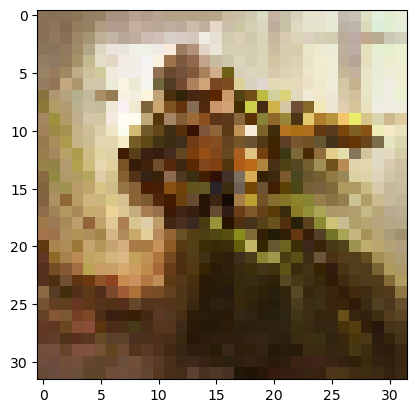

254
File saved successfully


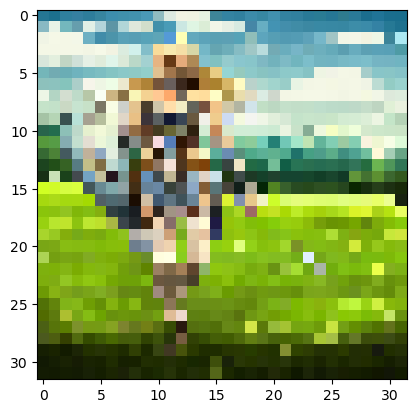

255
File saved successfully


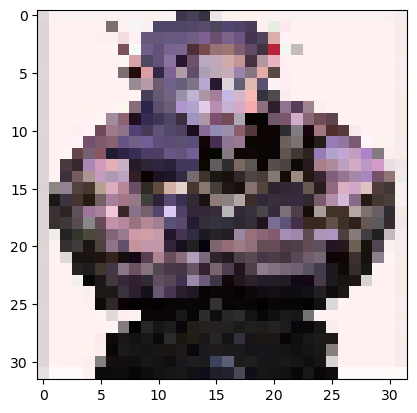

255
File saved successfully


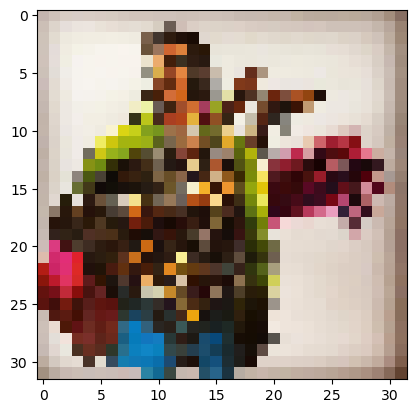

250
File saved successfully


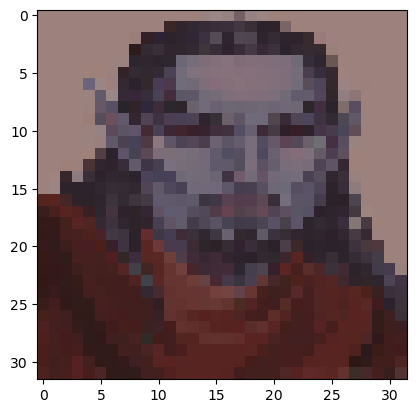

160
File saved successfully


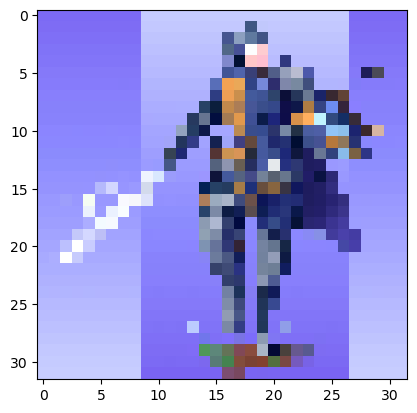

255
File saved successfully


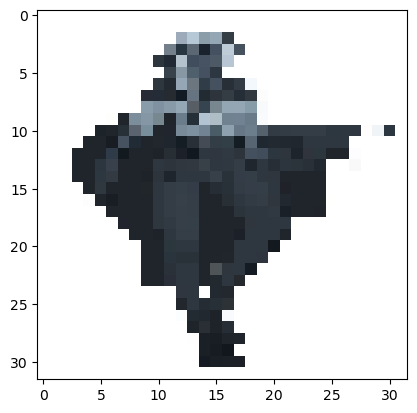

255
File saved successfully


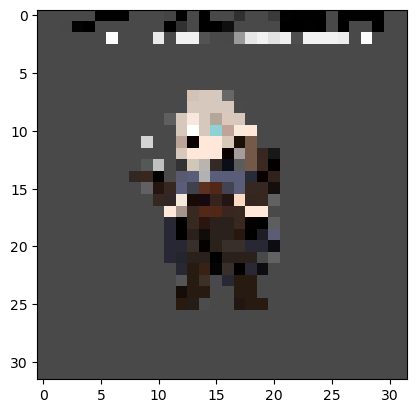

255
File saved successfully


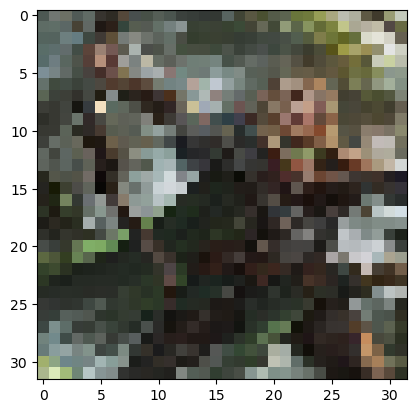

243
File saved successfully


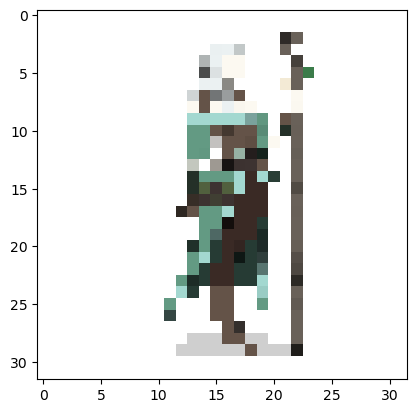

1.0
File saved successfully


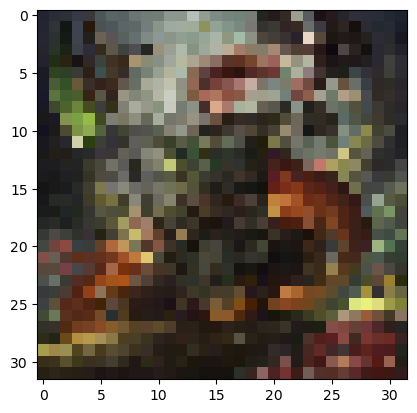

240
File saved successfully


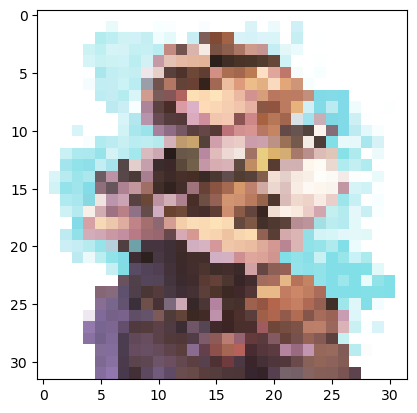

1.0
File saved successfully


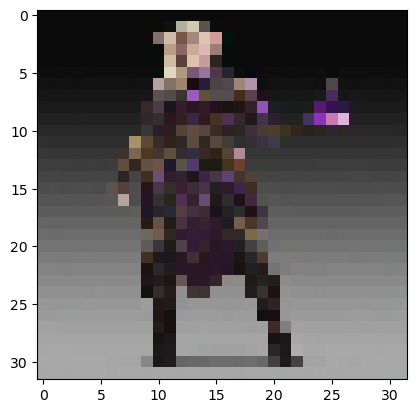

227
File saved successfully


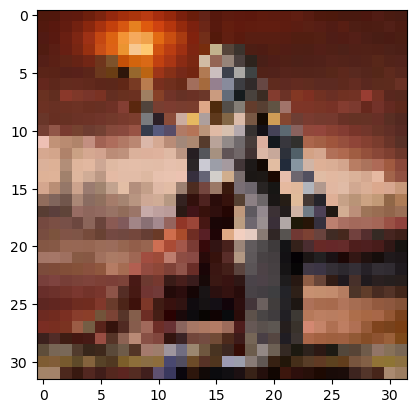

254
File saved successfully


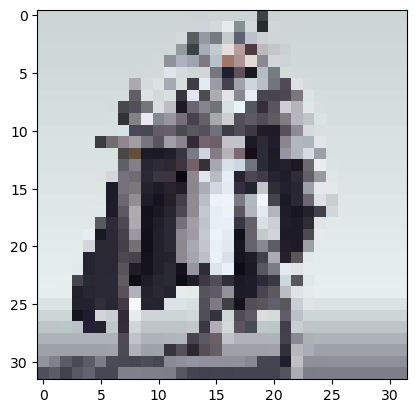

251
File saved successfully


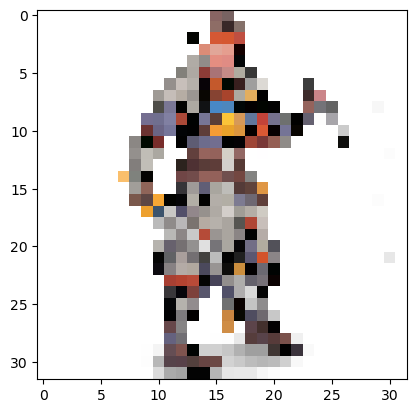

255
File saved successfully


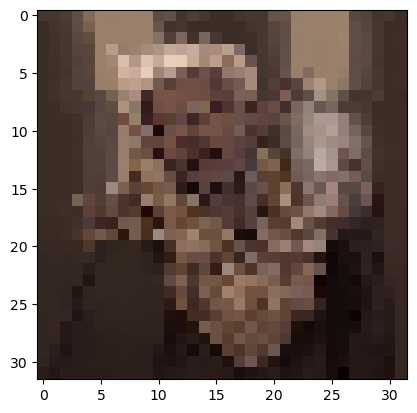

233
File saved successfully


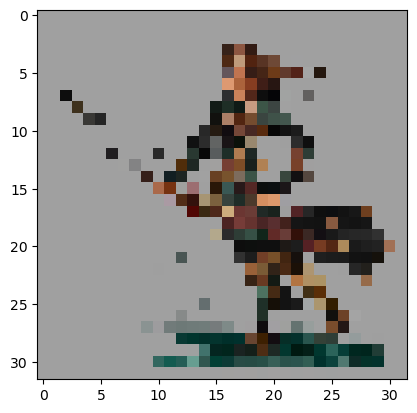

221
File saved successfully


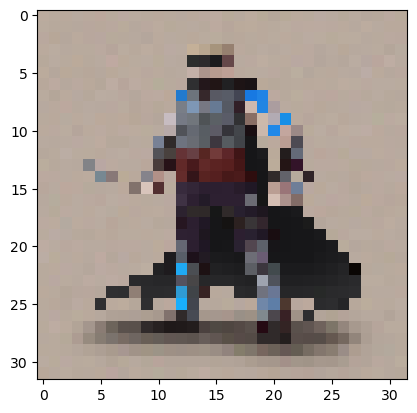

252
File saved successfully


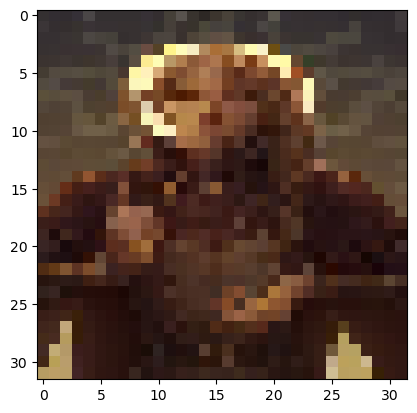

255
File saved successfully


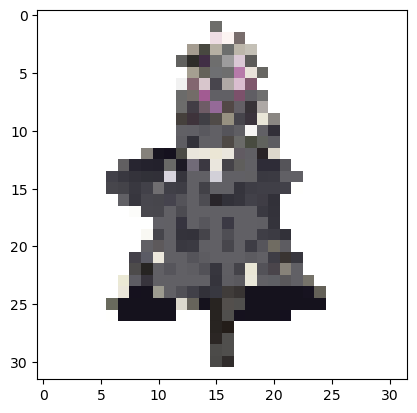

255
File saved successfully


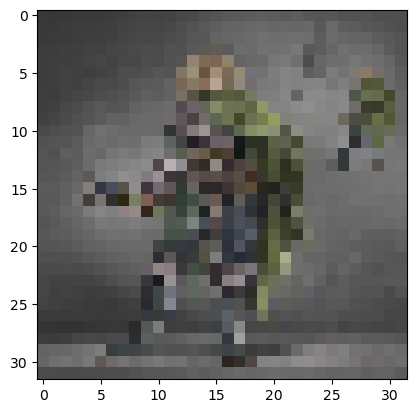

188
File saved successfully


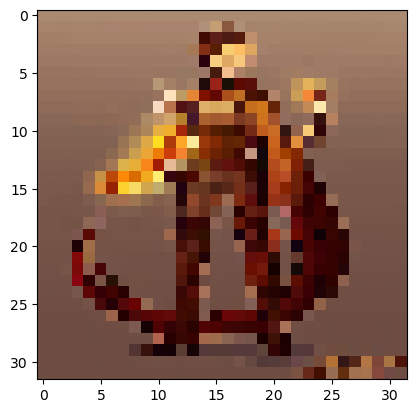

255
File saved successfully


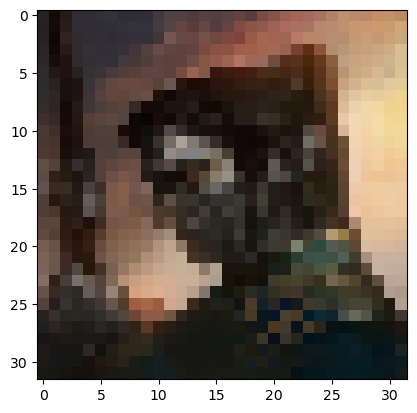

245
File saved successfully


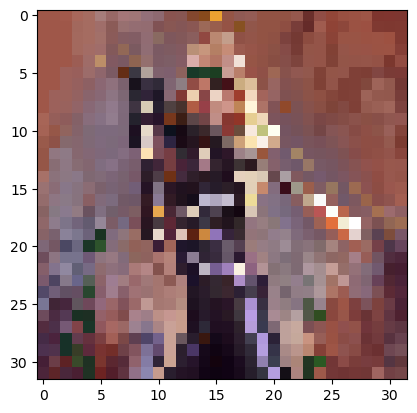

255
File saved successfully


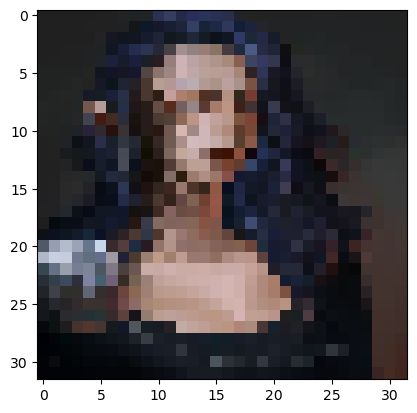

233
File saved successfully


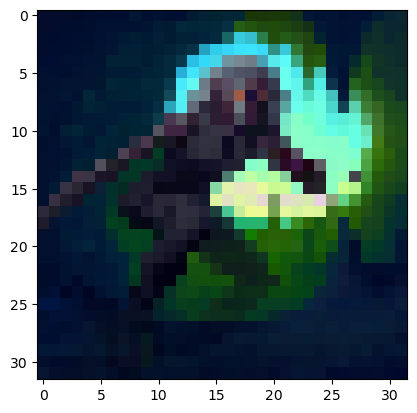

1.0
File saved successfully


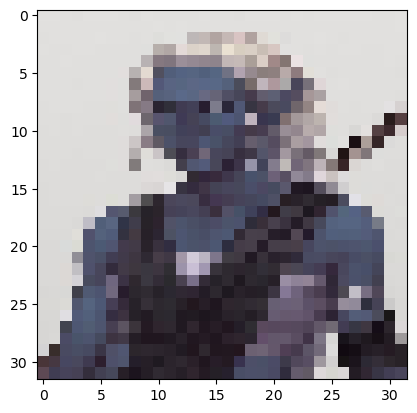

235
File saved successfully


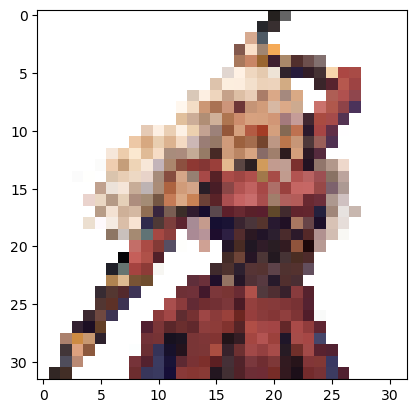

255
File saved successfully


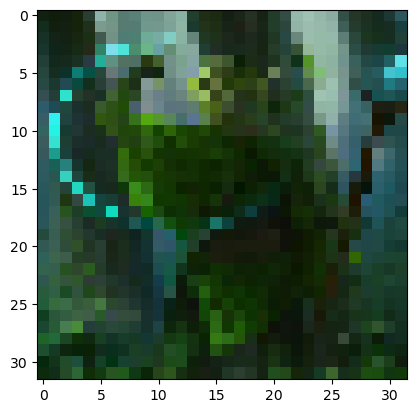

243
File saved successfully


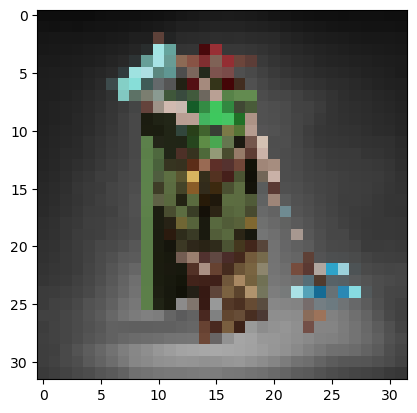

0.9036459
File saved successfully


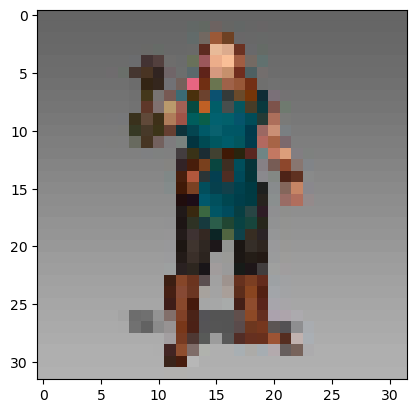

249
File saved successfully


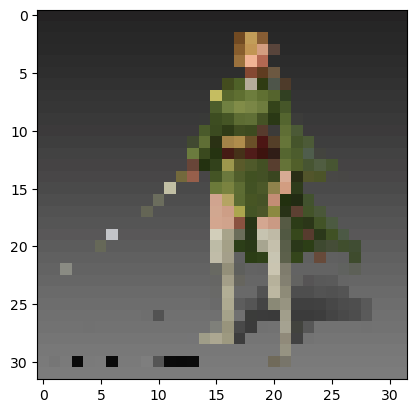

241
File saved successfully


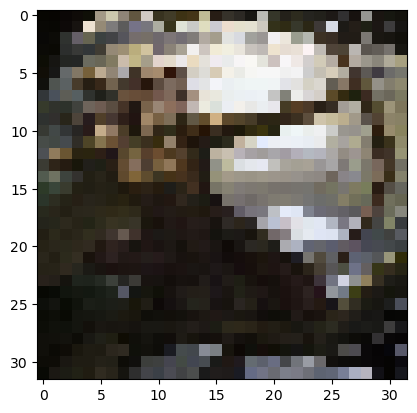

253
File saved successfully


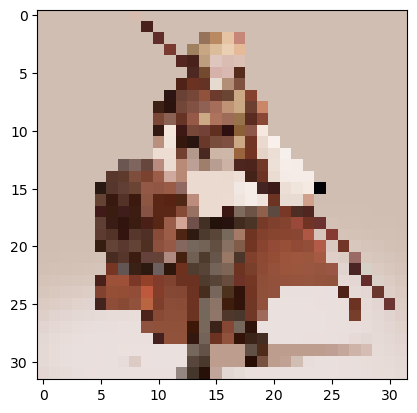

249
File saved successfully


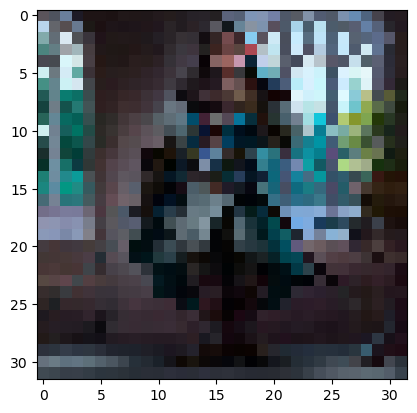

255
File saved successfully


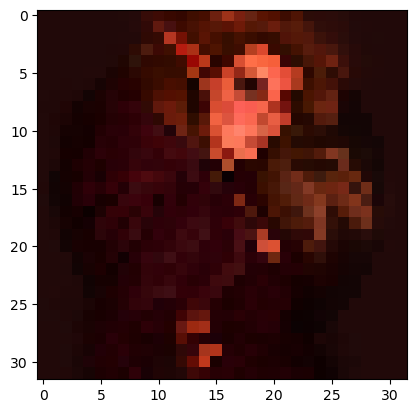

1.0
File saved successfully


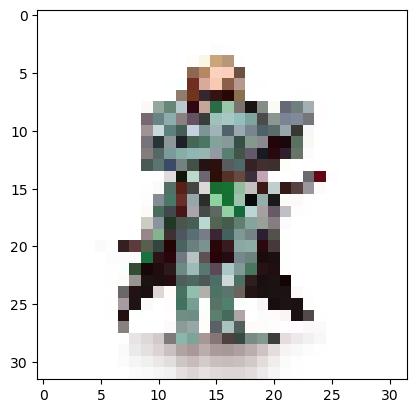

255
File saved successfully


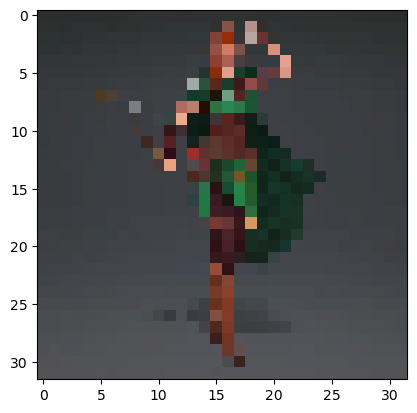

237
File saved successfully


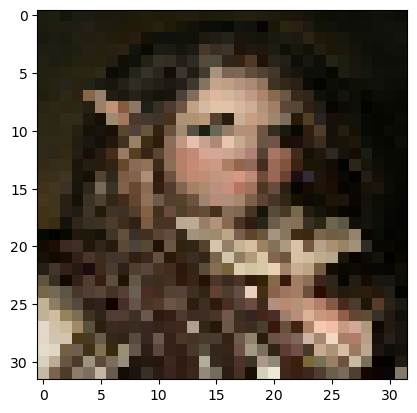

246
File saved successfully


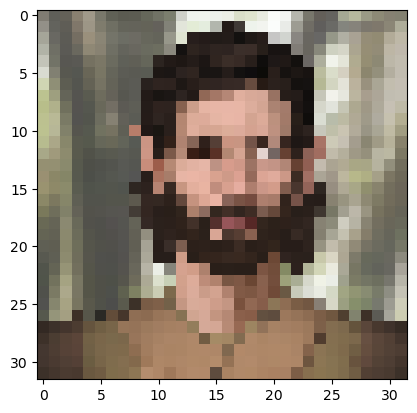

0.99215686
File saved successfully


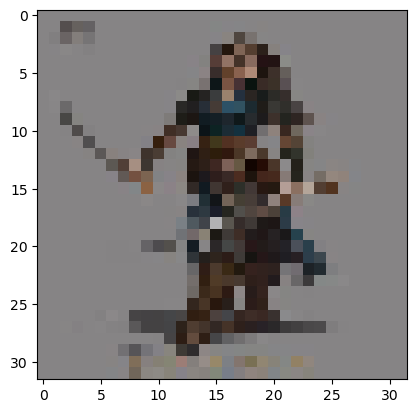

180
File saved successfully


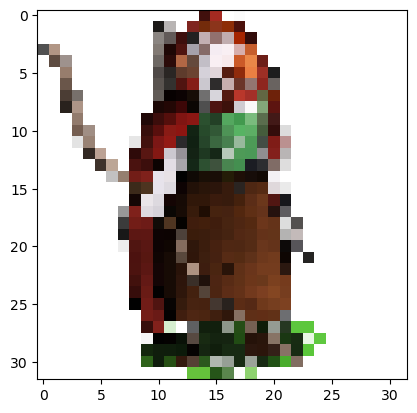

1.0
File saved successfully


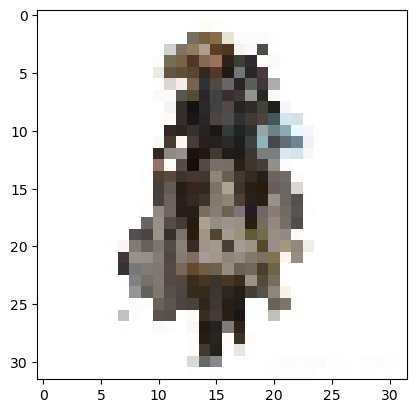

255
File saved successfully


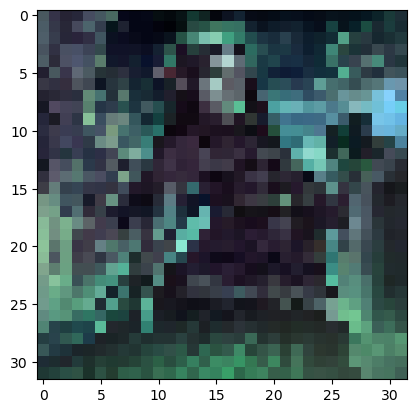

252
File saved successfully


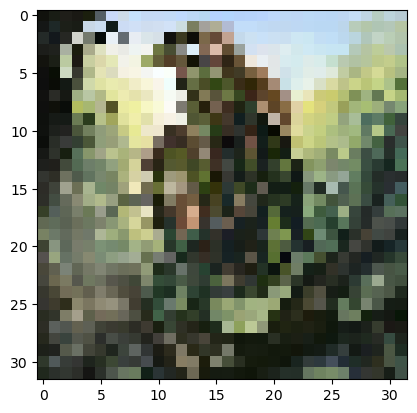

255
File saved successfully


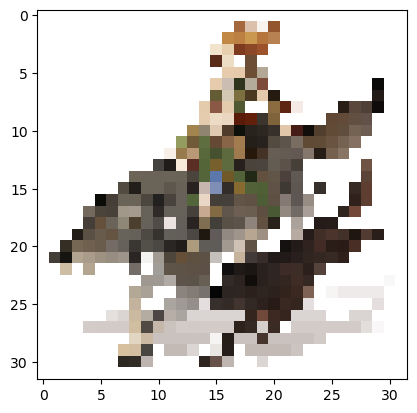

1.0
File saved successfully


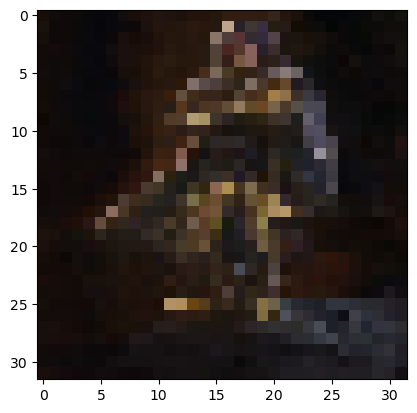

192
File saved successfully


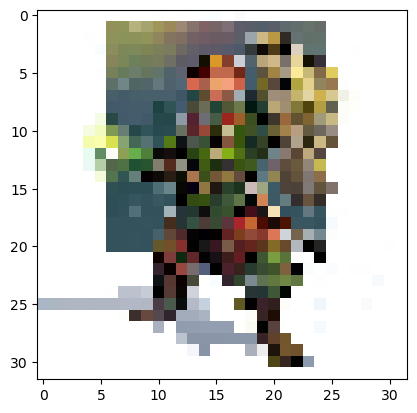

255
File saved successfully


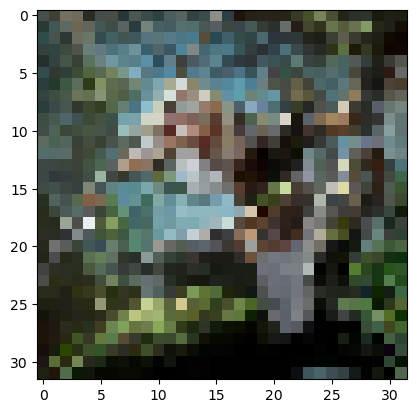

241
File saved successfully


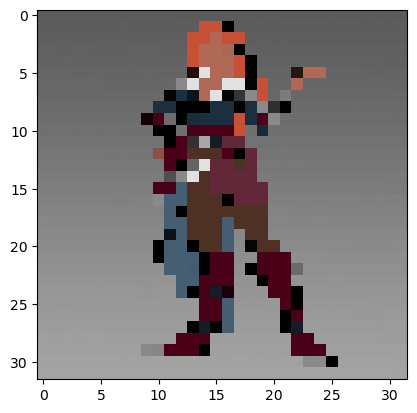

1.0
File saved successfully


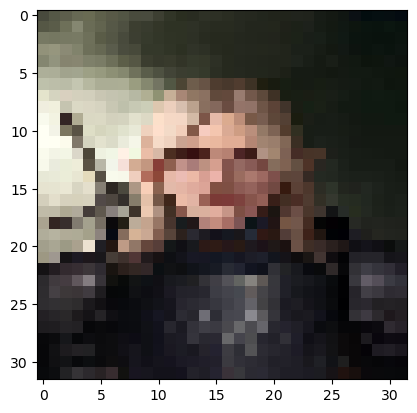

255
File saved successfully


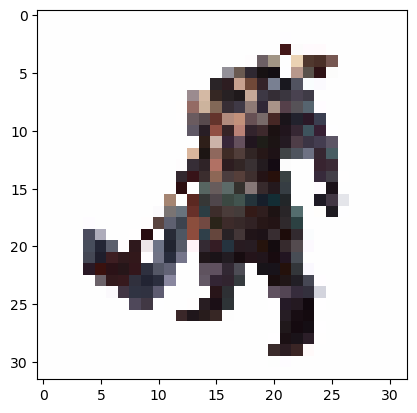

255
File saved successfully


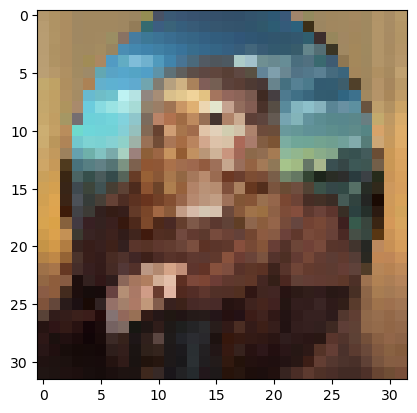

243
File saved successfully


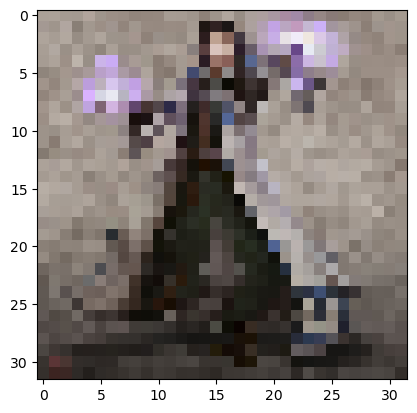

255
File saved successfully


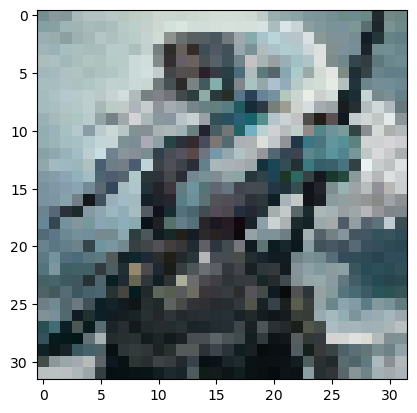

241
File saved successfully


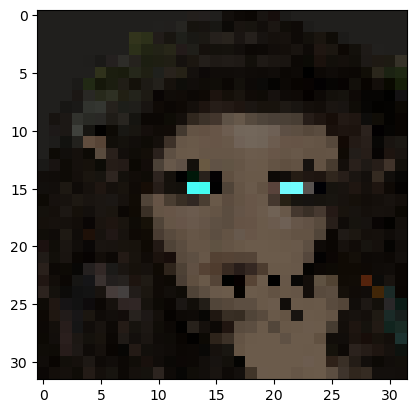

255
File saved successfully


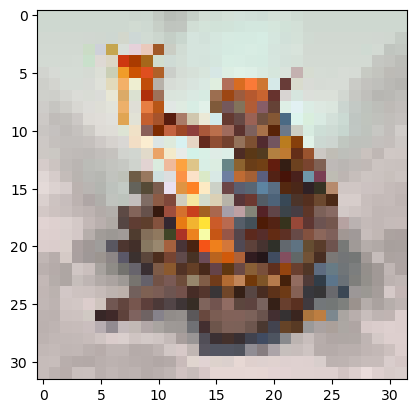

255
File saved successfully


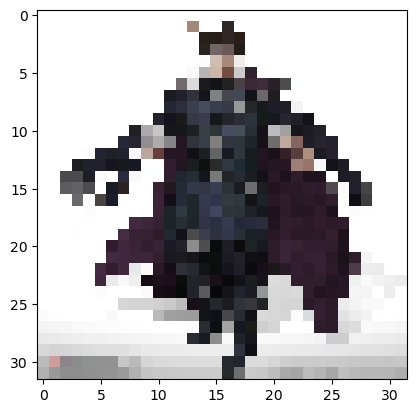

255
File saved successfully


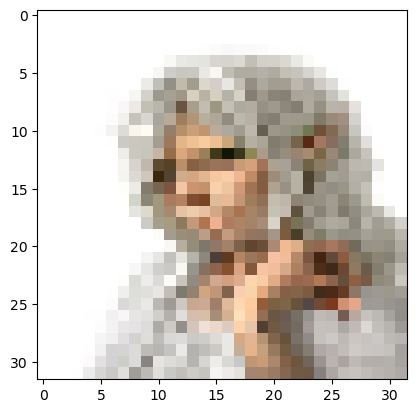

255
File saved successfully


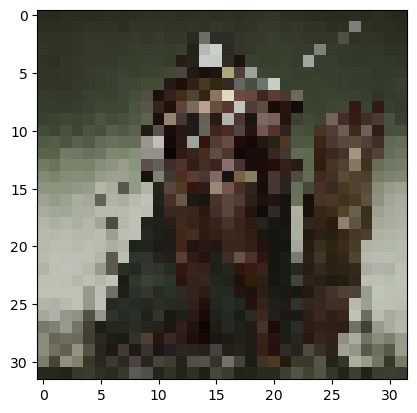

225
File saved successfully


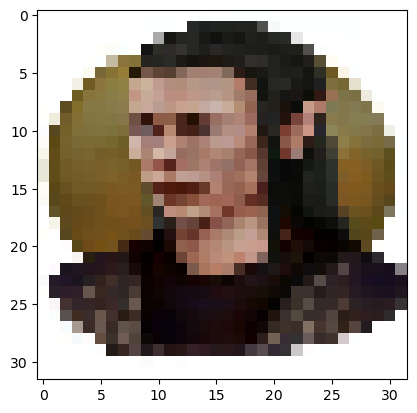

255
File saved successfully


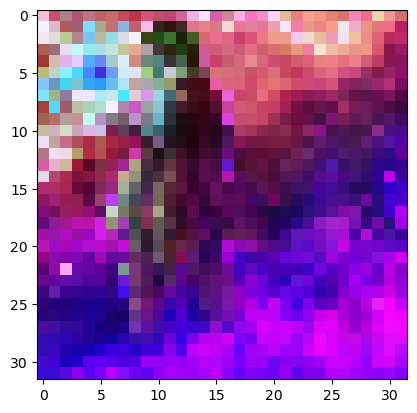

255
File saved successfully


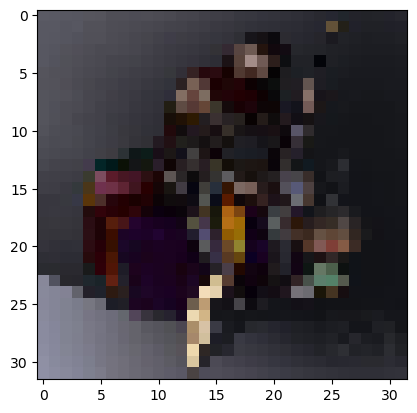

243
File saved successfully


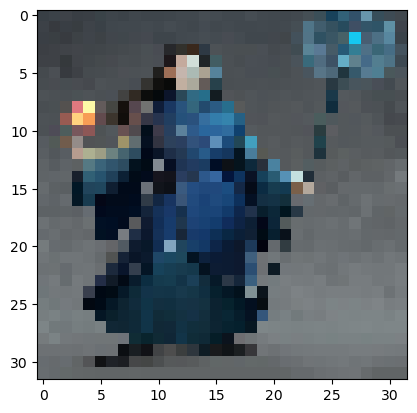

255
File saved successfully


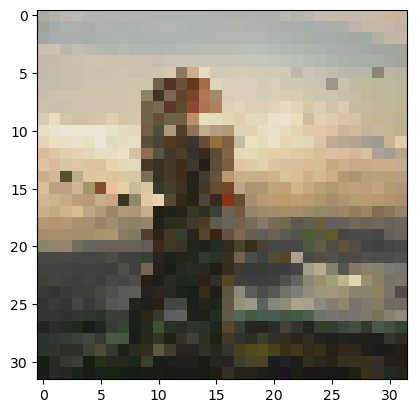

237
File saved successfully


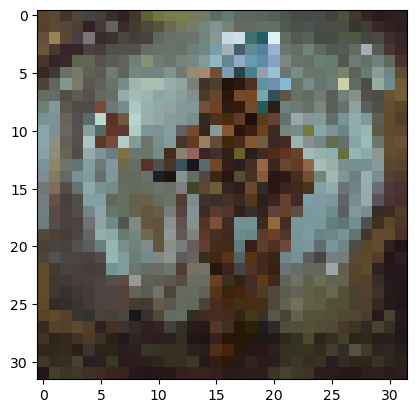

243
File saved successfully


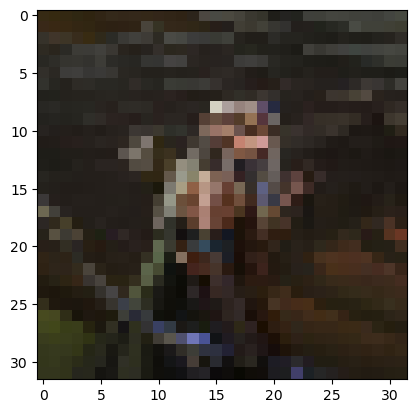

212
File saved successfully


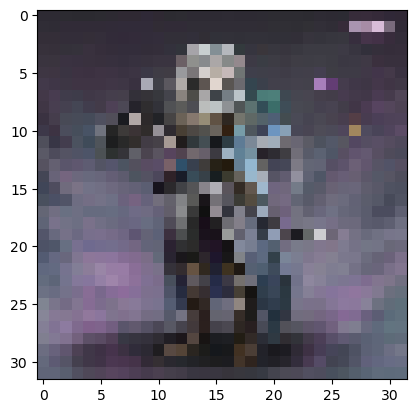

225
File saved successfully


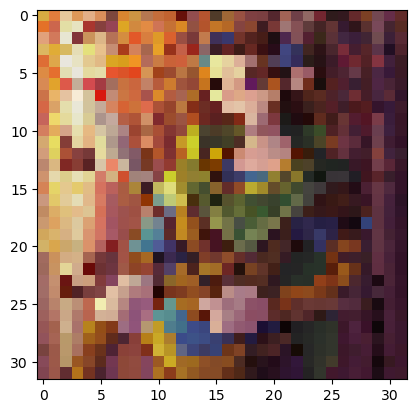

247
File saved successfully


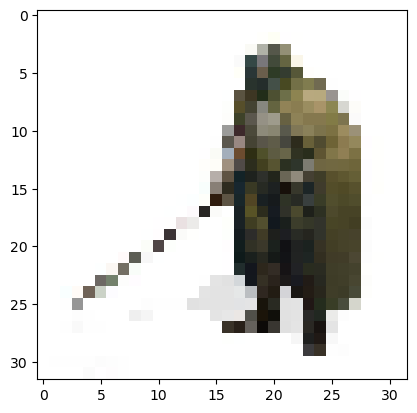

255
File saved successfully


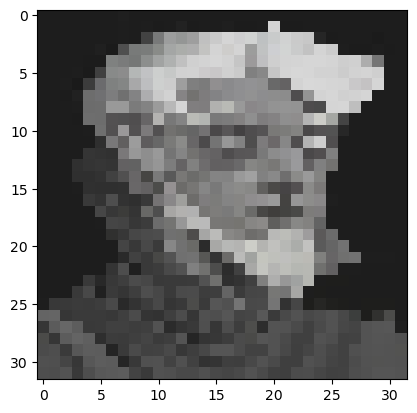

216
File saved successfully


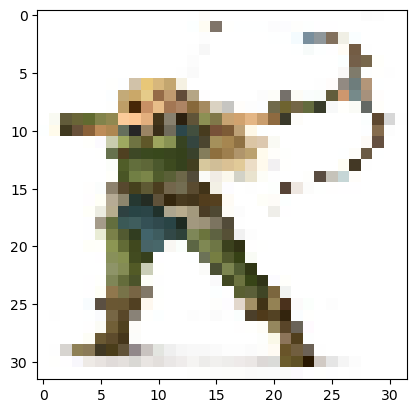

255
File saved successfully


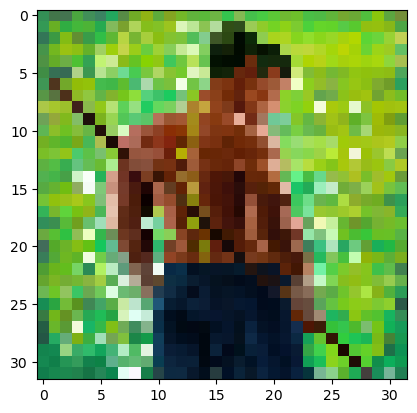

255
File saved successfully


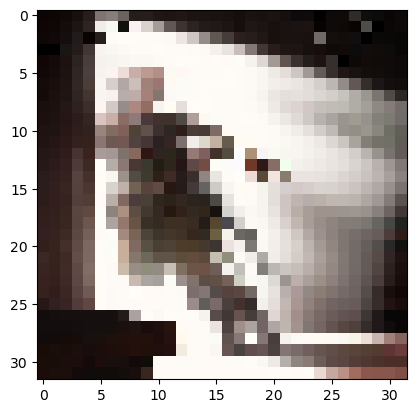

255
File saved successfully


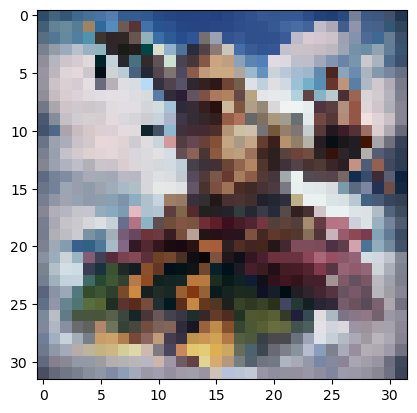

247
File saved successfully


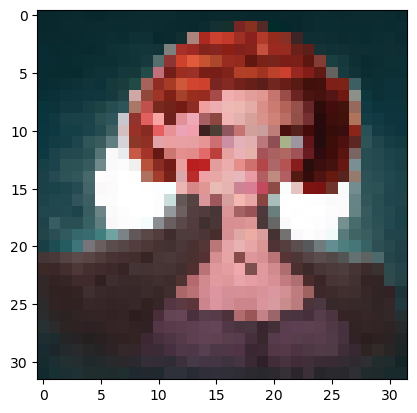

1.0
File saved successfully


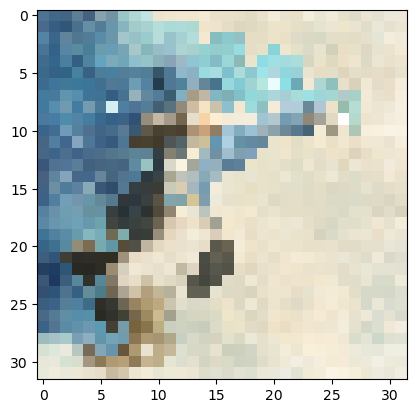

254
File saved successfully


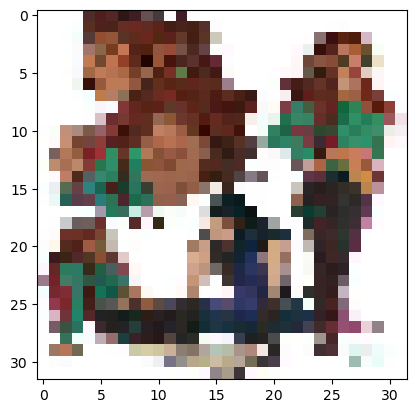

255
File saved successfully


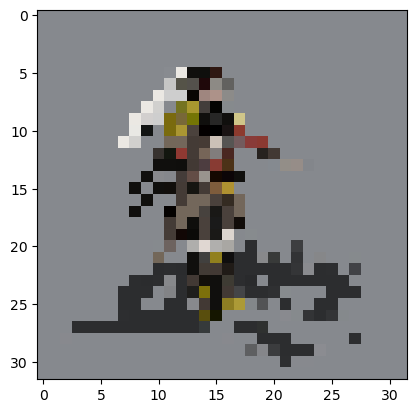

235
File saved successfully


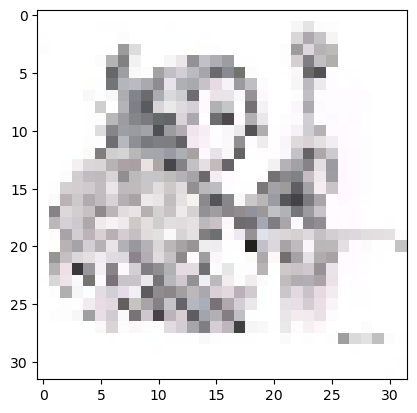

255
File saved successfully


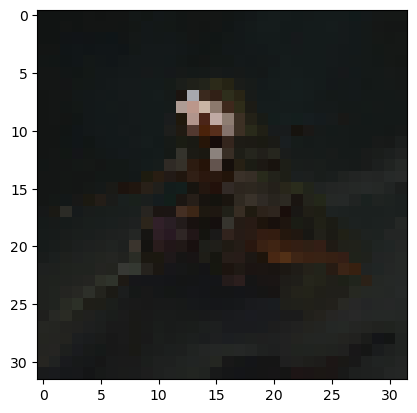

0.79601717
File saved successfully


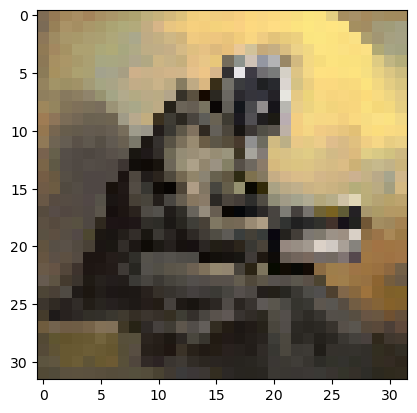

255
File saved successfully


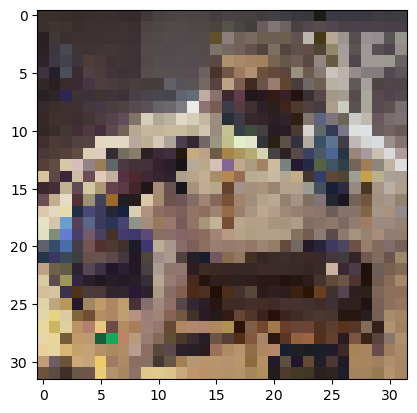

237
File saved successfully


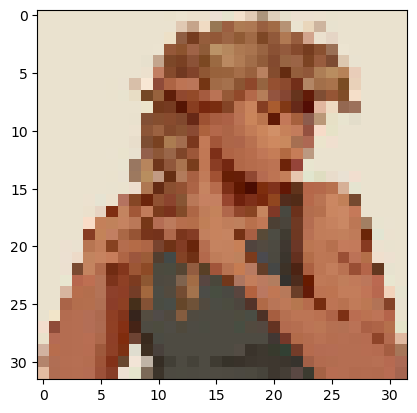

249
File saved successfully


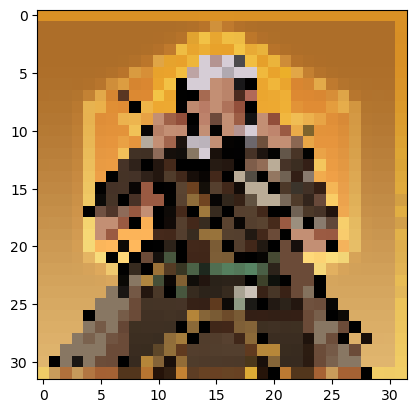

1.0
File saved successfully


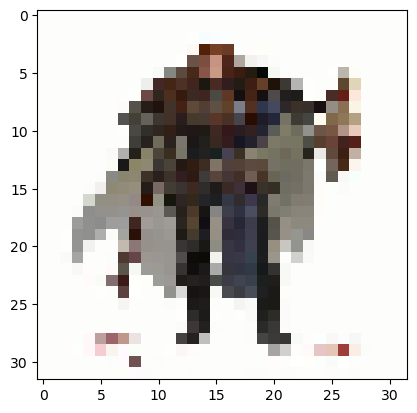

255
File saved successfully


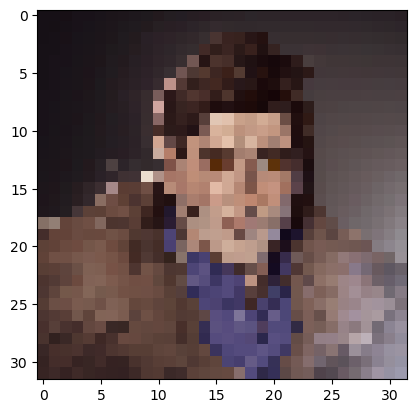

0.92303926
File saved successfully


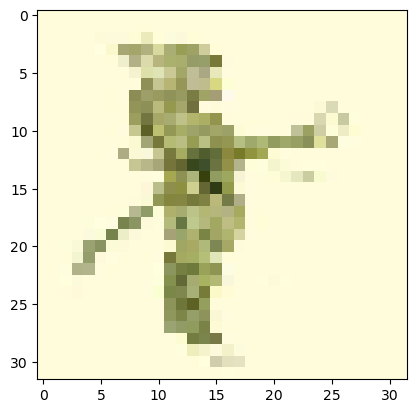

255
File saved successfully


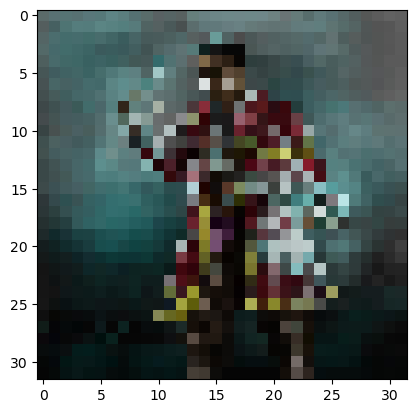

230
File saved successfully


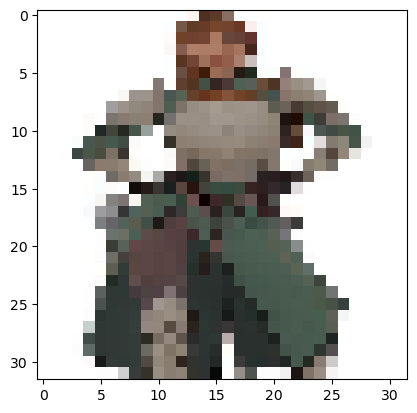

255
File saved successfully


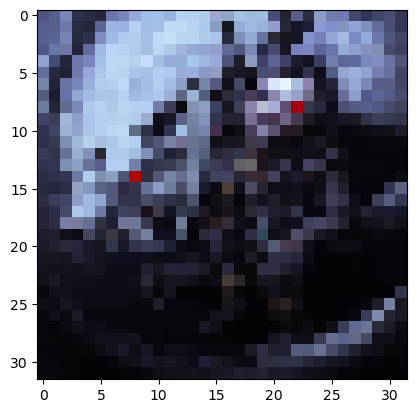

253
File saved successfully


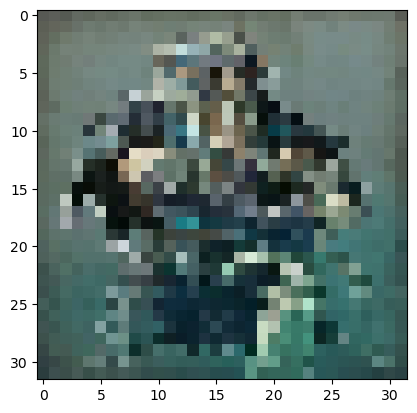

234
File saved successfully


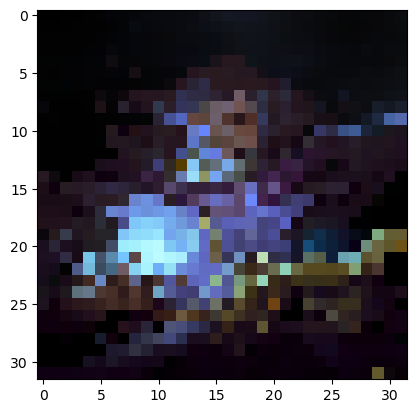

1.0
File saved successfully


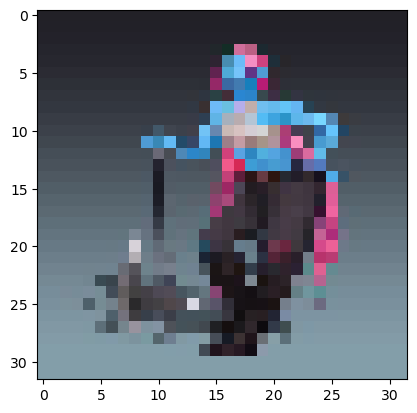

255
File saved successfully


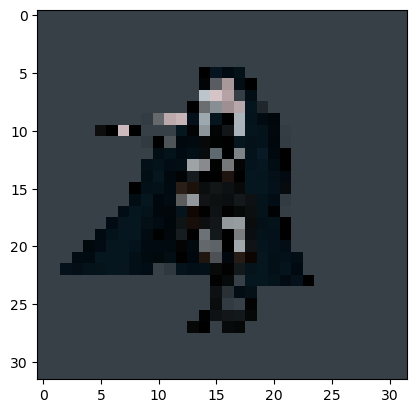

0.8392157
File saved successfully


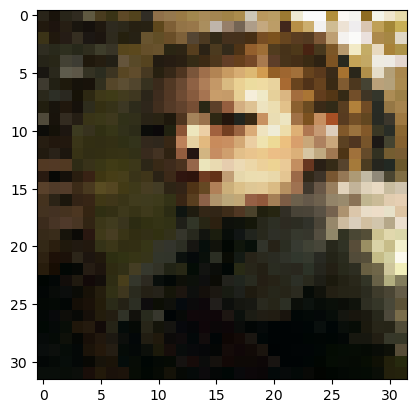

1.0
File saved successfully


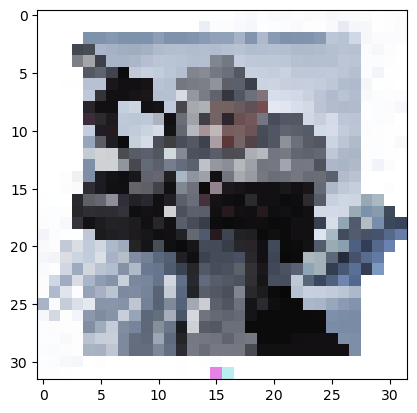

1.0
File saved successfully


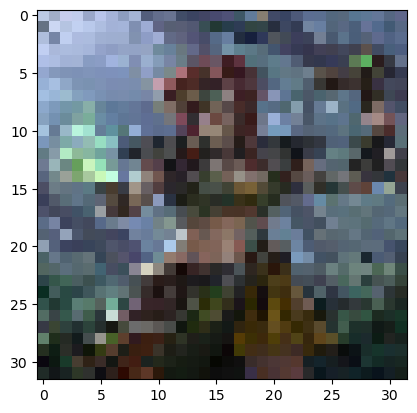

254
File saved successfully


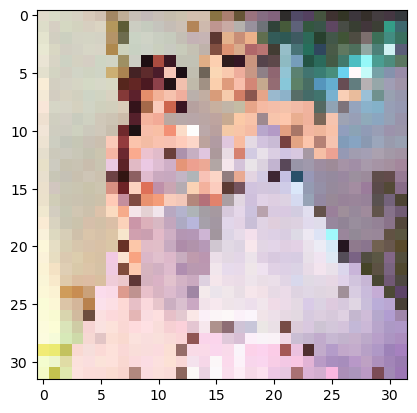

255
File saved successfully


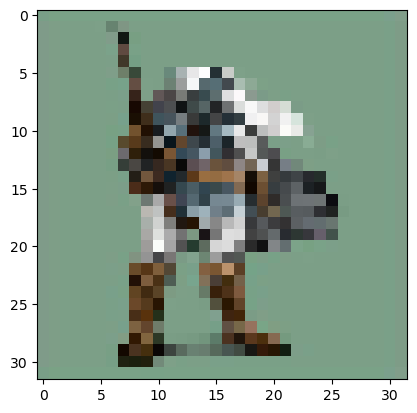

254
File saved successfully


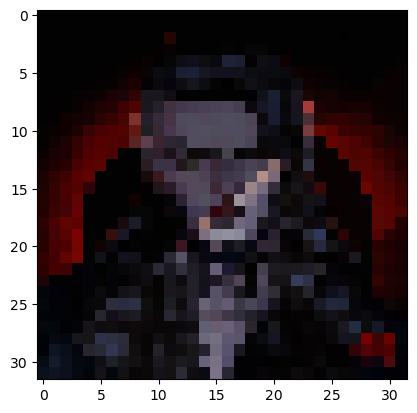

178
File saved successfully


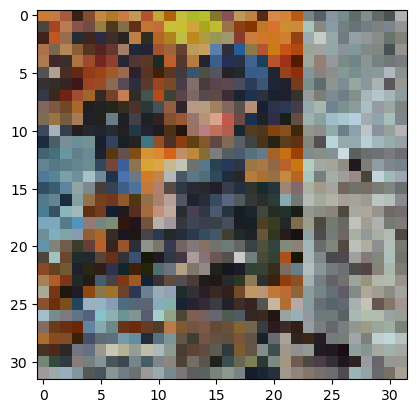

227
File saved successfully


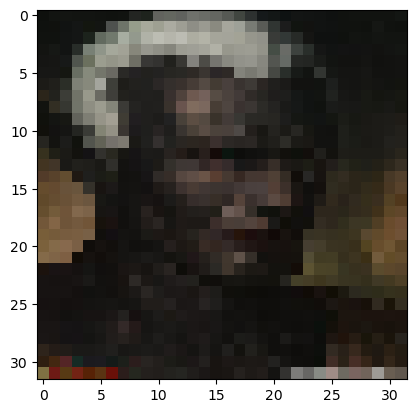

189
File saved successfully


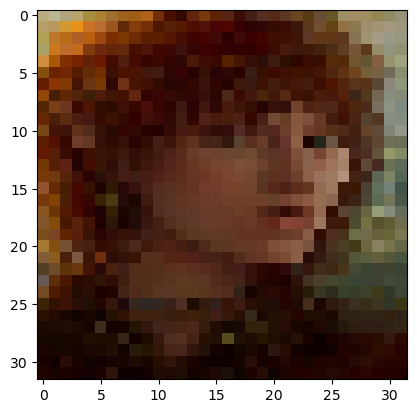

230
File saved successfully


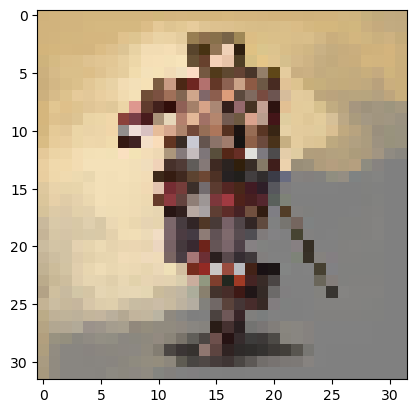

253
File saved successfully


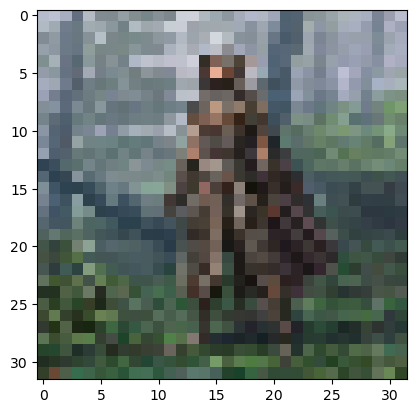

233
File saved successfully


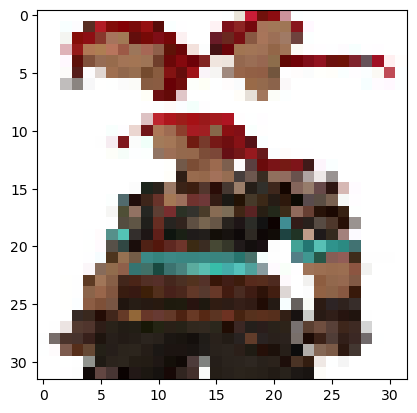

255
File saved successfully


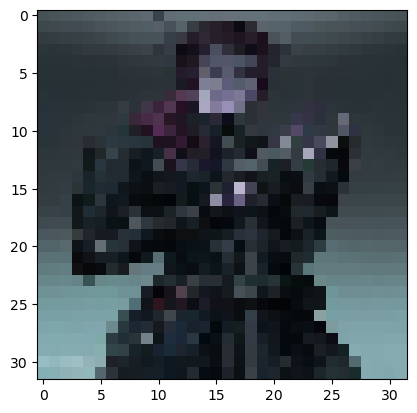

208
File saved successfully


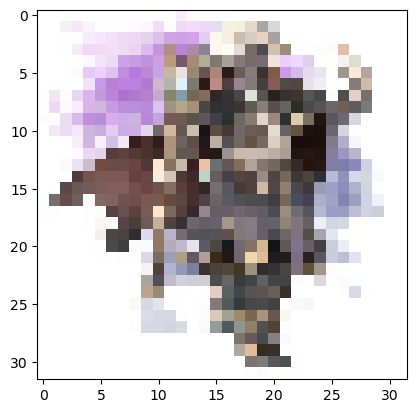

255
File saved successfully


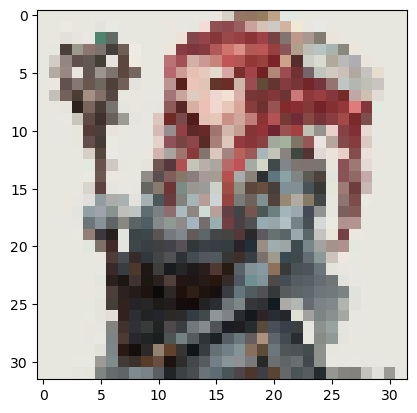

243
File saved successfully


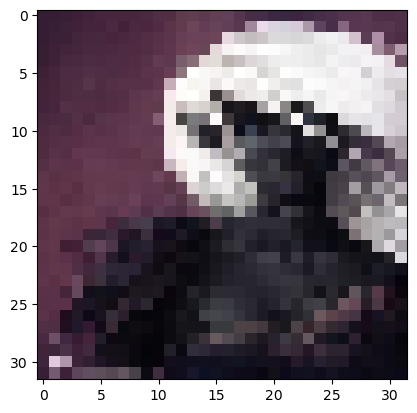

255
File saved successfully


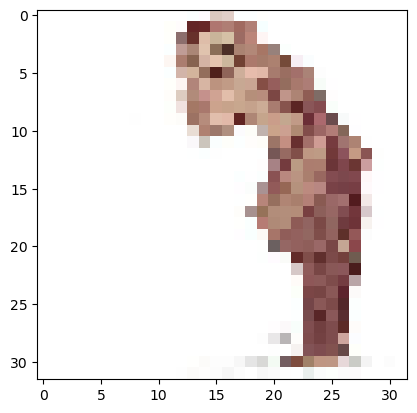

255
File saved successfully


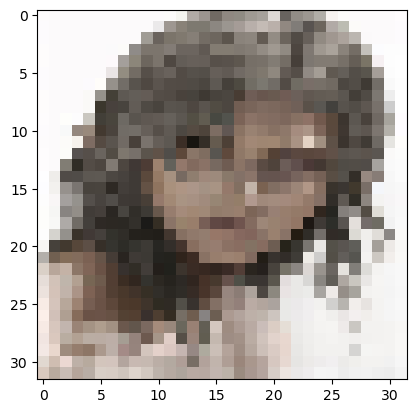

255
File saved successfully


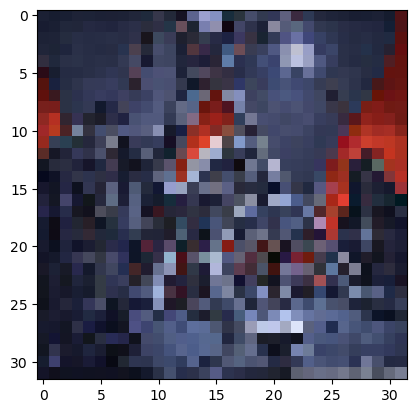

250
File saved successfully


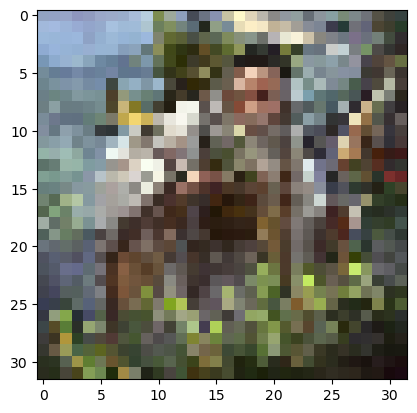

254
File saved successfully


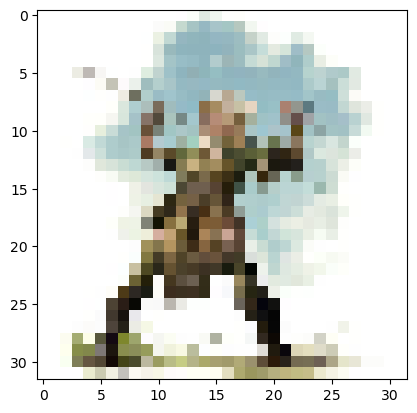

255
File saved successfully


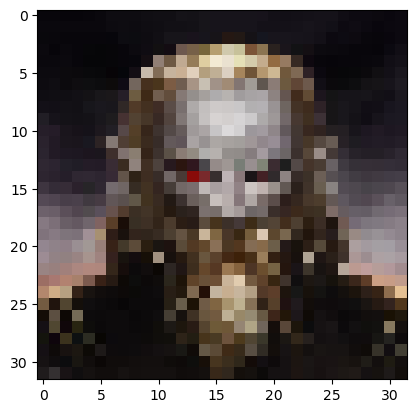

243
File saved successfully


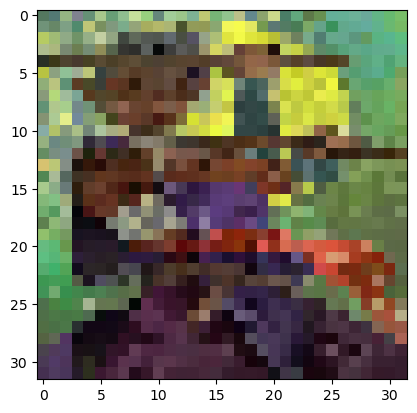

251
File saved successfully


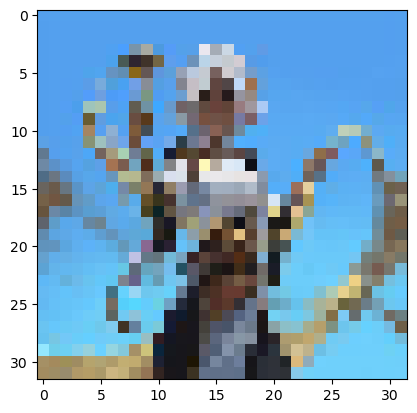

255
File saved successfully


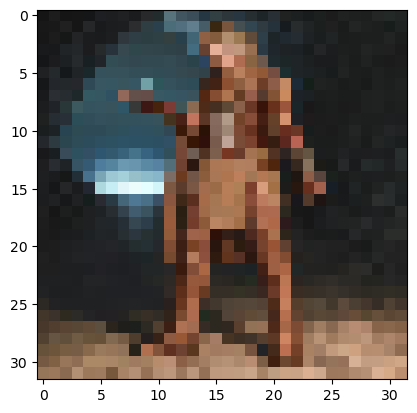

254
File saved successfully


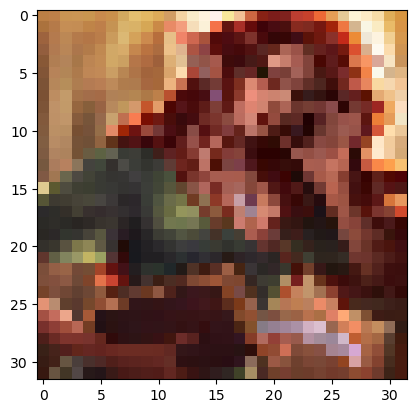

255
File saved successfully


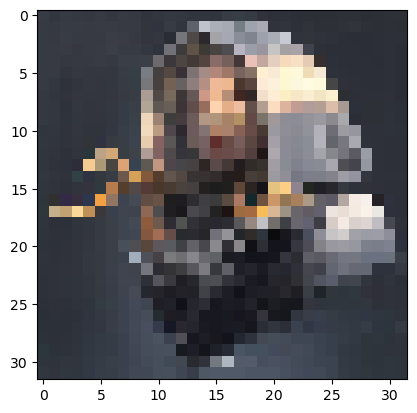

255
File saved successfully


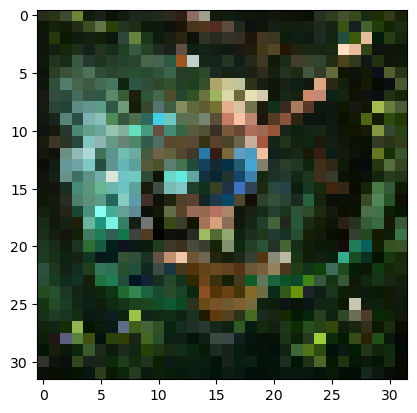

252
File saved successfully


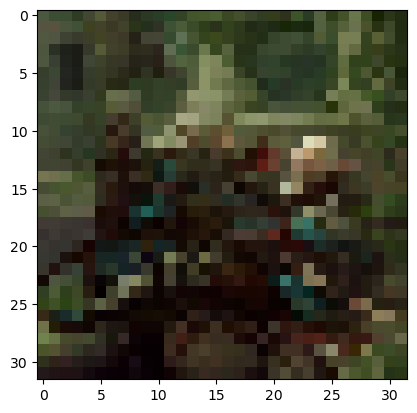

220
File saved successfully


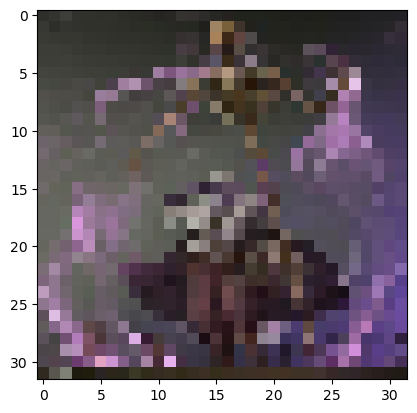

237
File saved successfully


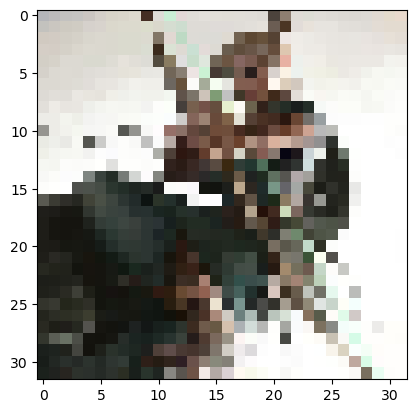

255
File saved successfully


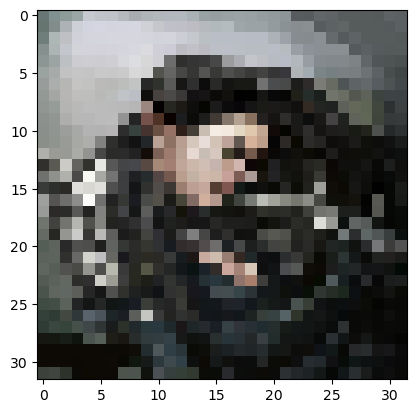

251
File saved successfully


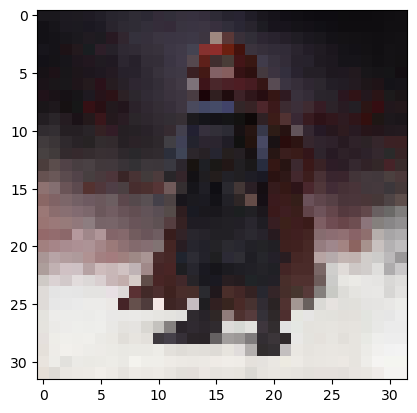

245
File saved successfully


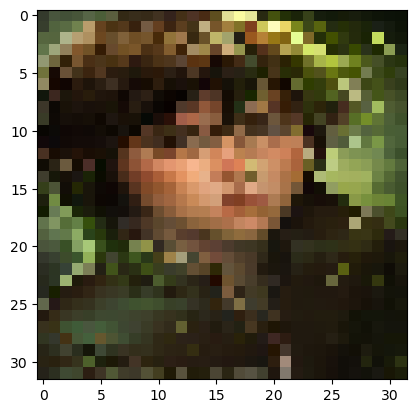

254
File saved successfully


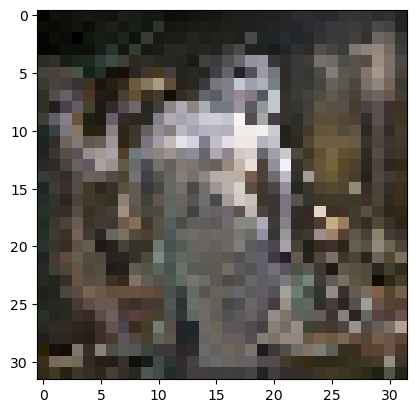

251
File saved successfully


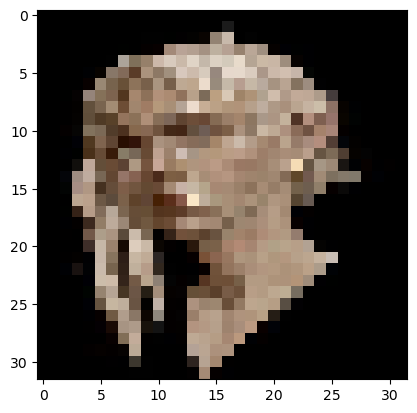

249
File saved successfully


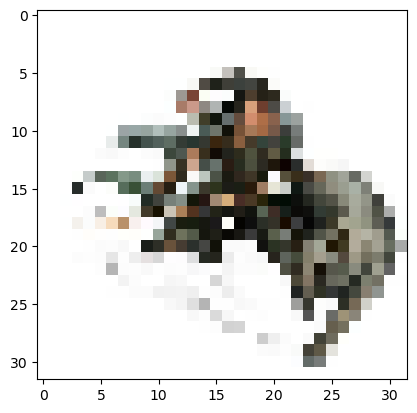

255
File saved successfully


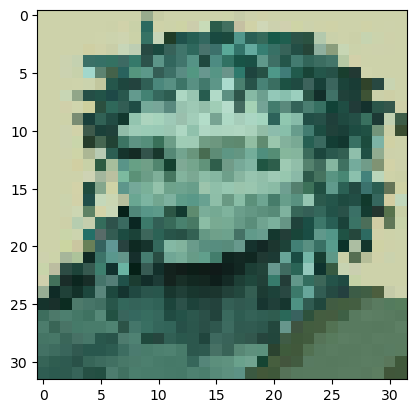

221
File saved successfully


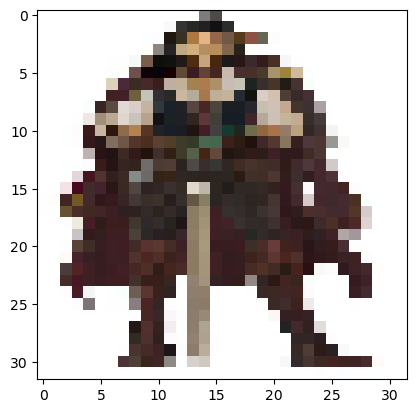

255
File saved successfully


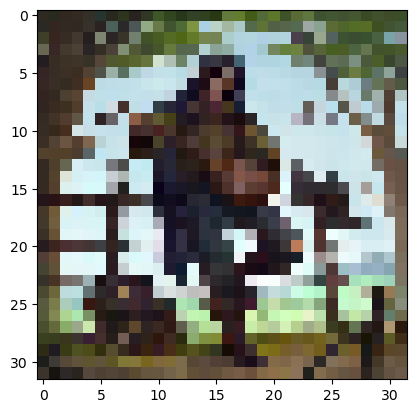

255
File saved successfully


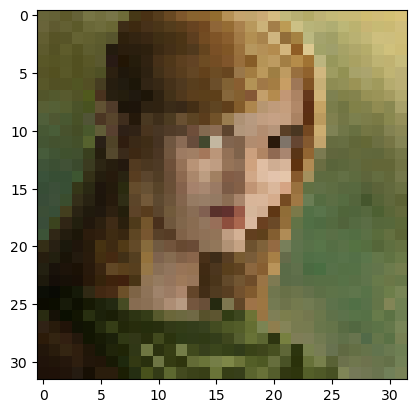

229
File saved successfully


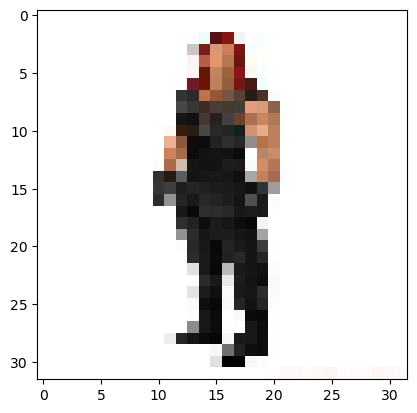

255
File saved successfully


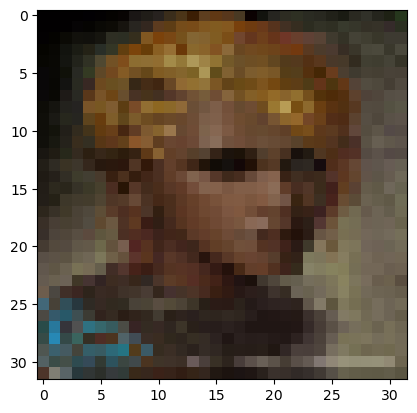

184
File saved successfully


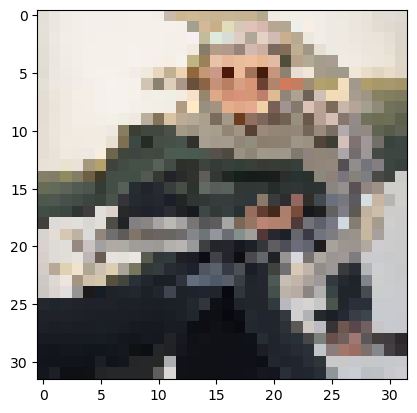

255
File saved successfully


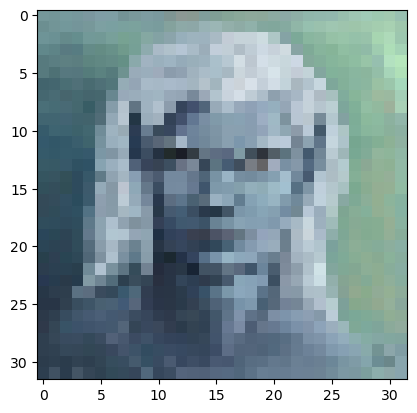

234
File saved successfully


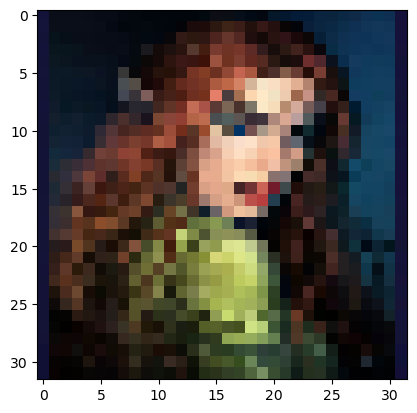

255
File saved successfully


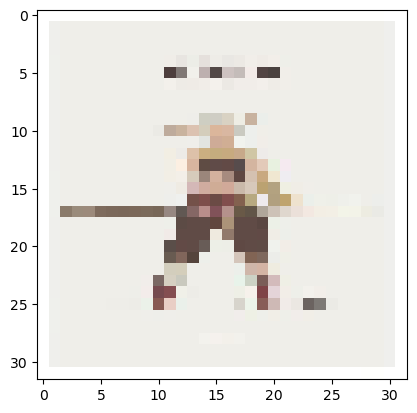

255
File saved successfully


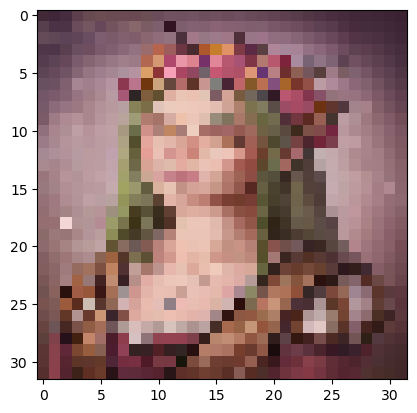

246
File saved successfully


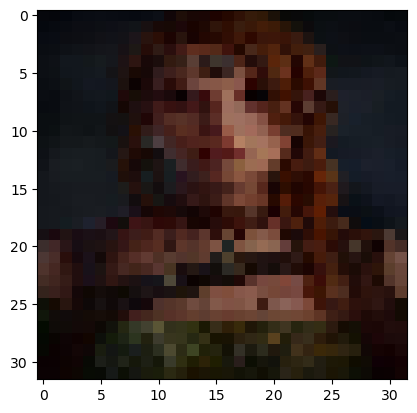

180
File saved successfully


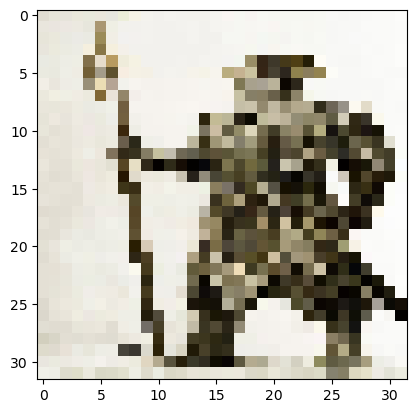

255
File saved successfully


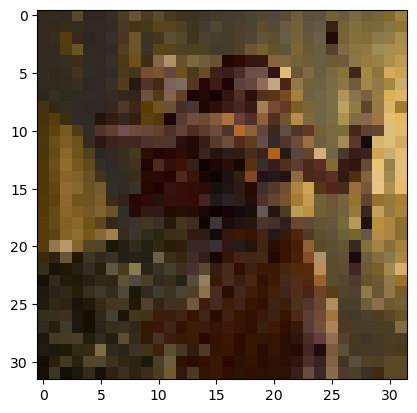

234
File saved successfully


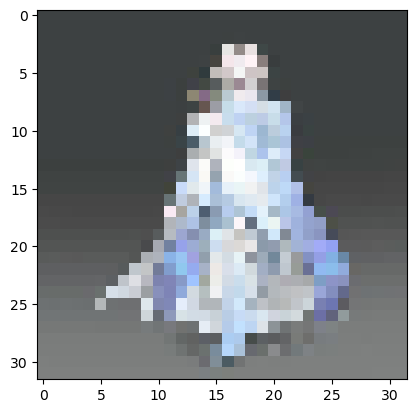

255
File saved successfully


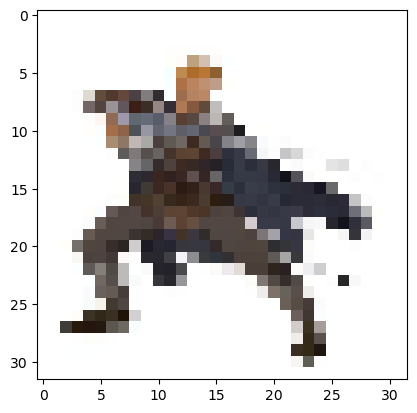

255
File saved successfully


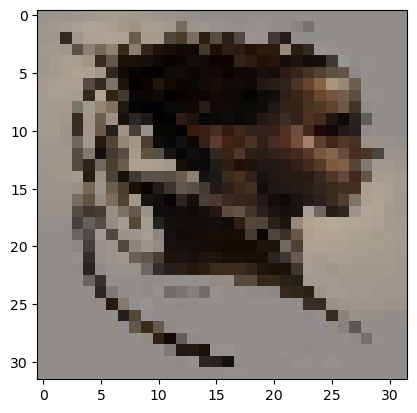

181
File saved successfully


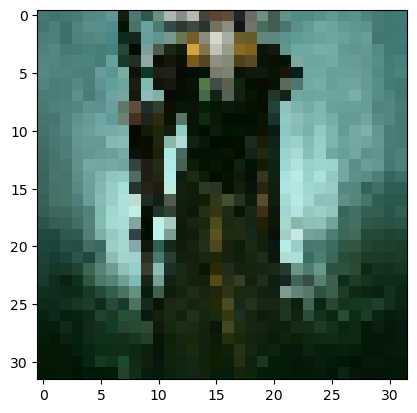

241
File saved successfully


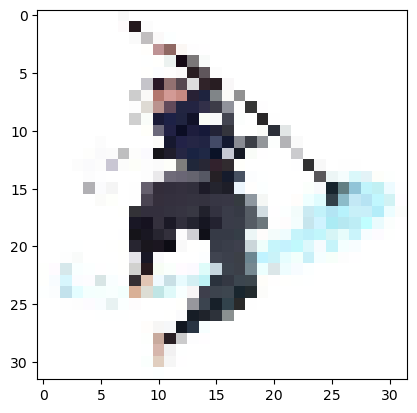

255
File saved successfully


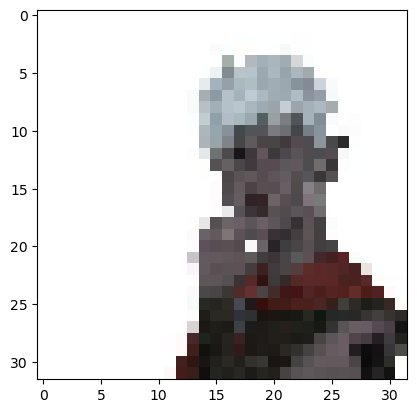

255
File saved successfully


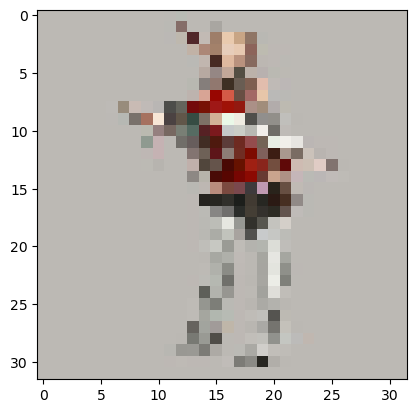

249
File saved successfully


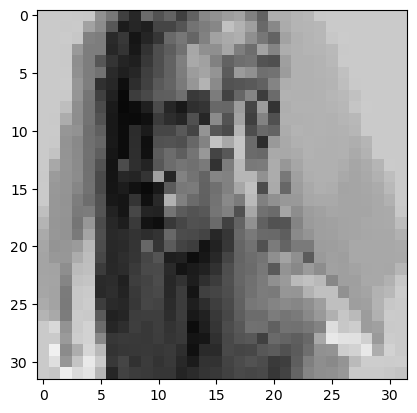

240
File saved successfully


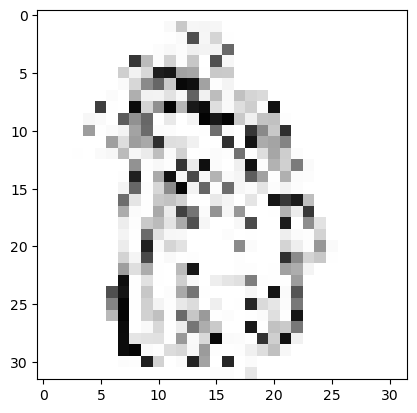

255
File saved successfully


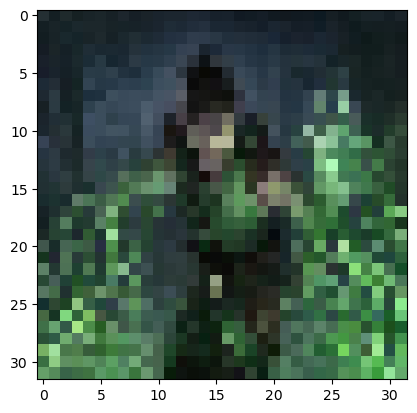

251
File saved successfully


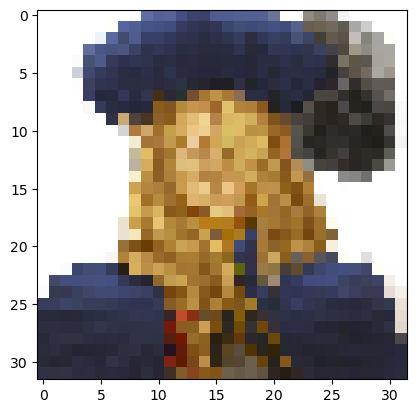

255
File saved successfully


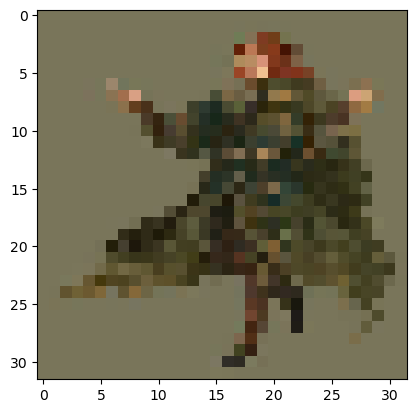

240
File saved successfully


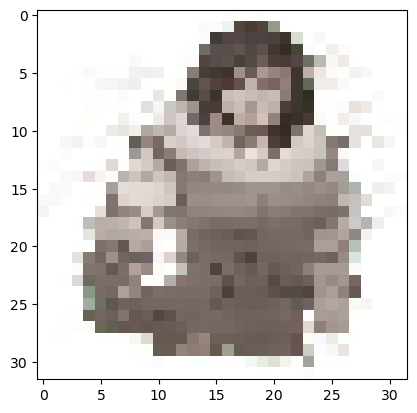

255
File saved successfully


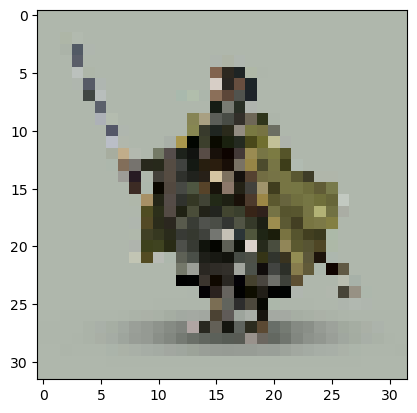

219
File saved successfully


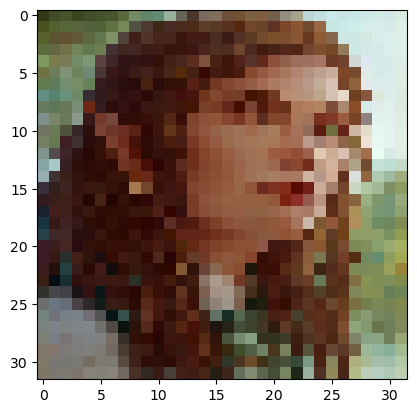

254
File saved successfully


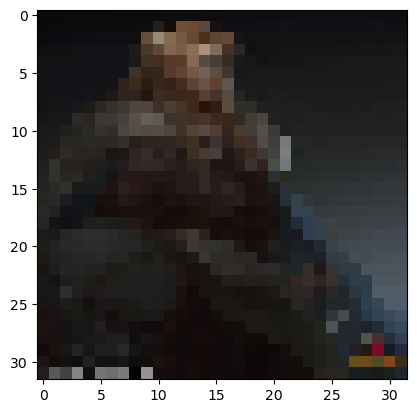

172
File saved successfully


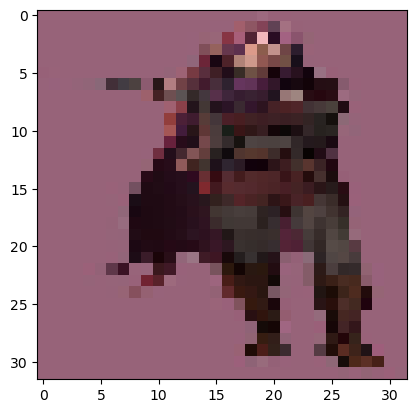

241
File saved successfully


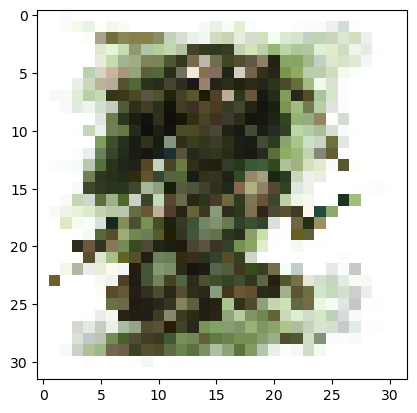

255
File saved successfully


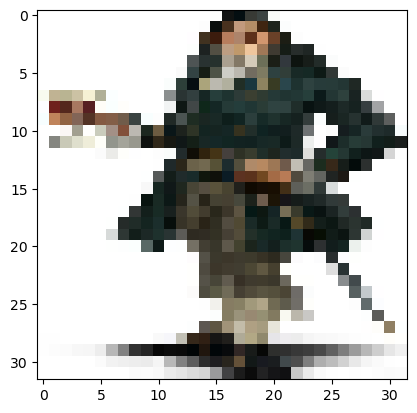

255
File saved successfully


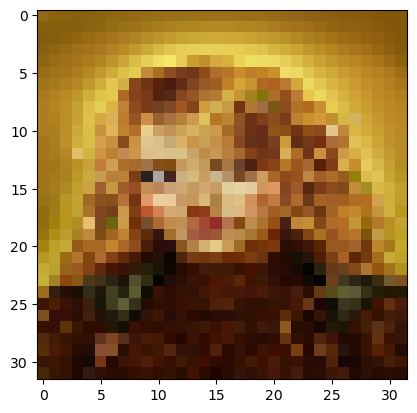

244
File saved successfully


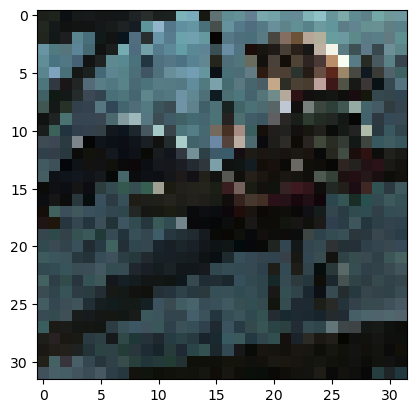

253
File saved successfully


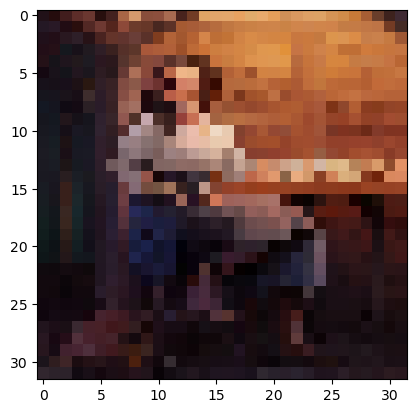

239
File saved successfully


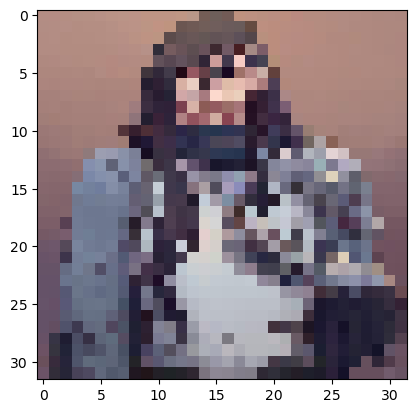

252
File saved successfully


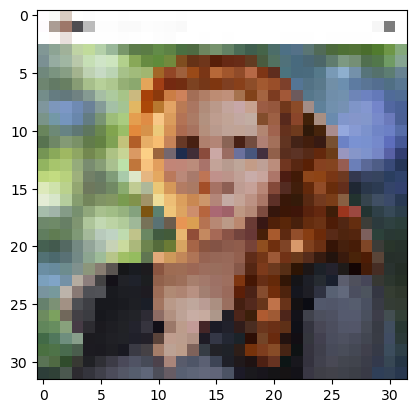

255
File saved successfully


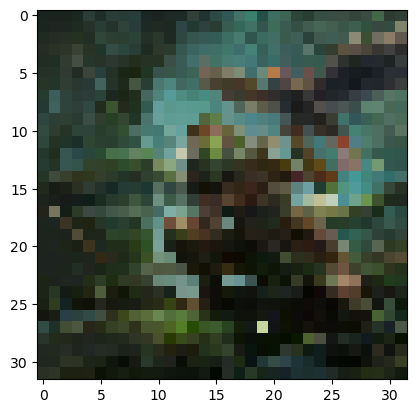

214
File saved successfully


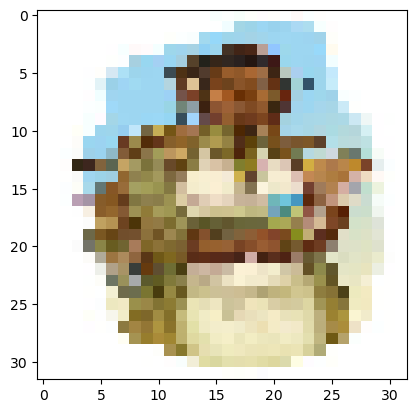

255
File saved successfully


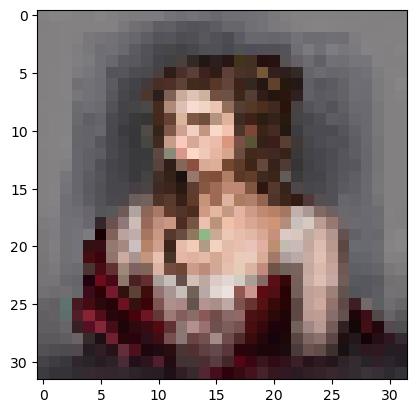

253
File saved successfully


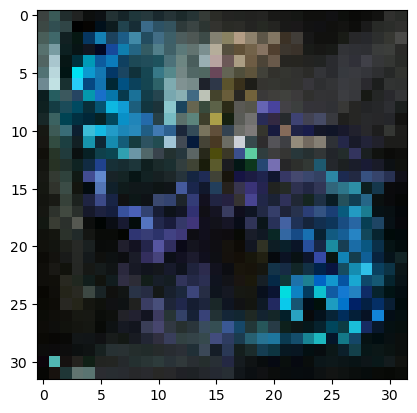

247
File saved successfully


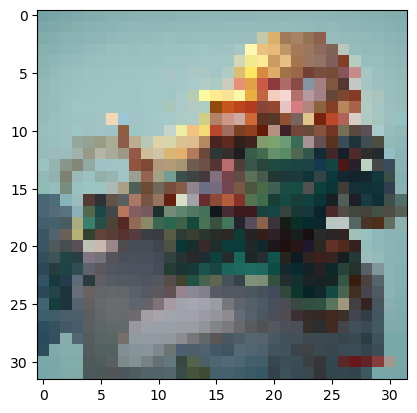

254
File saved successfully


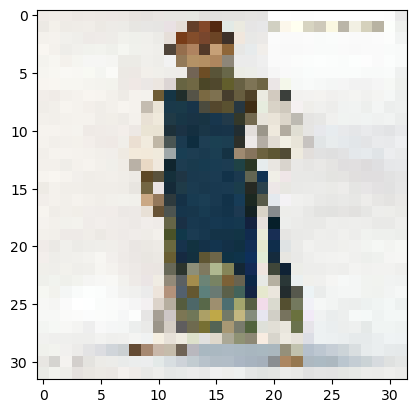

255
File saved successfully


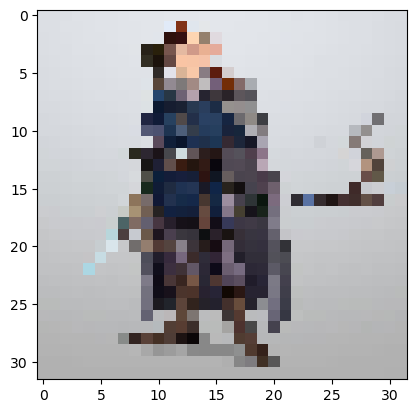

253
File saved successfully


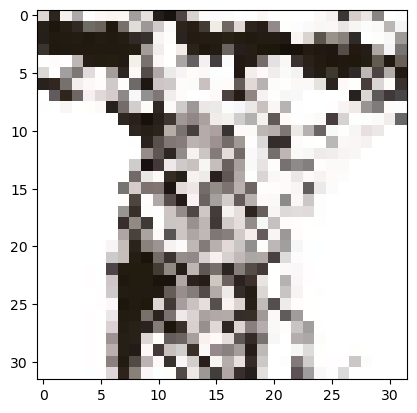

255
File saved successfully


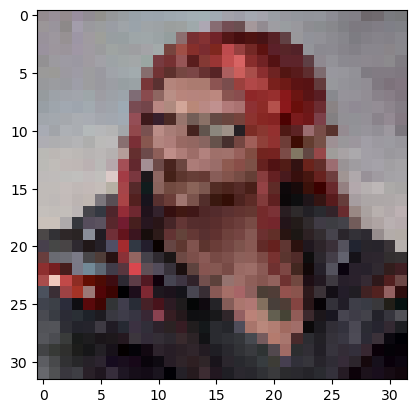

240
File saved successfully


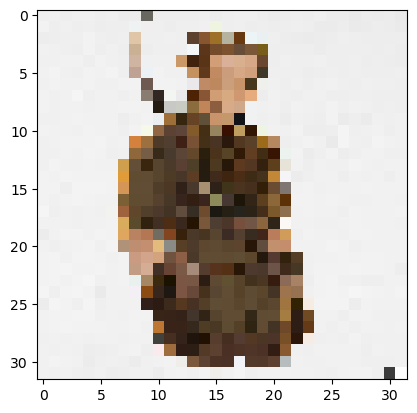

253
File saved successfully


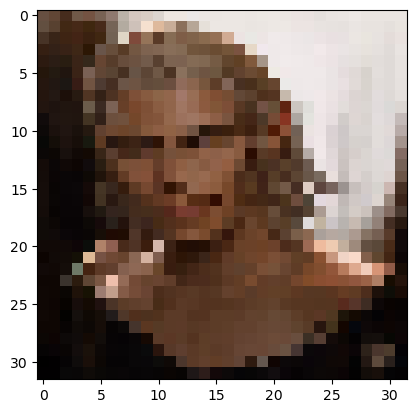

250
File saved successfully


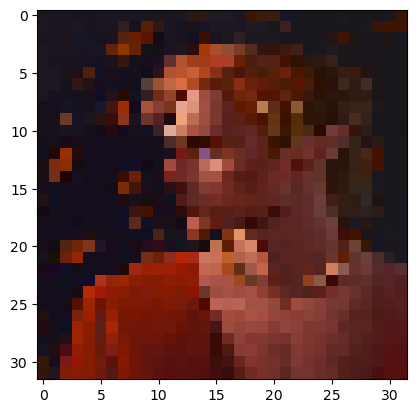

240
File saved successfully


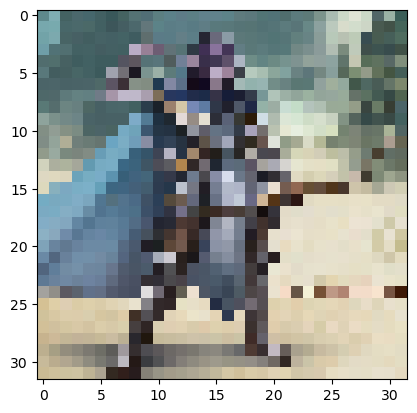

248
File saved successfully


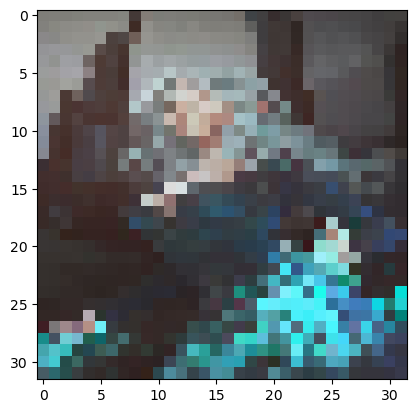

254
File saved successfully


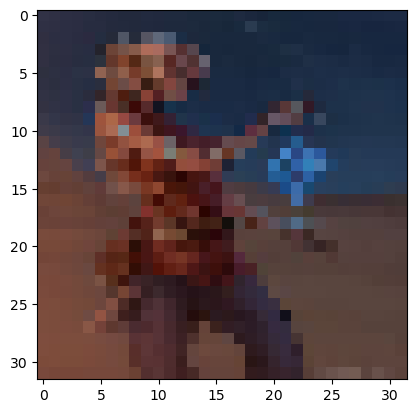

199
File saved successfully


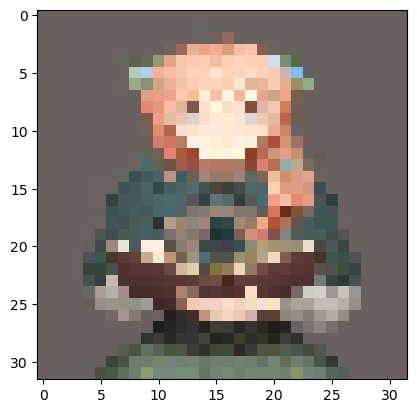

255
File saved successfully


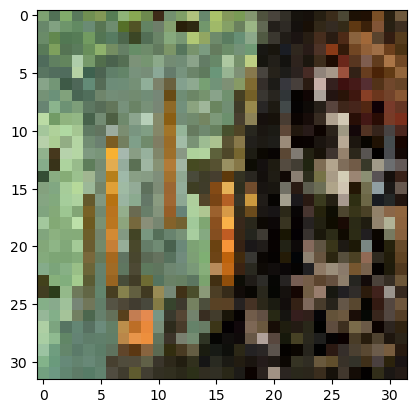

1.0
File saved successfully


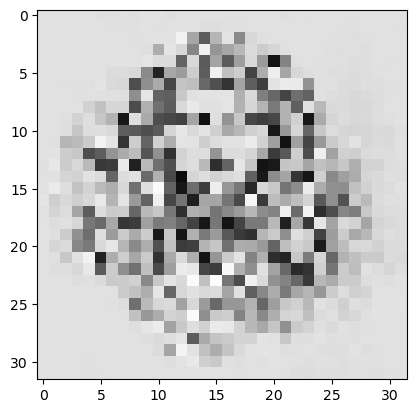

252
File saved successfully


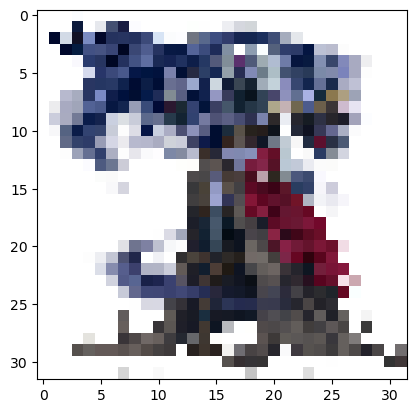

255
File saved successfully


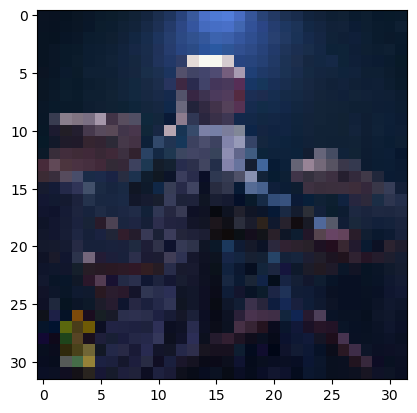

248
File saved successfully


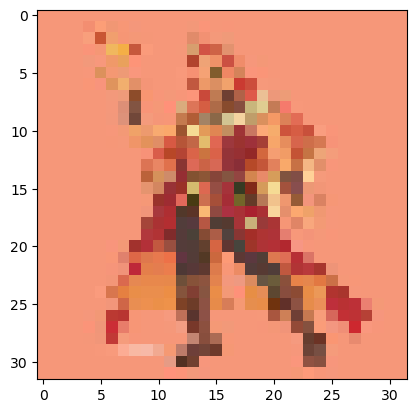

255
File saved successfully


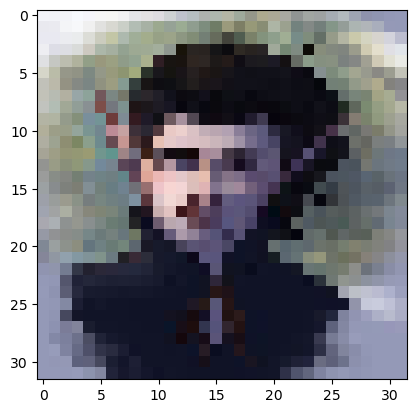

253
File saved successfully


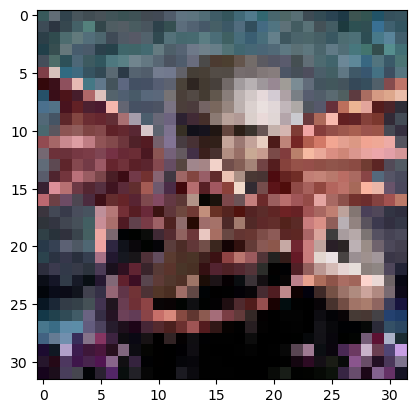

253
File saved successfully


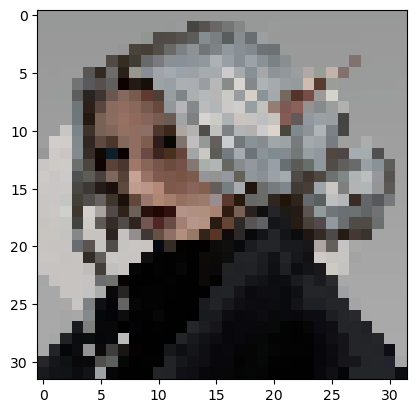

221
File saved successfully


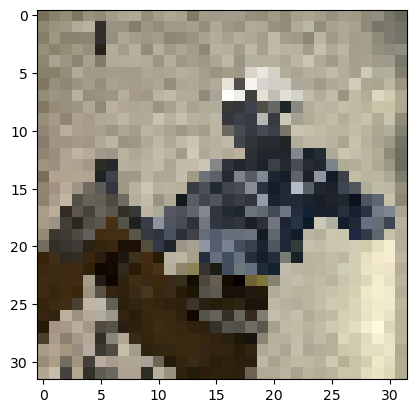

255
File saved successfully


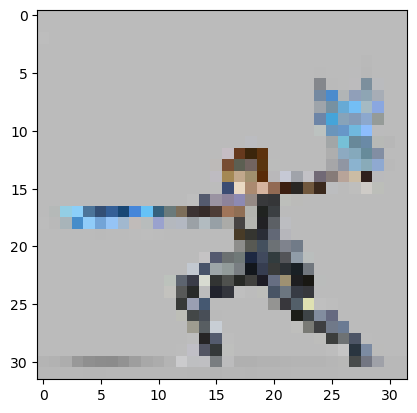

253
File saved successfully


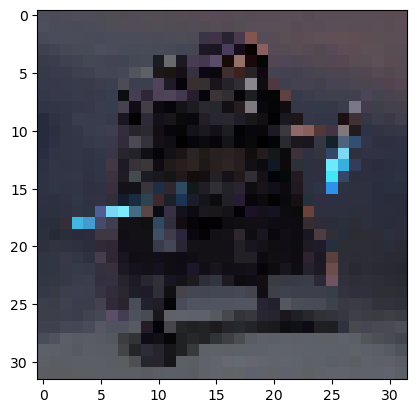

254
File saved successfully


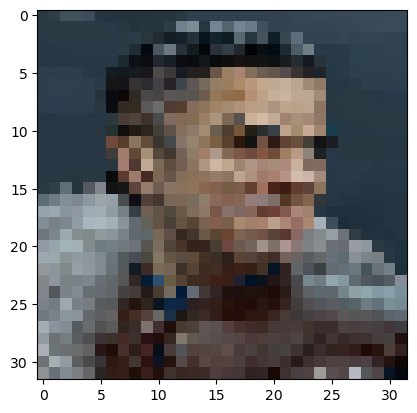

213
File saved successfully


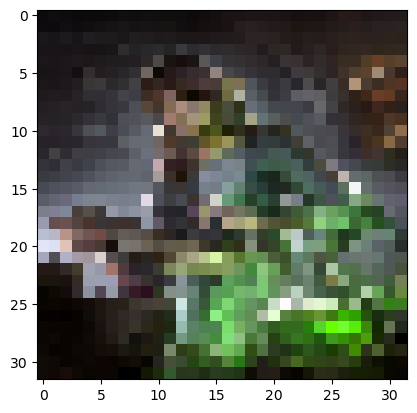

255
File saved successfully


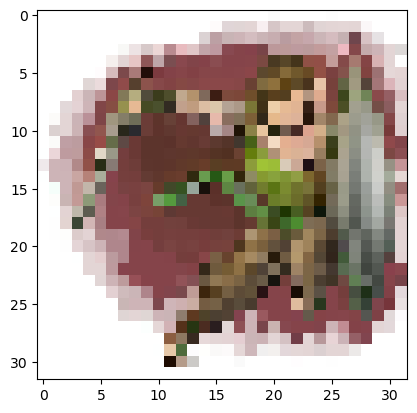

255
File saved successfully


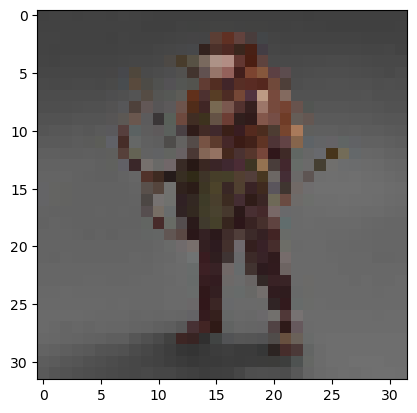

188
File saved successfully


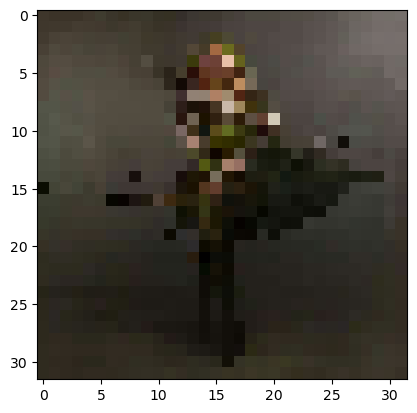

232
File saved successfully


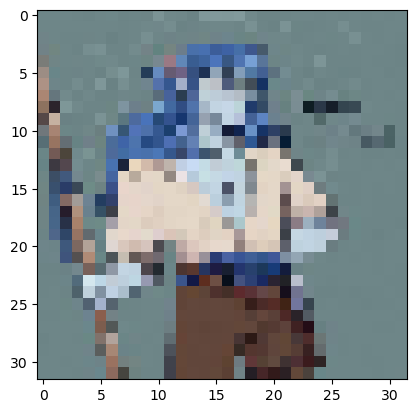

244
File saved successfully


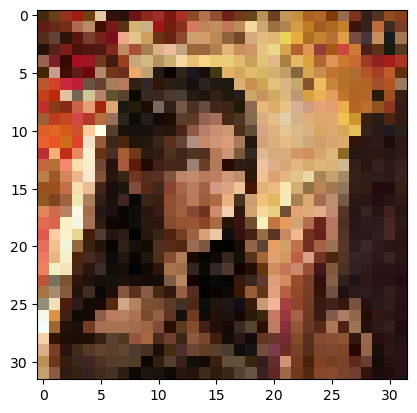

255
File saved successfully


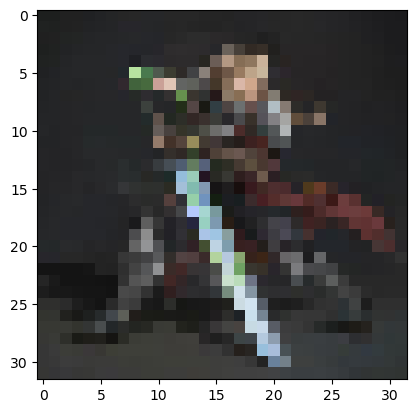

253
File saved successfully


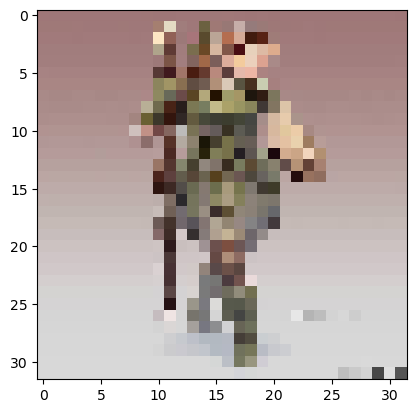

253
File saved successfully


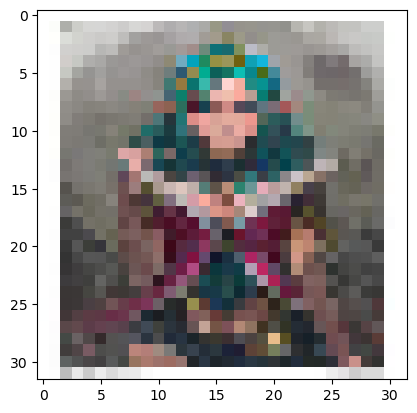

255
File saved successfully


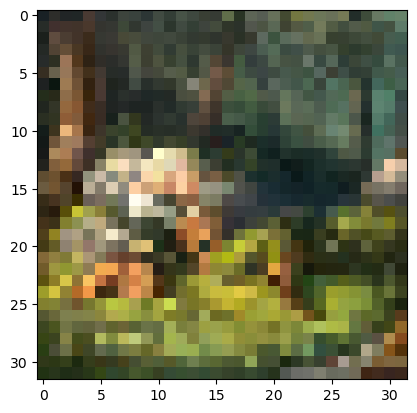

255
File saved successfully


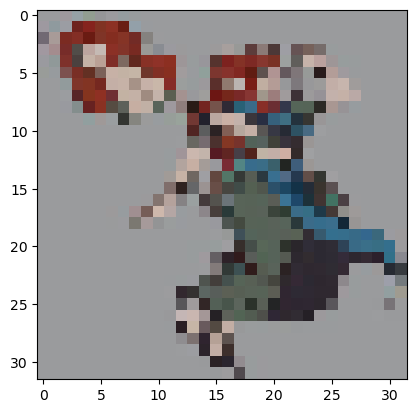

207
File saved successfully


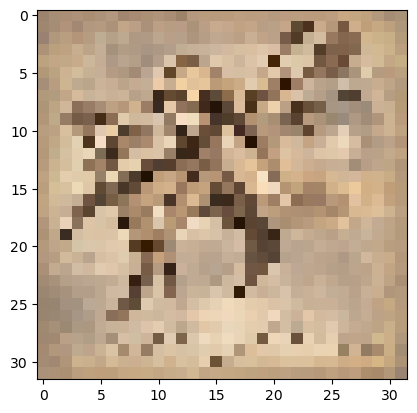

248
File saved successfully


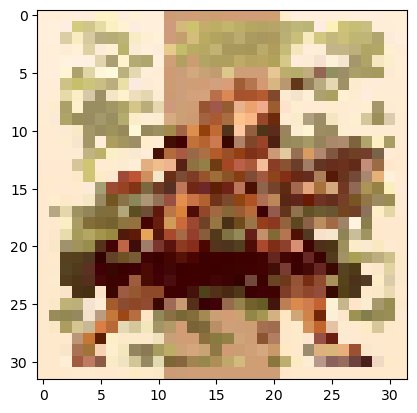

255
File saved successfully


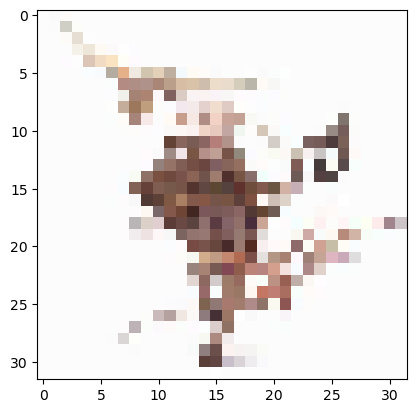

255
File saved successfully


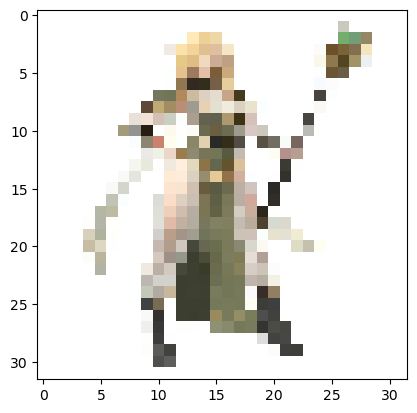

255
File saved successfully


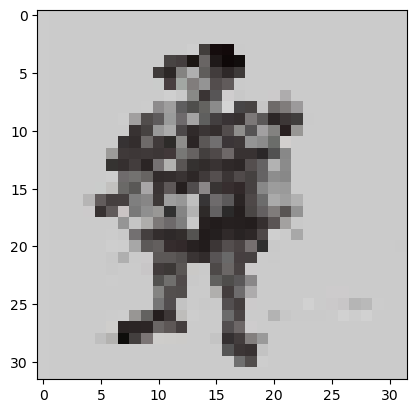

212
File saved successfully


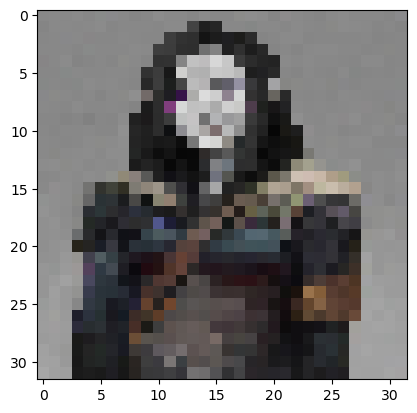

220
File saved successfully


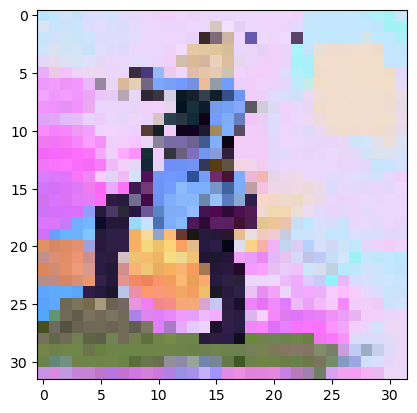

255
File saved successfully


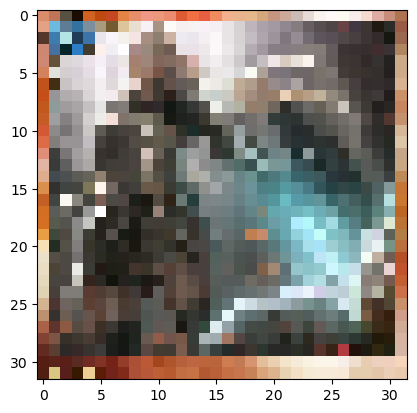

254
File saved successfully


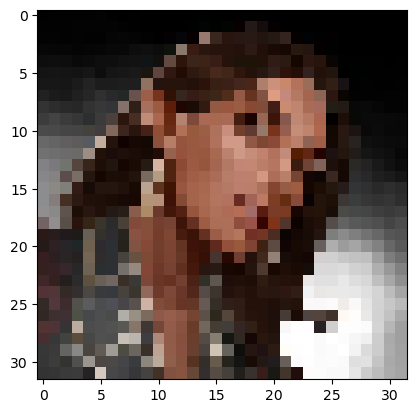

255
File saved successfully


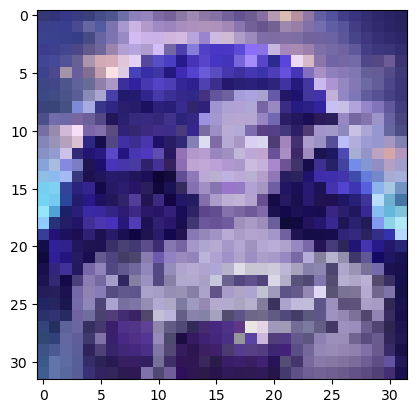

255
File saved successfully


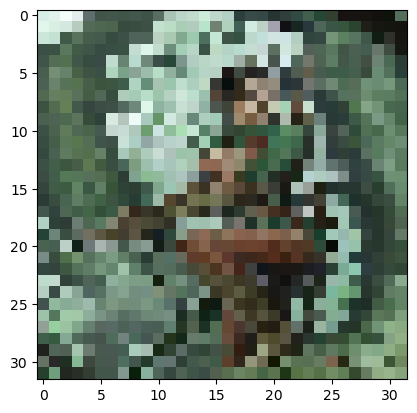

254
File saved successfully


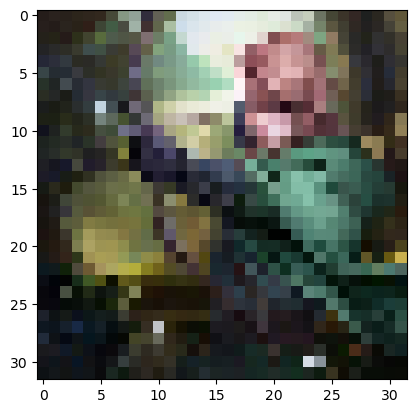

255
File saved successfully


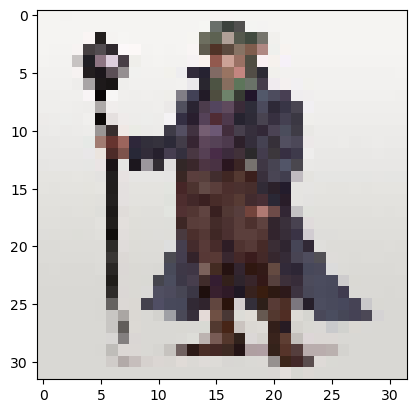

252
File saved successfully


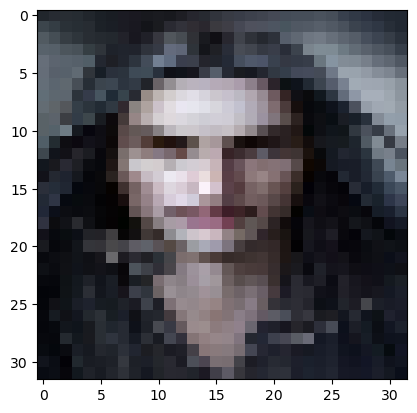

251
File saved successfully


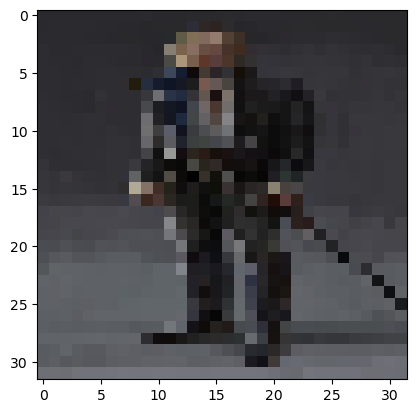

175
File saved successfully


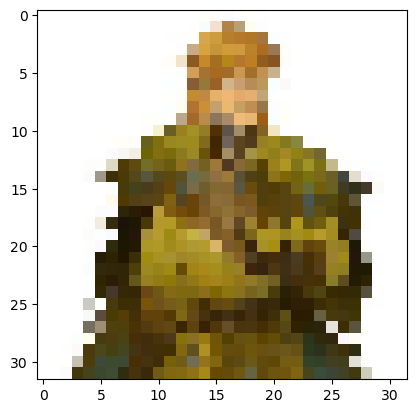

255
File saved successfully


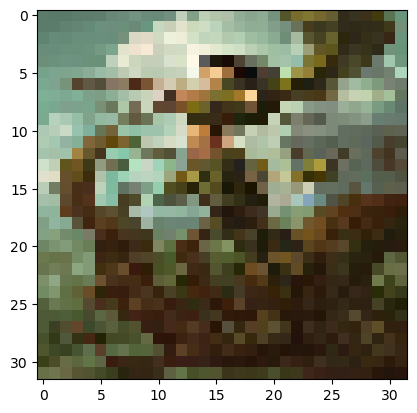

255
File saved successfully


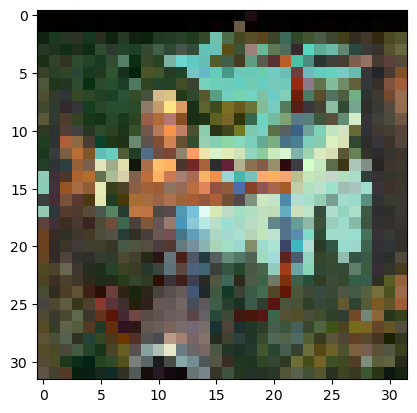

255
File saved successfully


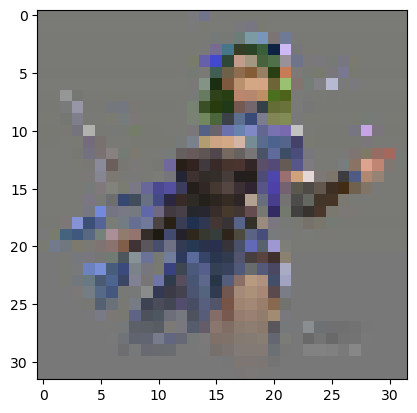

243
File saved successfully


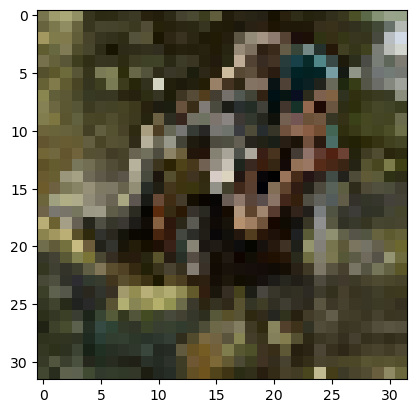

229
File saved successfully


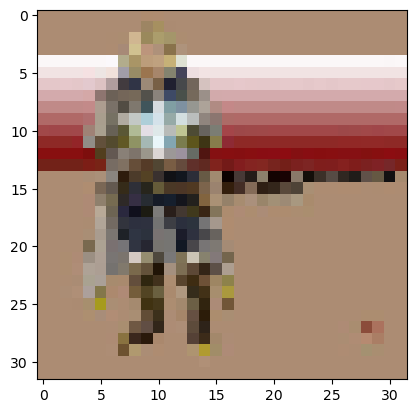

251
File saved successfully


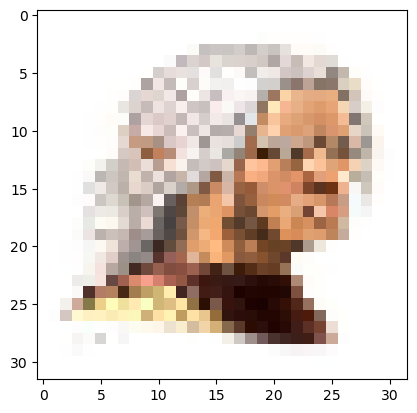

255
File saved successfully


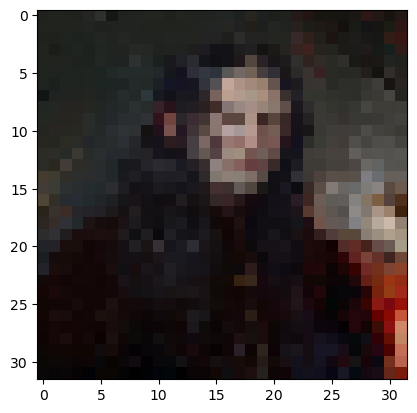

206
File saved successfully


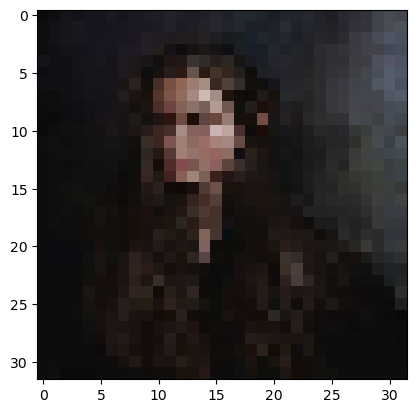

205
File saved successfully


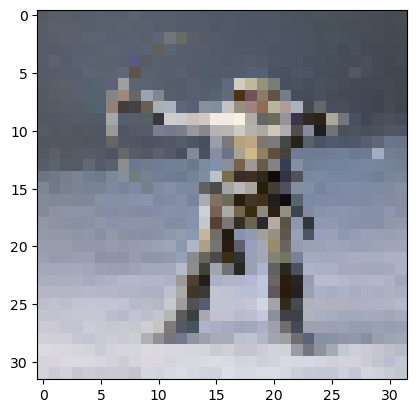

243
File saved successfully


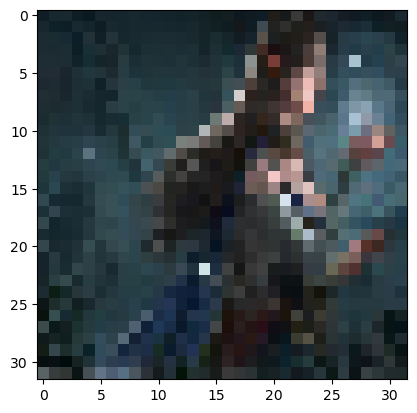

244
File saved successfully


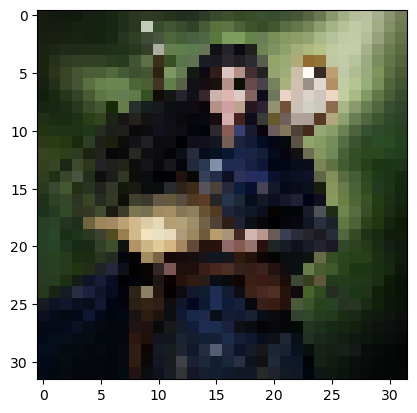

253
File saved successfully


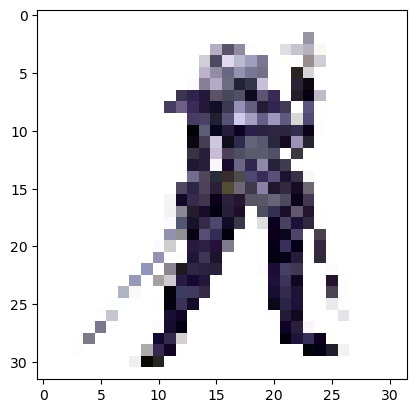

255
File saved successfully


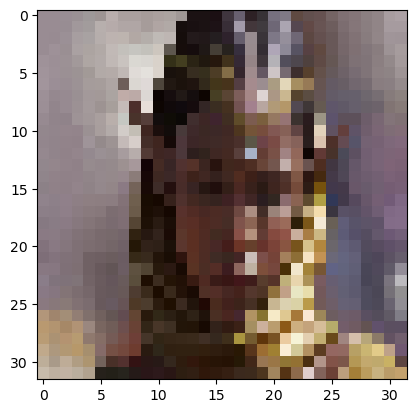

250
File saved successfully


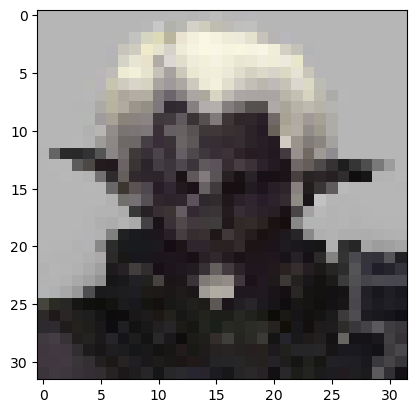

250
File saved successfully


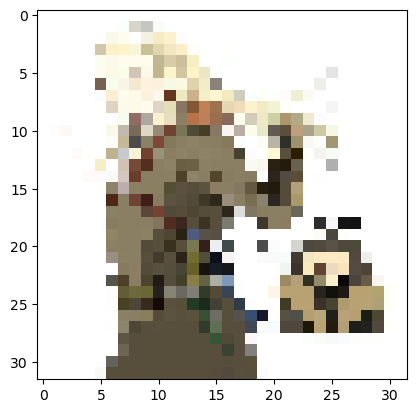

255
File saved successfully


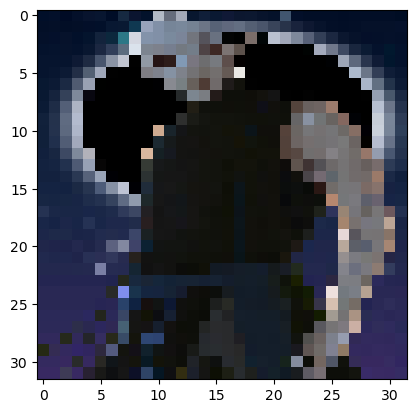

238
File saved successfully


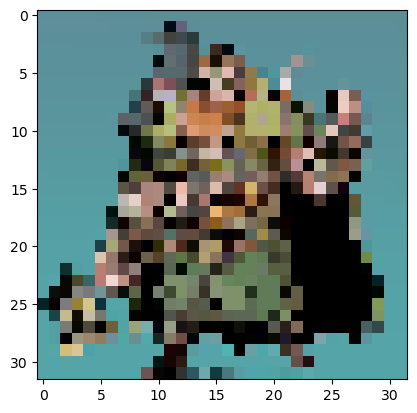

243
File saved successfully


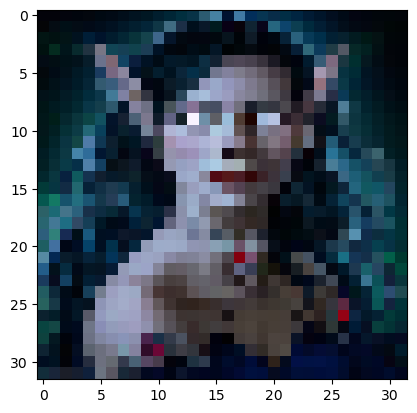

255
File saved successfully


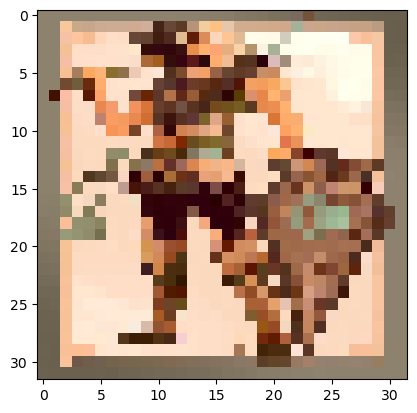

255
File saved successfully


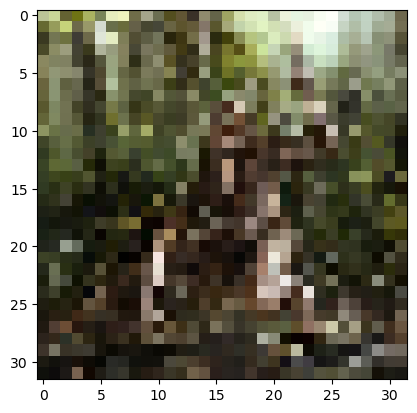

255
File saved successfully


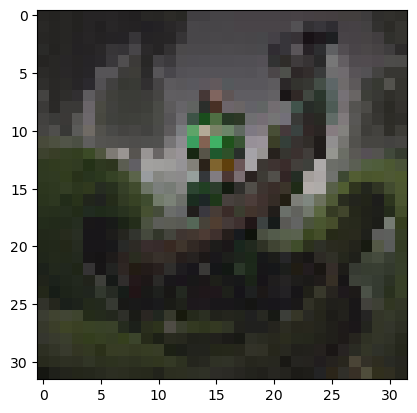

179
File saved successfully


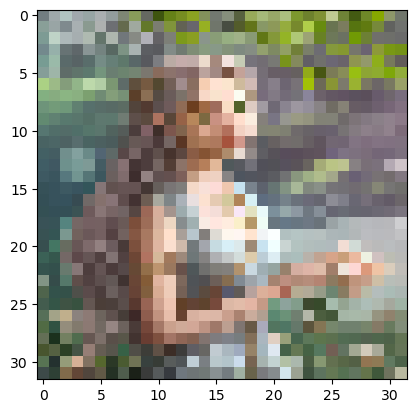

255
File saved successfully


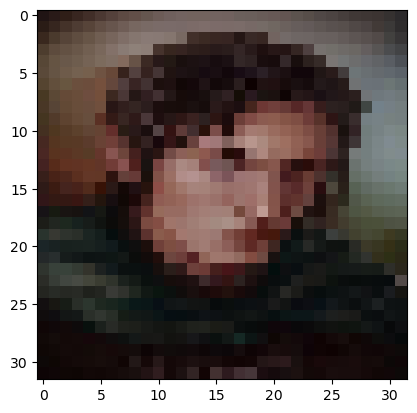

191
File saved successfully


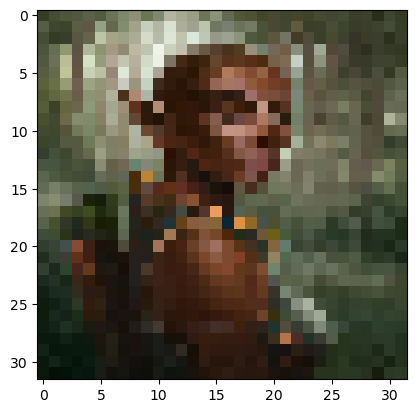

244
File saved successfully


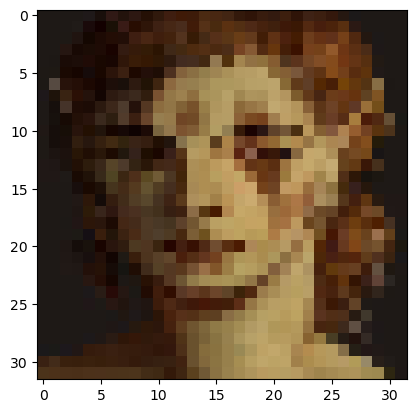

204
File saved successfully


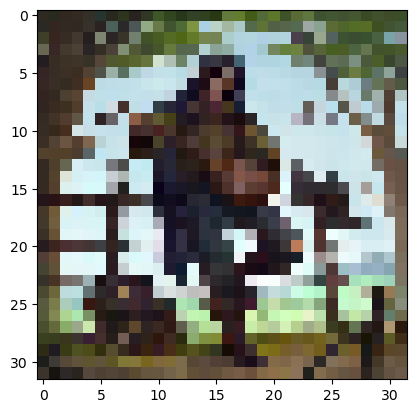

255
File saved successfully


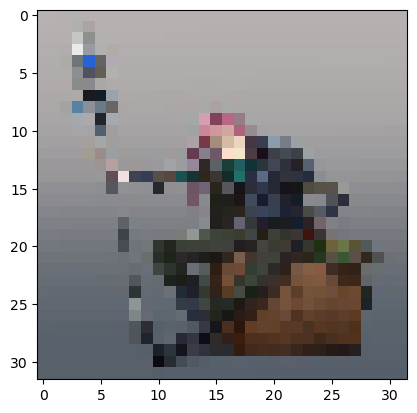

252
File saved successfully


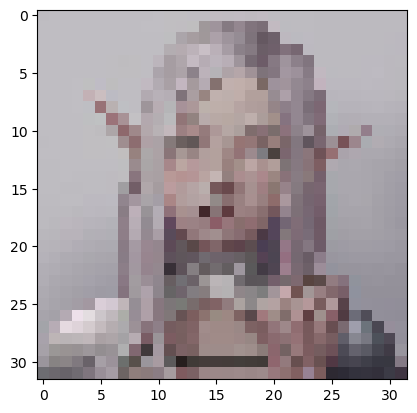

237
File saved successfully


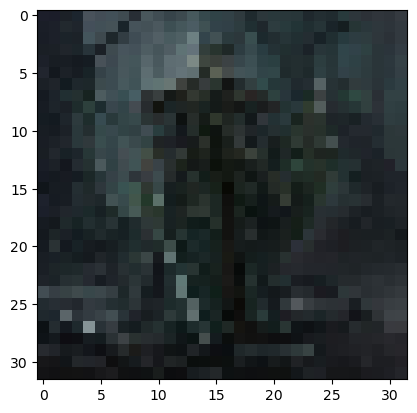

150
File saved successfully


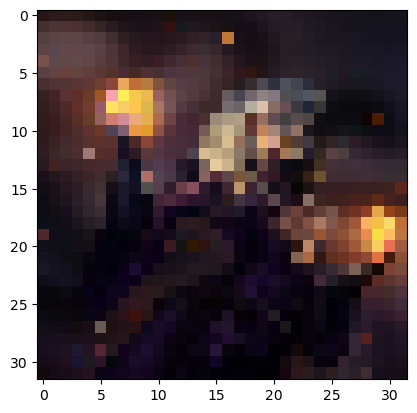

255
File saved successfully


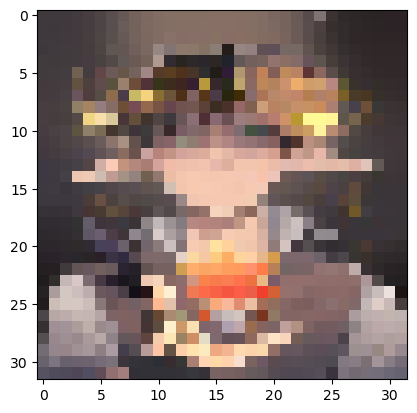

255
File saved successfully


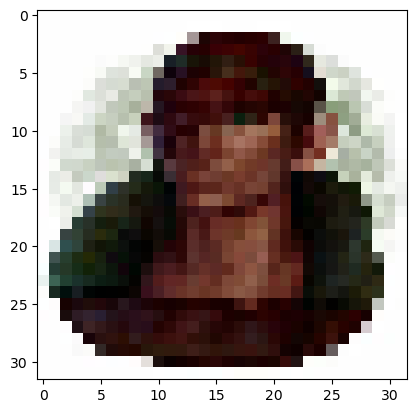

255
File saved successfully


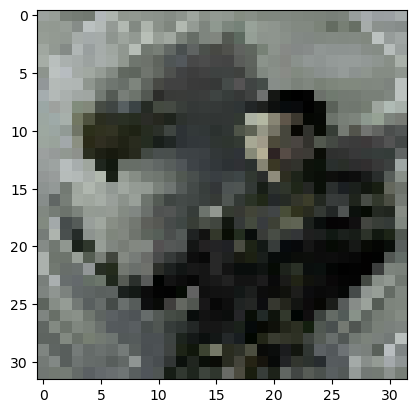

195
File saved successfully


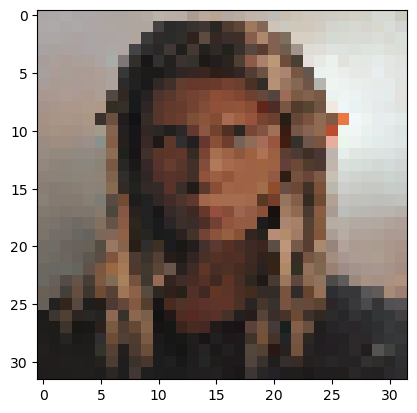

250
File saved successfully


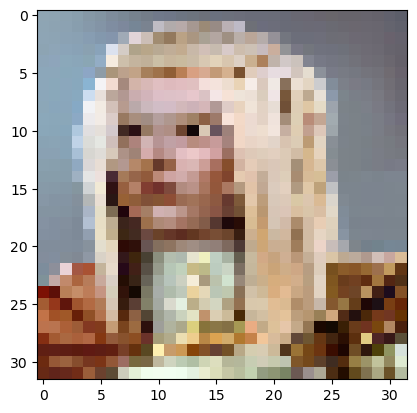

254
File saved successfully


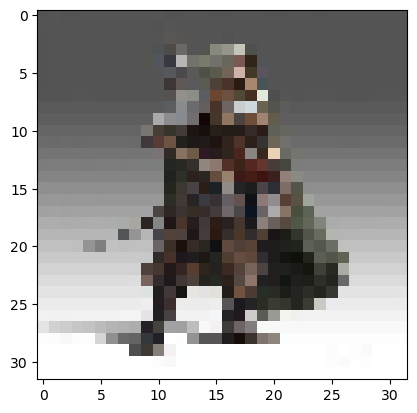

255
File saved successfully


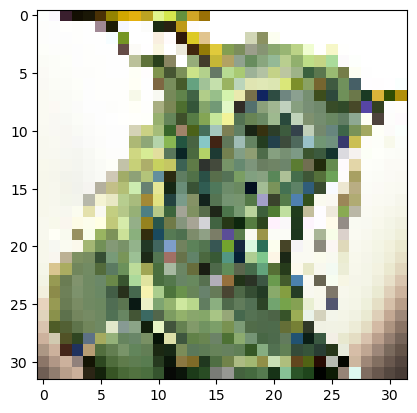

255
File saved successfully


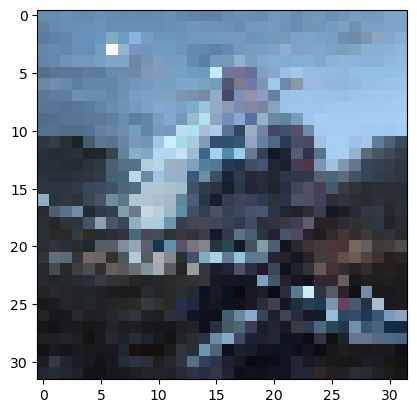

254
File saved successfully


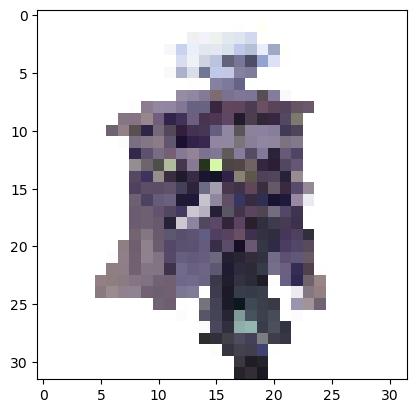

255
File saved successfully


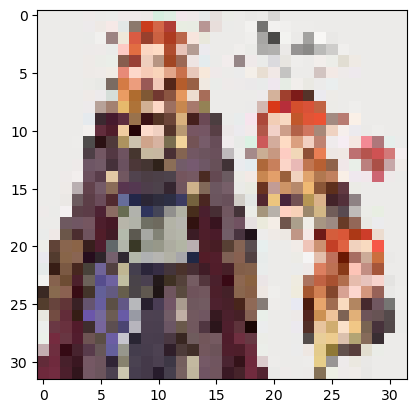

255
File saved successfully


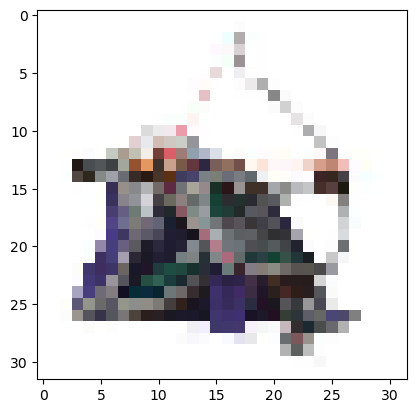

255
File saved successfully


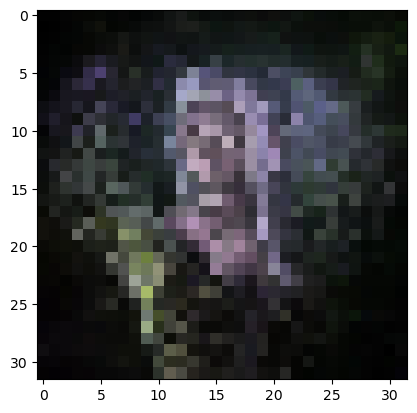

202
File saved successfully


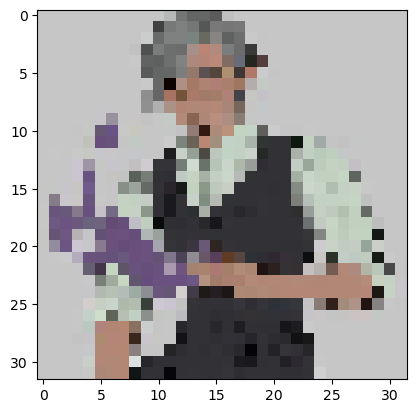

225
File saved successfully


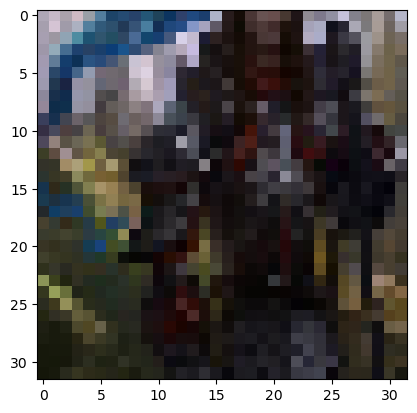

232
File saved successfully


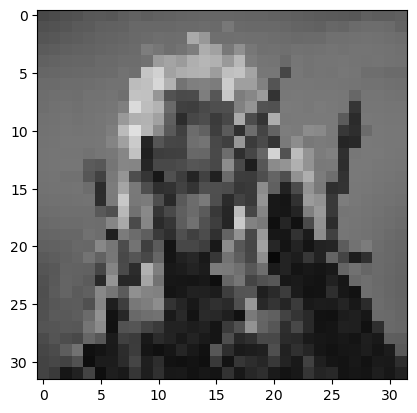

224
File saved successfully


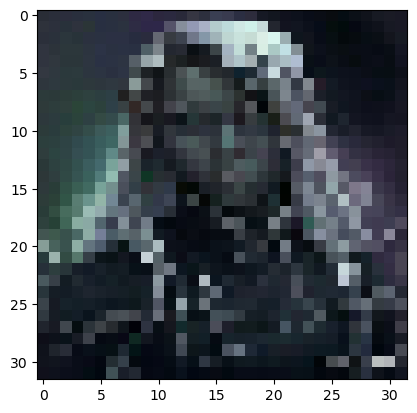

246
File saved successfully


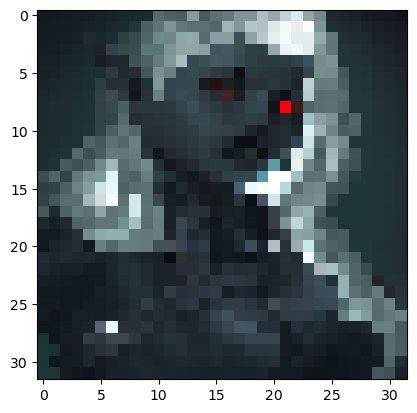

255
File saved successfully


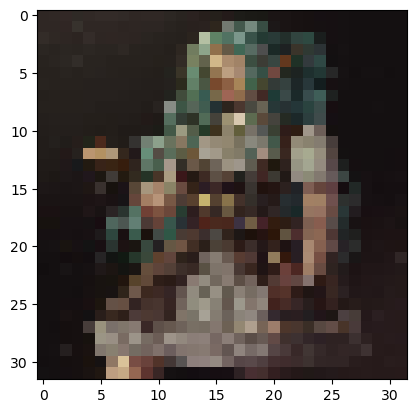

217
File saved successfully


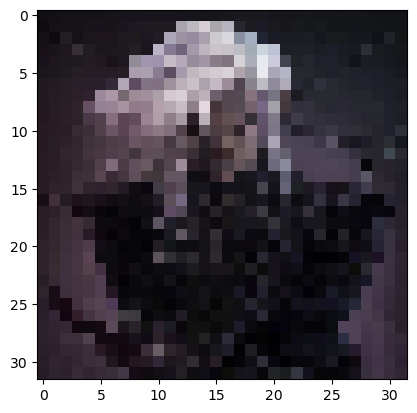

240
File saved successfully


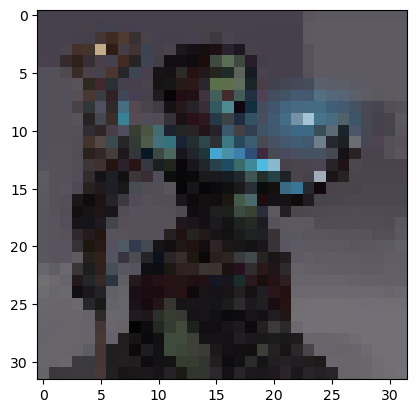

226
File saved successfully


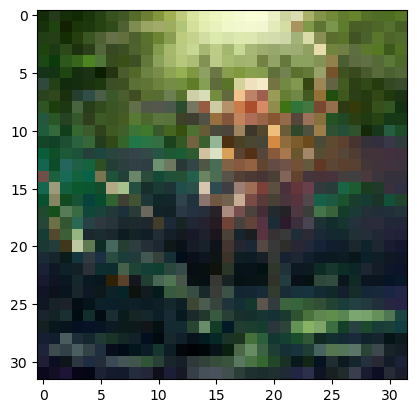

254
File saved successfully


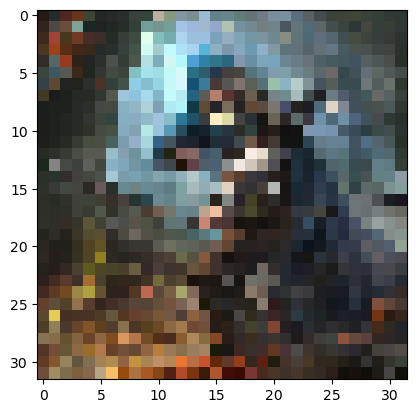

255
File saved successfully


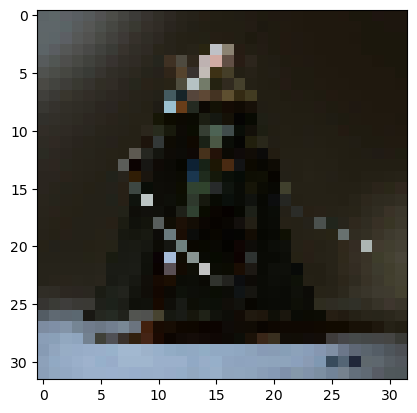

216
File saved successfully


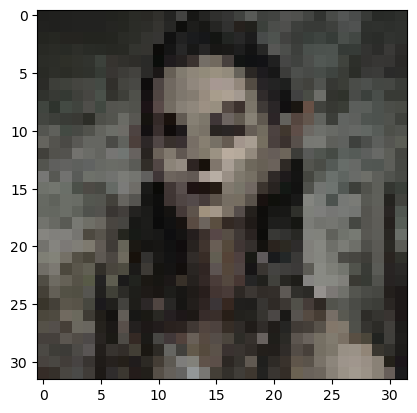

185
File saved successfully


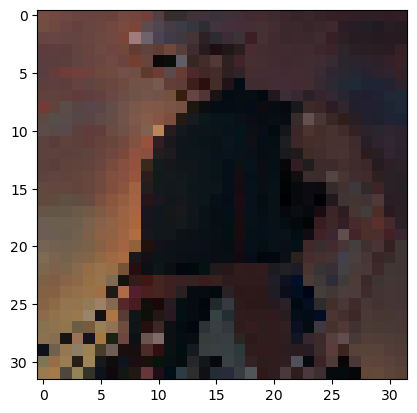

185
File saved successfully


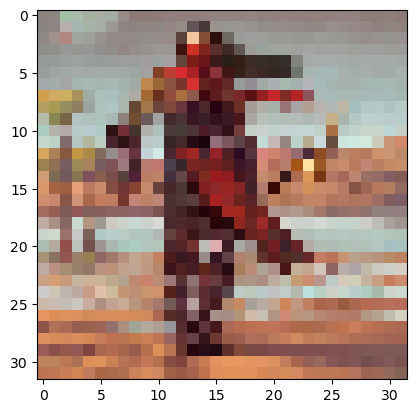

255
File saved successfully


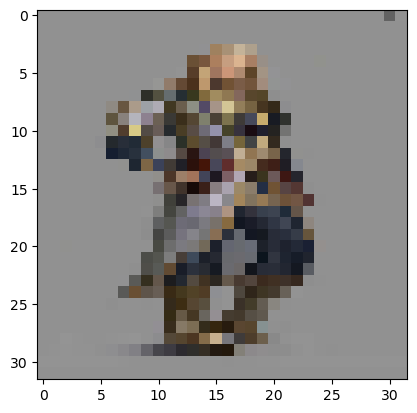

219
File saved successfully


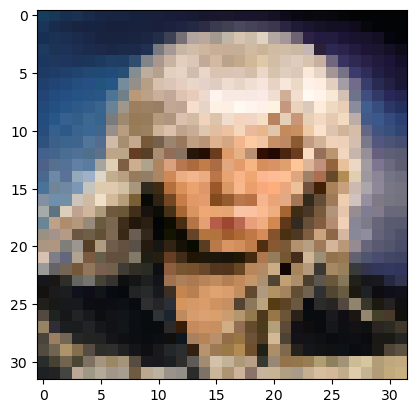

255
File saved successfully


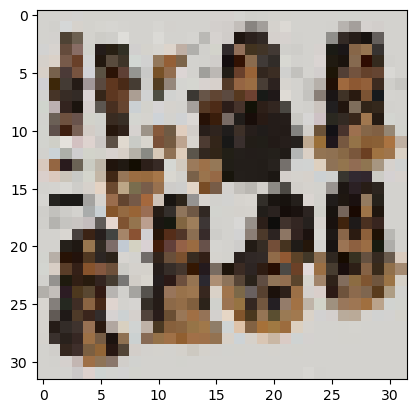

230
File saved successfully


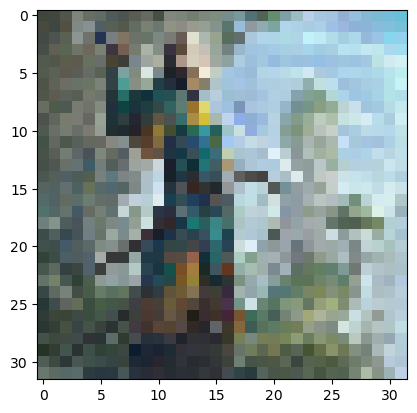

251
File saved successfully


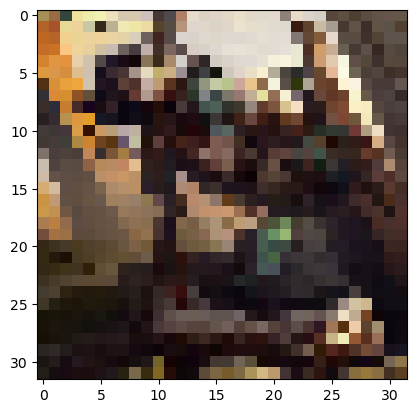

254
File saved successfully


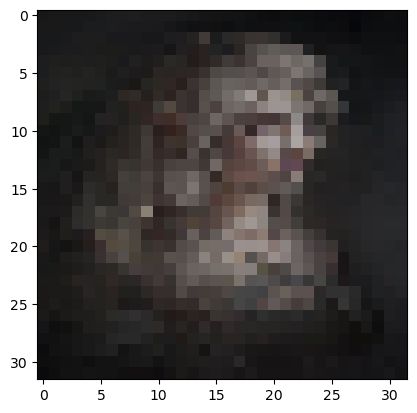

170
File saved successfully


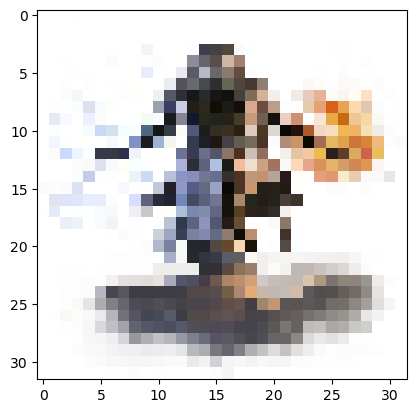

255
File saved successfully


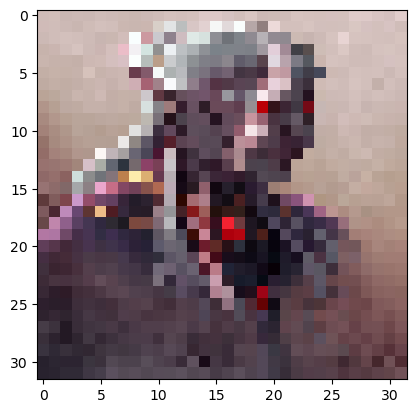

254
File saved successfully


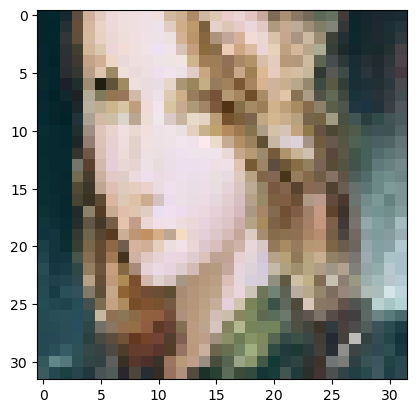

252
File saved successfully


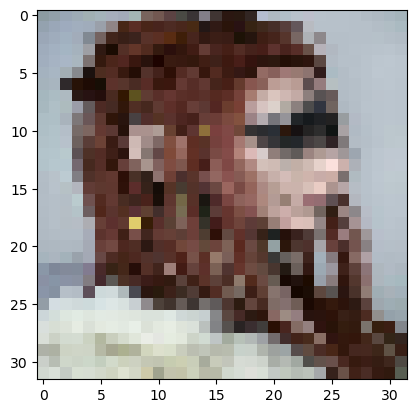

251
File saved successfully


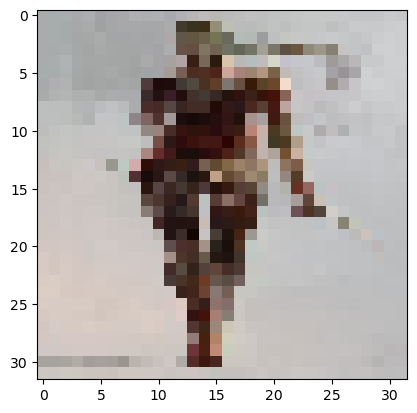

243
File saved successfully


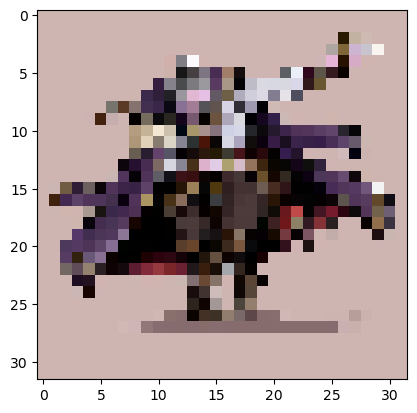

252
File saved successfully


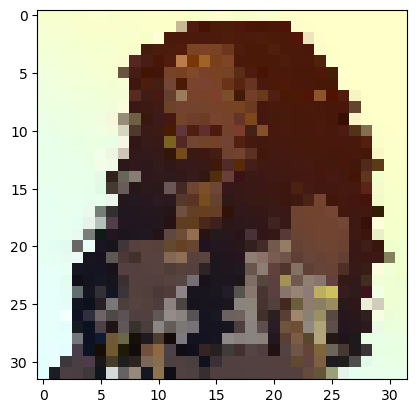

255
File saved successfully


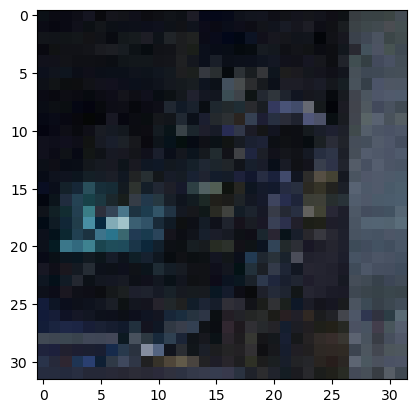

201
File saved successfully


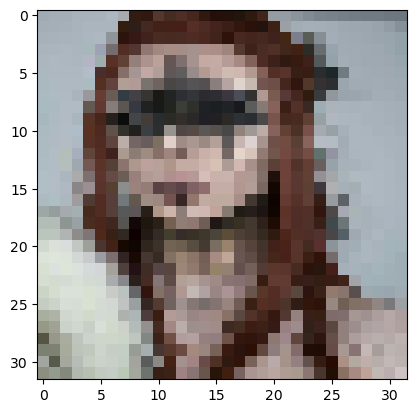

230
File saved successfully


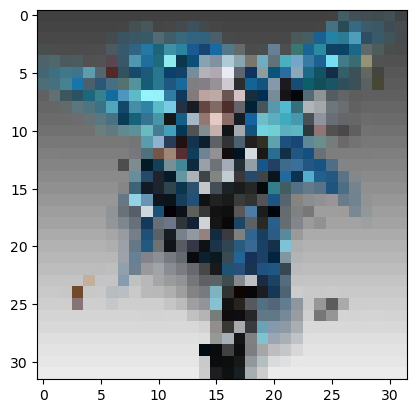

253
File saved successfully


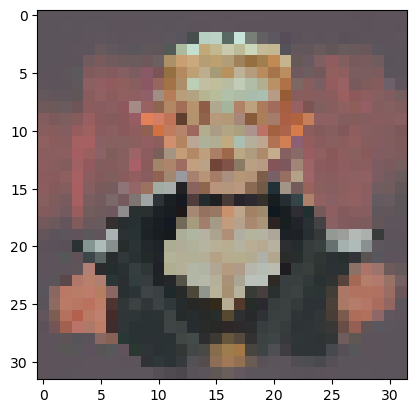

228
File saved successfully


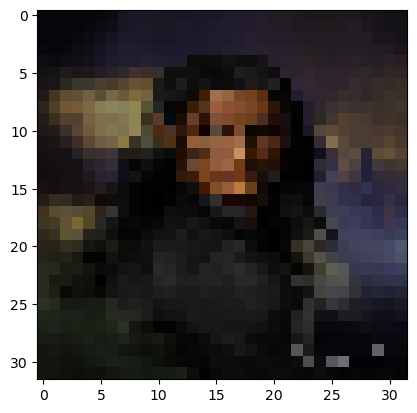

198
File saved successfully


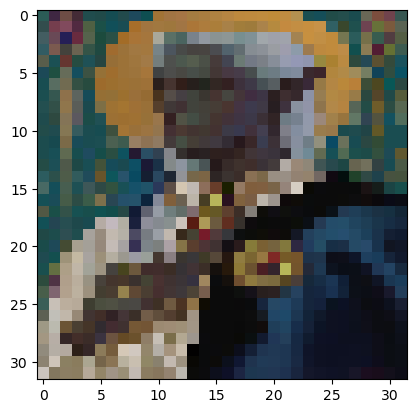

214
File saved successfully


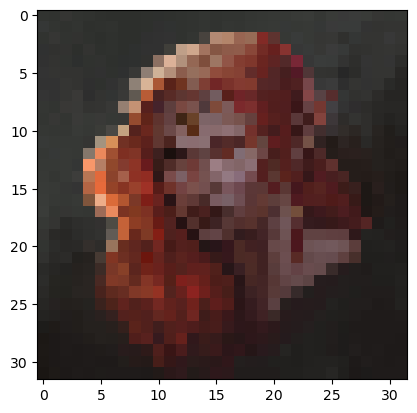

1.0
File saved successfully


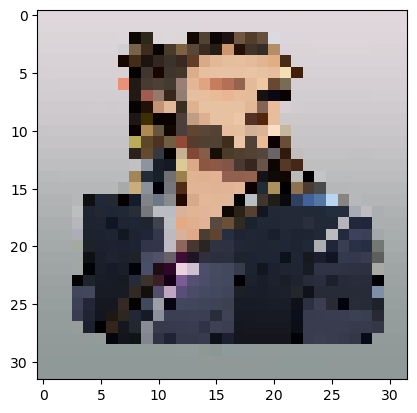

250
File saved successfully


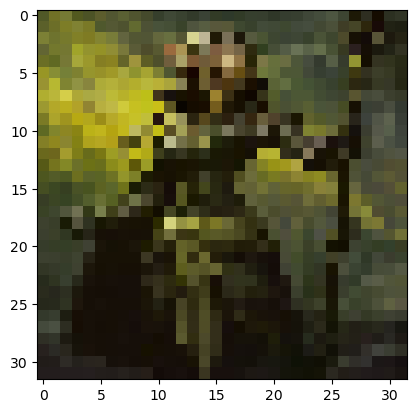

215
File saved successfully


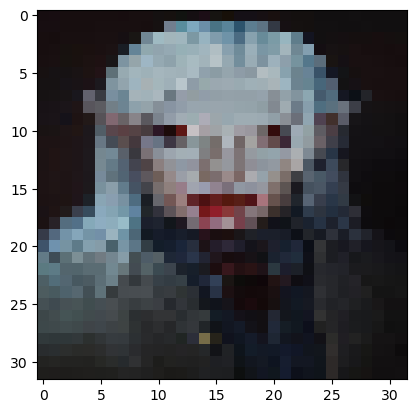

204
File saved successfully


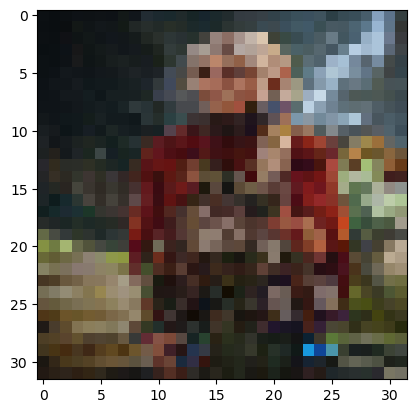

231
File saved successfully


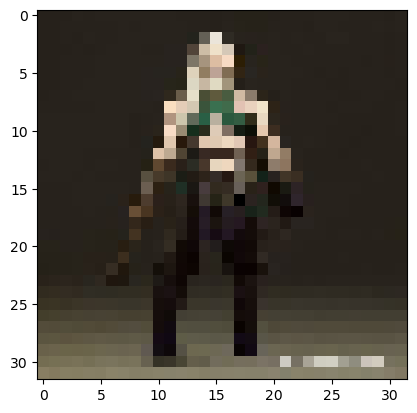

249
File saved successfully


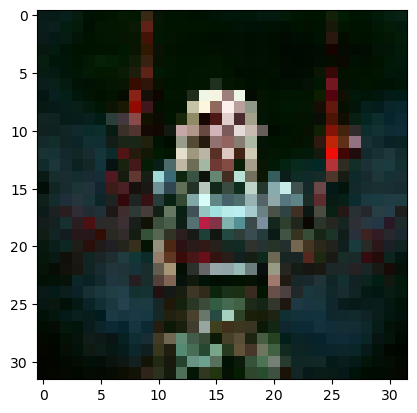

254
File saved successfully


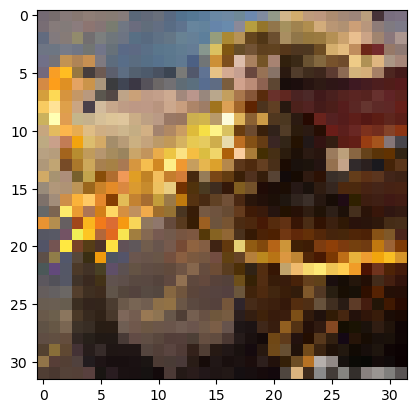

255
File saved successfully


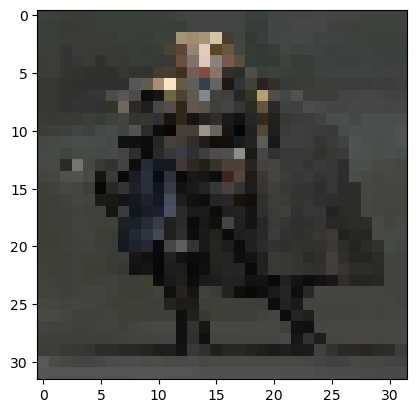

248
File saved successfully


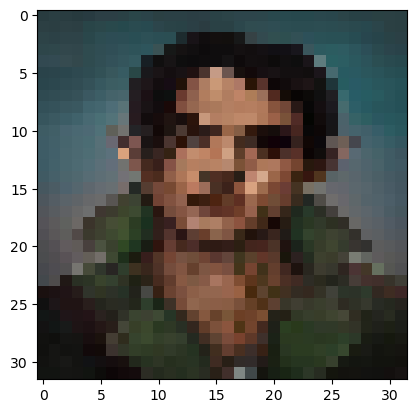

218
File saved successfully


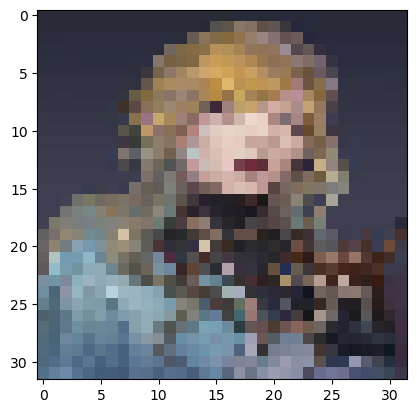

237
File saved successfully


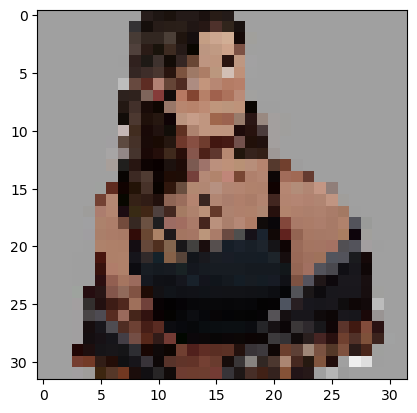

238
File saved successfully


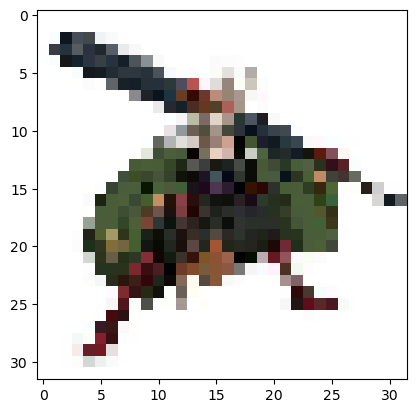

255
File saved successfully


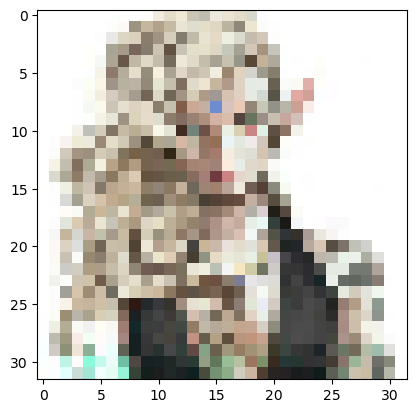

255
File saved successfully


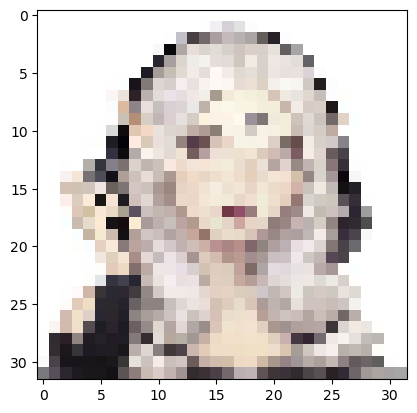

255
File saved successfully


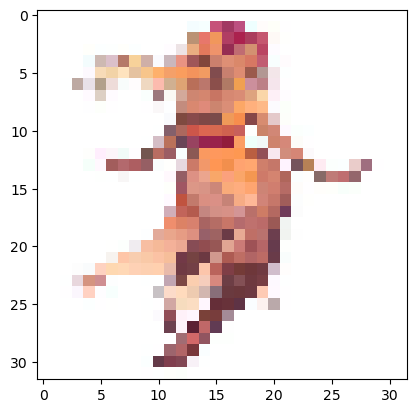

255
File saved successfully


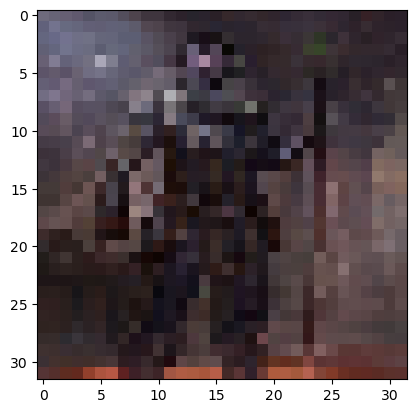

184
File saved successfully


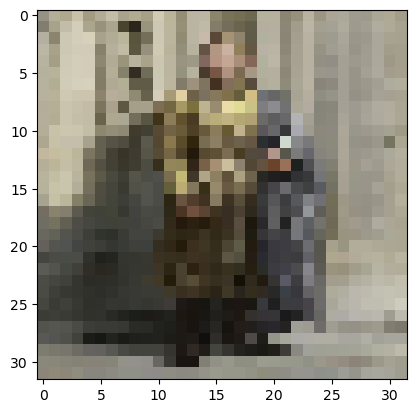

233
File saved successfully


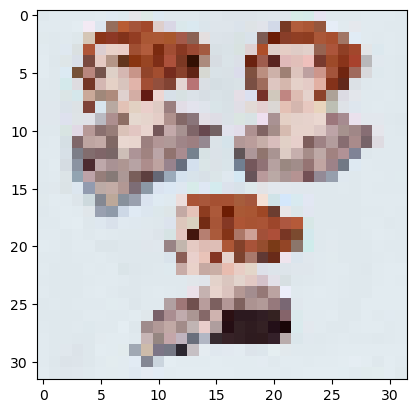

251
File saved successfully


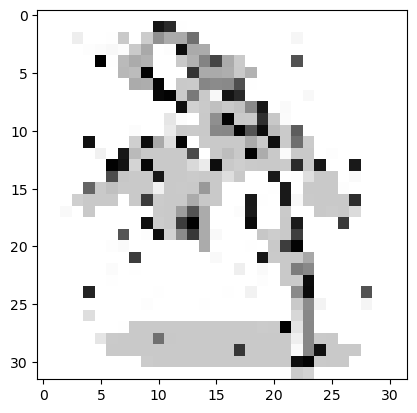

255
File saved successfully


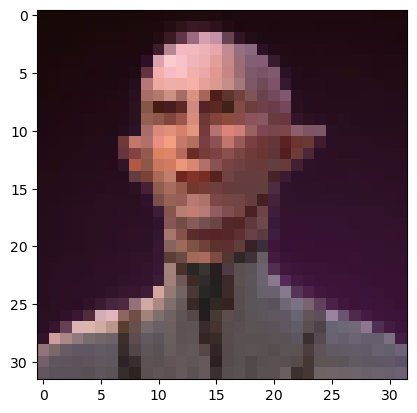

252
File saved successfully


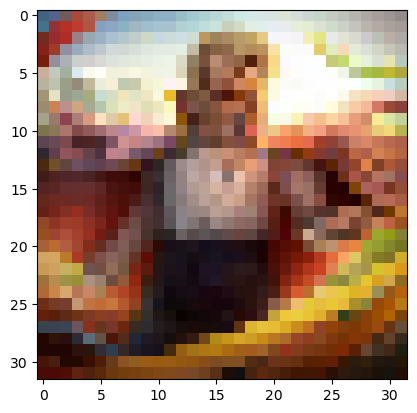

255
File saved successfully


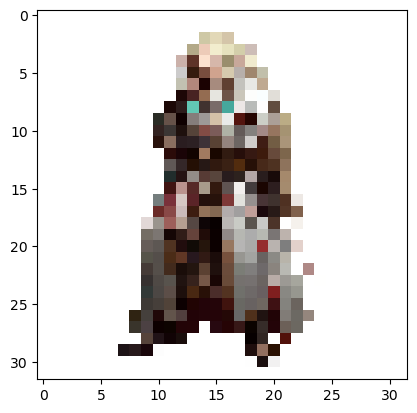

1.0
File saved successfully


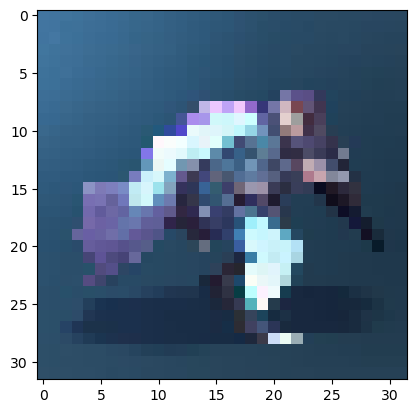

255
File saved successfully


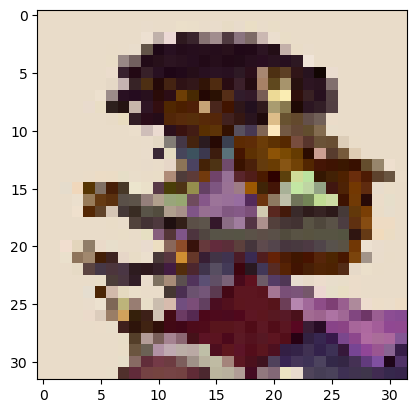

253
File saved successfully


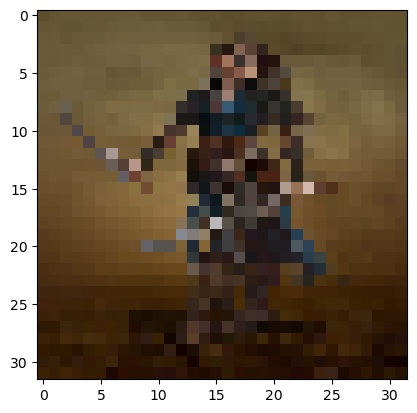

212
File saved successfully


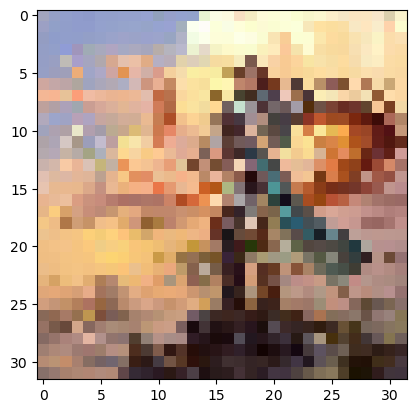

255
File saved successfully


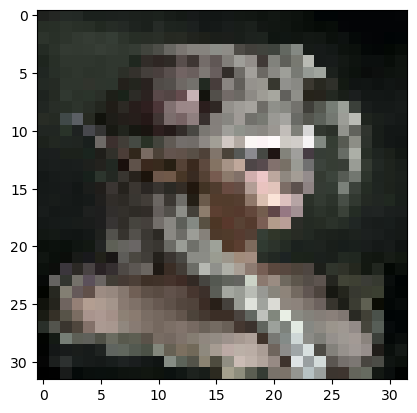

255
File saved successfully


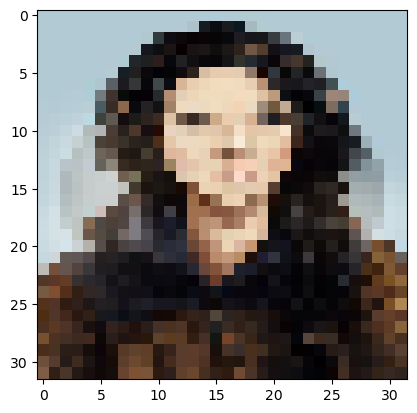

252
File saved successfully


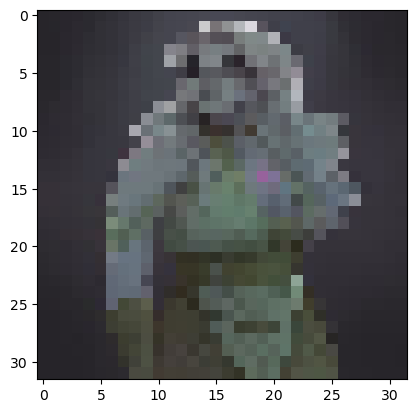

223
File saved successfully


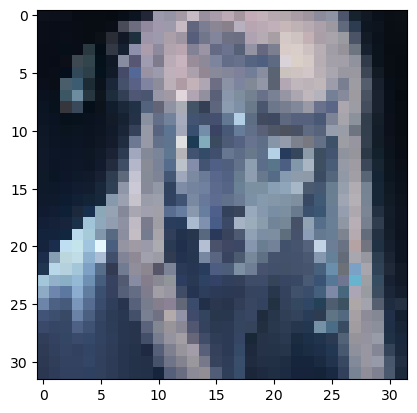

252
File saved successfully


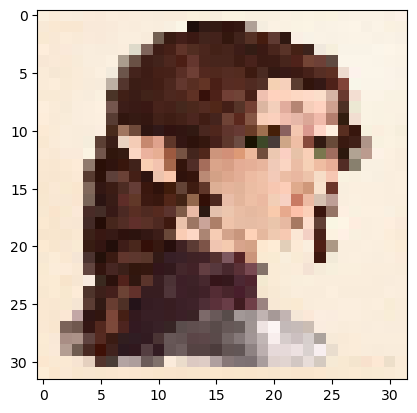

255
File saved successfully


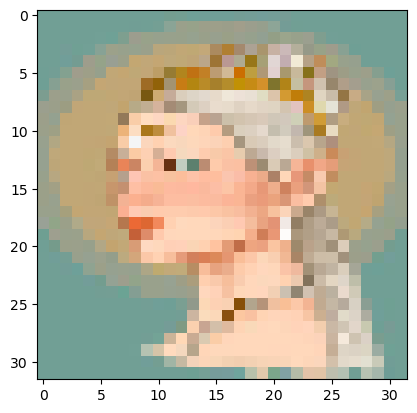

255
File saved successfully


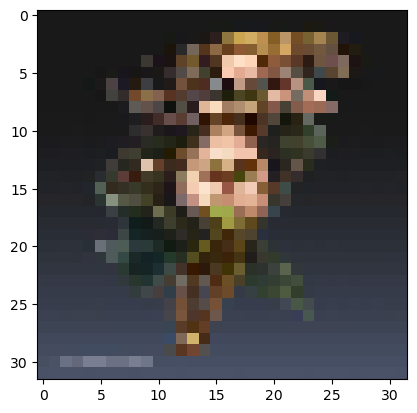

255
File saved successfully


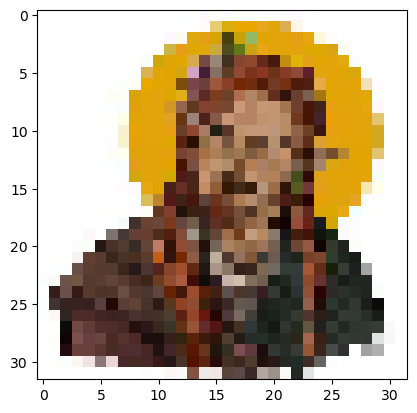

255
File saved successfully


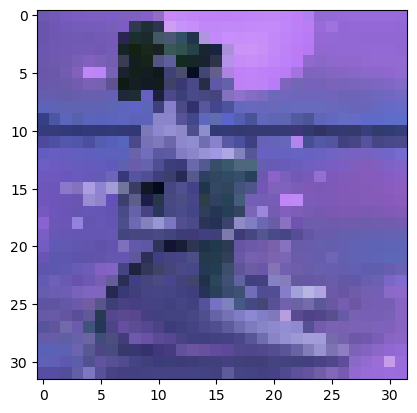

254
File saved successfully


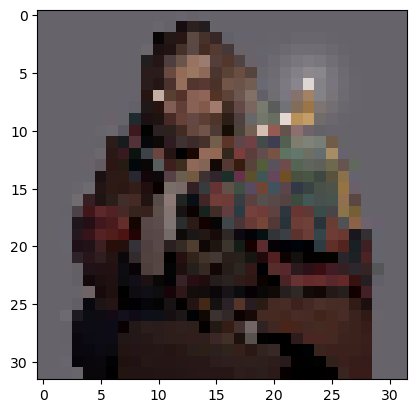

228
File saved successfully


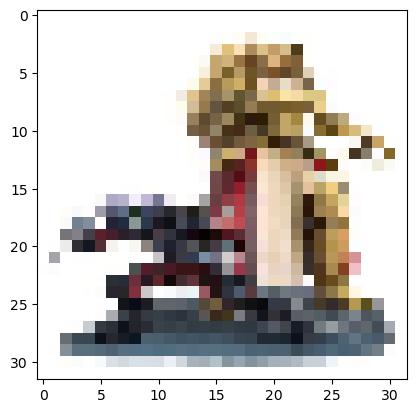

255
File saved successfully


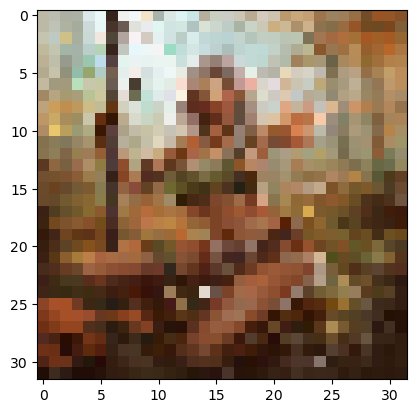

251
File saved successfully


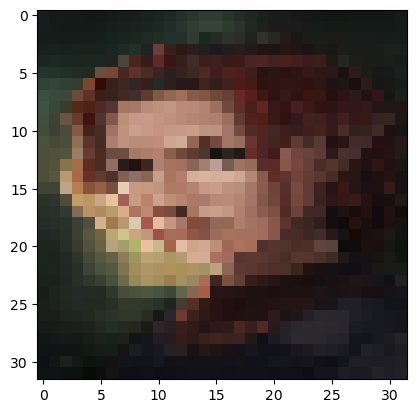

234
File saved successfully


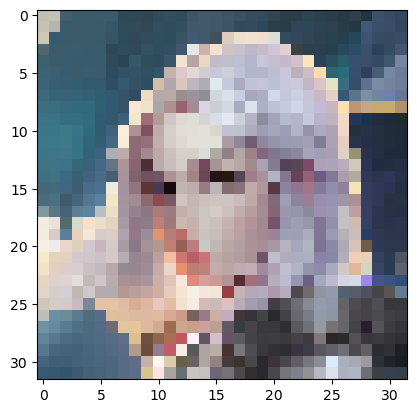

255
File saved successfully


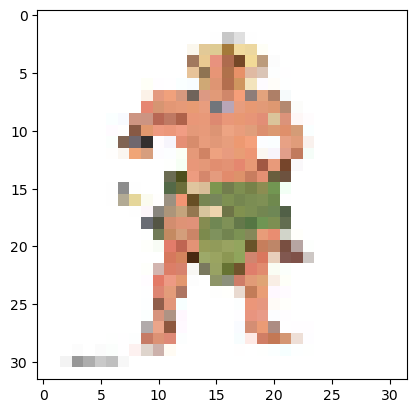

255
File saved successfully


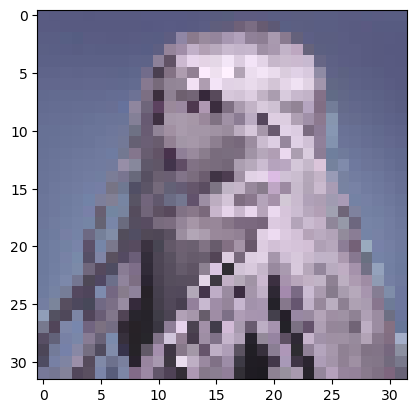

255
File saved successfully


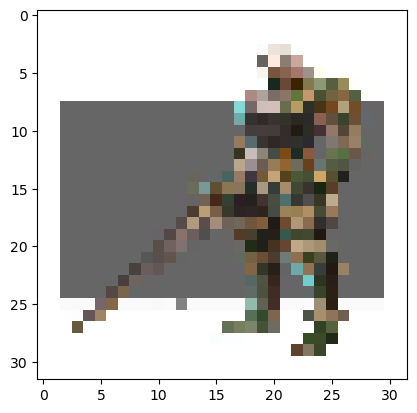

255
File saved successfully


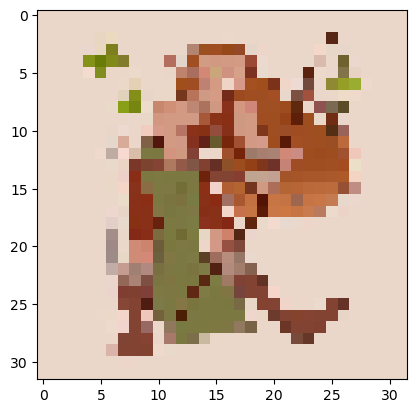

247
File saved successfully


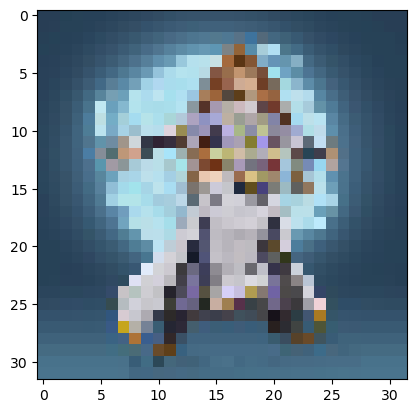

252
File saved successfully


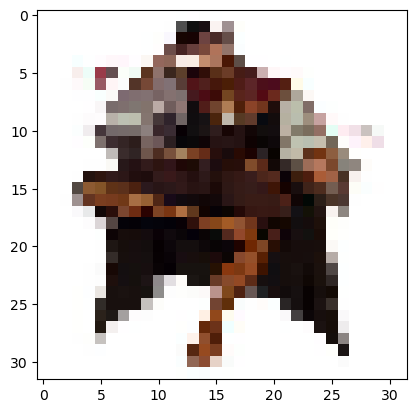

255
File saved successfully


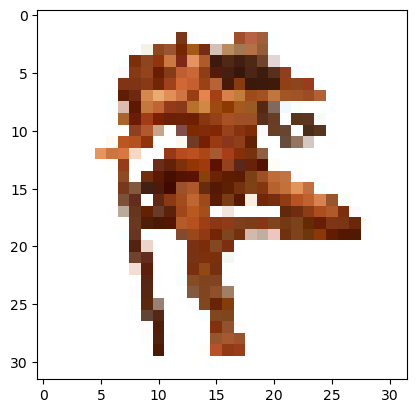

255
File saved successfully


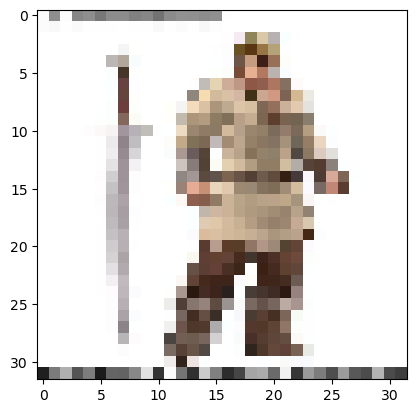

255
File saved successfully


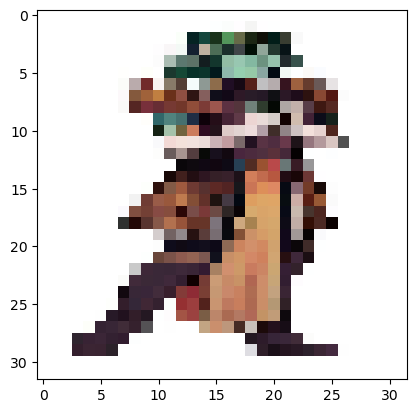

255
File saved successfully


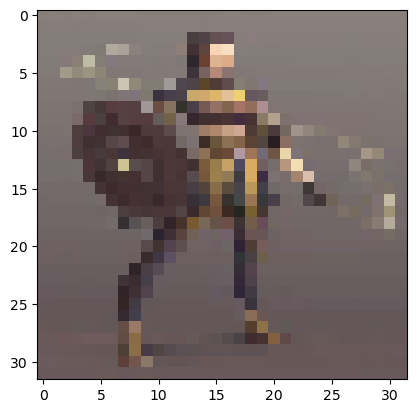

249
File saved successfully


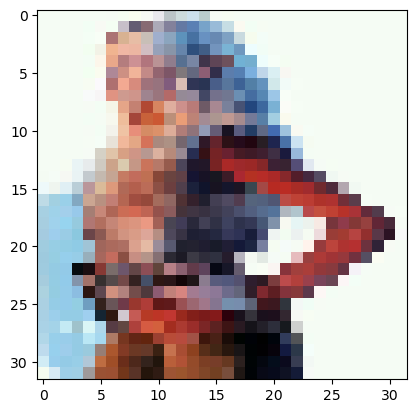

255
File saved successfully


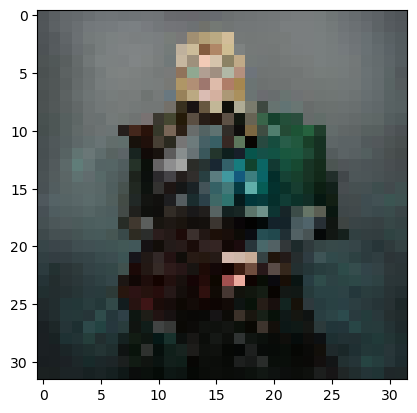

242
File saved successfully


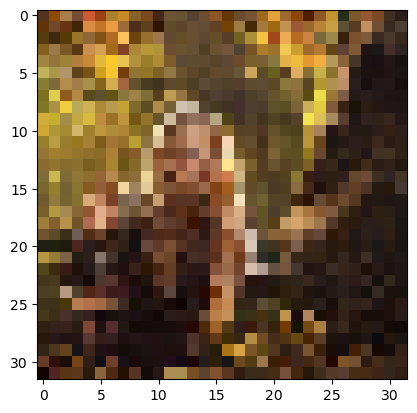

254
File saved successfully


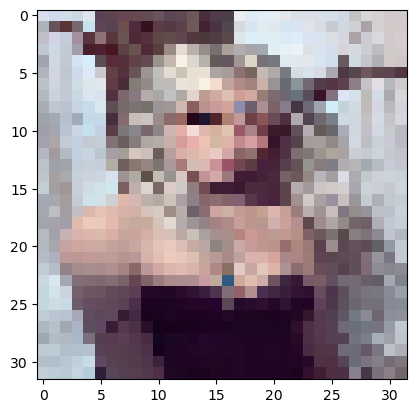

252
File saved successfully


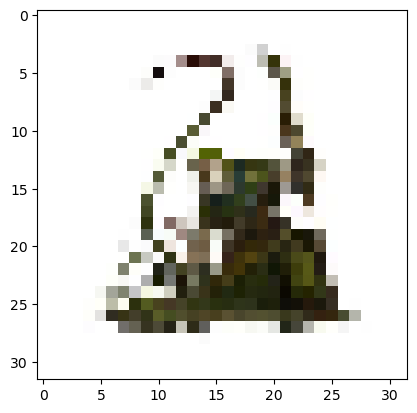

255
File saved successfully


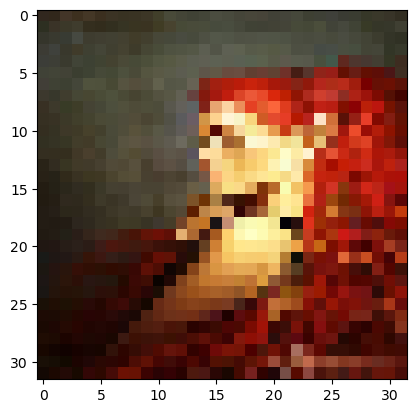

255
File saved successfully


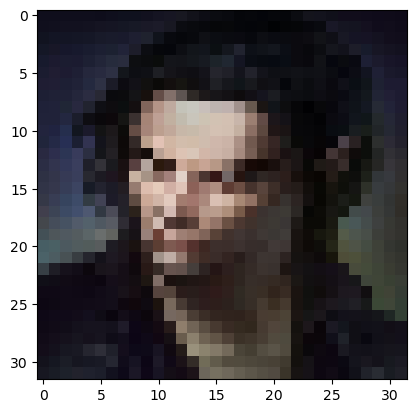

229
File saved successfully


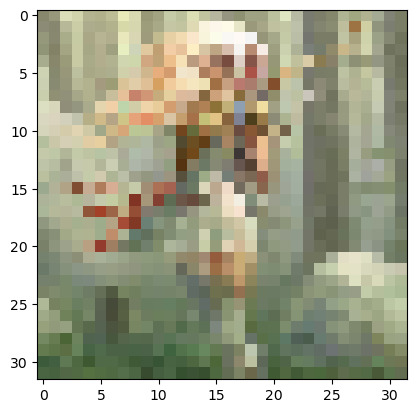

255
File saved successfully


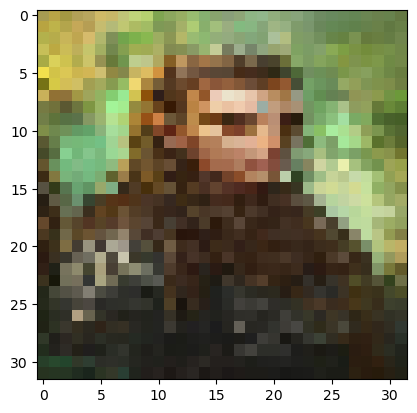

244
File saved successfully


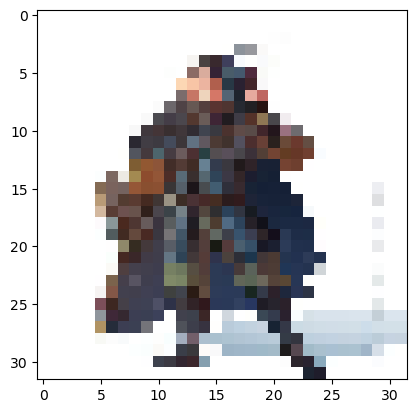

255
File saved successfully


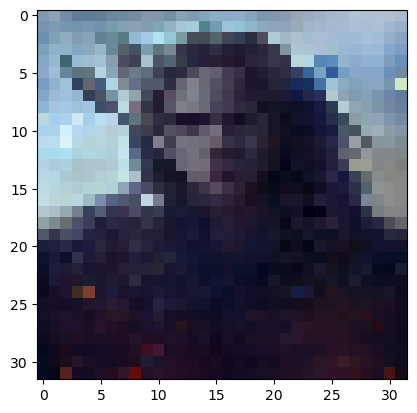

253
File saved successfully


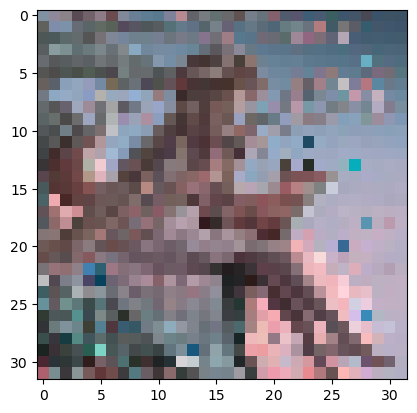

255
File saved successfully


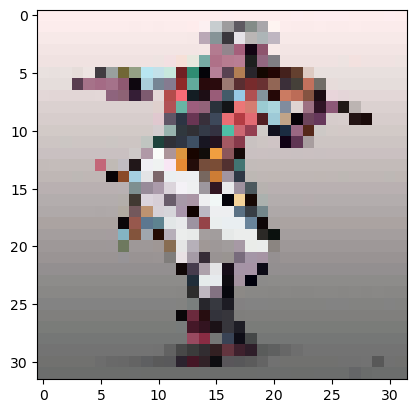

254
File saved successfully


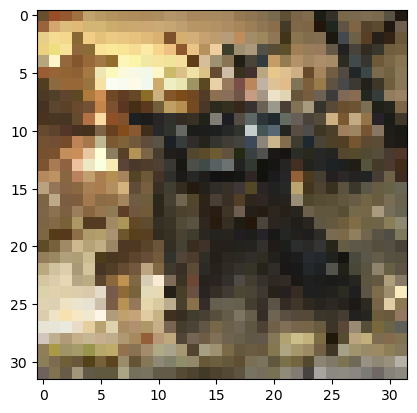

255
File saved successfully


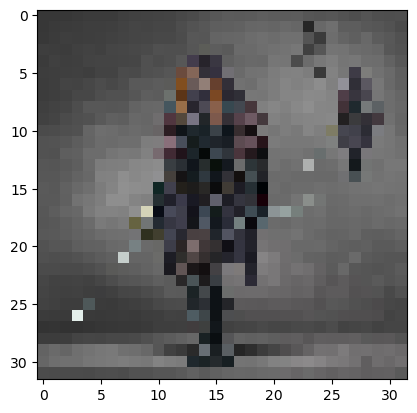

238
File saved successfully


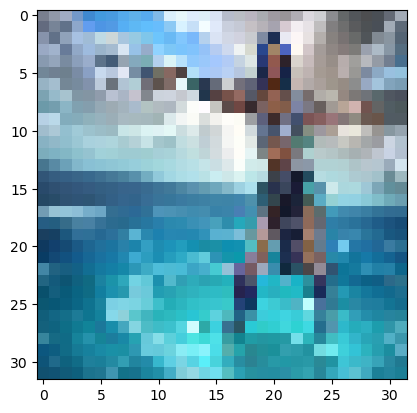

255
File saved successfully


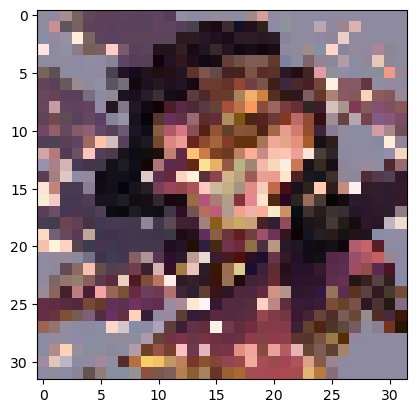

255
File saved successfully


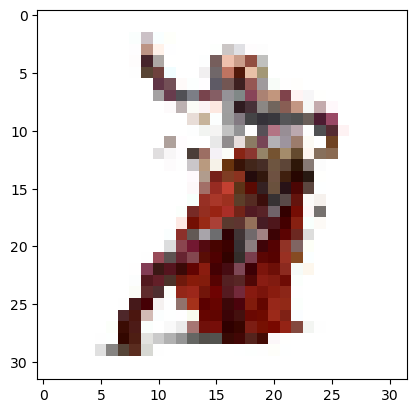

255
File saved successfully


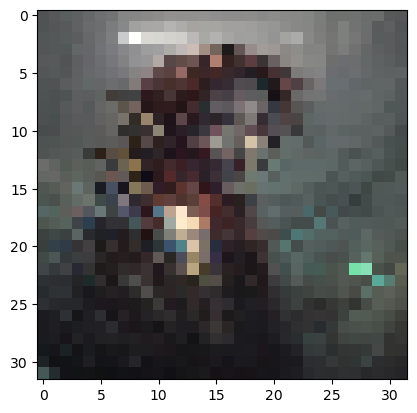

254
File saved successfully


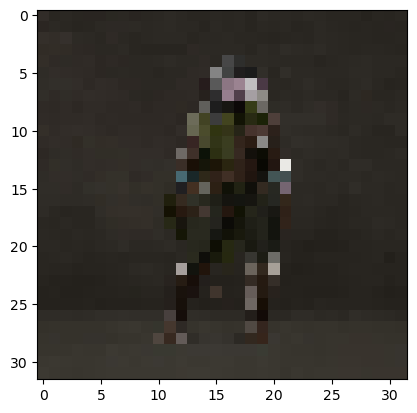

234
File saved successfully


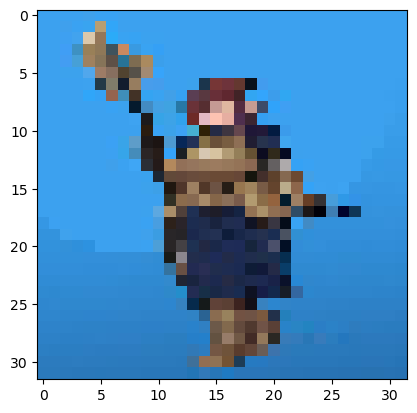

253
File saved successfully


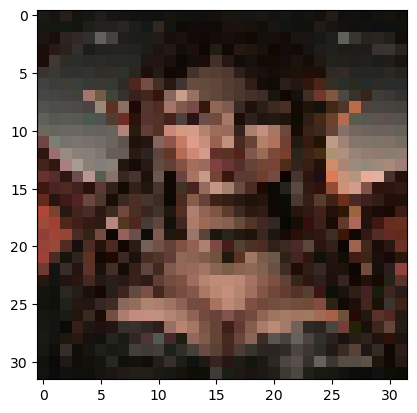

232
File saved successfully


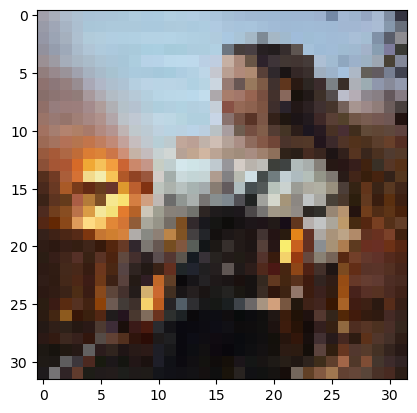

254
File saved successfully


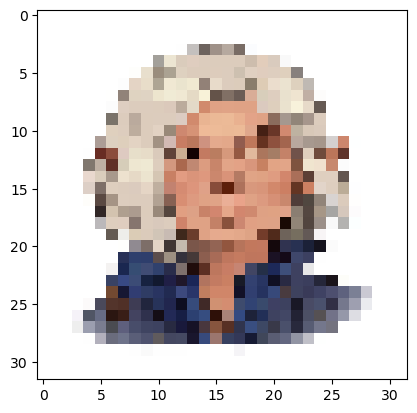

255
File saved successfully


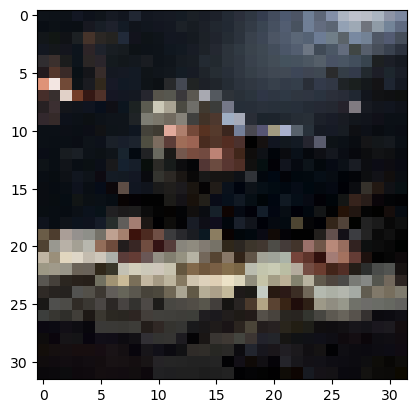

243
File saved successfully


In [3]:
output_directory = '/Volumes/BigBoi/DND_Images/Elf_Small/'

Xdim = 32
Ydim = 32

for i in range(1000):
    try:
        name = 'elf_{}.jpg'.format(i)
        image = mpimg.imread('/Volumes/BigBoi/DND_Images/Elf/{}'.format(name))
        image = Make_Consistent_Size(image, [Xdim, Ydim])
        plt.imshow(image)
        plt.show()
        max_val = np.max(image)
        print(max_val)
        if max_val < 200:
            image = cv.convertScaleAbs(image, alpha=(255.0))


        result= cv.imwrite(output_directory+'{}'.format(name), image)
        if result==True:
            print("File saved successfully")
        else:
            print("Error in saving file")
    except FileNotFoundError:
        continue
    

In [4]:
#gather our dataset
def Get_Training_Data(directory, n=1000):
    training_data = []
    for i in range(n):
        try:
            name = 'elf_{}.jpg'.format(i)
            image = mpimg.imread(directory+'{}'.format(name))
            if image.shape != (Ydim, Xdim, 3):
                continue
            else:
                training_data.append(image)
        except FileNotFoundError:
            continue
        


    return np.asarray(training_data)

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 16, 16, 64)        1792      
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 16, 16, 64)        0         
                                                                 
 dropout_2 (Dropout)         (None, 16, 16, 64)        0         
                                                                 
 flatten_2 (Flatten)         (None, 16384)             0         
                                                                 
 dense_2 (Dense)             (None, 1)                 16385     
                                                                 
Total params: 18,177
Trainable params: 18,177
Non-trainable params: 0
_________________________________________________________________


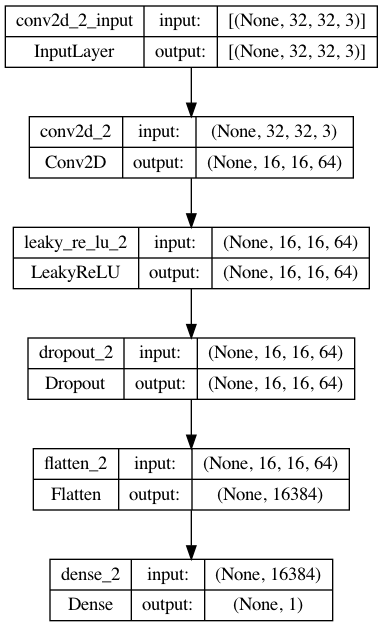

In [10]:
# define the standalone discriminator model
def define_discriminator(in_shape=(32,32,3)):
    model = Sequential()
    model.add(Conv2D(64, (3,3), strides=(2, 2), padding='same', input_shape=in_shape))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.4))
#     model.add(Conv2D(64, (3,3), strides=(2, 2), padding='same'))
#     model.add(LeakyReLU(alpha=0.2))
#    model.add(Dropout(0.4))
    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))
    # compile model
    opt = Adam(lr=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
    return model

# define model
model = define_discriminator(in_shape=(Xdim, Ydim, 3))
# summarize the model
model.summary()
# plot the model
plot_model(model, to_file='discriminator_plot.png', show_shapes=True, show_layer_names=True)

In [11]:
def generate_real_samples(dataset, n_samples):
    # choose random instances
    ix = np.random.randint(0, dataset.shape[0], n_samples)
    # retrieve selected images
    X = dataset[ix]
    # generate 'real' class labels (1)
    y = np.ones((n_samples, 1))
    return X, y

# generate n fake samples with class labels
def generate_fake_samples(n_samples):
    # generate uniform random numbers in [0,1]
    X = np.random.rand(Ydim * Xdim * 3 * n_samples)
    # reshape into a batch of grayscale images
    X = X.reshape((n_samples, Ydim, Xdim, 3))
    # generate 'fake' class labels (0)
    y = np.zeros((n_samples, 1))
    return X, y

In [14]:
# train the discriminator model
def train_discriminator(model, dataset, n_iter=200, n_batch=256):
	half_batch = int(n_batch / 2)
	# manually enumerate epochs
	for i in range(n_iter):
		# get randomly selected 'real' samples
		X_real, y_real = generate_real_samples(dataset, half_batch)
		# update discriminator on real samples
		_, real_acc = model.train_on_batch(X_real, y_real)
		# generate 'fake' examples
		X_fake, y_fake = generate_fake_samples(half_batch)
		# update discriminator on fake samples
		_, fake_acc = model.train_on_batch(X_fake, y_fake)
		# summarize performance
		print('>%d real=%.0f%% fake=%.0f%%' % (i+1, real_acc*100, fake_acc*100))

In [15]:
# define the discriminator model
model = define_discriminator()
# load image data
# fit the model
training_data = Get_Training_Data('/Volumes/BigBoi/DND_Images/Elf_Small/')
train_discriminator(model, training_data)


>1 real=16% fake=18%
>2 real=93% fake=1%
>3 real=100% fake=0%
>4 real=100% fake=2%
>5 real=99% fake=1%
>6 real=100% fake=2%
>7 real=98% fake=0%
>8 real=99% fake=1%
>9 real=99% fake=1%
>10 real=99% fake=0%
>11 real=99% fake=0%
>12 real=99% fake=0%
>13 real=100% fake=0%
>14 real=98% fake=0%
>15 real=98% fake=0%
>16 real=99% fake=0%
>17 real=100% fake=0%
>18 real=99% fake=0%
>19 real=100% fake=0%
>20 real=100% fake=0%
>21 real=99% fake=0%
>22 real=100% fake=1%
>23 real=100% fake=0%
>24 real=99% fake=0%
>25 real=98% fake=0%
>26 real=100% fake=0%
>27 real=99% fake=2%
>28 real=100% fake=0%
>29 real=100% fake=0%
>30 real=99% fake=0%
>31 real=99% fake=2%
>32 real=100% fake=0%
>33 real=100% fake=2%
>34 real=100% fake=0%
>35 real=99% fake=0%
>36 real=100% fake=0%
>37 real=99% fake=0%
>38 real=99% fake=1%
>39 real=98% fake=0%
>40 real=100% fake=1%
>41 real=99% fake=2%
>42 real=99% fake=1%
>43 real=100% fake=2%
>44 real=99% fake=1%
>45 real=98% fake=0%
>46 real=100% fake=0%
>47 real=100% fake=0%
>

1/1 [==============================] - 0s 169ms/step


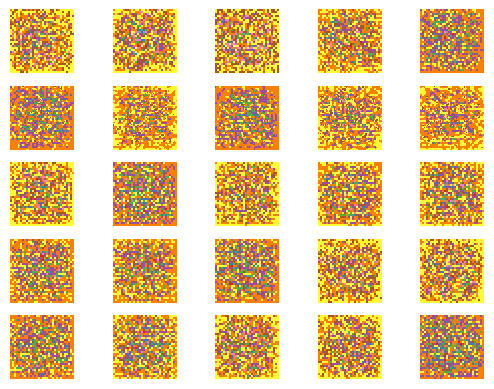

In [16]:
from numpy import zeros
from numpy.random import randn
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Reshape
from keras.layers import Conv2D
from keras.layers import Conv2DTranspose
from keras.layers import LeakyReLU
from matplotlib import pyplot
 
# define the standalone generator model
def define_generator(latent_dim):
	model = Sequential()
	# foundation for 240*360
	n_nodes = 64 * int(Xdim/16) * int(Ydim/16)
	model.add(Dense(n_nodes, input_dim=latent_dim))
	model.add(LeakyReLU(alpha=0.2))
	model.add(Reshape((int(Xdim/16), int(Ydim/16), 64)))
	# upsample to 180x120
	model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
	model.add(LeakyReLU(alpha=0.2))
	# upsample to 360x240
	model.add(Conv2DTranspose(256, (4,4), strides=(2,2), padding='same'))
	model.add(LeakyReLU(alpha=0.2))
    #upsample again
	model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
	model.add(LeakyReLU(alpha=0.2))
    #upsample again
	model.add(Conv2DTranspose(64, (4,4), strides=(2,2), padding='same'))
	model.add(LeakyReLU(alpha=0.2))
	model.add(Conv2D(3, (int(Xdim/16),int(Ydim/16)), activation='sigmoid', padding='same'))
	return model
 
# generate points in latent space as input for the generator
def generate_latent_points(latent_dim, n_samples):
	# generate points in the latent space
	x_input = randn(latent_dim * n_samples)
	# reshape into a batch of inputs for the network
	x_input = x_input.reshape(n_samples, latent_dim)
	return x_input
 
# use the generator to generate n fake examples, with class labels
def generate_fake_samples(g_model, latent_dim, n_samples):
	# generate points in latent space
	x_input = generate_latent_points(latent_dim, n_samples)
	# predict outputs
	X = g_model.predict(x_input)
	# create 'fake' class labels (0)
	y = zeros((n_samples, 1))
	return X, y
 
# size of the latent space
latent_dim = 100
# define the discriminator model
model = define_generator(latent_dim)
# generate samples
n_samples = 25
X, _ = generate_fake_samples(model, latent_dim, n_samples)
# plot the generated samples
for i in range(n_samples):
	# define subplot
	pyplot.subplot(5, 5, 1 + i)
	# turn off axis labels
	pyplot.axis('off')
	# plot single image
	pyplot.imshow(X[i, :, :, 0], cmap='Set1')
# show the figure
pyplot.show()


In [17]:
# define the combined generator and discriminator model, for updating the generator
def define_gan(g_model, d_model):
	# make weights in the discriminator not trainable
	d_model.trainable = False
	# connect them
	model = Sequential()
	# add generator
	model.add(g_model)
	# add the discriminator
	model.add(d_model)
	# compile model
	opt = Adam(lr=0.0002, beta_1=0.5)
	model.compile(loss='binary_crossentropy', optimizer=opt)
	return model

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_7 (Sequential)   (None, 32, 32, 3)         1337923   
                                                                 
 sequential_6 (Sequential)   (None, 1)                 18177     
                                                                 
Total params: 1,356,100
Trainable params: 1,337,923
Non-trainable params: 18,177
_________________________________________________________________


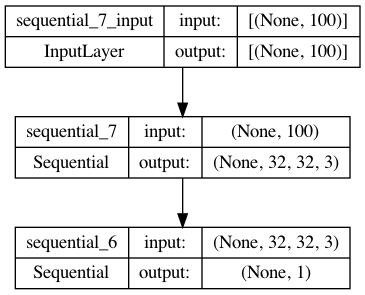

In [18]:
# size of the latent space
latent_dim = 100
# create the discriminator
d_model = define_discriminator()
# create the generator
g_model = define_generator(latent_dim)
# create the gan
gan_model = define_gan(g_model, d_model)
# summarize gan model
gan_model.summary()
# plot gan model
plot_model(gan_model, to_file='gan_plot.png', show_shapes=True, show_layer_names=True)

In [20]:
# create and save a plot of generated images (reversed grayscale)
def save_plot(examples, epoch, n=2):
	# plot images
	for i in range(n * n):
		# define subplot
		pyplot.subplot(n, n, 1 + i)
		# turn off axis
		pyplot.axis('off')
		# plot raw pixel data
		pyplot.imshow(examples[i, :, :, 0], cmap='Set1')
	# save plot to file
	filename = 'generated_plot_e%03d.png' % (epoch+1)
	pyplot.savefig(filename)
	pyplot.close()
 
# evaluate the discriminator, plot generated images, save generator model
def summarize_performance(epoch, g_model, d_model, dataset, latent_dim, n_samples=4):
	# prepare real samples
	X_real, y_real = generate_real_samples(dataset, n_samples)
	# evaluate discriminator on real examples
	_, acc_real = d_model.evaluate(X_real, y_real, verbose=0)
	# prepare fake examples
	x_fake, y_fake = generate_fake_samples(g_model, latent_dim, n_samples)
	# evaluate discriminator on fake examples
	_, acc_fake = d_model.evaluate(x_fake, y_fake, verbose=0)
	# summarize discriminator performance
	print('>Accuracy real: %.0f%%, fake: %.0f%%' % (acc_real*100, acc_fake*100))
	# save plot
	save_plot(x_fake, epoch)
	# save the generator model tile file
	filename = 'generator_model_%03d.h5' % (epoch + 1)
	g_model.save(filename)
 
# train the generator and discriminator
def train(g_model, d_model, gan_model, latent_dim, n_epochs=50, n_batch=32):
    dataset = Get_Training_Data('/Volumes/BigBoi/DND_Images/Elf_Small/')
    bat_per_epo = int(dataset.shape[0] / n_batch)
    half_batch = int(n_batch / 2)
    # manually enumerate epochs
    for i in range(n_epochs):
        # enumerate batches over the training set
        for j in range(bat_per_epo):
            dataset = Get_Training_Data('/Volumes/BigBoi/DND_Images/Elf_Small/')
            # get randomly selected 'real' samples
            X_real, y_real = generate_real_samples(dataset, half_batch)
            # generate 'fake' examples
            X_fake, y_fake = generate_fake_samples(g_model, latent_dim, half_batch)
            # create training set for the discriminator
            X, y = np.vstack((X_real, X_fake)), np.vstack((y_real, y_fake))
            # update discriminator model weights
            d_loss, _ = d_model.train_on_batch(X, y)
            # prepare points in latent space as input for the generator
            X_gan = generate_latent_points(latent_dim, n_batch)
            # create inverted labels for the fake samples
            y_gan = np.ones((n_batch, 1))
            # update the generator via the discriminator's error
            g_loss = gan_model.train_on_batch(X_gan, y_gan)
            # summarize loss on this batch
            print('>%d, %d/%d, d=%.3f, g=%.3f' % (i+1, j+1, bat_per_epo, d_loss, g_loss))

        # evaluate the model performance, sometimes
        if (i+1) % 10 == 0:
            summarize_performance(i, g_model, d_model, dataset, latent_dim)
 
# size of the latent space
latent_dim = 100
# create the discriminator
d_model = define_discriminator()
# create the generator
g_model = define_generator(latent_dim)
# create the gan
gan_model = define_gan(g_model, d_model)
# load image data
# train model
train(g_model, d_model, gan_model, latent_dim)

1/1 [==============================] - 0s 139ms/step
>1, 1/26, d=13.833, g=0.616
1/1 [==============================] - 0s 50ms/step
>1, 2/26, d=0.723, g=0.561
1/1 [==============================] - 0s 52ms/step
>1, 3/26, d=0.434, g=0.550
1/1 [==============================] - 0s 51ms/step
>1, 4/26, d=0.456, g=0.528
1/1 [==============================] - 0s 56ms/step
>1, 5/26, d=0.465, g=0.496
1/1 [==============================] - 0s 50ms/step
>1, 6/26, d=0.454, g=0.506
1/1 [==============================] - 0s 51ms/step
>1, 7/26, d=0.475, g=0.517
1/1 [==============================] - 0s 46ms/step
>1, 8/26, d=0.479, g=0.510
1/1 [==============================] - 0s 50ms/step
>1, 9/26, d=0.495, g=0.485
1/1 [==============================] - 0s 52ms/step
>1, 10/26, d=0.606, g=0.450
1/1 [==============================] - 0s 53ms/step
>1, 11/26, d=0.526, g=0.421
1/1 [==============================] - 0s 52ms/step
>1, 12/26, d=0.582, g=0.395
1/1 [==============================] - 0s 63ms/

1/1 [==============================] - 0s 52ms/step
>4, 26/26, d=1.268, g=0.186
1/1 [==============================] - 0s 46ms/step
>5, 1/26, d=0.906, g=0.184
1/1 [==============================] - 0s 46ms/step
>5, 2/26, d=0.946, g=0.169
1/1 [==============================] - 0s 50ms/step
>5, 3/26, d=0.915, g=0.181
1/1 [==============================] - 0s 47ms/step
>5, 4/26, d=0.952, g=0.182
1/1 [==============================] - 0s 54ms/step
>5, 5/26, d=0.896, g=0.189
1/1 [==============================] - 0s 53ms/step
>5, 6/26, d=0.909, g=0.190
1/1 [==============================] - 0s 53ms/step
>5, 7/26, d=0.881, g=0.196
1/1 [==============================] - 0s 50ms/step
>5, 8/26, d=0.841, g=0.205
1/1 [==============================] - 0s 52ms/step
>5, 9/26, d=0.816, g=0.222
1/1 [==============================] - 0s 47ms/step
>5, 10/26, d=0.793, g=0.228
1/1 [==============================] - 0s 46ms/step
>5, 11/26, d=0.819, g=0.241
1/1 [==============================] - 0s 53ms/st

1/1 [==============================] - 0s 53ms/step
>8, 25/26, d=0.641, g=0.356
1/1 [==============================] - 0s 46ms/step
>8, 26/26, d=0.614, g=0.351
1/1 [==============================] - 0s 49ms/step
>9, 1/26, d=0.619, g=0.371
1/1 [==============================] - 0s 44ms/step
>9, 2/26, d=0.612, g=0.379
1/1 [==============================] - 0s 48ms/step
>9, 3/26, d=0.588, g=0.397
1/1 [==============================] - 0s 49ms/step
>9, 4/26, d=0.567, g=0.426
1/1 [==============================] - 0s 46ms/step
>9, 5/26, d=0.581, g=0.427
1/1 [==============================] - 0s 50ms/step
>9, 6/26, d=0.950, g=0.413
1/1 [==============================] - 0s 44ms/step
>9, 7/26, d=0.580, g=0.393
1/1 [==============================] - 0s 44ms/step
>9, 8/26, d=0.586, g=0.383
1/1 [==============================] - 0s 48ms/step
>9, 9/26, d=0.562, g=0.390
1/1 [==============================] - 0s 49ms/step
>9, 10/26, d=0.573, g=0.439
1/1 [==============================] - 0s 46ms/st

1/1 [==============================] - 0s 47ms/step
>12, 20/26, d=0.390, g=0.688
1/1 [==============================] - 0s 46ms/step
>12, 21/26, d=0.369, g=0.696
1/1 [==============================] - 0s 50ms/step
>12, 22/26, d=0.368, g=0.690
1/1 [==============================] - 0s 47ms/step
>12, 23/26, d=0.371, g=0.683
1/1 [==============================] - 0s 45ms/step
>12, 24/26, d=0.366, g=0.677
1/1 [==============================] - 0s 53ms/step
>12, 25/26, d=0.352, g=0.693
1/1 [==============================] - 0s 60ms/step
>12, 26/26, d=0.347, g=0.763
1/1 [==============================] - 0s 55ms/step
>13, 1/26, d=0.334, g=0.758
1/1 [==============================] - 0s 50ms/step
>13, 2/26, d=0.321, g=0.774
1/1 [==============================] - 0s 49ms/step
>13, 3/26, d=0.322, g=0.818
1/1 [==============================] - 0s 54ms/step
>13, 4/26, d=0.643, g=0.726
1/1 [==============================] - 0s 49ms/step
>13, 5/26, d=0.334, g=0.714
1/1 [============================

>16, 17/26, d=0.107, g=1.590
1/1 [==============================] - 0s 47ms/step
>16, 18/26, d=0.109, g=1.600
1/1 [==============================] - 0s 47ms/step
>16, 19/26, d=0.118, g=1.578
1/1 [==============================] - 0s 46ms/step
>16, 20/26, d=0.117, g=1.668
1/1 [==============================] - 0s 48ms/step
>16, 21/26, d=0.113, g=1.700
1/1 [==============================] - 0s 45ms/step
>16, 22/26, d=0.119, g=1.630
1/1 [==============================] - 0s 54ms/step
>16, 23/26, d=0.115, g=1.587
1/1 [==============================] - 0s 52ms/step
>16, 24/26, d=0.120, g=1.616
1/1 [==============================] - 0s 45ms/step
>16, 25/26, d=0.465, g=1.432
1/1 [==============================] - 0s 50ms/step
>16, 26/26, d=0.141, g=1.407
1/1 [==============================] - 0s 46ms/step
>17, 1/26, d=0.133, g=1.405
1/1 [==============================] - 0s 47ms/step
>17, 2/26, d=0.207, g=1.140
1/1 [==============================] - 0s 48ms/step
>17, 3/26, d=0.185, g=1.086
1/

1/1 [==============================] - 0s 46ms/step
>20, 15/26, d=0.055, g=2.306
1/1 [==============================] - 0s 47ms/step
>20, 16/26, d=0.052, g=2.335
1/1 [==============================] - 0s 53ms/step
>20, 17/26, d=0.053, g=2.408
1/1 [==============================] - 0s 54ms/step
>20, 18/26, d=0.049, g=2.358
1/1 [==============================] - 0s 47ms/step
>20, 19/26, d=0.049, g=2.379
1/1 [==============================] - 0s 53ms/step
>20, 20/26, d=0.047, g=2.399
1/1 [==============================] - 0s 50ms/step
>20, 21/26, d=0.048, g=2.440
1/1 [==============================] - 0s 50ms/step
>20, 22/26, d=0.043, g=2.485
1/1 [==============================] - 0s 47ms/step
>20, 23/26, d=0.043, g=2.527
1/1 [==============================] - 0s 47ms/step
>20, 24/26, d=0.040, g=2.498
1/1 [==============================] - 0s 47ms/step
>20, 25/26, d=0.042, g=2.572
1/1 [==============================] - 0s 48ms/step
>20, 26/26, d=0.042, g=2.639
1/1 [=======================

KeyboardInterrupt: 